In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import WordPunctTokenizer
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import PorterStemmer
from bs4 import BeautifulSoup
import re

In [2]:
import seaborn as sns
import string as str
import warnings
from textblob import TextBlob 

In [3]:
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [4]:
import logging
import os
import random
import tempfile
import xml.etree.ElementTree as et
import zipfile
from itertools import chain

from smart_open import open

from gensim import utils, matutils
from gensim.models import basemodel
from gensim.models.ldamodel import LdaModel
from gensim.utils import check_output, revdict

logger = logging.getLogger(__name__)

In [5]:
import spacy
#import str() as str

In [6]:
import pyLDAvis
import pyLDAvis.gensim_models  # don't skip this
import matplotlib.pyplot as plt

In [7]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [8]:
# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [9]:
from wordcloud import WordCloud

In [10]:
from nltk.corpus import opinion_lexicon

In [11]:
import collections
wordcount = {}
word_counter = collections.Counter(wordcount)

In [12]:
from collections import Counter

In [13]:
nltk.download('opinion_lexicon')

[nltk_data] Downloading package opinion_lexicon to
[nltk_data]     /Users/razon/nltk_data...
[nltk_data]   Package opinion_lexicon is already up-to-date!


True

In [ ]:
labelFilePath = ""
pd = pd.read_excel(labelFilePath, header = None, names = cols)

In [16]:
labelDF= pd.DataFrame()

In [123]:
labelDF = labelDF.append(labeledData)

In [124]:
labelDF.head()

,Tweet,Created At,labeling,cleanedData,weight,VaderSentCleaned,VaderSent
0,"Folks I still suck... no stream tonight, may h...",2019-12-11T23:32:27+00:00,1.0,folk still suck stream tonight may plan sunday...,0,1,1
1,stress from work.. stress at home.. stress bef...,2019-12-11T23:29:48+00:00,1.0,home bed wake,0,2,1
2,"weirdly i'm having the opposite ""problem"" I se...",2019-12-11T23:28:12+00:00,0.0,weirdly opposite problem seem handling better ...,0,0,1
3,I realise I'm tweeting about it loads today bu...,2019-12-11T23:17:01+00:00,1.0,realise tweeting load today top genuinely anxi...,0,1,1
4,My chemo sitch is a little different than this...,2019-12-11T23:00:43+00:00,1.0,chemo sitch little different big chunk inpatie...,1,2,1


In [106]:
labelDF= pd.DataFrame()

labelDF = labelDF.append(labeledData)

labelDF.head()def assembleWords(dataList):
    wordList = []
    for sent in dataList:
        for word in sent.__str__().split():
            wordList.append(word)
    return wordList

In [107]:
posWrdList = assembleWords(posTweet)
negWrdList = assembleWords(negTweet)
#neuWrdList = assembleWords(posTweet)

In [108]:
posWrdList[1]

'opposite'

In [109]:
pos_Counter = Counter(posWrdList)
neg_Counter = Counter(negWrdList)
#neu_Counter = Counter(neutralTweet)

In [110]:
pos_most_occur = pos_Counter.most_common(100)
print(pos_most_occur[99])

('thought', 23)


In [111]:
neg_most_occur = neg_Counter.most_common(150)
print(neg_most_occur[149])

('made', 10)


In [20]:
filePath1 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDS/UnsupervisedData/Cleanedtweet12.xlsx'
filePath2 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDs/UnsupervisedData/Cleanedtweet21.xlsx'
filePath3 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDs/UnsupervisedData/Cleanedtweet31.xlsx'
filePath4 = '/Volumes/Works/Development/Python/Shout/newTweets/CleanedDs/UnsupervisedData/Cleanedtweet41.xlsx'
text = 'Text'
loc = 'Location'
date = 'date'
cData = 'cleanedData'
canNotConvert = 'cannot convert'
convert = 'convert'

In [21]:
cols = ['date', 'Text', 'Location', 'cleanedData']

In [22]:
df = pd.DataFrame()

In [23]:
data1 = pd.read_excel(filePath1, header = None, names = cols)
data2 = pd.read_excel(filePath2, header = None, names = cols)
data3 = pd.read_excel(filePath3, header = None, names = cols)
data4 = pd.read_excel(filePath4, header = None, names = cols)

In [24]:
df = df.append(data1).append(data2).append(data3).append(data4)

In [25]:
len(df.values)

1471211

In [26]:
# Convert to list
data = df['cleanedData'].values.tolist()
data = data[2:]
#newData = []
# Remove Emails
data =  [re.sub('\S*@\S*\s?', '', sent.__str__()) for sent in data]

# for sent in data[:1]:
#     print(sent)
#     newSent = re.sub('\S*@\S*\s?', '', sent)
#     newData.append(newSent)

# Remove new line characters
data = [re.sub('\s+', ' ', sent.__str__()) for sent in data]

# Remove distracting single quotes
data = [re.sub("\'", "", sent.__str__()) for sent in data]

data[:1]

['would give headache much productivity taste']

In [27]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/razon/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [28]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [29]:
sid = SentimentIntensityAnalyzer()

In [30]:
vaderValue = []
covidInPos = 0
covidInNeg = 0
covidInNeu = 0
for tweet in data:
    tInSent = tweet.__str__()
    sent = sid.polarity_scores(tInSent)
    vaderValue.append(sent)
    a = tInSent.lower().split()
    if 'covid' in a:
        if sent['compound'] < -0.05:
            covidInNeg += 1
        elif sent['compound'] > 0.05:
            covidInPos += 1
        else:
            covidInNeu += 1

In [486]:
a = 'My  Name is Razon'.lower().split()
print('m' in a)

False


In [31]:
vaderValue

[{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0},
 {'neg': 0.128, 'neu': 0.872, 'pos': 0.0, 'compound': -0.4215},
 {'neg': 0.143, 'neu': 0.558, 'pos': 0.299, 'compound': 0.5994},
 {'neg': 0.067, 'neu': 0.558, 'pos': 0.375, 'compound': 0.8503},
 {'neg': 0.15, 'neu': 0.751, 'pos': 0.099, 'compound': -0.128},
 {'neg': 0.0, 'neu': 0.687, 'pos': 0.313, 'compound': 0.7351},
 {'neg': 0.271, 'neu': 0.667, 'pos': 0.062, 'compound': -0.6597},
 {'neg': 0.144, 'neu': 0.594, 'pos': 0.263, 'compound': 0.5859},
 {'neg': 0.273, 'neu': 0.727, 'pos': 0.0, 'compound': -0.7579},
 {'neg': 0.0, 'neu': 0.686, 'pos': 0.314, 'compound': 0.6705},
 {'neg': 0.296, 'neu': 0.607, 'pos': 0.097, 'compound': -0.5994},
 {'neg': 0.077, 'neu': 0.877, 'pos': 0.046, 'compound': -0.2263},
 {'neg': 0.448, 'neu': 0.552, 'pos': 0.0, 'compound': -0.8074},
 {'neg': 0.254, 'neu': 0.508, 'pos': 0.238, 'compound': -0.34},
 {'neg': 0.123, 'neu': 0.698, 'pos': 0.179, 'compound': 0.1779},
 {'neg': 0.26, 'neu': 0.74, 'pos': 0.0, 

In [32]:
valueMap = {}

for val in vaderValue:
    compVal = valueMap.get(round(val['compound'],3), -1)
    if compVal == -1:
        valueMap[round(val['compound'],3)] = 1
    else:
        valueMap[round(val['compound'],3)] = compVal + 1

In [33]:
len(valueMap.values())

1991

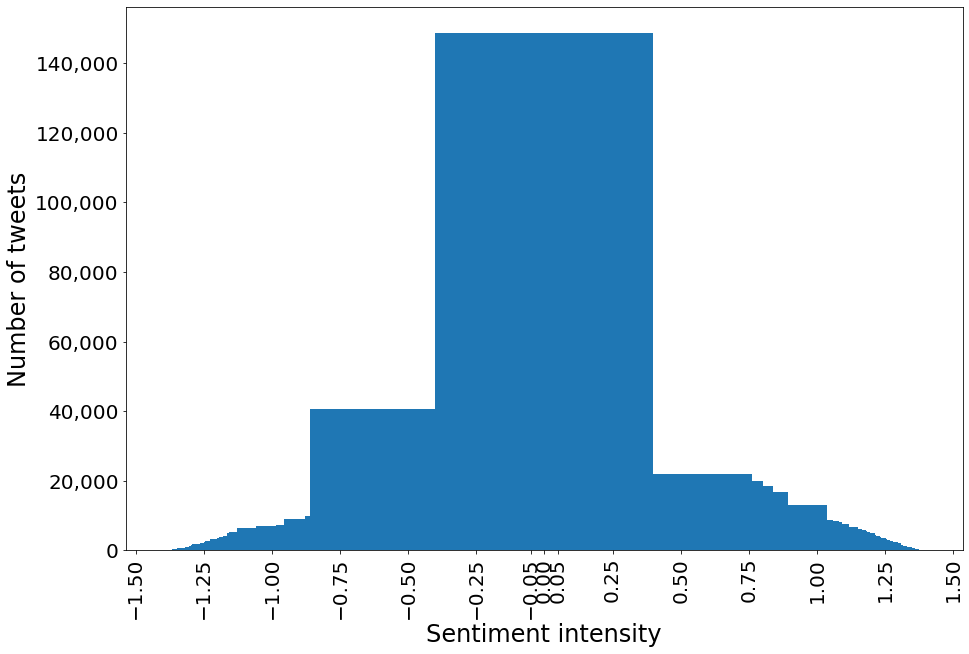

In [41]:
# plt.bar(range(len(valueMap)), list(valueMap.values()), align='center')
# plt.xticks(range(len(valueMap)), [-1.0, -0.75, -0.50, -0.25, 0, 0.25, 0.50, 0.75, 1.0])
# # for python 2.x:
# plt.bar(range(len(D)), D.values(), align='center')  # python 2.x
# plt.xticks(range(len(D)), D.keys())  # in python 2.x
import matplotlib as mpl

keys = valueMap.keys()
values = valueMap.values()

fig = plt.figure(figsize =(15, 10))

plt.bar(keys, values)

plt.xticks(rotation='vertical')
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xticks([-1.5, -1.25, -1.0, -0.75, -0.50, -0.25, -0.05, 0, 0.05, 0.25, 0.50, 0.75, 1.0, 1.25, 1.5])

#ax = df.plot()
ax.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))

ax.set_ylabel('Number of tweets', size=24)
ax.set_xlabel('Sentiment intensity', size=24)

plt.savefig("OpinionPolarityMAIN.png",dpi=1080,bbox_inches='tight')
plt.show()

In [42]:
vaderPosCount = 0
vaderNegCount = 0
vaderNeuCount = 0

for key, value in valueMap.items():
    if key < -0.05:
        vaderNegCount += value
    elif key > 0.05:
        vaderPosCount += value
    else:
        vaderNeuCount += value

In [43]:
print(vaderPosCount, vaderNegCount, vaderNeuCount)

716843 576462 177904


In [44]:
print(covidInPos, covidInNeg, covidInNeu)

9854 9426 1891


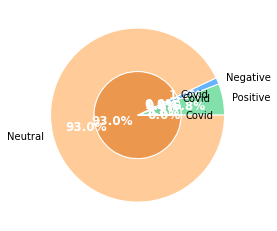

In [33]:
fig, ax = plt.subplots()
cars = ['Positive', 'Negative', 'Neutral']

size = 0.5
vals = np.array([
    [vaderPosCount - covidInPos, covidInPos], 
    [vaderNegCount - covidInNeg, covidInNeg], 
    [vaderNeuCount - covidInNeu, covidInNeu]
])

#cmap = plt.colormaps["tab20d"]
outer_colors = ['#82E0AA', '#66b3ff','#ffcc99']
inner_colors = ['#7DCEA0', '#C0392B', '#5DADE2', '#C0392B', '#EB984E', '#C0392B']



_, _, autotexts = ax.pie(vals.sum(axis=1), radius=1, colors=outer_colors,
       wedgeprops=dict(width=size, edgecolor='w'), labels = cars, autopct='%1.1f%%')
for autotext in autotexts:
    autotext.set_color('white')
plt.setp(autotexts, size=12, weight="bold")
    
_, _, autotexts = ax.pie(vals.flatten(), radius=1-size, colors=inner_colors,
       wedgeprops=dict(width=size, edgecolor='w'), labels = ['', 'Covid', '','Covid', '','Covid'], autopct='%1.1f%%')

ax.set(aspect="equal")
#fig = plt.figure(figsize =(10, 7))
#_, _, autotexts = plt.pie(data, labels = cars, autopct='%1.1f%%')
for autotext in autotexts:
    autotext.set_color('white')

plt.setp(autotexts, size=12, weight="bold")
# show plot
plt.savefig("sentiWithCovid.jpeg",dpi=1080, bbox_inches='tight')
plt.show()

In [34]:
valueInterval = {}
for key, value in valueMap.items():
    if key <= -1.25:
        keyRange = '< -1.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -1.25 and key <= -1.0:
        keyRange = '-1.25 to -1.0'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -1.0 and key <= -0.75:
        keyRange = '-1.0 to -0.75'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.75 and key <= -0.50:
        keyRange = '-0.75 to -0.50'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.50 and key <= -0.25:
        keyRange = '-0.50 to -0.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.25 and key <= -0.05:
        keyRange = '-0.25 to -0.05'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > -0.05 and key <= 0.05:
        keyRange = '-0.05 to 0.05'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.05 and key <= 0.25:
        keyRange = '0.05 to 0.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.25 and key <= 0.50:
        keyRange = '0.25 to 0.50'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.50 and key <= 0.75:
        keyRange = '0.50 to 0.75'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 0.75 and key <= 1.0:
        keyRange = '0.75 to 1.0'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 1.0 and key <= 1.25:
        keyRange = '1.0 to 1.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value
    elif key > 1.25:
        keyRange = '> 1.25'
        compVal = valueInterval.get(keyRange, -1)
        if compVal == -1:
            valueInterval[keyRange] = value
        else:
            valueInterval[keyRange] += value

In [35]:
valueInterval

{'-0.05 to 0.05': 1102657,
 '-0.25 to -0.05': 1258,
 '0.25 to 0.50': 59683,
 '0.05 to 0.25': 2305,
 '0.50 to 0.75': 6894,
 '-1.0 to -0.75': 235,
 '0.75 to 1.0': 287,
 '-0.75 to -0.50': 5132,
 '-0.50 to -0.25': 7628}

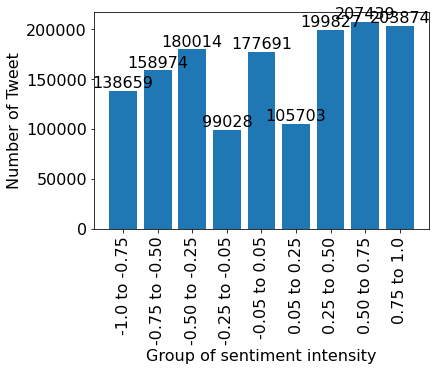

In [36]:
keys = ['-1.0 to -0.75', '-0.75 to -0.50', '-0.50 to -0.25', '-0.25 to -0.05', '-0.05 to 0.05', '0.05 to 0.25', '0.25 to 0.50', '0.50 to 0.75', '0.75 to 1.0']
#valueInterval.keys()
values = [138659, 158974, 180014, 99028, 177691, 105703, 199827, 207439, 203874] #valueInterval.values()

plt.bar(keys, values)
plt.xticks(rotation='vertical')
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=16)
#ax.set_xticks([-1.5, -1.25, -1.0, -0.75, -0.50, -0.25, -0.05, 0, 0.05, 0.25, 0.50, 0.75, 1.0, 1.25, 1.5])
ax.bar_label(ax.containers[0], label_type='edge', fontsize=16)

ax.set_ylabel('Number of Tweet', size=16)
ax.set_xlabel('Group of sentiment intensity', size=16)

#ax.bar_label(ax.containers[0], label_type='edge', color='red', rotation=90, fontsize=7, padding=3)


plt.savefig("ValueIntervalPolarity.jpeg",dpi=1080,bbox_inches='tight')
plt.show()

In [45]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(sentence.__str__(), deacc=True))  # deacc=True removes punctuations

In [46]:
data_words = list(sent_to_words(data))

print(data_words[:1])

[['would', 'give', 'headache', 'much', 'productivity', 'taste']]


In [47]:
# Create Dictionary
id2word = corpora.Dictionary(data_words)

In [48]:
# Create Corpus
texts = data_words

In [49]:
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

In [50]:
# View
print(corpus[:1])

[[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1)]]


In [51]:
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('give', 1),
  ('headache', 1),
  ('much', 1),
  ('productivity', 1),
  ('taste', 1),
  ('would', 1)]]

In [44]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=1000,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [45]:
lda_model.print_topics()

[(0,
  '0.343*"united" + 0.176*"kingdom" + 0.166*"states" + 0.074*"ma" + 0.069*"manchester" + 0.059*"boston" + 0.024*"kansas" + 0.015*"cambridge" + 0.013*"wv" + 0.011*"by"'),
 (1,
  '0.202*"fl" + 0.112*"oh" + 0.110*"nc" + 0.092*"co" + 0.067*"nyc" + 0.063*"land" + 0.061*"beach" + 0.055*"denver" + 0.034*"columbus" + 0.030*"tampa"'),
 (2,
  '0.339*"the" + 0.214*"city" + 0.178*"of" + 0.081*"ohio" + 0.022*"from" + 0.021*"bengaluru" + 0.017*"nova" + 0.011*"philly" + 0.009*"middle" + 0.008*"born"'),
 (3,
  '0.350*"new" + 0.209*"york" + 0.125*"north" + 0.077*"ny" + 0.060*"she" + 0.049*"global" + 0.046*"her" + 0.037*"bay" + 0.004*"left" + 0.003*"sunny"'),
 (4,
  '0.260*"canada" + 0.059*"columbia" + 0.054*"vancouver" + 0.051*"france" + 0.045*"alberta" + 0.043*"british" + 0.042*"state" + 0.038*"park" + 0.037*"cleveland" + 0.037*"republic"'),
 (5,
  '0.383*"tx" + 0.103*"virginia" + 0.093*"dallas" + 0.074*"pennsylvania" + 0.056*"fort" + 0.037*"not" + 0.032*"missouri" + 0.026*"oxford" + 0.022*"worth

In [46]:
lda_model.log_perplexity(corpus)

-18.897791148835818

In [47]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_words, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5952993407863028


In [48]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
vis

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/s

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
14     0.023292 -0.070987       1        1  10.791886
18     0.023310 -0.071658       2        1   9.991017
3      0.167766  0.336768       3        1   7.523454
2      0.022886 -0.058172       4        1   6.796687
0      0.023170 -0.066588       5        1   6.357504
16     0.022988 -0.060569       6        1   5.151299
13     0.022619 -0.052904       7        1   5.142093
17     0.022373 -0.049325       8        1   4.739141
15    -0.334980  0.115840       9        1   4.577941
7     -0.336494  0.116451      10        1   4.522267
1      0.022613 -0.052952      11        1   4.492599
12     0.022467 -0.050685      12        1   4.213585
19     0.022603 -0.052673      13        1   3.867710
4      0.022424 -0.050036      14        1   3.857242
10     0.022585 -0.052594      15        1   3.843565
8      0.145846  0.278280      16        1   3.323494
9      0.021720 -0.042693      17        1   3.298622
5      0.021879 -0.044102      18        1   3.172853
6      0.021624 -0.041925      19        1   3.000304
11     0.019308 -0.029476      20        1   1.336736, topic_info=          Term           Freq          Total Category  logprob  loglift
23         usa  108007.000000  108007.000000  Default  30.0000  30.0000
27     england  102538.000000  102538.000000  Default  29.0000  29.0000
10         new   59299.000000   59299.000000  Default  28.0000  28.0000
97         the   51842.000000   51842.000000  Default  27.0000  27.0000
50      united   49160.000000   49160.000000  Default  26.0000  26.0000
...        ...            ...            ...      ...      ...      ...
2129   unceded       0.079333       1.681304  Topic20 -12.8465   1.2613
1455        de       0.079333       1.681346  Topic20 -12.8465   1.2612
14198      मबई       0.079328       1.681276  Topic20 -12.8466   1.2612
806      kuala       0.079328       1.681280  Topic20 -12.8466   1.2612
807     lumpur       0.079328       1.681280  Topic20 -12.8466   1.2612

[644 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
433       2  0.996918     abuja
521      16  0.966617       ace
92        6  0.999838    africa
151      16  0.992155       aka
281      13  0.998763   alabama
...     ...       ...       ...
351       6  0.999197       you
592      12  0.999550      your
124      17  0.999589   zealand
353      20  0.999119  zimbabwe
582      20  0.998148        रत

[430 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[15, 19, 4, 3, 1, 17, 14, 18, 16, 8, 2, 13, 20, 5, 11, 9, 10, 6, 7, 12])

In [95]:
#from LdaMallet import LdaMallet

In [52]:
mallet_path = '/Users/razon/Downloads/mallet-2.0.8/bin/mallet' # update this path
ldamallet = LdaMallet(mallet_path, corpus=corpus, num_topics=20, id2word=id2word)

NameError: name 'LdaMallet' is not defined

In [53]:
ldamallet.show_topics(formatted=False)

[(10,
  [('london', 0.2361100257872939),
   ('england', 0.2117097757286864),
   ('uk', 0.04929866374931625),
   ('manchester', 0.03965773228100336),
   ('germany', 0.02110846292099711),
   ('essex', 0.014896069391263577),
   ('kent', 0.014163475814644057),
   ('europe', 0.014095100414159569),
   ('brighton', 0.010100023442994452),
   ('berlin', 0.009738610611862155)]),
 (19,
  [('tx', 0.16419132624338517),
   ('texas', 0.09073973612291063),
   ('nan', 0.07649160158449082),
   ('ma', 0.07305239669590673),
   ('usa', 0.06085140792450126),
   ('boston', 0.04983776369796411),
   ('houston', 0.04450494897489176),
   ('austin', 0.03851704760637481),
   ('dallas', 0.033542483392529965),
   ('valley', 0.019703778007513027)]),
 (14,
  [('nan', 0.6114712034871139),
   ('mi', 0.051894520985542494),
   ('va', 0.03088321671836196),
   ('detroit', 0.020156013313685685),
   ('richmond', 0.011695846171284894),
   ('place', 0.009078449759385016),
   ('michigan', 0.008027369310511834),
   ('grand', 0.00

In [57]:
data_lemmatized = data_words

In [58]:
coherence_model_ldamallet = CoherenceModel(model=ldamallet, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_ldamallet = coherence_model_ldamallet.get_coherence()
print('\nCoherence Score: ', coherence_ldamallet)

NameError: name 'ldamallet' is not defined

In [56]:
model = malletmodel2ldamodel1(ldamallet)

NameError: name 'malletmodel2ldamodel1' is not defined

In [130]:
print('\nPerplexity: ', model.log_perplexity(corpus))


Perplexity:  nan


In [59]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        mallet_path = '/Users/razon/Downloads/mallet-2.0.8/bin/mallet' # update this path
        model = LdaMallet(mallet_path, corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [62]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=2, limit=100, step=2)

Mallet LDA: 2 topics, 1 topic bits, 1 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -9.14146
<20> LL/token: -9.12466
<30> LL/token: -9.10822
<40> LL/token: -9.09328

0	25	meeting awful worker people time day good year make job today back find labor thing physical great week check lot 
1	25	meeting worker awful people time day good make year job today thing person back put poll great find labor trump 

<50> LL/token: -9.07861
<60> LL/token: -9.06158
<70> LL/token: -9.03707
<80> LL/token: -8.99752
<90> LL/token: -8.94039

0	25	meeting awful time today day find check good year great labor people physical week team love zoom friend make back 
1	25	worker awful people job meeting make time day good person thing year back put trump social care pay home poll 

<100> LL/token: -8.8765
<110> LL/token: -8.81837
<120> LL/token: -8.77025
<130> LL/token: -8.73189
<140> LL/token: -8.70196

0	25	meeting time day today find year great week check good love team friend phy


0	12.5	meeting awful labor physical time people worker day make back good thing hour sex hard guy year shit life feel 
1	12.5	awful people job good time year make thing lot pay life employee bad game wage business worker great working feel 
2	12.5	worker person social trump put people poll state vote essential mask sign care health hand call covid government show party 
3	12.5	meeting find check today time week day zoom team great long year school friend join group tomorrow ago room meet 

<100> LL/token: -9.16383
<110> LL/token: -9.04447
<120> LL/token: -8.95145
<130> LL/token: -8.88001
<140> LL/token: -8.82613

0	12.5	day time labor back physical hour guy home love shit man hard thing friend woman sex thought told lol make 
1	12.5	awful people good job year make thing lot time pay bad life game working business money feel great employee company 
2	12.5	worker social person put care trump health poll essential state vote call show mask sign covid hand child country public 
3	12.5	mee

<750> LL/token: -8.57502
<760> LL/token: -8.57479
<770> LL/token: -8.57456
<780> LL/token: -8.57421
<790> LL/token: -8.57393

0	12.5	day time back labor physical love friend hour guy man shit home kid told thought night sex lol made story 
1	12.5	awful people good make year job thing lot time working life feel pay bad give game hard money business great 
2	12.5	worker person social care put trump family show health poll essential state vote child mask sign stop covid call key 
3	12.5	meeting today find week check team school zoom great coming long start board group room tomorrow live join member meet 

<800> LL/token: -8.57416
<810> LL/token: -8.57382
<820> LL/token: -8.57388
<830> LL/token: -8.57377
<840> LL/token: -8.57365

0	12.5	day time back labor physical love friend hour guy man shit home kid told thought night sex lol made story 
1	12.5	awful people good make year job thing lot time working life feel pay bad give game hard money business great 
2	12.5	worker person social care 

<300> LL/token: -8.68062
<310> LL/token: -8.67676
<320> LL/token: -8.67367
<330> LL/token: -8.6707
<340> LL/token: -8.66796

0	8.33333	worker labor physical make pay business working money service employee company wage set support food paid high issue give hard 
1	8.33333	awful people good job thing great lot make feel bad game hard god hope point woman sex lost making fucking 
2	8.33333	meeting today find check team zoom board group tomorrow join member meet community student room plan video question tonight read 
3	8.33333	love meeting friend shit guy night thought coming lol man told gon back face talking fuck nice head girl literally 
4	8.33333	time day year back week home life hour family school care end long month kid place child key full start 
5	8.33333	worker social person put trump poll essential state vote mask sign show stop hand country call line party healthcare biden 

<350> LL/token: -8.66566
<360> LL/token: -8.66377
<370> LL/token: -8.66191
<380> LL/token: -8.66015
<39

<780> LL/token: -8.64069
<790> LL/token: -8.64069

0	8.33333	worker labor physical make pay business money service employee company wage support working set food paid issue high change problem 
1	8.33333	awful people good job thing great lot make feel bad hard game god point hope fucking guy pretty hate play 
2	8.33333	meeting today find check team zoom board group tomorrow join member meet room community student plan video question tonight read 
3	8.33333	love meeting shit thought coming sex night lol guy man told face gon friend talking nice fuck back head girl 
4	8.33333	time day year worker back life week home school people hour care family end long month kid friend place child 
5	8.33333	worker person put trump poll essential social state vote call woman mask sign stop show hand country line party healthcare 

<800> LL/token: -8.64055
<810> LL/token: -8.64047
<820> LL/token: -8.64055
<830> LL/token: -8.64023
<840> LL/token: -8.63985

0	8.33333	worker labor physical make pay busine

<200> LL/token: -8.81383
<210> LL/token: -8.79819
<220> LL/token: -8.78465
<230> LL/token: -8.77343
<240> LL/token: -8.76453

0	6.25	awful good great guy man bad shit game year hope god big fucking team play fuck pretty lol yeah fan 
1	6.25	school business support set employee child issue staff high teacher service productivity struggle read part important company experience student community 
2	6.25	meeting friend back coming love told news night today room morning turn talk talking found minute girl asked face started 
3	6.25	worker trump put person poll state vote call mask sign hand party country biden police american leader election show president 
4	6.25	awful people job thing make lot woman sex point world lost real making wrong reason fact problem black human understand 
5	6.25	meeting find check today week zoom team board group tomorrow join member meet ago tonight long question miss online virtual 
6	6.25	time day labor year physical hard hour life working feel make back kid 

<580> LL/token: -8.67823
<590> LL/token: -8.67746

0	6.25	awful good great guy man shit game hope team god big show fucking bad year play amazing pretty fan fuck 
1	6.25	business support set employee issue company service high teacher read experience productivity part struggle important staff post change level step 
2	6.25	meeting friend love coming told night thought back morning today face talking news turn girl asked found wait minute town 
3	6.25	worker trump put poll state vote call person mask sign hand country party biden police american leader election president early 
4	6.25	awful people job make thing lot woman feel sex making real point lost person made world hate reason fact wrong 
5	6.25	meeting find today check school zoom week board group tomorrow join member meet ago tonight team student video online miss 
6	6.25	time day year labor physical hard back working hour life family kid week month full feel worked class end long 
7	6.25	worker social care pay health home essen

<950> LL/token: -8.66243
<960> LL/token: -8.66222
<970> LL/token: -8.66186
<980> LL/token: -8.66145
<990> LL/token: -8.66055

0	6.25	awful good great guy man team game hope show god big fucking year story play amazing bad fan manager run 
1	6.25	business support set employee issue company read experience productivity high change struggle post part important service level plan step staff 
2	6.25	meeting friend love coming told night thought face morning today talking lol back turn girl news asked wait minute gon 
3	6.25	worker trump put poll state vote mask call sign person hand country party biden police american leader election president early 
4	6.25	awful people job make thing lot feel woman making sex real person lost made shit point bad hate reason world 
5	6.25	meeting find today check school zoom week board group tomorrow join member meet student ago tonight video online miss virtual 
6	6.25	time day year labor physical back hard working hour life family week kid month full home

<250> LL/token: -8.81329
<260> LL/token: -8.80567
<270> LL/token: -8.79827
<280> LL/token: -8.79094
<290> LL/token: -8.78506

0	5	awful good year great team game god bad guy play big fan manager player absolutely pretty season terrible top run 
1	5	people awful job make thing lot feel making made lost real life hate fact wrong point reason understand sound deal 
2	5	meeting time love friend coming today show news talk turn hope happy amazing nice town hear live fun story great 
3	5	day back time week home hour long call meeting today year month morning night ago minute stay key house car 
4	5	shit man woman sex lol told fucking face gon fuck literally girl guy asked called bos black talking head wanted 
5	5	worker trump poll state vote put mask sign person hand country party biden police american leader election president early stand 
6	5	worker pay business essential money service employee company wage give food paid line end pick working pandemic struggle customer order 
7	5	meeting 

<550> LL/token: -8.72433
<560> LL/token: -8.724
<570> LL/token: -8.72344
<580> LL/token: -8.72274
<590> LL/token: -8.7213

0	5	awful good year great team game god guy big play fan manager show hard player bad season top terrible run 
1	5	awful people job thing make lot feel making bad lost real made hate life wrong fact reason sound understand stuff 
2	5	meeting love friend time coming today talk news turn hope happy story video nice show found thought amazing town hear 
3	5	day time back week hour home long call year today morning month key night ago minute house full place start 
4	5	shit man told woman sex lol fucking face gon fuck girl asked called literally guy head bos black made wanted 
5	5	worker trump poll state vote mask sign put hand country person party biden police american leader election president early stand 
6	5	worker pay essential business money service employee company wage end give food line paid make pick struggle customer order tax 
7	5	set read issue support cha

<850> LL/token: -8.70853
<860> LL/token: -8.70839
<870> LL/token: -8.70794
<880> LL/token: -8.70749
<890> LL/token: -8.707

0	5	awful good year great team game guy god big play show fan manager hard player season terrible top point win 
1	5	awful people job thing make lot feel bad making real lost life hate made good wrong fact reason sound understand 
2	5	meeting love friend coming time talk news turn hope today story happy found nice thought video town hear amazing show 
3	5	time day back week hour year today long call home month morning night ago minute full start place house key 
4	5	shit woman man told sex lol fucking face gon fuck girl asked called literally bos head black guy made mom 
5	5	trump worker poll state vote sign mask put hand country person party biden police american leader election president stand ballot 
6	5	worker pay business essential money service employee company wage end give food paid line make struggle pick customer order union 
7	5	set issue read change su

<150> LL/token: -9.10635
<160> LL/token: -9.0608
<170> LL/token: -9.02381
<180> LL/token: -8.99329
<190> LL/token: -8.96787

0	4.16667	meeting time part make awful call big point talk manager give talking good read thing world start free human figure 
1	4.16667	year day meeting time friend love life long month family hard feel week ago happy back found night started feeling 
2	4.16667	worker social home care health essential covid child key line healthcare pick case police stay vaccine safe store hospital wake 
3	4.16667	meeting back morning minute turn head face told asked walk car wait call phone eye room late door desk bos 
4	4.16667	meeting time today school day week great working team staff kid teacher parent experience productivity full start student class support 
5	4.16667	job labor physical pay money employee make company business working wage people hour paid food struggle tax living lot cost 
6	4.16667	meeting find check zoom board group tomorrow join member meet miss virtua

<400> LL/token: -8.80676
<410> LL/token: -8.80419
<420> LL/token: -8.80161
<430> LL/token: -8.79913
<440> LL/token: -8.79689

0	4.16667	meeting time call make back place start talk give part end point figure turn question idea taking big hear move 
1	4.16667	day year meeting love friend time week long family month life hour hard night ago found happy hope remember worked 
2	4.16667	worker social home care health essential covid line healthcare case stay police key pick vaccine safe show store pandemic hospital 
3	4.16667	meeting back morning face minute head asked walk car told phone room house eye order door late desk waiting left 
4	4.16667	school today meeting kid working support time child parent student staff class great week teacher experience productivity full young post 
5	4.16667	job labor physical worker pay business money employee company wage food paid working make hour struggle tax living cut cost 
6	4.16667	meeting find check zoom board group tomorrow join member today me

<650> LL/token: -8.76282
<660> LL/token: -8.76161
<670> LL/token: -8.76045
<680> LL/token: -8.75992
<690> LL/token: -8.75884

0	4.16667	meeting time call back start place end turn talk part question figure hear wait give taking point move full idea 
1	4.16667	day year meeting love friend week long family time today month life hour night hard ago happy hope found worked 
2	4.16667	worker social home care health essential covid line stay healthcare key case police pick vaccine safe store hospital show wake 
3	4.16667	back morning face minute meeting head walk car phone house eye room order door desk left waiting drive lad walked 
4	4.16667	school kid support working child today parent student staff class teacher experience set productivity great high young post meeting read 
5	4.16667	job labor physical worker pay business money employee company wage food make paid working hour struggle tax living cut end 
6	4.16667	meeting find check zoom today board group tomorrow join member meet miss

<900> LL/token: -8.74732
<910> LL/token: -8.74827
<920> LL/token: -8.7493
<930> LL/token: -8.74987
<940> LL/token: -8.74948

0	4.16667	meeting time call back start place turn part end talk question wait figure taking full hear move point thought idea 
1	4.16667	day year meeting love friend week today long family life time month hour night hard ago hope happy found worked 
2	4.16667	worker home social care health essential covid line stay key healthcare case police vaccine safe show pick hospital pandemic wake 
3	4.16667	back morning face head walk car phone house room eye order door desk drive waiting left lad walked pull bed 
4	4.16667	school kid support working child parent student class today staff set teacher experience high productivity young post read great community 
5	4.16667	labor physical worker pay business money job employee company wage make food working paid hour struggle tax service living cut 
6	4.16667	meeting find check zoom today board group tomorrow join member meet

<150> LL/token: -9.1144
<160> LL/token: -9.0663
<170> LL/token: -9.02681
<180> LL/token: -8.99505
<190> LL/token: -8.96883

0	3.57143	meeting great team read call book story time word question free big point twitter tweet post made idea show talk 
1	3.57143	worker social woman man police show medium call black family case white called death situation control men cop house government 
2	3.57143	worker pay money job wage make paid company give end tax food union cut government cost low million living market 
3	3.57143	worker home care health essential service covid key line pick stay healthcare working pandemic customer front vaccine safe order store 
4	3.57143	back face head walk car house eye guy door boy meeting hit thought girl desk hand pull dog walked looked 
5	3.57143	people labor physical hard make life lot thing working real world give time mental making body kind dream move mind 
6	3.57143	awful people thing feel good shit fucking bad fuck hate yeah literally make lol stop gon 

<400> LL/token: -8.81616
<410> LL/token: -8.81403
<420> LL/token: -8.81198
<430> LL/token: -8.81028
<440> LL/token: -8.80886

0	3.57143	meeting great show story read point question team book made word big post tweet idea thought heard hear watch twitter 
1	3.57143	worker social woman police man medium white black called call men house situation fight cop control stand family show government 
2	3.57143	worker pay money wage job paid business company government union tax end give make cut cost small low food market 
3	3.57143	worker home care health essential service covid key line pick stay healthcare working pandemic customer vaccine safe store hospital order 
4	3.57143	back face head walk car house room eye door put hand desk lad hit walked pull looked dog lady asked 
5	3.57143	people labor physical make life hard lot thing working real world give mental human making understand body mind kind live 
6	3.57143	awful feel thing people shit sex make good lol fucking gon bad fuck literally

<650> LL/token: -8.78996
<660> LL/token: -8.78972
<670> LL/token: -8.78927
<680> LL/token: -8.78881
<690> LL/token: -8.7877

0	3.57143	meeting great show story read question point book made word idea post tweet watch thought big hear heard interview talk 
1	3.57143	worker social woman police medium man white black situation called men house cop fight family issue speak mother beat government 
2	3.57143	worker pay money job wage company paid business government union tax end cut give cost small low make market million 
3	3.57143	worker home care health essential service covid key line pick stay healthcare working pandemic customer vaccine safe store case hospital 
4	3.57143	back face head walk car house eye room door put hand desk lad walked pull looked dog lady hit clean 
5	3.57143	people labor physical make life hard lot thing working real world give mental human understand making kind body mind live 
6	3.57143	awful feel thing people shit make sex good lol fucking man gon guy bad fuc

<900> LL/token: -8.78186
<910> LL/token: -8.78236
<920> LL/token: -8.78193
<930> LL/token: -8.78138
<940> LL/token: -8.78137

0	3.57143	show meeting great story read question book point made word watch post tweet idea heard hear interview talk thought big 
1	3.57143	worker social woman police medium white man black called situation house government men issue cop fight speak law mother beat 
2	3.57143	worker pay money job wage business paid company union government tax end cut cost small give low food market million 
3	3.57143	worker home care health essential covid key line service pick stay mask healthcare pandemic working customer vaccine safe case store 
4	3.57143	back face head walk car room house eye door hand put desk lad walked pull looked dog lady construction clean 
5	3.57143	people labor physical make life hard lot thing working real world give mental human understand making kind body mind live 
6	3.57143	awful feel thing shit people make good sex lol fucking man guy bad gon 

<100> LL/token: -9.61189
<110> LL/token: -9.47902
<120> LL/token: -9.36762
<130> LL/token: -9.27836
<140> LL/token: -9.20716

0	3.125	meeting today coming news community find city plan town local council hall tonight report read future live public area great 
1	3.125	man woman worker sex story talking girl house white black called guy human men told word face lady asked talk 
2	3.125	year time make world people change class idea great problem meeting due part start person hold finding point issue career 
3	3.125	day labor physical hour working time hard mental lot make worked life body back shift construction sleep end break tired 
4	3.125	meeting room today thought video walk morning fun love desk lad boy door night nice dog turn walked eye head 
5	3.125	meeting friend week long time year ago day today night minute found month morning started turn late heart positive happy 
6	3.125	awful good thing shit bad fucking guy lol gon hate yeah make feel god literally people fuck pretty time 

<300> LL/token: -8.88089
<310> LL/token: -8.87581
<320> LL/token: -8.8712
<330> LL/token: -8.86669
<340> LL/token: -8.86243

0	3.125	meeting coming news today plan board community city town local public council report hall area tonight member committee live held 
1	3.125	man woman sex story face talking girl show called white black worker word told house men heard asked human talk 
2	3.125	make point world place idea thing made problem change end part time making class move question give start issue big 
3	3.125	day time labor physical hour working hard full back week break life mental body shift worked end lot rest sleep 
4	3.125	meeting room video fun thought walk eye head nice desk lad dog watching bit hanging moment turn coffee remember watch 
5	3.125	meeting today week call time long friend night ago month minute found morning back turn started phone start day late 
6	3.125	awful good feel thing shit bad guy lol fucking gon fuck literally yeah make hate god pretty stuff ppl bos 
7

<500> LL/token: -8.82683
<510> LL/token: -8.82573
<520> LL/token: -8.82526
<530> LL/token: -8.8239
<540> LL/token: -8.82318

0	3.125	meeting coming news board plan today city community public town local council report member hall area tonight committee hold held 
1	3.125	man woman sex show story face talking girl white worker called black word men house stand heard human told twitter 
2	3.125	make thing people point made making place end world idea problem change question person part give move real issue big 
3	3.125	day time labor physical hour working back hard full week break part life body mental shift worked rest half lot 
4	3.125	meeting video love fun room head thought eye friend nice desk walk watch bit lad moment hanging watching remember dog 
5	3.125	meeting today call time week long back morning ago night minute start month turn wait found started phone yesterday late 
6	3.125	awful good feel shit thing guy bad lol fucking gon fuck literally yeah hate god pretty stuff make p

<700> LL/token: -8.8138
<710> LL/token: -8.81325
<720> LL/token: -8.81252
<730> LL/token: -8.81216
<740> LL/token: -8.81122

0	3.125	meeting coming news board plan city public today community town local council member report hall area tonight hold committee held 
1	3.125	woman man sex show worker story face girl talking white black called house men word stand stop heard twitter calling 
2	3.125	make people thing made point making idea end place person world problem change give question real part understand issue move 
3	3.125	time day labor physical hour working hard back full week part break life body mental shift worked taking rest lot 
4	3.125	meeting love friend video fun head eye thought room desk nice hang remember moment watch lad hanging watching bit dog 
5	3.125	meeting today call long week time back morning night ago start minute turn month told wait found started phone yesterday 
6	3.125	awful good feel shit thing guy bad lol fucking gon fuck literally yeah hate god pretty s

<900> LL/token: -8.80704
<910> LL/token: -8.80687
<920> LL/token: -8.80698
<930> LL/token: -8.8069
<940> LL/token: -8.80609

0	3.125	meeting coming news board plan city public today town community local council member report hall area tonight issue hold committee 
1	3.125	woman man worker show sex story girl face talking white black house stop men called stand word heard human calling 
2	3.125	make people thing made point making person place world idea end problem change question real give understand reason part read 
3	3.125	time day labor physical hour working hard back week full part life break body mental shift worked taking rest end 
4	3.125	meeting love friend video fun head eye thought room hang desk moment nice remember lad hanging boy watch dog watching 
5	3.125	meeting today call back long week time morning night ago start minute told turn month wait found started phone yesterday 
6	3.125	good feel awful shit guy thing bad lol fucking gon fuck literally yeah hate stuff god pr

<100> LL/token: -9.62653
<110> LL/token: -9.48696
<120> LL/token: -9.37806
<130> LL/token: -9.29176
<140> LL/token: -9.22279

0	2.77778	meeting check find board miss community virtual today event member great forward learn join annual online student opportunity register session 
1	2.77778	meeting zoom call find free book today meet email link question tomorrow student group reach send join week date open 
2	2.77778	worker make end power set give system left point deal people account change control union problem class big bank trade 
3	2.77778	awful job people bad god hate fucking good lot absolutely terrible lose fact thing sound worse lost wrong stop fired 
4	2.77778	awful good game team great guy play fan manager player thought season big win playing desk coach bad lad top 
5	2.77778	day year meeting week time friend long month ago hour back found today attend heart positive wait past met yesterday 
6	2.77778	man shit house told lol worker guy fuck show love called asked mom bos gon 

<300> LL/token: -8.89536
<310> LL/token: -8.88976
<320> LL/token: -8.88527
<330> LL/token: -8.88097
<340> LL/token: -8.87772

0	2.77778	meeting check find board community member group miss virtual join event online learn forward space annual opportunity share register today 
1	2.77778	meeting call zoom meet question today book tomorrow find figure email free link team phone date reach send monday start 
2	2.77778	worker make end point give made union big power system problem deal idea making left reason stand control side set 
3	2.77778	awful job people bad lot lost god hate sound absolutely good pretty terrible lose thing worse worst quit fired losing 
4	2.77778	awful good great team game play fan manager player guy season win top big playing coach lad run club football 
5	2.77778	day year time week meeting hour back long month ago today wait found minute night started late heart past positive 
6	2.77778	shit man guy told lol gon fuck literally fucking called asked talking yeah bos pp

<500> LL/token: -8.84513
<510> LL/token: -8.84435
<520> LL/token: -8.84329
<530> LL/token: -8.84207
<540> LL/token: -8.8415

0	2.77778	meeting check find board member community join miss group virtual event online learn forward space annual share committee general register 
1	2.77778	meeting call zoom meet today question tomorrow figure book turn email team link phone free date reach send find start 
2	2.77778	make worker point give made end making union big power problem idea stand reason deal system control fact left thing 
3	2.77778	awful job people bad lot god lost good sound absolutely pretty hate terrible lose worse thing worst quit fired losing 
4	2.77778	awful good great team game play fan manager player season guy win top playing coach big lad run club football 
5	2.77778	day time week meeting year back hour long month today ago wait night morning start minute late heart past positive 
6	2.77778	shit man guy told lol gon fucking fuck literally called talking yeah bos asked ppl

<700> LL/token: -8.82779
<710> LL/token: -8.8279
<720> LL/token: -8.82788
<730> LL/token: -8.82698
<740> LL/token: -8.82601

0	2.77778	meeting check find member join board miss community virtual event group online learn forward space annual general committee register detail 
1	2.77778	meeting call zoom meet today question turn figure team tomorrow email link phone start send free reach date book monday 
2	2.77778	make worker give point made end making thing union power idea reason big fact problem stand wrong left control true 
3	2.77778	awful job people bad lot good god lost sound absolutely pretty hate terrible lose worse worst interview quit losing fired 
4	2.77778	awful good great team game play fan manager player guy season win top playing big coach lad club run man 
5	2.77778	day time week meeting back hour year long month today night ago wait morning start late heart past minute positive 
6	2.77778	shit man guy told lol fucking gon fuck literally called talking yeah bos asked pp

<900> LL/token: -8.81924
<910> LL/token: -8.81886
<920> LL/token: -8.81836
<930> LL/token: -8.81802
<940> LL/token: -8.8184

0	2.77778	meeting find check member join board miss virtual event community online group learn forward space book annual general detail committee 
1	2.77778	meeting call zoom meet today turn question team figure email link phone tomorrow start send reach room date free group 
2	2.77778	make worker give point made thing end making union power idea reason fact problem big wrong stand control side decision 
3	2.77778	awful job people bad good god lot lost absolutely sound pretty hate terrible lose worse interview worst quit feel poor 
4	2.77778	awful great good game team play fan manager player guy season win top big playing club coach lad run man 
5	2.77778	day time week meeting back hour year long month today ago night morning wait start late heart past minute positive 
6	2.77778	shit man guy told lol fucking gon fuck literally called talking yeah bos asked ppl mo

<100> LL/token: -9.62225
<110> LL/token: -9.47767
<120> LL/token: -9.36629
<130> LL/token: -9.27961
<140> LL/token: -9.21252

0	2.5	worker care health home essential covid line healthcare stay pandemic vaccine safe case hospital due risk front open safety death 
1	2.5	worker pay money wage company business paid union tax cost living low cut million benefit economy bill minimum employer paying 
2	2.5	worker trump poll state vote mask sign put person biden hand leader election early president ballot american signed postal wear 
3	2.5	love friend lol god feel happy gon guy nice thought good fun amazing thing shit wan make hanging meeting cool 
4	2.5	social woman man worker call police show white black medium house people stop men called life cop beat officer racist 
5	2.5	meeting check find zoom join group student virtual event online email link miss member tomorrow annual information monday interested info 
6	2.5	labor physical productivity business free working support mental body chall

<250> LL/token: -8.95464
<260> LL/token: -8.94652
<270> LL/token: -8.93828
<280> LL/token: -8.93156
<290> LL/token: -8.92547

0	2.5	worker care home health essential covid line stay healthcare pandemic vaccine case safe staff hospital due risk front open sick 
1	2.5	worker pay money business company wage employee paid tax cost cut low living bill million economy benefit market minimum employer 
2	2.5	worker trump poll state vote mask sign put person biden leader election early hand president ballot american signed postal lie 
3	2.5	love friend guy meeting happy fun nice lol amazing god met hang super hanging dream cool thought imagine bit life 
4	2.5	worker social woman man sex show police call white black medium men stop called cop beat officer calling racist abuse 
5	2.5	meeting check find join zoom virtual group event online email link miss student annual information member monday reach interested info 
6	2.5	labor physical productivity working body mental system experience challeng

<410> LL/token: -8.88101
<420> LL/token: -8.87955
<430> LL/token: -8.87678
<440> LL/token: -8.87405

0	2.5	worker care home health essential covid line stay healthcare pandemic case vaccine safe hospital staff due risk front sick safety 
1	2.5	worker pay money business employee company wage paid struggle tax cost living low cut market million economy benefit bill minimum 
2	2.5	worker trump poll state vote mask sign put person biden election early hand ballot president american signed postal lie leader 
3	2.5	love friend meeting guy happy fun nice amazing life hang super met hanging dream god cool bit imagine remember character 
4	2.5	worker social woman man sex show police white black medium call stop men called cop beat officer stand house calling 
5	2.5	meeting check find join zoom virtual online event email link miss group free annual information reach monday member interested info 
6	2.5	labor physical productivity working body system mental experience challenging tip level energy

<560> LL/token: -8.85376
<570> LL/token: -8.85284
<580> LL/token: -8.85195
<590> LL/token: -8.85134

0	2.5	worker care home health essential covid line stay healthcare pandemic vaccine safe case due hospital risk sick front staff open 
1	2.5	worker pay business money employee company wage paid struggle tax cost living cut low market million economy benefit small minimum 
2	2.5	worker trump poll state vote mask sign put person biden election early hand american president ballot signed postal lie leader 
3	2.5	love meeting friend happy guy fun amazing nice life hang super met dream hanging cool show god bit moment imagine 
4	2.5	worker social woman man sex show police white black medium men stop call called cop stand officer house calling beat 
5	2.5	meeting check find join zoom virtual online event email link miss free reach member monday annual information interested info detail 
6	2.5	labor physical productivity working body mental system challenging experience level tip energy traini

<710> LL/token: -8.84249
<720> LL/token: -8.84245
<730> LL/token: -8.84279
<740> LL/token: -8.84196

0	2.5	worker care home health essential covid line stay healthcare mask pandemic vaccine safe case hospital due front risk sick staff 
1	2.5	worker pay business money employee company wage paid struggle tax cost cut living low market million economy benefit small bill 
2	2.5	worker trump poll state vote sign put person biden election early hand president american ballot signed postal lie leader mask 
3	2.5	meeting love friend happy fun amazing nice hang met life super guy dream world hanging show cool moment bit character 
4	2.5	worker social woman man sex show police white black medium stop men call called law stand cop officer beat racist 
5	2.5	meeting check find join zoom virtual online event email link miss free book reach member annual information interested info detail 
6	2.5	labor physical productivity working system body mental level challenging tip experience energy build skil

<850> LL/token: -8.8373
<860> LL/token: -8.83698
<870> LL/token: -8.83668
<880> LL/token: -8.83589
<890> LL/token: -8.83598

0	2.5	worker care home health essential covid line stay mask healthcare pandemic vaccine safe case hospital front sick due risk open 
1	2.5	worker pay business money employee company wage paid struggle tax cost living cut low market million economy benefit small minimum 
2	2.5	worker trump poll vote sign put state person biden election early american president hand ballot signed postal lie leader republican 
3	2.5	meeting love friend happy fun amazing life hang met super nice show world dream hanging cool moment bit character watching 
4	2.5	worker social woman sex man show police white black medium stop men call law stand cop called officer house beat 
5	2.5	meeting check find join zoom virtual online event book email link free miss reach member annual information interested info detail 
6	2.5	labor physical productivity working body mental level system challeng

<1000> LL/token: -8.83194

Total time: 14 minutes 27 seconds
Mallet LDA: 22 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.37399
<20> LL/token: -11.19841
<30> LL/token: -11.0459
<40> LL/token: -10.90232

0	2.27273	meeting awful worker people time special check bring part high make day today great finish quality hard dream good back 
1	2.27273	worker meeting awful party people govt sir migrant time congress india day minister bjp good farmer social bus lockdown give 
2	2.27273	awful meeting sex worker girl people story time year bar day thing hope smile love make good job feel industry 
3	2.27273	meeting worker awful people book free time day find member good today link make year check team business great school 
4	2.27273	worker awful meeting people time job day labor thing make good year back physical feel week family today social call 
5	2.27273	meeting worker awful people time day good year today make back job find thing 

<150> LL/token: -9.18954
<160> LL/token: -9.14778
<170> LL/token: -9.11355
<180> LL/token: -9.08638
<190> LL/token: -9.06302

0	2.27273	awful team game great play fan player big season manager good win top playing coach special club watch guy run 
1	2.27273	party government country law police anti state govt security political leader minister labour sir crisis war migrant china congress case 
2	2.27273	shit sex lol fucking guy gon fuck girl literally hate feel yeah ppl talking love wan damn dude story fucked 
3	2.27273	meeting today morning night book day free desk lad tomorrow walk coffee yesterday wait lunch run park start reading place 
4	2.27273	people awful thing stop fact wrong deal make understand medium making agree matter stand reason lie country real situation point 
5	2.27273	worker line pick food service car front customer order store back put door told drive dog shop clean fast retail 
6	2.27273	meeting find board public member city plan community question council check to

<300> LL/token: -8.94417
<310> LL/token: -8.93931
<320> LL/token: -8.93452
<330> LL/token: -8.92934
<340> LL/token: -8.92532

0	2.27273	awful team game great play fan player season manager good win top playing big coach club guy special football run 
1	2.27273	party country government law anti state power govt leader stand political security minister labour sir war crisis migrant china congress 
2	2.27273	shit guy sex lol fucking gon fuck literally girl yeah hate talking ppl feel wan damn dude stuff dream hell 
3	2.27273	meeting today morning night book day desk room walk tomorrow friend lad yesterday coffee lunch bed late reading park run 
4	2.27273	people awful thing make stop fact wrong deal making understand agree medium reason point person lot matter real happen totally 
5	2.27273	worker pick food service line car front customer order store door put drive told dog clean shop back fast shift 
6	2.27273	meeting find board public member community plan city council local tonight gener

<450> LL/token: -8.89392
<460> LL/token: -8.89225
<470> LL/token: -8.89043
<480> LL/token: -8.88889
<490> LL/token: -8.888

0	2.27273	awful team game great play fan player season manager good win playing coach top big club guy special football sport 
1	2.27273	country party government law anti power state govt stand security leader political minister labour sir war crisis migrant china congress 
2	2.27273	shit guy sex lol fucking gon fuck literally girl yeah talking ppl hate imagine wan damn hell dude dream man 
3	2.27273	meeting today morning night book room tomorrow walk desk yesterday day lad turn coffee lunch weekend park reading free late 
4	2.27273	people awful thing make stop fact wrong making agree deal understand medium reason point lot completely poor totally person matter 
5	2.27273	worker pick food line service car front customer order store door put drive dog clean shop fast retail window told 
6	2.27273	meeting find board public member community plan city council local to

<600> LL/token: -8.8767
<610> LL/token: -8.87583
<620> LL/token: -8.87615
<630> LL/token: -8.87621
<640> LL/token: -8.87506

0	2.27273	awful team game great play fan player season manager win playing top coach good club big guy football sport special 
1	2.27273	country party government law anti power govt leader political security state stand minister labour sir war crisis union migrant china 
2	2.27273	shit guy sex lol fucking gon fuck literally girl yeah ppl talking hate imagine wan damn dream hell stuff dude 
3	2.27273	meeting today morning night book room tomorrow walk yesterday desk turn lad figure coffee lunch weekend free park day art 
4	2.27273	people awful thing make stop fact wrong making agree understand medium reason deal completely lot poor point totally respect opinion 
5	2.27273	worker pick food line service car front customer order store put door drive dog clean shop fast retail window restaurant 
6	2.27273	meeting board public find member community plan city council lo

<750> LL/token: -8.87028
<760> LL/token: -8.87025
<770> LL/token: -8.8694
<780> LL/token: -8.86852
<790> LL/token: -8.8682

0	2.27273	awful team game great play fan player season manager win top playing coach club good big guy football sport league 
1	2.27273	country party government law anti power leader state govt political security stand union minister labour sir war migrant china congress 
2	2.27273	shit guy sex lol fucking gon fuck literally girl yeah ppl talking hate imagine hell wan damn dream dude stuff 
3	2.27273	meeting today morning night book room turn tomorrow walk desk yesterday lad figure coffee lunch weekend park ready art free 
4	2.27273	people awful thing stop fact wrong make agree making medium understand deal reason poor completely person totally lot respect opinion 
5	2.27273	worker pick food line service car front customer order store put door drive dog clean shop fast retail window restaurant 
6	2.27273	meeting board public member community find plan city local c

<900> LL/token: -8.865
<910> LL/token: -8.86443
<920> LL/token: -8.86406
<930> LL/token: -8.86347
<940> LL/token: -8.86302

0	2.27273	awful team game great play fan player season manager win top playing coach club good big guy football sport league 
1	2.27273	country party government law power anti union govt state leader security political stand minister labour sir war migrant china congress 
2	2.27273	shit guy sex lol fucking gon fuck literally girl yeah talking ppl hate imagine hell wan damn man dream dude 
3	2.27273	meeting today morning book room night turn tomorrow walk yesterday desk lad figure coffee lunch weekend park free day ready 
4	2.27273	people awful stop thing fact wrong medium agree making understand poor deal reason completely respect person totally make opinion lot 
5	2.27273	worker pick food line service car front order customer store put door drive dog clean shop fast retail window picked 
6	2.27273	meeting board public member community find plan city council local

<50> LL/token: -10.78134
<60> LL/token: -10.53437
<70> LL/token: -10.27267
<80> LL/token: -10.038
<90> LL/token: -9.8379

0	2.08333	business market job economy policy industry small power demand data system country company number trade housing tech stock product owner 
1	2.08333	awful game team play player good season fan win bad coach manager playing guy year great football worst terrible point 
2	2.08333	awful story people good full great medium time job meeting character thing lot war read bad tweet twitter make writing 
3	2.08333	worker care health people healthcare support vaccine mental covid safety case pandemic medical issue contract system risk social set government 
4	2.08333	people awful time make lot worker life thing year back good feel hard problem day working end job desk class 
5	2.08333	worker make hour job people awful year union working wage worked time minimum give making hard min retail full amazon 
6	2.08333	worker party police social government woman law case off

<200> LL/token: -9.06393
<210> LL/token: -9.04593
<220> LL/token: -9.02959
<230> LL/token: -9.01548
<240> LL/token: -9.00194

0	2.08333	business company small change market industry system power policy economy plan deal country owner data term government private trade demand 
1	2.08333	awful team game good play fan great manager player season win guy club playing top coach big year football run 
2	2.08333	awful story medium read good tweet twitter post fact made point comment show account character movie writing wrong true pretty 
3	2.08333	worker care health social covid healthcare case support vaccine hospital pandemic due risk mental safety death staff public doctor medical 
4	2.08333	people make thing life lot feel making real person understand problem desk lad reason kind awful sense happen stuff folk 
5	2.08333	worker time hard year working hour give end full worked class make month union day part shift college middle work 
6	2.08333	party police government law cop security count

<350> LL/token: -8.92947
<360> LL/token: -8.92536
<370> LL/token: -8.92195
<380> LL/token: -8.91836
<390> LL/token: -8.91602

0	2.08333	business company change small industry market economy country deal policy system government power owner demand data private trade term plan 
1	2.08333	awful team game play fan player manager good season great win top playing club coach guy big football sport league 
2	2.08333	awful story medium read tweet twitter made post show good fact comment account word point character movie interview writing idea 
3	2.08333	worker care health social covid healthcare case vaccine hospital pandemic risk due safety mental death sick public doctor medical virus 
4	2.08333	people make thing life lot feel making person real understand kind desk lad made sense reason decision happen awful folk 
5	2.08333	time year worker hard working hour give full day end worked class part month shift college union half middle break 
6	2.08333	party police law government cop anti secur

<500> LL/token: -8.89917
<510> LL/token: -8.89783
<520> LL/token: -8.89669
<530> LL/token: -8.8955
<540> LL/token: -8.89411

0	2.08333	business company change small country industry market economy system government policy power deal owner demand trade private big housing energy 
1	2.08333	awful team game play fan player manager season good win great top playing coach club guy football big sport league 
2	2.08333	awful story read medium made post tweet twitter show fact comment point account word character movie good writing reading true 
3	2.08333	worker care health covid essential healthcare case social vaccine pandemic hospital risk sick due safety death test mental doctor medical 
4	2.08333	people make life thing lot feel person making real understand made desk kind lad decision reason sense awful happen folk 
5	2.08333	time year hour working worker day hard full worked class end month part give half shift long college past middle 
6	2.08333	party police law government union cop lea

<650> LL/token: -8.88126
<660> LL/token: -8.88064
<670> LL/token: -8.8795
<680> LL/token: -8.87915
<690> LL/token: -8.87796

0	2.08333	business company country small change industry market economy policy power government deal system owner demand trade big private world american 
1	2.08333	awful team game play fan player manager season win great top playing club coach good guy big football sport league 
2	2.08333	awful story read medium made show post tweet twitter comment fact point word account character movie reading writing true report 
3	2.08333	worker care health essential covid healthcare case vaccine pandemic hospital risk sick due safety death test mental doctor medical virus 
4	2.08333	people make life thing feel lot making person real understand made desk lad kind decision sense reason give easy difference 
5	2.08333	time year day hour week working month full worked class end hard part past long half shift ago worker college 
6	2.08333	party police union law government cop co

<800> LL/token: -8.86723
<810> LL/token: -8.86634
<820> LL/token: -8.86546
<830> LL/token: -8.86543
<840> LL/token: -8.86445

0	2.08333	business country small company industry market government change economy policy power deal owner big american demand world system trade bank 
1	2.08333	awful team game play fan player manager season win top great playing club coach guy big football good sport league 
2	2.08333	awful story show read medium made post tweet twitter white word comment fact account point character reading movie writing report 
3	2.08333	worker care health essential covid healthcare case pandemic vaccine hospital sick risk due safety death test mental doctor medical virus 
4	2.08333	people make life feel thing lot making person real made understand desk lad decision sense give kind reason world easy 
5	2.08333	time year day week hour working month full worked class end part past half ago long shift couple start hard 
6	2.08333	party police law government cop leader country s

<950> LL/token: -8.85874
<960> LL/token: -8.85827
<970> LL/token: -8.85813
<980> LL/token: -8.85786
<990> LL/token: -8.85729

0	2.08333	business union small country government industry market company economy change policy power owner american deal world demand trade big system 
1	2.08333	awful team game play fan player manager season win great top playing club coach guy big football sport league played 
2	2.08333	awful story read show medium white made post tweet twitter word comment fact point account character reading movie writing report 
3	2.08333	worker care health essential covid healthcare case vaccine pandemic hospital sick risk due safety death test mental doctor medical virus 
4	2.08333	people make life feel thing making person lot real made understand desk lad decision sense give change end world kind 
5	2.08333	time year day week hour month working full worked end part past long ago half start shift couple spent started 
6	2.08333	party police law government country cop lea

<100> LL/token: -9.77179
<110> LL/token: -9.62864
<120> LL/token: -9.51309
<130> LL/token: -9.42051
<140> LL/token: -9.34554

0	1.92308	labor physical body system power firm working energy agreement change frustrating diversity hard society emotional skill build problem industry based 
1	1.92308	meeting check find join virtual event email group link member online tomorrow miss annual information interested info detail reach register 
2	1.92308	worker coming woman sex news story girl town show men person hall man twitter hope funny nice relationship telling tweet 
3	1.92308	worker trump poll vote mask sign state biden person put hand election president ballot early signed postal leader county republican 
4	1.92308	meeting time great today read book make apply art day writing idea place set running post article bee start find 
5	1.92308	awful job people lost bad absolutely terrible lose hate worse losing poor deal racist worst horrible blame agree loss god 
6	1.92308	meeting friend day t

<250> LL/token: -9.0366
<260> LL/token: -9.02632
<270> LL/token: -9.0177
<280> LL/token: -9.00902
<290> LL/token: -9.00215

0	1.92308	labor physical body system firm energy change agreement build frustrating diversity industry society emotional working mental construction human task power 
1	1.92308	meeting check find join virtual event link email miss tomorrow online member annual information interested info detail register march group 
2	1.92308	worker woman coming show sex news story girl town person twitter men hall man real account tweet talk date relationship 
3	1.92308	worker trump poll vote sign state put person biden election hand president ballot early signed postal leader county republican gop 
4	1.92308	meeting time read book post great free set full find list today client running check reading note article writing art 
5	1.92308	awful job people lost absolutely terrible lose worst bad poor losing worse deal horrible fired god quit lot loss hate 
6	1.92308	meeting day today

<400> LL/token: -8.94961
<410> LL/token: -8.94622
<420> LL/token: -8.94336
<430> LL/token: -8.93979
<440> LL/token: -8.93678

0	1.92308	labor physical body system change firm energy agreement build industry frustrating diversity society emotional mental construction human working forced task 
1	1.92308	meeting check find join virtual event link email miss tomorrow online member annual information interested info detail register group march 
2	1.92308	worker woman show coming sex news story girl town white black twitter men man person hall account tweet date real 
3	1.92308	worker trump poll vote sign state put person biden election hand president ballot early signed postal leader county republican gop 
4	1.92308	meeting time read book free post find set great check client list today note run reading article idea running writing 
5	1.92308	awful job lost people absolutely terrible lose poor worst bad worse losing god deal quit fired horrible loss situation hate 
6	1.92308	day today meet

<550> LL/token: -8.92014
<560> LL/token: -8.919
<570> LL/token: -8.91799
<580> LL/token: -8.917
<590> LL/token: -8.91522

0	1.92308	labor physical body change system firm energy agreement build industry mental construction frustrating diversity society emotional forced human working task 
1	1.92308	meeting check find join virtual event link email miss tomorrow online member annual information interested info detail zoom forward register 
2	1.92308	worker woman show coming sex news story girl town white black man twitter men hall person account tweet relationship fake 
3	1.92308	worker trump poll vote sign state put person biden election hand ballot president early signed postal leader republican gop paper 
4	1.92308	meeting read book free post find set time check client list idea note great tip article reading run follow writing 
5	1.92308	awful job lost absolutely terrible lose people poor bad worst worse losing quit deal interview fired god horrible hate loss 
6	1.92308	day today mee

<700> LL/token: -8.90629
<710> LL/token: -8.90536
<720> LL/token: -8.90505
<730> LL/token: -8.90439
<740> LL/token: -8.90432

0	1.92308	labor physical body change system firm energy agreement mental build industry construction frustrating diversity society human emotional forced working task 
1	1.92308	meeting check find join virtual event link email miss tomorrow online member annual information forward interested info detail zoom register 
2	1.92308	worker woman show coming sex news story girl town white man black twitter men hall person account tweet relationship fake 
3	1.92308	worker trump poll vote sign state put person biden election ballot hand president early signed postal leader republican gop paper 
4	1.92308	meeting read book free set find post check client list idea team tip note great article reading follow writing art 
5	1.92308	awful job lost absolutely terrible lose people poor worst bad worse losing quit deal god fired horrible hate loss interview 
6	1.92308	day today

<850> LL/token: -8.90019
<860> LL/token: -8.90033
<870> LL/token: -8.8998
<880> LL/token: -8.89948
<890> LL/token: -8.89913

0	1.92308	labor physical body system firm change energy mental agreement human industry frustrating diversity construction society emotional forced build working task 
1	1.92308	meeting check find join virtual event link email tomorrow miss online member annual information forward interested info group detail zoom 
2	1.92308	worker woman show coming sex news story girl town man white black twitter men hall person account tweet end fake 
3	1.92308	worker trump poll vote sign state put person biden election ballot president hand early signed postal leader republican gop paper 
4	1.92308	meeting read book free post set find check idea team client list great note tip reading article follow writing art 
5	1.92308	awful job lost absolutely terrible lose poor bad worst people worse quit losing god deal hate horrible fired loss blame 
6	1.92308	day today night morning me

<1000> LL/token: -8.89675

Total time: 45 minutes 55 seconds
Mallet LDA: 28 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.58904
<20> LL/token: -11.3954
<30> LL/token: -11.2246
<40> LL/token: -11.05642

0	1.78571	meeting worker talking human awful action discus people research stopped time animal check make year find day plan job reduce 
1	1.78571	awful meeting worker people time good job make today day year thing great back love team find life feel home 
2	1.78571	worker meeting awful party people govt sir migrant india time congress farmer bank youth blood bus due home police day 
3	1.78571	meeting zoom room worker join break awful find time people check safe today day good make student week link year 
4	1.78571	meeting awful worker people time day check conference today good make virtual easy job great thing back year find week 
5	1.78571	awful worker meeting people time job day year good thing make bad great back home to

<150> LL/token: -9.25011
<160> LL/token: -9.21024
<170> LL/token: -9.17732
<180> LL/token: -9.14852
<190> LL/token: -9.12533

0	1.78571	issue change action report human discus security agreement diversity plan research policy china history carry talking speak statement including meeting 
1	1.78571	back guy head eye hand thought word big thing left looked side made bit moment mind hope make hear time 
2	1.78571	country party government worker state union leader govt minister labour sir migrant congress youth political law politics india politician train 
3	1.78571	meeting zoom find check join tomorrow group email link miss online virtual event book meet free reach interested team register 
4	1.78571	meeting night morning time room day minute late today walk back break bed half start coffee lunch waiting conversation min 
5	1.78571	awful bad god feel hate fucking thing make wrong absolutely fired quit worst suck blue leave made completely terrible worse 
6	1.78571	meeting call face quest

<300> LL/token: -9.00606
<310> LL/token: -9.00098
<320> LL/token: -8.99622
<330> LL/token: -8.99102
<340> LL/token: -8.98747

0	1.78571	issue action change discus human security agreement diversity history policy country china research report press power plan carry statement talking 
1	1.78571	back head hand eye side left looked wearing guy put moment bit thought red meeting face mind hit pull word 
2	1.78571	party government country union state worker anti leader govt minister labour sir migrant congress youth political politics india politician bjp 
3	1.78571	meeting find check zoom join event group email link virtual tomorrow online book miss reach free meet interested info information 
4	1.78571	meeting night morning day room today minute hour walk break late back half bed coffee waiting lunch min start sleep 
5	1.78571	awful god bad hate absolutely wrong feel fucking terrible worst fired quit poor suck made completely fact blue agree reason 
6	1.78571	meeting call question called 

<450> LL/token: -8.95495
<460> LL/token: -8.9534
<470> LL/token: -8.95184
<480> LL/token: -8.95039
<490> LL/token: -8.94893

0	1.78571	issue action change country human discus power security agreement policy history diversity china research press carry war statement world hold 
1	1.78571	back face head hand eye meeting looked moment put red side left bit pull foot inside hit mouth hair shirt 
2	1.78571	party government country union worker state anti leader govt minister labour sir migrant congress political politics india politician bjp national 
3	1.78571	meeting check find join zoom virtual event email link online book group tomorrow miss reach free information interested info register 
4	1.78571	meeting day night today morning room hour minute break walk late back tomorrow half bed sleep coffee lunch waiting min 
5	1.78571	awful god absolutely wrong hate terrible fact worst fired quit bad poor agree completely fucking suck made worse totally blame 
6	1.78571	meeting call question c

<600> LL/token: -8.9353
<610> LL/token: -8.9342
<620> LL/token: -8.93293
<630> LL/token: -8.93225
<640> LL/token: -8.93119

0	1.78571	country action issue change power human policy agreement security history diversity discus research world china carry press war deal statement 
1	1.78571	back face head hand eye looked blue hair red moment pull put foot bit light meeting mouth inside side shirt 
2	1.78571	party government country worker union state anti leader govt minister labour sir migrant congress political politics india national politician bjp 
3	1.78571	meeting check find join zoom virtual event email link tomorrow online group book miss annual information reach free interested info 
4	1.78571	meeting day today night morning hour room walk break minute late back tomorrow half bed sleep coffee waiting yesterday early 
5	1.78571	awful god wrong absolutely fact terrible hate worst fired quit agree poor completely lie bad totally reason blame fucking suck 
6	1.78571	meeting call quest

<750> LL/token: -8.92447
<760> LL/token: -8.92395
<770> LL/token: -8.92345
<780> LL/token: -8.92259
<790> LL/token: -8.92216

0	1.78571	country action power change world human security policy agreement history issue diversity research deal china discus war carry press statement 
1	1.78571	face back head hand eye blue looked hair red moment put pull light foot inside mouth bit shirt cut dress 
2	1.78571	party government worker union country state anti leader govt minister labour sir migrant congress political politics india politician gov bjp 
3	1.78571	meeting check find join zoom virtual event email link online tomorrow group miss annual information free reach interested info book 
4	1.78571	meeting day today hour night morning room break walk late minute tomorrow half back shift bed sleep waiting coffee early 
5	1.78571	awful god absolutely fact wrong terrible worst fired quit agree poor completely lie totally bad blame racist hate excuse opinion 
6	1.78571	meeting call question turn

<900> LL/token: -8.91742
<910> LL/token: -8.91669
<920> LL/token: -8.91665
<930> LL/token: -8.91625
<940> LL/token: -8.91596

0	1.78571	country action power world change policy deal agreement history human diversity issue research security china war carry discus press trade 
1	1.78571	face back head hand eye blue looked hair red put pull foot moment light cat mouth bit inside shirt wall 
2	1.78571	party government worker union state country anti leader govt minister labour sir migrant congress political politics india national politician bjp 
3	1.78571	meeting check find join zoom virtual event email link online group tomorrow miss annual information free reach interested info book 
4	1.78571	day meeting hour today night morning room break walk late tomorrow minute shift half back bed sleep coffee yesterday early 
5	1.78571	awful god fact absolutely wrong terrible worst fired quit agree poor lie completely totally racist opinion blame excuse truth stupid 
6	1.78571	meeting call questio


0	1.66667	meeting awful worker people hall good time town coming news today great make team back day job year check bad 
1	1.66667	meeting worker awful people time day good thing make blood bee today year border bank back job fuck bag game 
2	1.66667	awful worker meeting people day time man good job house government make thing guy great back labor physical hard flag 
3	1.66667	meeting worker awful people time day good job today year make call week thing physical back labor guy feel hour 
4	1.66667	meeting worker awful people time day check today make year good find thing air friend week back lot great fresh 
5	1.66667	meeting awful worker people day good time year check great team make find today school conference player love guy week 
6	1.66667	meeting long ago attend heart positive year expect trust test time day week awful outcome scream covid ethic gut tested 
7	1.66667	meeting link free book member find check awful worker team zoom time email people register business day reach ja

<120> LL/token: -9.48841
<130> LL/token: -9.40343
<140> LL/token: -9.33783

0	1.66667	meeting coming news city town tonight watch council show local great thought hall today live video boy resident race episode 
1	1.66667	back worker face eye head hand told door walked put shut side walk left made guy literally street fuck looked 
2	1.66667	awful good thing bad man feel house sound pretty guy make lot yeah suck luck glad back made stuff give 
3	1.66667	call meeting called back bos phone wait told asked time leave red emergency left head start started wanted end turn 
4	1.66667	meeting today day friend happy great night forward meet group weekend amazing place time enjoy art air beautiful lovely wonderful 
5	1.66667	awful team game play great fan player manager season win playing top club coach good big football sport league played 
6	1.66667	year week meeting day long month ago covid heart positive attend expect time test today couple trust term due result 
7	1.66667	meeting check find

<200> LL/token: -9.12355
<210> LL/token: -9.10423
<220> LL/token: -9.08673
<230> LL/token: -9.07223
<240> LL/token: -9.05867

0	1.66667	meeting coming news city tonight town watch council local live video hall today area show run community tomorrow resident race 
1	1.66667	back face head hand eye door put side walk walked looked left inside bag bee throw walking wall street mouth 
2	1.66667	awful good feel thing bad pretty lot sound hope feeling yeah god suck stuff honestly luck glad worse wow make 
3	1.66667	call meeting told back called asked wait bos phone leave time left wanted started emergency gave manager calling start yesterday 
4	1.66667	meeting day today great night happy friend forward amazing meet weekend hope morning fun enjoy awesome art wonderful beautiful air 
5	1.66667	awful team game play fan player season win great manager playing coach club top football sport league big ball played 
6	1.66667	year week day long month ago covid meeting heart positive past time expect

<300> LL/token: -9.00465
<310> LL/token: -8.99867
<320> LL/token: -8.99327
<330> LL/token: -8.98889
<340> LL/token: -8.98489

0	1.66667	meeting coming news city tonight town local council live watch community find hall area video tomorrow run today resident race 
1	1.66667	back face head hand eye door put side looked walk inside walked red bag bee blue open walking big wall 
2	1.66667	awful good feel thing bad lot pretty sound hope feeling yeah honestly god stuff suck wow felt luck glad worse 
3	1.66667	call meeting back told called asked wait leave left bos phone wanted started gave manager happened needed ended yesterday emergency 
4	1.66667	day meeting today great night happy friend amazing forward hope meet weekend morning fun miss awesome wonderful friday art beautiful 
5	1.66667	awful team game play fan player season win playing coach great club manager top football sport league ball played big 
6	1.66667	year week day long month ago covid heart past meeting positive back expect 

<400> LL/token: -8.96645
<410> LL/token: -8.96445
<420> LL/token: -8.96217
<430> LL/token: -8.95958
<440> LL/token: -8.95764

0	1.66667	meeting coming news city tonight town community local council live find hall area watch today tomorrow video park resident race 
1	1.66667	back face head hand eye door side looked put walk red inside bee blue walked moment wall mouth open big 
2	1.66667	awful good feel thing bad lot pretty hope sound feeling yeah honestly felt stuff glad luck god suck wow worse 
3	1.66667	call meeting told back called asked left leave wait bos phone wanted started gave manager needed happened ended yesterday made 
4	1.66667	day meeting great today night friend happy amazing forward meet hope love miss weekend fun awesome morning enjoy wonderful beautiful 
5	1.66667	awful team game play fan player season win great playing coach club top manager football sport league ball played final 
6	1.66667	year week day long month ago back heart past positive covid meeting hour tim

<500> LL/token: -8.94833
<510> LL/token: -8.94657
<520> LL/token: -8.94512
<530> LL/token: -8.94419
<540> LL/token: -8.94305

0	1.66667	meeting coming news city community tonight town local council find live area hall today watch tomorrow park resident race street 
1	1.66667	back face head hand eye door side walk looked put red inside bee wearing blue moment wall big mouth shirt 
2	1.66667	awful good feel thing bad lot pretty hope sound feeling yeah felt honestly glad stuff wow luck suck god thought 
3	1.66667	call meeting told back called asked left bos phone leave wanted wait started gave made manager happened needed ended yesterday 
4	1.66667	meeting day great today friend night happy love amazing meet forward fun hope weekend miss awesome enjoy morning wonderful beautiful 
5	1.66667	awful team game play fan player season win great playing coach club top manager football sport league ball played big 
6	1.66667	year week day long month ago hour back heart past positive meeting time w

<600> LL/token: -8.93565
<610> LL/token: -8.93463
<620> LL/token: -8.93372
<630> LL/token: -8.93232
<640> LL/token: -8.93186

0	1.66667	meeting coming news community city tonight town local find council live area hall today watch tomorrow park resident race street 
1	1.66667	back face head hand eye door side looked red hair walk wearing blue put bee wall moment mouth shirt inside 
2	1.66667	awful good feel thing bad lot pretty hope sound feeling yeah felt thought stuff honestly wow luck glad bit sad 
3	1.66667	call told meeting back called asked left bos phone wanted wait leave started made ended gave yesterday manager thought happened 
4	1.66667	meeting great day friend today love happy night amazing meet fun forward hope weekend miss hanging awesome enjoy nice wonderful 
5	1.66667	awful team game play fan player season win great playing coach club top manager football sport league played ball guy 
6	1.66667	year day week long month hour ago meeting time back heart past positive worke

<700> LL/token: -8.92631
<710> LL/token: -8.92495
<720> LL/token: -8.92323
<730> LL/token: -8.92153
<740> LL/token: -8.92008

0	1.66667	meeting coming news community city tonight town find local council live today area hall watch tomorrow resident race park place 
1	1.66667	face back head hand eye door wearing side hair looked red blue moment bee walk bit wall mouth put big 
2	1.66667	awful good feel thing bad lot pretty hope sound feeling felt thought yeah stuff honestly glad wow bit luck sad 
3	1.66667	call told meeting back called asked left wanted bos phone wait leave started made ended gave thought manager happened yesterday 
4	1.66667	meeting great friend love day today happy meet amazing night fun forward hope weekend miss hanging nice awesome enjoy loved 
5	1.66667	awful team game play player fan season win great playing coach club manager top football sport league guy ball played 
6	1.66667	year day week long month hour ago time heart past positive meeting half worked back end

<800> LL/token: -8.91457
<810> LL/token: -8.91339
<820> LL/token: -8.91332
<830> LL/token: -8.91232
<840> LL/token: -8.91149

0	1.66667	meeting coming news community city tonight town find local council today live area hall watch tomorrow resident race place boy 
1	1.66667	face head back hand eye door wear wearing side hair red looked put blue bee moment wall walk mouth pull 
2	1.66667	awful good feel thing bad lot pretty hope sound feeling thought felt stuff yeah honestly bit glad wow luck kind 
3	1.66667	call told meeting back called asked left wanted bos phone wait leave started made thought gave ended happened yesterday manager 
4	1.66667	meeting friend great love day happy today meet amazing fun night forward hope weekend miss hanging nice met enjoy awesome 
5	1.66667	awful team game play player fan season win great playing coach club manager top football guy sport league ball played 
6	1.66667	day year week hour long month ago time heart past worked positive back meeting end half

<900> LL/token: -8.90881
<910> LL/token: -8.90782
<920> LL/token: -8.90751
<930> LL/token: -8.907
<940> LL/token: -8.90645

0	1.66667	meeting coming news community city tonight town find local council today live area hall watch place tomorrow resident race park 
1	1.66667	face head back hand eye door wear wearing side hair red put looked blue bee moment pull walk big wall 
2	1.66667	awful good feel thing bad lot pretty hope sound feeling thought stuff yeah bit felt honestly wow glad luck kind 
3	1.66667	call told meeting called back asked left wanted bos phone made started wait thought leave gave ended remember happened yesterday 
4	1.66667	meeting friend great love day happy today meet amazing fun hope night forward weekend hanging nice miss met enjoy awesome 
5	1.66667	awful team game play player fan season great win playing coach club manager top football sport guy league played ball 
6	1.66667	day year week hour long month ago end meeting back heart past worked positive time half e

<1000> LL/token: -8.90407

Total time: 22 minutes 13 seconds
Mallet LDA: 32 topics, 5 topic bits, 11111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.70792
<20> LL/token: -11.4916
<30> LL/token: -11.30631
<40> LL/token: -11.13067

0	1.5625	awful meeting worker time people good great make job year day thing game team lot man shit hard fucking back 
1	1.5625	meeting worker awful people time good day team message point figure make today health thing find week year app violence 
2	1.5625	awful meeting worker people time lot day good make job year thing parking love turn end made walmart back home 
3	1.5625	labor physical wage worker minimum awful job people emotional pay man medical make meeting mental time treated money victim low 
4	1.5625	worker meeting awful news town coming hall people time day good wake today back factory thing make job week show 
5	1.5625	meeting awful worker people time day good make job thing back year today great friend lot feel

<100> LL/token: -9.76698
<110> LL/token: -9.62523
<120> LL/token: -9.51207
<130> LL/token: -9.42158
<140> LL/token: -9.35087

0	1.5625	awful team game play fan player season manager win playing coach club great top football sport half league performance ball 
1	1.5625	meeting zoom minute figure today call turn send meet message missed start kicked client app morning late loud camera note 
2	1.5625	awful lot people thing good bad hate feel shit fucking make stuff yeah sound end pretty honestly movie character writing 
3	1.5625	labor physical wage hour pay living money low body cost minimum working paid hard price emotional forced amount higher pain 
4	1.5625	worker coming show news town today wake hall tomorrow construction tonight run back day race live fight excited give watch 
5	1.5625	awful fact people wrong lie agree point thing tweet truth opinion made completely true blame medium reason excuse word comment 
6	1.5625	back meeting call room phone wait time desk day lad video sit si

<200> LL/token: -9.13606
<210> LL/token: -9.11853
<220> LL/token: -9.1023
<230> LL/token: -9.08889
<240> LL/token: -9.07841

0	1.5625	awful team game play fan player season win playing coach manager club top football sport league ball played final performance 
1	1.5625	meeting zoom today turn figure minute call send meet missed email message start kicked tomorrow morning quick camera note app 
2	1.5625	awful thing bad feel good people lot stuff hate make kind pretty yeah sound person character movie making end honestly 
3	1.5625	labor physical wage living working body minimum hard price low hour emotional forced mental pain cost amount demand society level 
4	1.5625	worker show coming news today town watch live video wake hall end run tomorrow give tonight fight construction episode race 
5	1.5625	awful fact wrong point agree medium lie tweet stop completely truth opinion matter people true totally excuse comment blame reason 
6	1.5625	back meeting call room wait phone break desk lad s

<300> LL/token: -9.03173
<310> LL/token: -9.02577
<320> LL/token: -9.02155
<330> LL/token: -9.01666
<340> LL/token: -9.01349

0	1.5625	awful team game play fan player season win playing coach club manager football top sport league ball played final match 
1	1.5625	meeting zoom today turn figure send meet call minute missed email tomorrow message kicked group start quick chat note camera 
2	1.5625	awful thing feel bad good lot people stuff kind pretty make person yeah making character movie feeling end sound honestly 
3	1.5625	labor physical wage hard working body living minimum price mental emotional forced pain society low amount demand energy shortage hour 
4	1.5625	worker show coming news live watch video town today end wake hall run watching give tomorrow tonight post fight episode 
5	1.5625	awful fact wrong point medium agree lie tweet stop truth completely opinion comment twitter totally blame true account matter excuse 
6	1.5625	meeting back call room wait phone break told minut

<400> LL/token: -8.9964
<410> LL/token: -8.99396
<420> LL/token: -8.99125
<430> LL/token: -8.98907
<440> LL/token: -8.98703

0	1.5625	awful team game play fan player season win playing coach club manager football sport top league ball played final match 
1	1.5625	meeting zoom today turn figure meet send call group tomorrow email missed minute message kicked team quick chat start online 
2	1.5625	awful thing feel bad good lot stuff people make feeling kind pretty person yeah felt character movie making honestly end 
3	1.5625	labor physical wage hard working body minimum living mental emotional forced society pain construction amount low life energy shortage demand 
4	1.5625	worker show coming news live watch video town end wake hall today give watching run fight tonight tomorrow post episode 
5	1.5625	awful fact wrong medium point stop agree lie tweet account truth twitter completely opinion blame comment matter totally true journalist 
6	1.5625	meeting back call room wait break phone t

<500> LL/token: -8.97583
<510> LL/token: -8.97471
<520> LL/token: -8.9736
<530> LL/token: -8.97154
<540> LL/token: -8.97136

0	1.5625	awful game team play fan player season win playing coach club manager football top sport league ball played final match 
1	1.5625	meeting zoom today turn figure meet group send call email tomorrow missed minute team message kicked quick chat online start 
2	1.5625	awful thing feel bad good lot stuff feeling make pretty kind people person yeah making felt character movie honestly end 
3	1.5625	labor physical working hard wage body minimum mental emotional forced society living pain amount construction energy life system condition production 
4	1.5625	worker show coming news live watch video town end hall today give wake watching run fight tonight tomorrow episode hey 
5	1.5625	awful fact medium wrong lie point tweet agree stop account twitter truth opinion true blame completely comment totally matter fake 
6	1.5625	meeting back call room wait break told p

<600> LL/token: -8.96458
<610> LL/token: -8.96356
<620> LL/token: -8.9626
<630> LL/token: -8.96256
<640> LL/token: -8.9614

0	1.5625	awful game team play fan player season win playing coach club manager football top sport league ball played final match 
1	1.5625	meeting zoom today turn figure meet group send email call tomorrow team missed message minute kicked chat quick camera online 
2	1.5625	awful feel thing bad good lot stuff feeling kind make pretty people yeah felt person character making movie honestly end 
3	1.5625	labor physical hard working body mental emotional society forced life construction pain system energy amount actual type production condition industry 
4	1.5625	worker show coming news live video watch end town hall today watching give run fight tomorrow tonight hey episode wake 
5	1.5625	awful fact medium wrong lie tweet point stop agree account twitter truth opinion completely true blame comment calling totally fake 
6	1.5625	meeting back call room wait told break

<700> LL/token: -8.9594
<710> LL/token: -8.95925
<720> LL/token: -8.95869
<730> LL/token: -8.95827
<740> LL/token: -8.95768

0	1.5625	awful game team play fan player season win playing coach club manager football top sport league ball played final match 
1	1.5625	meeting zoom today turn figure group meet team send email call tomorrow message missed kicked chat quick minute camera kick 
2	1.5625	awful feel thing bad good lot stuff feeling kind pretty make yeah felt making character person end movie honestly bit 
3	1.5625	labor physical hard working body mental society emotional forced pain construction system life energy amount actual type production condition brain 
4	1.5625	worker show coming news live video watch end town hall today watching give run fight tomorrow tonight episode wake start 
5	1.5625	awful fact medium wrong lie tweet stop point agree account twitter truth opinion completely comment blame calling excuse fake totally 
6	1.5625	meeting back call room told wait break mi

<800> LL/token: -8.9557
<810> LL/token: -8.95493
<820> LL/token: -8.95439
<830> LL/token: -8.95341
<840> LL/token: -8.95288

0	1.5625	awful game team play fan player season win playing coach club manager football top sport league played ball final match 
1	1.5625	meeting zoom today turn figure group meet team send email tomorrow message missed call kicked minute chat start quick kick 
2	1.5625	awful feel thing bad good lot stuff feeling kind pretty make felt yeah character honestly making movie end person bit 
3	1.5625	labor physical hard working body mental society construction emotional forced life pain system energy actual type amount production brain ability 
4	1.5625	worker show coming news live video watch town end today hall watching run give fight tomorrow tonight start episode hey 
5	1.5625	awful fact medium wrong lie tweet stop point agree account truth twitter opinion completely comment blame calling fake true excuse 
6	1.5625	meeting back call room break told phone wait min

<900> LL/token: -8.95221
<910> LL/token: -8.95148
<920> LL/token: -8.95127
<930> LL/token: -8.9515
<940> LL/token: -8.95136

0	1.5625	awful game team play fan player season win coach playing club manager top football sport league ball played final match 
1	1.5625	meeting zoom today turn figure group meet team send email call message missed tomorrow minute kicked chat quick kick camera 
2	1.5625	awful feel thing bad good lot stuff feeling pretty kind make felt yeah honestly character movie person end bit making 
3	1.5625	labor physical hard working body mental human society emotional construction forced pain life system energy actual amount type production brain 
4	1.5625	worker show coming news live video watch town end today hall watching give run tomorrow tonight start follow fight episode 
5	1.5625	awful fact medium wrong lie tweet point stop agree account truth opinion twitter completely blame comment calling true fake totally 
6	1.5625	meeting back call room break wait phone told 

<1000> LL/token: -8.95126

Total time: 21 minutes 2 seconds
Mallet LDA: 34 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.7615
<20> LL/token: -11.54173
<30> LL/token: -11.35203
<40> LL/token: -11.1734

0	1.47059	wage worker pay awful job tax minimum price meeting paid people low increase paying benefit cost income employer make higher 
1	1.47059	worker meeting awful people time day year thing agreement good christmas job tree diversity make physical back find working lot 
2	1.47059	meeting worker awful human talking action discus research stopped people farm history job animal death law time heat reduce good 
3	1.47059	worker trump poll vote mask state sign biden election hand leader put person early ballot signed president postal republican gop 
4	1.47059	awful meeting worker people job good time day year thing home today lot union make back working council find car 
5	1.47059	worker police meeting government party people 

<100> LL/token: -9.76116
<110> LL/token: -9.63055
<120> LL/token: -9.52888
<130> LL/token: -9.44852
<140> LL/token: -9.38598

0	1.47059	pay money wage paid worker tax cost bill low market million benefit minimum paying business economy cut living average price 
1	1.47059	people world thing make lot life set agreement helping time diversity change brother part christmas holiday give family point end 
2	1.47059	country government union american action power policy law deal human history labour america act protection world china change trade crisis 
3	1.47059	trump poll vote mask sign worker state biden election president put person hand ballot signed leader postal early republican gop 
4	1.47059	worker service food car customer order pick drive fast blue put driver building place buy window road delivery pull driving 
5	1.47059	party police white black worker cop anti officer social house racist abuse political crime killed court protest justice violence called 
6	1.47059	awful good guy 

<200> LL/token: -9.17505
<210> LL/token: -9.15417
<220> LL/token: -9.13766
<230> LL/token: -9.12272
<240> LL/token: -9.10907

0	1.47059	pay money wage paid worker tax cost bill low market million benefit minimum paying cut economy living average price rate 
1	1.47059	people life world lot real thing folk helping person agreement understand respect diversity christmas holiday change view important opinion idea 
2	1.47059	country government american union power action policy deal party america law stand human labour history act president protection china trade 
3	1.47059	trump poll vote mask worker sign biden state election put person ballot hand leader president signed postal early republican gop 
4	1.47059	worker food service pick car customer order drive clean put fast blue driver pull restaurant road buy window picked mess 
5	1.47059	police white black party cop anti officer stop social racist abuse law house crime killed court gun protest force security 
6	1.47059	awful good feel th

<300> LL/token: -9.04545
<310> LL/token: -9.03889
<320> LL/token: -9.03303
<330> LL/token: -9.02672
<340> LL/token: -9.0207

0	1.47059	pay money wage paid worker tax cost bill low market million benefit minimum paying cut economy average price living rate 
1	1.47059	people life lot world real thing person folk respect agreement helping understand diversity experience view christmas living live opinion holiday 
2	1.47059	country american government union party power deal policy action america stand president labour history china human protection war world trade 
3	1.47059	trump poll vote worker mask sign biden state election put person ballot leader signed hand president postal early republican gop 
4	1.47059	worker food pick service car customer order drive clean fast blue put driver pull restaurant picked road picking shop box 
5	1.47059	police white black cop stop social law officer anti racist abuse court security house crime killed gun man call force 
6	1.47059	awful good feel bad 

<400> LL/token: -8.99893
<410> LL/token: -8.9964
<420> LL/token: -8.99391
<430> LL/token: -8.99083
<440> LL/token: -8.98778

0	1.47059	pay money wage paid worker tax cost bill low market million benefit minimum paying cut economy average price living rate 
1	1.47059	people life lot real world person thing folk respect agreement live helping diversity understand experience kind living christmas matter normal 
2	1.47059	country american government union power party policy action deal america history labour stand china war political trade president world pro 
3	1.47059	trump worker poll vote sign state biden election put person ballot president signed leader postal hand early republican gop paper 
4	1.47059	worker food pick service car customer order drive clean fast blue put driver pull picked restaurant retail picking buy road 
5	1.47059	police white black law social cop stop officer racist abuse security anti court call crime house killed gun charge protest 
6	1.47059	awful good feel b

<500> LL/token: -8.97598
<510> LL/token: -8.97441
<520> LL/token: -8.97271
<530> LL/token: -8.97159
<540> LL/token: -8.97033

0	1.47059	pay money wage worker paid tax cost bill low market million benefit minimum paying cut economy average price living rate 
1	1.47059	people life lot real world thing person folk respect live agreement helping diversity understand experience kind living normal talk matter 
2	1.47059	country american union government power party policy action deal america history labour stand political china war president trade world pro 
3	1.47059	trump worker poll vote sign biden state election put person ballot president signed postal early leader hand republican gop paper 
4	1.47059	worker pick food service car customer order drive clean fast blue driver pull put picked retail picking restaurant buy box 
5	1.47059	police law social cop stop white officer racist abuse call security anti court black crime killed gun charge case kill 
6	1.47059	awful good feel bad lot th

<600> LL/token: -8.96363
<610> LL/token: -8.96279
<620> LL/token: -8.96233
<630> LL/token: -8.96074
<640> LL/token: -8.96019

0	1.47059	pay money wage worker paid tax cost bill low market million benefit minimum paying economy cut average price living rate 
1	1.47059	people life lot real world person folk thing respect agreement live helping diversity experience understand kind living matter talk normal 
2	1.47059	country american union government power party policy deal action america history labour stand president political war china trade politician pro 
3	1.47059	trump worker poll vote sign biden state election put person ballot president signed postal early hand leader republican gop paper 
4	1.47059	worker pick food service car customer order drive clean fast blue driver put retail picking picked restaurant shop buy box 
5	1.47059	police law social stop cop officer call racist abuse case security court anti fire crime killed gun charge kill death 
6	1.47059	awful good feel bad lo

<700> LL/token: -8.95686
<710> LL/token: -8.95572
<720> LL/token: -8.95536
<730> LL/token: -8.95402
<740> LL/token: -8.95367

0	1.47059	pay money wage worker paid tax cost bill low market million benefit minimum paying cut economy average price living rate 
1	1.47059	people life lot real world person folk thing respect live agreement helping diversity talk experience understand matter living kind normal 
2	1.47059	country american union government power party policy deal action history america labour political war stand president china trade pro politician 
3	1.47059	worker trump poll vote sign biden state election put person ballot president signed postal hand early leader republican gop paper 
4	1.47059	worker pick food service car customer order drive clean fast blue driver retail picking put picked restaurant shop buy box 
5	1.47059	police law social cop stop officer call racist abuse case fire security court crime killed gun charge shot called death 
6	1.47059	awful good feel bad 

<800> LL/token: -8.9519
<810> LL/token: -8.95094
<820> LL/token: -8.9506
<830> LL/token: -8.95072
<840> LL/token: -8.95025

0	1.47059	pay money wage worker paid tax cost bill low market million benefit minimum paying cut economy average price living rate 
1	1.47059	people life lot real world person thing folk live respect agreement talk understand diversity helping experience living kind matter working 
2	1.47059	country american union government power party policy deal action history america political labour president stand war china anti trade pro 
3	1.47059	worker trump poll vote sign biden state election put person ballot president signed postal early hand leader republican gop paper 
4	1.47059	worker pick food service car customer order drive clean fast blue driver retail put picked picking shop box buy restaurant 
5	1.47059	police law social cop stop officer case call racist fire abuse security court crime charge killed gun death kill protest 
6	1.47059	awful good feel bad lot ho

<900> LL/token: -8.94966
<910> LL/token: -8.94992
<920> LL/token: -8.94992
<930> LL/token: -8.94945
<940> LL/token: -8.94907

0	1.47059	pay money wage worker paid tax cost bill low market million benefit minimum paying cut average price economy living rate 
1	1.47059	people life lot real world person thing live folk respect agreement experience diversity talk helping understand living imagine kind matter 
2	1.47059	country american union government power party policy deal action history america political president labour war china anti stand trade pro 
3	1.47059	worker trump poll vote sign biden state election put person ballot signed president postal early hand leader republican gop paper 
4	1.47059	worker pick food service car order customer drive clean fast blue driver retail shop picking picked put box buy restaurant 
5	1.47059	police law social stop cop case officer call fire racist abuse security court crime charge killed kill gun death shot 
6	1.47059	awful good feel bad lot hop

<1000> LL/token: -8.94823

Total time: 15 minutes 13 seconds
Mallet LDA: 36 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.81087
<20> LL/token: -11.58417
<30> LL/token: -11.38611
<40> LL/token: -11.20082

0	1.38889	meeting worker awful people time check day year today app good team message make respect back week thing violence find 
1	1.38889	worker meeting awful medical people stop bee victim time treated line healthcare man care day health patient good abuse nurse 
2	1.38889	labor physical awful worker meeting people time apply life great make mental worse thing day mate score social job good 
3	1.38889	meeting awful worker people time good make year day week thing great today school find call team back hour person 
4	1.38889	worker awful meeting people time day make good year today job health back great hour life thing social working home 
5	1.38889	meeting book free awful member worker team link find business people tod

<100> LL/token: -9.76732
<110> LL/token: -9.63797
<120> LL/token: -9.53605
<130> LL/token: -9.45402
<140> LL/token: -9.38858

0	1.38889	meeting post twitter figure minute send message time account tweet point call note talk list loud date app phone start 
1	1.38889	worker care health essential covid line healthcare home vaccine hospital pandemic risk safe front sick doctor medical virus patient nurse 
2	1.38889	labor physical hard working body mental emotional forced human abuse pain life society hour amount type actual energy construction brain 
3	1.38889	time meeting day back asked full year proud start needed remember today church park thing pull break yesterday boy taking 
4	1.38889	worker key car pick give home working drive fire driver make put back leave road place bus station driving time 
5	1.38889	find meeting free book read team support local community business offer opportunity learn share reach article experience reading member writing 
6	1.38889	school meeting kid board p

<200> LL/token: -9.17032
<210> LL/token: -9.15032
<220> LL/token: -9.13411
<230> LL/token: -9.11839
<240> LL/token: -9.10469

0	1.38889	meeting call post twitter tweet figure phone send account message note list follow read minute photo picture loud talk comment 
1	1.38889	worker care health covid healthcare line essential vaccine hospital pandemic risk sick front doctor home medical virus patient nurse death 
2	1.38889	labor physical hard body working mental human emotional forced abuse pain society amount actual type construction energy require force problem 
3	1.38889	time meeting full back day remember start break taking part needed wanted asked spend church minute leave place year multiple 
4	1.38889	worker pick key service essential car order home drive customer give working fire road driver open picked line picking train 
5	1.38889	find meeting free book support read team experience offer local opportunity client business learn share article reach project community career 
6	1.3

<300> LL/token: -9.04947
<310> LL/token: -9.04359
<320> LL/token: -9.03873
<330> LL/token: -9.03337
<340> LL/token: -9.02854

0	1.38889	meeting call post phone twitter tweet figure send number account message follow note read list photo picture internet loud minute 
1	1.38889	worker care health covid healthcare line essential vaccine hospital risk sick pandemic front doctor medical virus patient nurse death frontline 
2	1.38889	labor physical hard body mental working human emotional forced pain society amount abuse type actual energy brain activity require construction 
3	1.38889	time meeting day full back part start taking remember break needed leave running spend minute rest church move multiple entire 
4	1.38889	worker service pick key essential car order customer drive store home picked road driver line shop picking train fire bus 
5	1.38889	find meeting free book read support team experience offer business opportunity learn client share article reach project local career apply 
6	

<400> LL/token: -9.00784
<410> LL/token: -9.00588
<420> LL/token: -9.00388
<430> LL/token: -9.00193
<440> LL/token: -8.99868

0	1.38889	meeting call phone post twitter figure tweet send number account follow message note list photo minute picture read internet app 
1	1.38889	worker care health covid healthcare essential vaccine hospital line risk sick pandemic mask doctor medical virus patient nurse front death 
2	1.38889	labor physical hard body mental working human emotional forced pain society amount energy type actual brain activity require construction requires 
3	1.38889	time day back full meeting part start taking break leave remember give running rest spend needed move minute church place 
4	1.38889	worker service pick key essential car order customer store line drive picked road driver shop grocery picking front train bus 
5	1.38889	find meeting free book read support experience team offer business client opportunity learn article share reach project reading apply career 
6	1.

<500> LL/token: -8.98765
<510> LL/token: -8.98583
<520> LL/token: -8.98399
<530> LL/token: -8.98274
<540> LL/token: -8.98146

0	1.38889	meeting call phone figure post twitter tweet send number follow account message note list photo picture email minute internet app 
1	1.38889	worker care health covid mask healthcare essential vaccine hospital risk sick pandemic test doctor medical virus wear patient nurse death 
2	1.38889	labor physical hard body mental working human emotional forced pain society amount type energy actual brain require construction requires task 
3	1.38889	time day back full part meeting start break taking give leave running remember rest spend move needed minute church run 
4	1.38889	worker service line pick key car customer order front essential store drive picked road driver grocery shop retail picking train 
5	1.38889	find meeting free book read experience support offer business client opportunity article share reading apply reach today learn team project 
6	1.3888

<600> LL/token: -8.97442
<610> LL/token: -8.97333
<620> LL/token: -8.97181
<630> LL/token: -8.97089
<640> LL/token: -8.97053

0	1.38889	meeting call phone figure twitter post send tweet number email zoom follow account message note list photo minute picture internet 
1	1.38889	worker care health covid mask healthcare essential vaccine hospital sick risk pandemic test wear doctor medical virus patient nurse case 
2	1.38889	labor physical hard body mental working human emotional forced pain society amount type energy actual brain require requires task mentally 
3	1.38889	time day back full part start break taking give meeting leave running rest spend needed move remember minute run church 
4	1.38889	worker service line pick car front customer key order store essential drive picked road retail shop driver grocery picking train 
5	1.38889	find meeting free read book experience support business offer client opportunity today reading article share great idea apply career reach 
6	1.38889	sch

<700> LL/token: -8.96681
<710> LL/token: -8.96608
<720> LL/token: -8.96572
<730> LL/token: -8.96591
<740> LL/token: -8.96476

0	1.38889	meeting call phone figure zoom twitter send post tweet email number follow account message note minute list photo picture internet 
1	1.38889	worker care health covid mask healthcare essential vaccine hospital sick risk pandemic test wear doctor virus patient medical nurse case 
2	1.38889	labor physical hard body mental working human emotional forced pain society amount actual type energy brain require force requires built 
3	1.38889	time day back full part start give break taking leave running rest meeting end run spend needed move church busy 
4	1.38889	worker service line pick car front customer order key store essential drive picked retail road shop driver grocery picking train 
5	1.38889	meeting find free read book experience support offer client business great idea opportunity today reading article apply share career art 
6	1.38889	school kid chi

<800> LL/token: -8.95985
<810> LL/token: -8.95951
<820> LL/token: -8.95902
<830> LL/token: -8.95916
<840> LL/token: -8.95896

0	1.38889	meeting call zoom phone figure twitter send post tweet email number follow account message note minute list picture photo internet 
1	1.38889	worker care health covid essential mask healthcare vaccine hospital sick risk pandemic test wear doctor virus patient medical nurse case 
2	1.38889	labor physical hard body mental working human emotional forced pain society amount type actual energy brain force require requires task 
3	1.38889	time day back full part start give break taking leave running rest run end spend move wait needed church meeting 
4	1.38889	worker service line pick food car front customer order store key drive essential fast retail road picked driver shop grocery 
5	1.38889	meeting find free read book experience today idea great offer client support business opportunity reading article apply share art writing 
6	1.38889	school kid child p

<900> LL/token: -8.95738
<910> LL/token: -8.95649
<920> LL/token: -8.95677
<930> LL/token: -8.95605
<940> LL/token: -8.95568

0	1.38889	meeting call zoom phone figure twitter send post email tweet minute number follow account message note photo list internet add 
1	1.38889	worker care health covid essential mask healthcare vaccine hospital sick risk pandemic test wear doctor virus patient medical nurse case 
2	1.38889	labor physical hard body mental working human emotional forced pain society amount type actual energy brain require force requires heavy 
3	1.38889	time day back full part start break give taking leave running rest end wait run spend move church needed multiple 
4	1.38889	worker service line pick food car front customer order store drive essential key fast retail road picked shop driver grocery 
5	1.38889	meeting find free read book experience idea great offer client today opportunity reading article business share support apply art writing 
6	1.38889	school kid child par

<1000> LL/token: -8.95447

Total time: 1 hours 5 minutes 47 seconds
Mallet LDA: 38 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.8557
<20> LL/token: -11.62235
<30> LL/token: -11.4201
<40> LL/token: -11.23148

0	1.31579	awful meeting worker people time job make good day year back thing friend love give lot feel control life home 
1	1.31579	sex meeting girl talking human awful story worker action discus woman research industry stopped people child smile bar hope time 
2	1.31579	worker awful meeting people time make today job care day air life good home health thing great working end social 
3	1.31579	meeting awful worker time people day back good make today check call team game great thing friend end lot dan 
4	1.31579	meeting worker awful people time christmas day good tree holiday job back surprise found today life make year massive thing 
5	1.31579	awful meeting worker people day time year thing good feel back job lot guy

<100> LL/token: -9.79675
<110> LL/token: -9.67028
<120> LL/token: -9.567
<130> LL/token: -9.48234
<140> LL/token: -9.41322

0	1.31579	awful job people lost bad terrible lose absolutely hate losing worst quit lot worse horrible feel control loss sound sad 
1	1.31579	woman sex girl man worker black white men talking human story young act action research stopped relationship smile abuse bar 
2	1.31579	worker care health covid healthcare hospital pandemic risk case sick death test doctor medical virus patient nurse people frontline mental 
3	1.31579	meeting friend fun time hang hanging minute lunch finally meet night nice late turn miss wan cool dinner gon break 
4	1.31579	people awful world side meeting found year thing christmas holiday big fine helping massive fire time entire explain surprise past 
5	1.31579	shit fucking guy awful lol literally fuck bad talk yeah dude room gon stupid loud talking easy feel hate joke 
6	1.31579	meeting call free find read book phone team note reading re

<200> LL/token: -9.17922
<210> LL/token: -9.15728
<220> LL/token: -9.13821
<230> LL/token: -9.12219
<240> LL/token: -9.10928

0	1.31579	awful job people lost absolutely terrible lose lot worst losing quit god fired horrible bad worse loss poor hate sad 
1	1.31579	woman man sex worker girl white black men human talking story young act racist stopped lady abuse action bar stop 
2	1.31579	worker care health covid healthcare case hospital sick risk pandemic death test doctor medical virus patient nurse due frontline mental 
3	1.31579	meeting friend meet fun nice hang miss hanging turn lunch met cool finally super time dinner date drink missed excited 
4	1.31579	side awful lie world people year fire big fine stop left christmas word truth run end entire massive lying thing 
5	1.31579	shit fucking lol fuck gon guy literally hate ppl shut dude yeah talking damn wan lmao hell talk loud fucked 
6	1.31579	meeting call read free book phone post room twitter find video note message account tweet r

<300> LL/token: -9.05589
<310> LL/token: -9.05029
<320> LL/token: -9.04446
<330> LL/token: -9.03924
<340> LL/token: -9.03375

0	1.31579	awful job people lost absolutely terrible lose lot god worst losing fired horrible quit poor loss worse suck hate control 
1	1.31579	woman worker man sex girl white black men talking human story act racist young lady abuse bar stopped calling action 
2	1.31579	worker care health covid healthcare vaccine case hospital sick death risk pandemic test doctor medical virus patient nurse frontline due 
3	1.31579	meeting friend meet fun nice hang miss hanging turn cool met lunch super date finally dinner missed talk hey drink 
4	1.31579	awful side lie world fire stop left word truth big christmas fine real run massive lying put entire true idiot 
5	1.31579	shit lol fucking gon fuck literally ppl guy hate damn dude shut wan talking hell yeah lmao bos fucked loud 
6	1.31579	meeting call read free book phone post twitter tweet video room find account message note

<400> LL/token: -9.01275
<410> LL/token: -9.00952
<420> LL/token: -9.00759
<430> LL/token: -9.00543
<440> LL/token: -9.00351

0	1.31579	awful job lost people absolutely terrible lose lot worst losing god fired horrible quit worse loss poor suck control sad 
1	1.31579	woman worker man sex girl white black men human talking story act racist young person lady abuse action bar stopped 
2	1.31579	worker care health covid healthcare vaccine case hospital sick death risk test doctor medical virus pandemic patient nurse frontline due 
3	1.31579	meeting friend meet fun nice hang miss hanging met turn cool super date lunch dinner finally talk missed hey online 
4	1.31579	awful side lie stop fire world left truth word christmas real cover calling put fake run true lying idiot massive 
5	1.31579	shit lol fucking gon fuck literally ppl damn dude bos wan hate talking guy shut yeah hell lmao fucked loud 
6	1.31579	meeting call read book free phone post twitter tweet video account message note reading

<500> LL/token: -8.99131
<510> LL/token: -8.99052
<520> LL/token: -8.98875
<530> LL/token: -8.98672
<540> LL/token: -8.98554

0	1.31579	awful job lost people absolutely terrible lose worst lot losing god horrible poor fired worse loss quit suck control sad 
1	1.31579	woman worker man sex girl white black men human talking story act racist lady action person bar young stopped abuse 
2	1.31579	worker care health covid healthcare vaccine hospital case sick death test doctor risk medical virus patient pandemic nurse frontline coronavirus 
3	1.31579	meeting friend meet fun nice hang miss hanging met turn cool date super dinner talk lunch hey finally online missed 
4	1.31579	awful stop lie side fire left truth word real calling fake cover run christmas secret idiot world fact put lying 
5	1.31579	shit lol fucking gon fuck literally ppl damn bos dude talking wan shut hell lmao guy yeah fucked bitch loud 
6	1.31579	call meeting read book phone free post twitter video tweet account message note

<600> LL/token: -8.98053
<610> LL/token: -8.97963
<620> LL/token: -8.97914
<630> LL/token: -8.97859
<640> LL/token: -8.97791

0	1.31579	awful job lost people absolutely terrible lose worst losing lot god poor horrible loss worse fired quit suck control shitty 
1	1.31579	woman man sex worker girl white black men human talking story act racist action lady young abuse calling person speak 
2	1.31579	worker care health covid healthcare vaccine hospital case sick death test risk doctor medical virus patient pandemic nurse frontline due 
3	1.31579	meeting friend meet fun nice hang miss hanging turn met cool date super dinner talk chat hey missed lunch online 
4	1.31579	awful stop lie side fire left truth hold word fact fake cover calling real run idiot true secret failed lying 
5	1.31579	shit lol fucking gon fuck literally ppl damn dude bos talking wan yeah shut guy lmao hell fucked bitch hate 
6	1.31579	call meeting read book phone video post twitter tweet free account message note reading 

<700> LL/token: -8.97402
<710> LL/token: -8.97369
<720> LL/token: -8.973
<730> LL/token: -8.97253
<740> LL/token: -8.97111

0	1.31579	awful job lost absolutely people terrible lose worst lot losing god poor horrible loss quit worse fired suck control blame 
1	1.31579	woman worker man sex girl white black men human talking story act racist action young lady bar calling person stopped 
2	1.31579	worker care health covid healthcare vaccine hospital case sick death test risk doctor medical virus patient nurse pandemic frontline coronavirus 
3	1.31579	meeting friend meet fun nice hang miss met hanging turn cool date super talk dinner chat hey love online missed 
4	1.31579	awful stop lie side fire truth left hold fact fake calling cover press word record idiot real secret fired lying 
5	1.31579	shit lol fucking gon fuck literally ppl damn dude wan talking bos shut guy lmao hell yeah fucked cry man 
6	1.31579	call meeting read book phone post video tweet twitter free account message note read

<800> LL/token: -8.96869
<810> LL/token: -8.96838
<820> LL/token: -8.96827
<830> LL/token: -8.96786
<840> LL/token: -8.9673

0	1.31579	awful job lost absolutely people terrible lose worst losing lot god poor horrible loss worse fired quit suck control sad 
1	1.31579	woman worker man sex girl white black men human talking story racist act speak calling young action bar lady stopped 
2	1.31579	worker care health covid healthcare vaccine hospital case sick line death test doctor medical virus risk patient nurse pandemic frontline 
3	1.31579	meeting friend meet fun nice hang miss hanging met turn cool date super love talk chat dinner missed hey missing 
4	1.31579	awful medium lie stop fire side truth fact hold press fake cover left calling fired record idiot word secret lying 
5	1.31579	shit lol fucking gon fuck literally ppl damn dude wan talking shut bos yeah hell lmao guy fucked man cry 
6	1.31579	call meeting read book video post phone tweet twitter account message note free reading wr

<900> LL/token: -8.96506
<910> LL/token: -8.9645
<920> LL/token: -8.96372
<930> LL/token: -8.96375
<940> LL/token: -8.96334

0	1.31579	awful job lost absolutely people terrible lose worst god losing poor horrible lot loss worse fired suck control quit sad 
1	1.31579	woman worker man sex girl white black men human talking story racist act action calling stand speak lady bar young 
2	1.31579	worker care health covid healthcare line vaccine hospital case sick front death test doctor medical virus patient risk nurse pandemic 
3	1.31579	meeting friend meet fun nice hang met miss hanging turn cool date super love talk chat hey ticket missed dinner 
4	1.31579	awful medium stop lie fire fact truth side hold press fake cover calling idiot secret fired lying left claim word 
5	1.31579	shit lol fucking gon fuck literally ppl damn dude talking wan hell shut lmao yeah bos fucked guy cry man 
6	1.31579	call meeting read book video post phone twitter tweet account message note free reading write writ

<1000> LL/token: -8.95965

Total time: 15 minutes 31 seconds
Mallet LDA: 40 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.902
<20> LL/token: -11.65316
<30> LL/token: -11.45042
<40> LL/token: -11.26224

0	1.25	meeting worker awful people time day good construction back week today make year coffee thing home lot great job friend 
1	1.25	sex awful girl worker book meeting free story industry people agreement amazon diversity smile bar business member good find make 
2	1.25	worker meeting awful people time year job make good day great life thing back end love week today find social 
3	1.25	meeting worker awful people time check email asked day contract today district zoom org year call dan find good make 
4	1.25	worker awful meeting people labor physical job time day tax good make lot money working pay hard thing back life 
5	1.25	meeting awful worker people time today give good check great day back make team find morning year

<100> LL/token: -9.807
<110> LL/token: -9.66952
<120> LL/token: -9.55945
<130> LL/token: -9.47022
<140> LL/token: -9.39876

0	1.25	worker store construction shop clean coffee hand blue put water grocery hair buy wearing red box drink pick bag day 
1	1.25	sex worker story read girl free book agreement industry reading diversity amazon writing article art smile episode bar content post 
2	1.25	awful good thing people make person hope tweet stuff twitter real life time interview give kind show luck great year 
3	1.25	meeting call question phone asked send email answer today video list client follow note called response manager yesterday number bos 
4	1.25	people lot make awful job life working money making thing spend problem feel hard living time worked difference thousand harder 
5	1.25	meeting time late bos start today word minute date talk turn figure show missing found give left watch person sort 
6	1.25	labor physical coming news town mental hard body hall hour emotional pain forced

<200> LL/token: -9.16989
<210> LL/token: -9.15095
<220> LL/token: -9.13205
<230> LL/token: -9.1181
<240> LL/token: -9.10526

0	1.25	worker store put construction clean shop coffee blue wear wearing hair water grocery retail buy red hand floor mess bag 
1	1.25	sex read story girl worker book free post reading agreement diversity writing article art amazon industry idea content bar write 
2	1.25	good awful thing person hope lot pretty stuff sound kind tweet interview people twitter idea luck wow yeah great make 
3	1.25	meeting call question phone email send answer list asked note follow message called reach client number set today response manager 
4	1.25	people make lot life making money working thing awful real living live understand hard spend folk easy worth harder realize 
5	1.25	meeting time start today talk minute bos word late figure date thought turn found running supposed missing taking photo thinking 
6	1.25	labor physical coming news town mental body hall hard emotional human

<300> LL/token: -9.0555
<310> LL/token: -9.05032
<320> LL/token: -9.04526
<330> LL/token: -9.04097
<340> LL/token: -9.03709

0	1.25	worker store construction put clean shop wear coffee wearing blue hair water grocery retail red buy bag floor pick mess 
1	1.25	sex read story book girl worker post free twitter reading agreement diversity writing article art amazon idea account content industry 
2	1.25	good awful thing lot hope pretty sound great stuff person interview idea kind wow yeah nice luck tweet bad hear 
3	1.25	meeting call question phone email send answer called list note asked reach message follow set client number response manager calling 
4	1.25	people life make lot thing making money working real live understand living folk hard normal putting realize give put harder 
5	1.25	meeting time start today minute talk thought wait found date supposed figure photo word late taking thinking missing tweet guess 
6	1.25	labor physical coming news town body hall hard mental human emotio

<400> LL/token: -9.02018
<410> LL/token: -9.01774
<420> LL/token: -9.0149
<430> LL/token: -9.01448
<440> LL/token: -9.01306

0	1.25	worker store put construction wear clean shop wearing coffee blue hair water grocery red buy retail bag floor pick mess 
1	1.25	sex read book story post girl free worker twitter reading agreement account idea article diversity writing art amazon comment content 
2	1.25	good awful thing lot great hope pretty sound stuff interview guy bad idea wow yeah nice luck person hear kind 
3	1.25	meeting call question phone email send called answer asked message note reach list set client calling manager response follow emergency 
4	1.25	people life lot make thing making real working money live understand living folk put putting normal give hard stop realize 
5	1.25	meeting today start time wait minute talk thought found figure supposed thinking date tweet guess talking late photo happened remember 
6	1.25	labor physical coming news town body hall hard mental emotiona

<500> LL/token: -9.00457
<510> LL/token: -9.0032
<520> LL/token: -9.00199
<530> LL/token: -9.00117
<540> LL/token: -9.00004

0	1.25	worker store put wear clean shop wearing coffee blue hair water grocery red retail buy bag floor pick hot mess 
1	1.25	sex read book story post girl free worker twitter reading account agreement article diversity writing art amazon idea comment content 
2	1.25	awful good thing lot great hope pretty guy sound interview stuff bad idea yeah wow nice luck glad kind hear 
3	1.25	meeting call question phone email send called answer message asked calling note list set bos reach manager response emergency client 
4	1.25	people life lot make thing making real working live money understand living folk put putting give place normal stop realize 
5	1.25	meeting today start wait minute time thought talk found late talking supposed guess turn date thinking happened figure yesterday photo 
6	1.25	labor physical coming news town hard body hall mental emotional forced pain

<600> LL/token: -8.9951
<610> LL/token: -8.99425
<620> LL/token: -8.9936
<630> LL/token: -8.99358
<640> LL/token: -8.99388

0	1.25	worker store put wear clean shop wearing coffee blue hair water grocery red buy retail pick bag floor hot mess 
1	1.25	sex read book story post free twitter girl worker account reading agreement article diversity writing art idea amazon word comment 
2	1.25	awful good thing great lot guy hope pretty sound bad interview stuff yeah idea wow nice luck thought glad kind 
3	1.25	meeting call question phone email send called answer asked message note calling bos reach set manager list emergency response follow 
4	1.25	people life lot make thing real making live working folk money understand living stop put normal putting place realize kind 
5	1.25	meeting today start wait minute thought time found yesterday late missed supposed date guess talking thinking talk turn happened started 
6	1.25	labor physical coming news town body hall hard mental emotional forced pai

<700> LL/token: -8.99072
<710> LL/token: -8.99147
<720> LL/token: -8.99194
<730> LL/token: -8.99144
<740> LL/token: -8.99108

0	1.25	worker store put clean shop coffee blue hair water grocery red buy bag wearing pick retail floor mess wear trash 
1	1.25	sex read book story post free twitter girl account reading agreement worker article diversity writing art word amazon comment follow 
2	1.25	awful good thing great guy lot pretty hope sound bad interview idea stuff yeah wow nice luck glad hear thought 
3	1.25	meeting call question phone called email send answer message asked bos calling manager set list reach note emergency response number 
4	1.25	people life lot thing make real live making folk working money living understand put place normal putting stop realize kind 
5	1.25	meeting today start wait minute thought found yesterday missed late started time supposed turn guess talking end thinking happened date 
6	1.25	labor physical coming news town body hall hard mental emotional force

<800> LL/token: -8.98798
<810> LL/token: -8.98775
<820> LL/token: -8.98715
<830> LL/token: -8.98644
<840> LL/token: -8.98617

0	1.25	worker store put clean shop coffee blue hair water grocery red buy pick bag retail wearing floor mess trash cleaning 
1	1.25	sex read book story post twitter free tweet girl account reading agreement diversity article writing art word comment follow content 
2	1.25	awful good great thing lot guy pretty hope sound bad interview stuff yeah idea wow nice luck glad thought hear 
3	1.25	meeting call question phone called email send answer asked message bos set manager calling reach list note emergency response client 
4	1.25	people life lot thing make real live making folk understand money working living put place putting normal stop realize daily 
5	1.25	meeting today start wait minute thought yesterday found missed late started turn supposed end guess happened thinking waiting talking left 
6	1.25	labor physical coming news town body hall hard mental emotion

<900> LL/token: -8.98377
<910> LL/token: -8.98293
<920> LL/token: -8.98276
<930> LL/token: -8.98264
<940> LL/token: -8.98263

0	1.25	worker store put clean shop blue hair water grocery pick buy red bag retail wearing mess floor wear trash cut 
1	1.25	sex read book post story twitter tweet free girl account reading agreement diversity writing article art follow word idea content 
2	1.25	awful good great lot guy thing pretty hope sound bad interview yeah wow stuff nice idea luck glad thought hear 
3	1.25	meeting call question phone called email send answer asked message bos set manager calling reach emergency list response note client 
4	1.25	people life lot thing real make making live folk working living understand money put place putting normal stop realize daily 
5	1.25	meeting today start wait minute thought yesterday found missed late started turn end supposed happened left guess thinking waiting talking 
6	1.25	labor physical coming news town body hall hard mental emotional forced 

<1000> LL/token: -8.98102

Total time: 15 minutes 35 seconds
Mallet LDA: 42 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.94079
<20> LL/token: -11.68788
<30> LL/token: -11.48573
<40> LL/token: -11.2876

0	1.19048	meeting awful worker people time day year job today back good thing make working end content life lot show game 
1	1.19048	awful meeting worker people job time good year today make thing team back lot great day find week working community 
2	1.19048	worker party govt sir meeting migrant congress minister india lockdown bus labour bjp government police state hai awful log train 
3	1.19048	worker awful meeting christmas people time holiday day good make back tree center homeless surprise set branch labor end year 
4	1.19048	meeting worker awful time people day week coming today good family grocery back make year love hold rent social great 
5	1.19048	meeting awful dream time worker love hard people day soul king dee

<100> LL/token: -9.79763
<110> LL/token: -9.67197
<120> LL/token: -9.57052
<130> LL/token: -9.48873
<140> LL/token: -9.4216

0	1.19048	awful good time thing point lot year make great people track manager top waste side pretty easy fine end hard 
1	1.19048	awful deal made lot desk lad big good make interview people thing left making mistake idea experience point change year 
2	1.19048	party state government country leader govt minister labour sir migrant congress political india president official bjp tory national crisis farmer 
3	1.19048	family mom dad day house home found dog mother single brother hair friend ended sister father christmas holiday son air 
4	1.19048	call worker wait called phone store hold back time told number retail put asked today grocery emergency card red end 
5	1.19048	love friend meeting happy fun amazing hope dream hang great hanging met hard meet cool nice awesome enjoy beautiful wonderful 
6	1.19048	meeting board student school email monday member interested

<200> LL/token: -9.21089
<210> LL/token: -9.19299
<220> LL/token: -9.17748
<230> LL/token: -9.16339
<240> LL/token: -9.15086

0	1.19048	good awful time lot thing pretty point side hope luck easy fine track hard waste end tough chance run lucky 
1	1.19048	made big awful deal left making desk lad make decision move interview point problem huge lot mistake part clear idea 
2	1.19048	party state government country leader govt minister labour sir migrant congress president india bjp national tory official political farmer border 
3	1.19048	family house mom dad friend dog found mother son wife baby home hair ended brother husband sister single father air 
4	1.19048	call worker called told wait customer phone store asked back manager retail leave hold today put emergency grocery card number 
5	1.19048	love friend meeting happy fun amazing dream hang meet hanging hope met nice cool hard people beautiful super awesome enjoy 
6	1.19048	meeting board student school email monday tomorrow intereste

<300> LL/token: -9.10203
<310> LL/token: -9.09696
<320> LL/token: -9.09235
<330> LL/token: -9.08665
<340> LL/token: -9.08163

0	1.19048	good awful time thing lot pretty hope side sound bad easy point fine luck yeah end hard tough waste guess 
1	1.19048	made big making problem left deal move make decision desk point lad issue awful huge part top sort clear thing 
2	1.19048	party state government leader country govt minister labour sir migrant congress president india bjp tory official farmer national border political 
3	1.19048	family house mom dad friend dog wife son found mother husband baby hair brother home single ended sister father christmas 
4	1.19048	call worker told called customer asked phone back store wait question manager answer leave retail emergency today grocery card hold 
5	1.19048	love friend meeting happy fun meet dream hang amazing nice hanging hope met cool super beautiful enjoy stream forward pleasure 
6	1.19048	meeting board student email school tomorrow monday in

<400> LL/token: -9.05981
<410> LL/token: -9.05705
<420> LL/token: -9.05486
<430> LL/token: -9.05207
<440> LL/token: -9.05028

0	1.19048	good awful thing lot hope pretty time bad sound side yeah luck easy fine idea guess tough point lucky fit 
1	1.19048	made big make making problem point deal move issue left decision desk lad thing part sort huge clear top mistake 
2	1.19048	party state government leader govt country minister labour sir migrant congress president india bjp tory farmer johnson official brexit border 
3	1.19048	family mom house dad friend found wife dog son mother husband baby home single hair ended brother worker sister father 
4	1.19048	call worker told called asked question customer service phone store back wait manager answer retail emergency today put leave grocery 
5	1.19048	love friend meeting happy fun dream hang meet nice amazing hanging hope met cool super beautiful enjoy forward stream shout 
6	1.19048	meeting board email tomorrow student monday member send ton

<500> LL/token: -9.03842
<510> LL/token: -9.03692
<520> LL/token: -9.0358
<530> LL/token: -9.03375
<540> LL/token: -9.03316

0	1.19048	good awful thing lot hope bad pretty sound side yeah luck idea easy nice fine guess time glad decent tough 
1	1.19048	made big make making point problem issue move deal decision desk left lad thing sort part huge change end clear 
2	1.19048	party state government leader govt minister labour sir country congress president migrant india bjp tory farmer official johnson border brexit 
3	1.19048	family mom house dad home friend found wife dog son single mother husband baby ended hair worker brother sister father 
4	1.19048	call worker told called service asked question customer phone store manager wait back answer retail emergency leave wanted put today 
5	1.19048	love friend meeting happy fun dream hang nice amazing hanging meet hope met cool super beautiful enjoy forward stream shout 
6	1.19048	meeting board tomorrow email monday send tonight friday reach

<600> LL/token: -9.02776
<610> LL/token: -9.02648
<620> LL/token: -9.02607
<630> LL/token: -9.02506
<640> LL/token: -9.02342

0	1.19048	awful good thing lot bad hope pretty sound yeah side nice luck idea easy fine glad guess decent bloody lucky 
1	1.19048	made make big making point problem issue move decision thing deal desk lad sort end left clear huge change part 
2	1.19048	party government state leader govt minister labour sir country congress migrant president india bjp tory farmer official johnson border brexit 
3	1.19048	family worker mom dad house friend found wife dog single son mother husband baby home hair brother ended sister father 
4	1.19048	call worker told service called asked question customer phone store manager wait answer back emergency retail today put leave wanted 
5	1.19048	love meeting friend happy fun dream hang meet nice hanging amazing hope met cool super beautiful enjoy stream people forward 
6	1.19048	meeting board email tomorrow monday send reach tonight fr

<700> LL/token: -9.02002
<710> LL/token: -9.01952
<720> LL/token: -9.01871
<730> LL/token: -9.01814
<740> LL/token: -9.01764

0	1.19048	awful good thing lot bad hope pretty sound side yeah nice luck idea easy great fine glad guess bloody decent 
1	1.19048	made make big making point problem issue move thing decision desk deal lad end sort change clear huge part left 
2	1.19048	party government state leader govt minister labour sir congress migrant country india president bjp tory official farmer johnson brexit border 
3	1.19048	family worker mom dad house found wife friend dog single son mother husband baby hair ended brother sister father daughter 
4	1.19048	call worker told called service asked question customer phone store bos manager back answer wait emergency retail leave put number 
5	1.19048	love friend meeting happy fun dream hang amazing hanging nice meet hope met cool super beautiful people enjoy stream forward 
6	1.19048	meeting board email tomorrow monday send reach friday t

<800> LL/token: -9.0152
<810> LL/token: -9.01574
<820> LL/token: -9.01544
<830> LL/token: -9.01483
<840> LL/token: -9.01481

0	1.19048	awful good thing lot hope bad pretty sound great yeah idea side nice luck glad fine guess decent fit lucky 
1	1.19048	made make big making point problem issue thing move decision end desk deal lad sort clear change huge part happen 
2	1.19048	party government state leader govt minister labour sir president congress country migrant india bjp tory official johnson national brexit farmer 
3	1.19048	family worker mom dad house found wife single dog son friend baby mother husband ended hair brother daughter sister father 
4	1.19048	call told worker called service asked question customer phone bos store manager back answer emergency retail number wait leave put 
5	1.19048	love friend meeting happy fun dream hang amazing nice hanging meet hope met cool super beautiful people enjoy stream forward 
6	1.19048	meeting board email tomorrow monday send reach friday 

<900> LL/token: -9.01171
<910> LL/token: -9.01232
<920> LL/token: -9.01144
<930> LL/token: -9.01197
<940> LL/token: -9.01127

0	1.19048	awful good thing lot hope bad pretty sound great yeah nice side idea luck fine glad guess bloody decent fit 
1	1.19048	made make big making point problem thing issue end decision move desk deal lad change sort clear huge happen part 
2	1.19048	government party state leader govt minister labour president sir congress migrant india country bjp tory official johnson brexit national farmer 
3	1.19048	family worker mom dad house found wife single friend dog son baby mother husband hair brother ended daughter sister father 
4	1.19048	call told worker called service asked question customer phone bos store manager back answer number emergency retail wanted leave message 
5	1.19048	love meeting friend happy fun dream hang amazing hanging nice meet hope met cool people super enjoy beautiful stream forward 
6	1.19048	meeting board email tomorrow monday reach send

<1000> LL/token: -9.0117

Total time: 16 minutes 8 seconds
Mallet LDA: 44 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -11.98234
<20> LL/token: -11.72312
<30> LL/token: -11.51617
<40> LL/token: -11.31113

0	1.13636	meeting worker awful physical labor time day people today love good brother thing school working year find make job stream 
1	1.13636	worker meeting awful factory people wake time day coming town industry skilled hall news make back working essential money life 
2	1.13636	meeting worker awful day people time good today find team year check back peace make thing week love board social 
3	1.13636	worker meeting awful people time day today family good make year england thing johnson group week friend home social working 
4	1.13636	awful meeting worker people job time day make thing back good call social feel year vaccine lot week today home 
5	1.13636	worker awful meeting people housing day job time market good make b

<100> LL/token: -9.77799
<110> LL/token: -9.65327
<120> LL/token: -9.55459
<130> LL/token: -9.47816
<140> LL/token: -9.41631

0	1.13636	day friend night time love hour fun meeting morning sleep coffee lunch brother hang light sister today stream drink eat 
1	1.13636	worker essential key home pick working store wake shift shop line grocery factory stay everyday picking picked open hour box 
2	1.13636	meeting great time watch hear today hope amazing missed awesome loved pleasure day world good watching live back real glad 
3	1.13636	family people hold world time thing meeting end made put make worker johnson awful mind shot word pandemic boris good 
4	1.13636	awful people feel bad thing make good lot feeling interview worse quit pretty honestly anxiety making hate suck worst hurt 
5	1.13636	worker house number construction building market end street fed housing area site buy people live sell case record home stock 
6	1.13636	worker coming show news town hall tweet good fight tomorrow ton

<200> LL/token: -9.21816
<210> LL/token: -9.19798
<220> LL/token: -9.18083
<230> LL/token: -9.16642
<240> LL/token: -9.15404

0	1.13636	day hour night morning time today late shift sleep early bed lunch coffee weekend woke break eat stream sister tomorrow 
1	1.13636	worker home essential key line working pick stay store wake front shop grocery factory everyday open picking lockdown box retail 
2	1.13636	great meeting hope big time hear loved amazing shout awesome pleasure watch today glad missed forward john crew enjoyed good 
3	1.13636	thing awful deal hold people end world fine mind sort put side made time brexit normal totally johnson imagine word 
4	1.13636	awful good feel bad thing people feeling make pretty hate lot interview honestly quit worse felt anxiety sad stuff suck 
5	1.13636	worker house construction building market area fire street big site move clean number housing fed end buy sell place set 
6	1.13636	worker show coming news town hall tweet give fight tonight watch fe

<300> LL/token: -9.1
<310> LL/token: -9.09254
<320> LL/token: -9.08651
<330> LL/token: -9.08094
<340> LL/token: -9.07597

0	1.13636	day hour night morning today late shift sleep week bed early lunch coffee woke eat time half break stream weekend 
1	1.13636	worker home essential line key working stay pick front store wake shop grocery factory everyday picking open lockdown picked pandemic 
2	1.13636	great meeting hope big amazing guy loved shout good awesome hear forward glad pleasure john mark crew enjoyed today fantastic 
3	1.13636	awful thing deal lot fine end side sort good hold mind situation totally agree put happen brexit worry johnson tory 
4	1.13636	awful good feel bad thing feeling pretty interview hate make honestly lot luck quit anxiety worse sad stuff suck felt 
5	1.13636	worker house construction building market fire area move street clean site road housing buy big fed sell moving land build 
6	1.13636	worker show coming news town hall give fight end tweet showing fear run

<400> LL/token: -9.05293
<410> LL/token: -9.04989
<420> LL/token: -9.04716
<430> LL/token: -9.04386
<440> LL/token: -9.0422

0	1.13636	day hour night morning today late shift sleep bed week early wake lunch coffee half woke eat stream weekend break 
1	1.13636	worker home essential line working key stay front pick store shop grocery factory pandemic wake everyday open lockdown picking picked 
2	1.13636	great meeting big hope guy good shout hear amazing loved awesome john mark crew pleasure enjoyed fantastic glad forward huge 
3	1.13636	awful thing lot good deal fine side sort agree stuff situation totally happen end mind hold bit tory brexit completely 
4	1.13636	awful good feel bad thing pretty feeling interview hate honestly quit luck make sound hope anxiety worse lot sad yeah 
5	1.13636	house worker construction building area fire street clean move market site road housing buy moving sell station fed big land 
6	1.13636	worker show coming news town end give hall fight tweet showing r

<500> LL/token: -9.02925
<510> LL/token: -9.02776
<520> LL/token: -9.02628
<530> LL/token: -9.02487
<540> LL/token: -9.0237

0	1.13636	day hour night morning today late shift bed week sleep wake early coffee half lunch woke eat break tired drink 
1	1.13636	worker home essential line working key stay front pick store shop grocery pandemic lockdown put open factory wake picked picking 
2	1.13636	great guy big meeting hope good shout hear john awesome amazing loved mark crew pleasure fantastic match hey enjoyed mike 
3	1.13636	awful thing lot good deal fine side agree stuff sort situation mind totally happen bit tory completely thinking brexit worry 
4	1.13636	awful good feel bad thing pretty feeling interview hate hope honestly sound luck quit anxiety sad yeah make lot worse 
5	1.13636	house worker construction building area fire street clean market move road site housing buy moving sell station fed land gas 
6	1.13636	worker show coming news end town give hall fight tweet showing hold r

<600> LL/token: -9.01754
<610> LL/token: -9.01634
<620> LL/token: -9.01552
<630> LL/token: -9.01464
<640> LL/token: -9.01388

0	1.13636	day hour night morning late today shift bed sleep half wake early coffee lunch woke week eat break drink tired 
1	1.13636	worker home essential line working stay key front pick store shop grocery pandemic lockdown open put safe wake shut picking 
2	1.13636	great guy big good hope john meeting shout mark crew hear chris loved awesome amazing match character mike fantastic pleasure 
3	1.13636	awful thing good lot deal fine agree side stuff sort situation totally bit tory mind happen completely brexit thinking johnson 
4	1.13636	awful good feel bad thing pretty feeling hate interview hope honestly sound luck quit anxiety sad worse yeah suck make 
5	1.13636	house worker building construction area fire street clean market road site move housing buy moving sell station fed gas land 
6	1.13636	worker coming show news end town give hall fight tweet showing hol

<700> LL/token: -9.00972
<710> LL/token: -9.00859
<720> LL/token: -9.00743
<730> LL/token: -9.00718
<740> LL/token: -9.00675

0	1.13636	day hour night morning late today shift bed sleep half wake coffee early lunch woke eat week break drink minute 
1	1.13636	worker home essential working line key stay front store pick safe shop grocery pandemic lockdown keeping open shut wake hero 
2	1.13636	great guy big character good john mark crew chris shout star match hear loved mike show paul david james pleasure 
3	1.13636	awful thing good lot deal fine agree side stuff totally sort situation labour yeah bit sound tory brexit completely johnson 
4	1.13636	awful good feel bad thing pretty feeling hate interview hope honestly luck sound quit sad anxiety worse yeah suck hurt 
5	1.13636	house building construction worker area fire street clean market road move site housing buy moving station sell gas land cleaning 
6	1.13636	worker coming show news end town give hall fight folk hold showing run twe

<800> LL/token: -9.00393
<810> LL/token: -9.00344
<820> LL/token: -9.00288
<830> LL/token: -9.00327
<840> LL/token: -9.00278

0	1.13636	day hour night morning late shift today half bed sleep wake coffee early lunch woke eat drink break minute working 
1	1.13636	worker home essential working key line stay front store pick safe shop pandemic grocery lockdown keeping open wake hero shut 
2	1.13636	great guy character big good john mark show match star chris shout crew mike loved david paul awesome james acting 
3	1.13636	awful good thing lot deal agree fine situation labour side stuff sort totally bit sound yeah tory completely bloody brexit 
4	1.13636	awful good feel bad thing pretty feeling hate hope interview honestly luck sound quit anxiety sad yeah glad worse suck 
5	1.13636	house building construction area fire clean street worker market road move site housing buy moving station sell gas land cleaning 
6	1.13636	worker coming show news end town give hall fight run folk showing hold 

<900> LL/token: -9.00089
<910> LL/token: -9.00042
<920> LL/token: -9.00012
<930> LL/token: -8.99964
<940> LL/token: -8.99986

0	1.13636	day hour night morning late shift half bed wake sleep today coffee early lunch woke eat minute drink break working 
1	1.13636	worker home essential working key line stay front store safe pick shop pandemic lockdown grocery keeping open hero shut staying 
2	1.13636	great guy character big john mark good star show story match mike chris david james paul acting shout michael tom 
3	1.13636	awful good lot thing deal agree fine labour situation totally side sort sound completely yeah stuff tory bit bloody brexit 
4	1.13636	awful good feel bad thing pretty feeling hate hope interview honestly luck sad sound anxiety yeah quit worse suck glad 
5	1.13636	house building construction area fire clean street worker road market site housing move buy station sell gas land cleaning moving 
6	1.13636	worker coming show news end town give hall fight run folk showing hol

<1000> LL/token: -8.99702

Total time: 21 minutes 12 seconds
Mallet LDA: 46 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.02057
<20> LL/token: -11.75362
<30> LL/token: -11.53826
<40> LL/token: -11.32457

0	1.08696	worker meeting awful people time frustrating make firm call job year week social back thing good feel day health care 
1	1.08696	meeting worker awful people time day friend stream love great open school year good today forward find thing back home 
2	1.08696	meeting awful worker time people school day week today good make movie kid thing back year find check feel parent 
3	1.08696	worker meeting awful thought people time make stood felt crowd good love day today back friend school social week guy 
4	1.08696	worker meeting sir migrant india govt train congress bus time day party awful lockdown people main home hai log lad 
5	1.08696	meeting worker awful people make job time border day year security back thing pres

<100> LL/token: -9.8537
<110> LL/token: -9.71805
<120> LL/token: -9.61005
<130> LL/token: -9.52507
<140> LL/token: -9.45597

0	1.08696	people make problem thing issue change understand firm rule matter law frustrating making side decision system reason real happen difference 
1	1.08696	meeting friend love meet fun nice hang forward hanging miss weekend hope enjoy cool awesome super people met coffee stream 
2	1.08696	school meeting kid board student parent teacher class staff college education learning wait teaching online district university open summer study 
3	1.08696	thought meeting back asked felt door eye walked looked started turned head wanted told remember left knew boy walking window 
4	1.08696	worker party state govt sir migrant lockdown congress travel area train india bus bjp daily station london road government west 
5	1.08696	people white black stand make country anti racist power pro awful american sense fear poor left common racism america majority 
6	1.08696	business 

<200> LL/token: -9.22511
<210> LL/token: -9.20417
<220> LL/token: -9.18577
<230> LL/token: -9.16976
<240> LL/token: -9.15662

0	1.08696	problem change make issue people making understand thing decision rule point firm reason frustrating matter choice law sort side system 
1	1.08696	meeting friend love people meet fun nice hang miss hanging cool met hope enjoy forward super awesome stream amazing chat 
2	1.08696	school board kid student parent class child teacher meeting college staff high middle education learning teaching online district study university 
3	1.08696	thought back eye asked door head meeting walked started looked hand wanted turned felt told boy knew left remember moment 
4	1.08696	worker party govt state sir migrant lockdown congress travel train india bus daily bjp london station government farmer west north 
5	1.08696	people white stand black power country anti fight racist pro fear folk left american stop matter speak history fighting standing 
6	1.08696	business emp

<300> LL/token: -9.1016
<310> LL/token: -9.09542
<320> LL/token: -9.08946
<330> LL/token: -9.08535
<340> LL/token: -9.08062

0	1.08696	problem issue change point decision thing rule understand making firm choice matter frustrating reason make sort side result agree law 
1	1.08696	meeting friend love people meet fun nice hang miss hanging cool met hope super enjoy awesome stream forward chat amazing 
2	1.08696	school child board kid student parent class teacher college high staff education middle learning meeting teaching district degree study online 
3	1.08696	face thought back eye meeting head door hand walked looked started boy asked turned moment felt knew stood red window 
4	1.08696	worker party govt sir migrant state congress lockdown train india daily travel bus bjp london station farmer west government leader 
5	1.08696	white stand black people power anti fight country racist party left pro stop speak control history folk fear standing matter 
6	1.08696	business employee product

<400> LL/token: -9.06155
<410> LL/token: -9.05921
<420> LL/token: -9.05671
<430> LL/token: -9.05461
<440> LL/token: -9.05213

0	1.08696	problem issue change point decision rule understand reason firm thing choice agree matter side frustrating making situation made sort result 
1	1.08696	meeting friend love people meet fun nice hang hanging miss cool met super hope awesome enjoy person stream forward chat 
2	1.08696	school child board kid student parent class teacher college high staff education middle learning teaching county district meeting summer degree 
3	1.08696	face meeting eye thought hand back head door walked looked boy moment turned red felt knew started stood closed pull 
4	1.08696	worker party govt sir migrant congress state daily train india bus travel bjp london farmer west leader government station flag 
5	1.08696	white black stand power people anti party fight racist country pro control history folk standing left fighting fear political policy 
6	1.08696	business employ

<500> LL/token: -9.0419
<510> LL/token: -9.03965
<520> LL/token: -9.03917
<530> LL/token: -9.03803
<540> LL/token: -9.03747

0	1.08696	issue problem point change decision rule understand agree choice firm thing reason matter making frustrating side result situation sort fact 
1	1.08696	meeting friend love people meet fun nice hang hanging miss cool met hope awesome super enjoy person stream chat group 
2	1.08696	school child board kid student parent class teacher college high staff education middle learning county teaching district degree summer study 
3	1.08696	face hand eye head thought meeting door back walked looked boy turned red moment felt stood closed hit knew arm 
4	1.08696	worker party govt sir state migrant daily congress train india bus bjp london travel farmer government leader west wake flag 
5	1.08696	white black stand power anti party fight people racist country pro control history left fighting fear folk policy political standing 
6	1.08696	business employee productivi

<600> LL/token: -9.03221
<610> LL/token: -9.03127
<620> LL/token: -9.03072
<630> LL/token: -9.02994
<640> LL/token: -9.02863

0	1.08696	issue problem point change decision agree understand rule firm choice reason situation thing frustrating result matter fact side making made 
1	1.08696	meeting friend love people meet fun nice hang miss hanging cool hope met super person awesome enjoy stream group chat 
2	1.08696	school child board student kid parent class teacher staff college high middle education learning teaching summer district study degree university 
3	1.08696	face hand eye head meeting door thought back walked looked moment boy felt turned closed stood arm pull hit holding 
4	1.08696	worker party govt sir migrant daily congress state train india bus bjp london farmer travel leader government flag till west 
5	1.08696	white black stand power anti fight party racist country control pro history policy people fighting political fear left standing folk 
6	1.08696	business employee p

<700> LL/token: -9.02515
<710> LL/token: -9.02531
<720> LL/token: -9.02452
<730> LL/token: -9.02518
<740> LL/token: -9.02454

0	1.08696	issue problem point change decision understand agree rule firm made reason situation choice side frustrating fact making result thing matter 
1	1.08696	meeting friend love people meet fun nice hang miss hanging cool met super hope awesome enjoy person stream group chat 
2	1.08696	school board student kid parent child class teacher high staff college middle education learning teaching summer district degree study university 
3	1.08696	face hand eye meeting head door thought back looked walked moment boy felt stood turned closed arm pull holding cry 
4	1.08696	worker party govt sir migrant daily state congress train india bus bjp london farmer travel government leader flag due poor 
5	1.08696	white black stand power anti fight party racist control pro history policy left country political fighting fear society standing folk 
6	1.08696	business employee p

<800> LL/token: -9.02208
<810> LL/token: -9.02241
<820> LL/token: -9.0211
<830> LL/token: -9.0213
<840> LL/token: -9.02122

0	1.08696	issue problem point change decision agree understand rule firm side wrong reason choice making made situation frustrating fact result matter 
1	1.08696	meeting friend love people meet fun nice hang miss hanging cool met hope super awesome person enjoy stream group chat 
2	1.08696	school board student parent kid class child teacher staff high college middle education learning meeting summer teaching district degree study 
3	1.08696	face hand eye thought head door back meeting looked moment boy closed felt turned stood walked arm holding finger cry 
4	1.08696	worker party govt sir state migrant daily congress train india bus bjp london government farmer travel leader flag issue poor 
5	1.08696	white black stand power anti fight party racist control pro history country fear fighting policy left political society standing folk 
6	1.08696	business employee pr

<900> LL/token: -9.01998
<910> LL/token: -9.01981
<920> LL/token: -9.01947
<930> LL/token: -9.01862
<940> LL/token: -9.01901

0	1.08696	issue problem point change decision agree understand rule firm reason side fact wrong made choice situation frustrating result making matter 
1	1.08696	meeting friend love people meet fun nice hang miss hanging cool met person super hope enjoy awesome group stream chat 
2	1.08696	school board student class parent kid teacher child staff high college meeting middle education learning summer teaching district online degree 
3	1.08696	face hand eye meeting head door back thought looked moment boy felt turned closed stood arm holding cry pull close 
4	1.08696	worker party govt state sir migrant daily congress train india bus bjp farmer leader government travel issue flag due dear 
5	1.08696	white black stand power anti fight party racist control pro country history left fighting policy political fear standing society racism 
6	1.08696	business employee pro

<1000> LL/token: -9.01775

Total time: 24 minutes 2 seconds
Mallet LDA: 48 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.04773
<20> LL/token: -11.771
<30> LL/token: -11.56006
<40> LL/token: -11.33371

0	1.04167	meeting awful worker people time board school today year good day job make thing back check working home find student 
1	1.04167	worker wage awful minimum people job essential pay time meeting paid good make year social back tax day care working 
2	1.04167	meeting awful worker people time day hour good today year job week woman make love find back lot thing working 
3	1.04167	worker meeting awful people time make social year day good life key health week thing great back begin job lot 
4	1.04167	awful meeting president worker full war story people hard journalist ppl time good accept love trump great job image thing 
5	1.04167	meeting awful worker head time bos mate people worse throw day good year team great life b

<100> LL/token: -9.7731
<110> LL/token: -9.64726
<120> LL/token: -9.54997
<130> LL/token: -9.47418
<140> LL/token: -9.41589

0	1.04167	school kid board parent student class teacher child meeting staff high college education middle learning year teaching county district summer 
1	1.04167	pay money wage paid tax worker low cost bill minimum paying living benefit average cut price rate income salary rich 
2	1.04167	day hour night time morning today week late half shift sleep early minute bed working woke spent spend tired track 
3	1.04167	worker social set key child system care medium case end show church give vulnerable grow hero problem call setting life 
4	1.04167	awful fact medium lie control story truth blame terrible ppl completely press journalist choice opinion lying fired accept falling tweet 
5	1.04167	awful good game guy great play movie watching character bad watch played playing star film defense ball watched match john 
6	1.04167	find meeting free book member read market hou

<200> LL/token: -9.22796
<210> LL/token: -9.20946
<220> LL/token: -9.19269
<230> LL/token: -9.17712
<240> LL/token: -9.16398

0	1.04167	school kid board parent student class child teacher high college staff education year middle learning meeting teaching adult degree study 
1	1.04167	pay money wage paid tax low cost minimum worker bill paying benefit average price cut living ceo income rich salary 
2	1.04167	day hour week night today morning late half shift sleep early bed woke weekend time working spent friday busy yesterday 
3	1.04167	worker social key set system care child case show medium follow end church hero give daily showing vulnerable grow send 
4	1.04167	awful fact medium lie control story truth blame completely opinion fake press journalist lying true shame accept debate cover falling 
5	1.04167	awful great guy watching character movie show good watch star scene film john fan watched series writer actor crew play 
6	1.04167	meeting free find book read market reading housing

<300> LL/token: -9.10725
<310> LL/token: -9.1015
<320> LL/token: -9.09642
<330> LL/token: -9.09151
<340> LL/token: -9.08786

0	1.04167	school kid board parent student child class teacher high college staff education middle year learning adult teaching degree meeting university 
1	1.04167	pay money wage paid tax low cost minimum paying bill worker benefit average price cut living ceo income rich salary 
2	1.04167	day hour week today night morning late shift half sleep early bed woke weekend tomorrow working spent friday busy yesterday 
3	1.04167	worker social key essential show set care child case follow system medium showing hero church daily end vulnerable grow catch 
4	1.04167	awful medium lie fact control truth completely story blame fake opinion press journalist lying cover accept shame debate falling reporter 
5	1.04167	great awful show guy watching character movie watch star writing scene fan film john watched writer series actor crew acting 
6	1.04167	meeting free book read find

<400> LL/token: -9.06876
<410> LL/token: -9.06653
<420> LL/token: -9.06308
<430> LL/token: -9.06158
<440> LL/token: -9.05982

0	1.04167	school kid board parent student child class teacher high college staff education middle year learning adult teaching degree university study 
1	1.04167	pay money wage paid tax low cost minimum paying benefit bill average price cut company living ceo income rich worker 
2	1.04167	day hour week today night morning late shift half sleep early bed woke weekend tomorrow friday working busy afternoon rest 
3	1.04167	worker social essential key show care set child case showing follow medium hero church daily open system vulnerable end catch 
4	1.04167	awful medium lie fact control truth completely blame opinion press fake journalist lying story cover debate accept complete falling shame 
5	1.04167	great show awful character movie watching guy writing star scene watch fan film john watched writer series actor mark boring 
6	1.04167	free meeting book read marke

<500> LL/token: -9.05106
<510> LL/token: -9.04915
<520> LL/token: -9.04787
<530> LL/token: -9.04709
<540> LL/token: -9.04597

0	1.04167	school kid board parent student child class teacher high college staff education middle learning year adult teaching degree university study 
1	1.04167	pay money wage paid tax low cost minimum benefit bill paying average price cut living million worker ceo income company 
2	1.04167	day hour week today night morning late shift sleep bed early half tomorrow woke weekend friday busy working afternoon ready 
3	1.04167	worker social essential key show care set child showing case follow hero church medium open daily vulnerable system catch end 
4	1.04167	awful medium lie fact control truth completely blame press fake opinion journalist lying cover accept debate falling reporter agree reporting 
5	1.04167	great show character movie watching story star scene fan awful film john watch writer guy watched mark series actor writing 
6	1.04167	free book read meetin

<600> LL/token: -9.04084
<610> LL/token: -9.04064
<620> LL/token: -9.03976
<630> LL/token: -9.03913
<640> LL/token: -9.03887

0	1.04167	school kid child parent student class teacher high board college staff middle education learning year adult teaching degree university study 
1	1.04167	pay money wage paid tax low cost minimum bill benefit paying average worker cut million company living ceo income salary 
2	1.04167	day hour today week night morning late shift sleep bed early half woke tomorrow weekend friday working ready yesterday tired 
3	1.04167	worker social essential key show care set showing child case hero church open medium vulnerable system daily follow end catch 
4	1.04167	awful medium lie fact control truth press completely opinion fake blame journalist lying cover accept shame debate falling story chris 
5	1.04167	great show character movie story watching star scene film john fan watch writer mark watched series actor writing acting crew 
6	1.04167	free book read market me

<700> LL/token: -9.03678
<710> LL/token: -9.03596
<720> LL/token: -9.03587
<730> LL/token: -9.0351
<740> LL/token: -9.03404

0	1.04167	school kid child parent student class teacher high college staff board middle education year learning adult teaching degree university study 
1	1.04167	pay money wage paid tax low cost minimum benefit bill paying worker average cut living company million income ceo salary 
2	1.04167	day hour night today week morning late shift bed sleep half early woke wake tomorrow weekend friday afternoon working tired 
3	1.04167	worker social essential key show care set showing case hero child open system medium vulnerable end follow catch status considered 
4	1.04167	awful medium lie fact control truth completely press blame fake journalist lying cover opinion story debate accept falling shame complete 
5	1.04167	great show character movie story watching star scene fan film john writer watch mark actor series watched acting writing match 
6	1.04167	free book read ma

<800> LL/token: -9.03166
<810> LL/token: -9.0319
<820> LL/token: -9.032
<830> LL/token: -9.03147
<840> LL/token: -9.03109

0	1.04167	school kid child parent student class teacher high college staff middle board education year learning adult teaching degree university study 
1	1.04167	pay money wage paid tax worker low cost minimum benefit paying bill average cut living company million ceo income rich 
2	1.04167	day hour today night week morning late shift bed sleep early half wake woke tomorrow weekend friday ready tired yesterday 
3	1.04167	worker social essential key show care set showing case hero open system medium end vulnerable child follow catch status considered 
4	1.04167	awful medium lie fact control truth completely press blame fake journalist lying cover accept debate falling story shame failed reporter 
5	1.04167	great show character movie story watching star scene film john fan writer actor mark watched series watch writing match acting 
6	1.04167	free book read market bu

<900> LL/token: -9.02924
<910> LL/token: -9.02902
<920> LL/token: -9.02898
<930> LL/token: -9.02863
<940> LL/token: -9.02818

0	1.04167	school kid child parent student class teacher high college staff middle education board learning year adult teaching degree university study 
1	1.04167	pay money wage paid tax low cost worker minimum bill benefit paying cut average living company million ceo income rich 
2	1.04167	day hour today night week morning late shift bed sleep early half woke wake tomorrow weekend friday ready tired afternoon 
3	1.04167	worker social essential key show care set showing open case hero medium end system follow everyday keeping catch opening considered 
4	1.04167	awful medium lie fact control truth completely press blame fake journalist lying cover debate accept shame totally story reporter reporting 
5	1.04167	great show character movie story watching star scene film john fan writer series actor mark watched acting watch writing match 
6	1.04167	free book market 

<1000> LL/token: -9.0255

Total time: 22 minutes 35 seconds
Mallet LDA: 50 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.0885
<20> LL/token: -11.80892
<30> LL/token: -11.59377
<40> LL/token: -11.37205

0	1	meeting worker awful christmas day holiday found time people tree friend year surprise center helping back massive beautiful super set 
1	1	worker public service economy attack ready standing govt migrant leader housing market environment police state nation save united sector sir 
2	1	awful meeting worker people time job year good day make great back thing kid love feel today week hard lot 
3	1	meeting worker awful planning easy people vaccine time conversation day week essential back room virtual make find good today check 
4	1	worker awful people meeting job good make time skilled pay scheme factory great give day year home money point sugar 
5	1	meeting awful worker people trump china aid military taliban deal news a

<100> LL/token: -9.7901
<110> LL/token: -9.67177
<120> LL/token: -9.5799
<130> LL/token: -9.50868
<140> LL/token: -9.44952

0	1	day happy meeting today found friend night christmas morning beautiful holiday weekend busy birthday remember finally lovely loved helping surprise 
1	1	state government public worker govt minister attack sir leader economy migrant standing housing india nation private united save sector farmer 
2	1	people awful thing good lot make making feel stuff time difficult hope made pretty move understand sound folk year reason 
3	1	worker covid line healthcare health care vaccine front hospital risk safe safety virus pandemic patient death frontline vaccinated medical appointment 
4	1	awful job people lost lot lose losing loss million industry thousand tory brexit deal hundred scheme worse created money bbc 
5	1	trump president country american america lie security war china biden joe secret press deal obama foreign military campaign administration democrat 
6	1	meeti

<200> LL/token: -9.25062
<210> LL/token: -9.23156
<220> LL/token: -9.21578
<230> LL/token: -9.20223
<240> LL/token: -9.19031

0	1	day today happy meeting week hope busy weekend christmas holiday found beautiful summer yesterday lovely birthday cat nice surprise morning 
1	1	party state government public leader govt worker minister attack sir standing migrant labour congress india housing united nation sector farmer 
2	1	people thing lot awful making understand make good kind stuff folk happen normal difficult realize reason situation honestly treat helping 
3	1	worker covid line healthcare vaccine front risk hospital safety health death virus pandemic care case frontline sick patient coronavirus vaccinated 
4	1	awful job people lost lot lose losing loss deal million thousand tory brexit industry worse economy pandemic country created sad 
5	1	trump president american country biden america lie joe war china democrat obama campaign foreign military administration aid security press secre

<300> LL/token: -9.13921
<310> LL/token: -9.13341
<320> LL/token: -9.12731
<330> LL/token: -9.12182
<340> LL/token: -9.11675

0	1	day today week happy hope meeting busy weekend christmas holiday yesterday lovely morning birthday found summer cat beautiful enjoy rest 
1	1	party state government leader govt public worker minister sir attack standing migrant labour congress india nation farmer sector bjp housing 
2	1	people thing lot awful make kind making understand folk person stuff normal happen realize respect reason situation helping treat difficult 
3	1	worker covid healthcare vaccine risk safety case hospital test virus death line pandemic health sick frontline due coronavirus vaccinated testing 
4	1	awful job people lost lot lose losing loss deal million thousand tory brexit country worse sad economy situation nut industry 
5	1	trump president american biden country america joe lie war republican china democrat campaign obama foreign military administration dems press aid 
6	1	mee

<400> LL/token: -9.09506
<410> LL/token: -9.09164
<420> LL/token: -9.08938
<430> LL/token: -9.08738
<440> LL/token: -9.08553

0	1	day today week happy hope busy weekend christmas holiday yesterday morning lovely birthday found cat beautiful meeting summer rest enjoy 
1	1	party state government leader govt attack minister sir worker labour public migrant congress india bjp nation standing housing farmer political 
2	1	people thing lot make person making kind understand folk awful stuff happen normal realize life reason situation treat helping difficult 
3	1	worker covid healthcare vaccine case risk safety test hospital pandemic virus death sick due health frontline coronavirus vaccinated testing spread 
4	1	awful job people lost lot lose losing loss deal million thousand tory brexit country situation sad economy worse hundred nut 
5	1	trump president american biden country america joe war republican democrat china lie campaign obama foreign military administration dems aid senate 
6	1	m

<500> LL/token: -9.07544
<510> LL/token: -9.07419
<520> LL/token: -9.07232
<530> LL/token: -9.07141
<540> LL/token: -9.07032

0	1	day today week happy hope busy weekend christmas holiday yesterday morning lovely rest cat birthday found beautiful summer meeting break 
1	1	party state government leader govt attack worker minister sir labour migrant congress india bjp public nation farmer standing housing save 
2	1	people thing lot make making person kind understand happen folk stuff life normal awful realize easier reason treat helping situation 
3	1	worker covid healthcare vaccine case risk safety test hospital virus death pandemic sick due health coronavirus frontline vaccinated testing spread 
4	1	awful job people lost lot lose losing deal loss million thousand tory brexit country sad situation hundred economy worse steve 
5	1	trump president american biden country america joe republican war democrat china lie campaign obama military administration dems senate senator press 
6	1	meeti

<600> LL/token: -9.06411
<610> LL/token: -9.06302
<620> LL/token: -9.06333
<630> LL/token: -9.06289
<640> LL/token: -9.06346

0	1	day today week happy hope busy weekend christmas holiday morning yesterday lovely cat birthday rest beautiful found break enjoy summer 
1	1	party state government leader govt attack worker minister sir migrant congress india bjp public nation farmer housing save country labour 
2	1	people thing make lot person making understand kind happen stuff folk life normal realize real stop reason awful treat easier 
3	1	worker covid healthcare vaccine case risk safety test virus hospital death pandemic sick due coronavirus frontline vaccinated testing health spread 
4	1	awful job people lost lot lose losing deal loss million thousand tory brexit country sad hundred situation worse steve nut 
5	1	trump president american biden country america joe republican war democrat china campaign lie obama military administration dems senate press senator 
6	1	meeting zoom room fi

<700> LL/token: -9.05594
<710> LL/token: -9.05487
<720> LL/token: -9.0543
<730> LL/token: -9.05281
<740> LL/token: -9.05101

0	1	day today week happy hope busy weekend morning yesterday christmas holiday lovely birthday rest break meeting found summer enjoy surprise 
1	1	state party government worker leader govt attack minister sir migrant congress india bjp public nation farmer save standing country stop 
2	1	people thing make lot making person kind understand happen stuff life folk stop normal real realize reason treat easier difficult 
3	1	worker covid healthcare vaccine case risk safety test virus death sick pandemic hospital due coronavirus frontline vaccinated testing spread health 
4	1	awful job people lost lot lose losing deal loss million thousand tory brexit country sad hundred worse nut steve industry 
5	1	trump president american biden country america joe republican war democrat china campaign lie obama military administration dems deal senate senator 
6	1	meeting zoom room

<800> LL/token: -9.04693
<810> LL/token: -9.04665
<820> LL/token: -9.04623
<830> LL/token: -9.04569
<840> LL/token: -9.04542

0	1	day today week happy hope busy weekend hour morning christmas holiday yesterday rest birthday lovely break summer found surprise enjoy 
1	1	state worker government party leader govt attack minister sir migrant congress india bjp nation public save farmer standing stop ready 
2	1	people thing make lot making person understand kind stop happen stuff life folk real normal realize reason helping harder easier 
3	1	worker covid healthcare vaccine case risk safety test pandemic virus death sick due hospital coronavirus frontline vaccinated testing spread tested 
4	1	awful job people lost lot lose losing deal loss million thousand tory brexit country sad industry hundred nut steve worse 
5	1	trump president american biden country america joe republican war democrat china campaign lie obama deal military administration dems senate senator 
6	1	meeting zoom room figu

<900> LL/token: -9.04245
<910> LL/token: -9.0428
<920> LL/token: -9.04211
<930> LL/token: -9.04181
<940> LL/token: -9.04054

0	1	day today week happy hour weekend morning hope busy christmas holiday yesterday rest birthday lovely break found summer surprise sun 
1	1	worker state government party leader govt attack minister sir migrant congress india bjp nation farmer public standing save stop united 
2	1	people thing make lot making person understand kind stop real happen stuff life folk normal realize reason helping treat putting 
3	1	worker covid healthcare vaccine case risk safety test pandemic virus death sick due hospital coronavirus frontline vaccinated testing spread tested 
4	1	awful job people lost lot lose losing deal loss million thousand tory brexit country sad nut hundred industry worse steve 
5	1	trump american president biden country america joe republican war democrat china campaign obama lie deal military administration dems senate foreign 
6	1	meeting zoom room figure

<1000> LL/token: -9.03758

Total time: 16 minutes 29 seconds
Mallet LDA: 52 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.1227
<20> LL/token: -11.83891
<30> LL/token: -11.61642
<40> LL/token: -11.3827

0	0.96154	worker sex girl story awful industry bar smile meeting hope people woman men friend fucked trans time kid back grow 
1	0.96154	awful meeting worker people time board day good make today week school resident back weak thing job walk commissioner year 
2	0.96154	worker meeting awful people time day sick good back mcdonald today leave man health make great coffee home thing min 
3	0.96154	meeting long ago attend heart positive year expect test trust covid outcome scream testing ethic gut contact vaccinated month tested 
4	0.96154	meeting worker awful people time app violence respect message thing day year good today make point friend call care lot 
5	0.96154	employee company struggle business productivity pay employer

<100> LL/token: -9.80809
<110> LL/token: -9.6938
<120> LL/token: -9.60295
<130> LL/token: -9.5312
<140> LL/token: -9.47279

0	0.96154	woman sex worker girl man men story young mother wife grow smile fucked baby relationship bar daughter age female lady 
1	0.96154	house guy white black wait boy called meeting man asked calling racist proud people happened county pull fire show crazy 
2	0.96154	day hour morning night late leave bed sleep early shift coffee lunch minute woke min drink break back tired today 
3	0.96154	year week long month ago meeting heart positive expect attend test trust covid couple term outcome scream vaccinated testing result 
4	0.96154	call meeting phone time point person respect message thing people figure called app hear folk text important start wrong send 
5	0.96154	business employee company productivity struggle challenging small tip owner employer remote headache management hire working tech tool learn solution productive 
6	0.96154	awful fired good problem am

<200> LL/token: -9.27114
<210> LL/token: -9.2517
<220> LL/token: -9.2348
<230> LL/token: -9.22031
<240> LL/token: -9.2066

0	0.96154	woman worker sex girl man men young story date mother relationship bar smile lady female fucked male grow dating age 
1	0.96154	guy house white man black wait stop called boy asked racist fire calling show hey told folk talking proud racism 
2	0.96154	day hour night morning late half shift minute bed early sleep coffee lunch wake woke break min today tired drink 
3	0.96154	year week long ago month meeting heart positive expect attend test trust couple term past day outcome covid scream result 
4	0.96154	meeting call person question phone called talk answer message point time figure calling conversation hear send speak text app respect 
5	0.96154	business employee company productivity struggle challenging small owner tip employer remote headache management tech solution learn tool hire productive organization 
6	0.96154	awful poor fact fired wrong opinion 

<300> LL/token: -9.14986
<310> LL/token: -9.14299
<320> LL/token: -9.1383
<330> LL/token: -9.13238
<340> LL/token: -9.1276

0	0.96154	worker woman sex girl man men young story date relationship bar lady smile female grow male dating age straight boy 
1	0.96154	guy man house white black stop wait called boy racist calling told hey show folk telling fire dude racism asked 
2	0.96154	day hour night morning late half shift minute bed early wake sleep coffee lunch woke min break tired today week 
3	0.96154	year week long meeting ago month heart positive expect attend test trust couple term past result outcome day scream short 
4	0.96154	meeting call question person talk phone called asked answer message figure calling talking point hear conversation send speak told text 
5	0.96154	business employee company productivity struggle challenging small owner tip employer tech remote headache management tool solution hire learn owned focus 
6	0.96154	awful poor wrong fact fired opinion reason amazo

<400> LL/token: -9.10528
<410> LL/token: -9.10241
<420> LL/token: -9.09923
<430> LL/token: -9.09666
<440> LL/token: -9.09429

0	0.96154	worker woman sex girl man men young story date relationship bar lady grow female male straight dating boy age smile 
1	0.96154	guy man white black stop house wait called boy hey racist calling folk show telling talking dude told racism matter 
2	0.96154	day hour night morning late minute shift half wake bed early sleep coffee lunch woke min tired today break week 
3	0.96154	year week long meeting month ago heart positive expect attend test couple trust term short due result past outcome scream 
4	0.96154	meeting call question talk called phone person asked answer told message figure calling talking send conversation hear speak point text 
5	0.96154	business employee company productivity struggle challenging small owner tip tech employer remote headache management learn solution tool hire focus owned 
6	0.96154	awful poor wrong fact fired opinion amazon

<500> LL/token: -9.08252
<510> LL/token: -9.08039
<520> LL/token: -9.07918
<530> LL/token: -9.07782
<540> LL/token: -9.07567

0	0.96154	worker woman sex girl man men young story date relationship bar lady grow female male boy dating age smile fucked 
1	0.96154	guy man white stop black house wait called hey racist boy calling folk show telling talking race truth racism matter 
2	0.96154	day hour night morning late minute half shift bed wake early sleep coffee lunch woke min tired today ready break 
3	0.96154	week meeting long year month ago heart positive expect attend test day couple trust term due short result outcome scream 
4	0.96154	meeting call question talk called phone asked person told answer message figure calling send hear conversation immediately talking important text 
5	0.96154	business employee company productivity struggle challenging small owner tip tech remote headache employer management learn tool solution focus hire data 
6	0.96154	awful wrong poor agree fact fired 

<600> LL/token: -9.06862
<610> LL/token: -9.06748
<620> LL/token: -9.06623
<630> LL/token: -9.06508
<640> LL/token: -9.06412

0	0.96154	worker woman sex girl man men story young date relationship bar lady female grow male boy straight dating shut smile 
1	0.96154	guy man stop white black wait house hey called racist folk boy calling race show telling truth matter talking racism 
2	0.96154	day hour night morning late minute shift half wake bed sleep early coffee lunch woke min today tired ready break 
3	0.96154	meeting week long ago month year heart positive expect attend day test couple trust term due short result outcome scream 
4	0.96154	meeting call question talk called phone asked person answer message told figure emergency calling send immediately response conversation text hear 
5	0.96154	business employee company productivity struggle challenging small owner tip employer tech remote headache management solution learn tool hire focus data 
6	0.96154	awful wrong agree poor fact po

<700> LL/token: -9.06002
<710> LL/token: -9.05976
<720> LL/token: -9.05944
<730> LL/token: -9.05954
<740> LL/token: -9.05908

0	0.96154	worker woman sex girl man men story young date relationship bar lady female grow male boy dating straight industry fucked 
1	0.96154	guy man stop white black wait house hey racist called folk boy telling calling talking speak person racism speaking show 
2	0.96154	day hour night morning minute late shift half wake bed early sleep coffee lunch today woke min tired ready break 
3	0.96154	meeting week long ago month year heart positive day expect attend test couple term trust short result due outcome scream 
4	0.96154	meeting call question called talk phone asked person answer told message emergency figure calling send number response immediately hear text 
5	0.96154	business employee company productivity struggle challenging small owner tip tech remote headache employer management solution tool learn hire focus data 
6	0.96154	awful wrong agree poor poin

<800> LL/token: -9.05914
<810> LL/token: -9.05867
<820> LL/token: -9.05822
<830> LL/token: -9.05697
<840> LL/token: -9.05624

0	0.96154	worker woman sex girl man men young story date relationship lady bar grow female male straight boy fucked dating smile 
1	0.96154	guy man stop white black wait house hey folk racist boy called calling telling talking person speak matter racism stand 
2	0.96154	day hour night morning minute late shift wake half bed early sleep coffee today woke min tired ready break sick 
3	0.96154	meeting week long month ago day heart positive attend expect test couple term trust short year result outcome scream staff 
4	0.96154	meeting call question called talk phone asked person answer told message emergency figure number calling response send immediately hear speak 
5	0.96154	business employee company productivity struggle challenging small owner tip remote headache tech employer management learn tool hire data solution focus 
6	0.96154	awful wrong agree point poor 

<900> LL/token: -9.05436
<910> LL/token: -9.054
<920> LL/token: -9.05358
<930> LL/token: -9.05329
<940> LL/token: -9.05301

0	0.96154	worker woman sex girl man men young story date relationship lady bar female grow male boy fucked dating straight industry 
1	0.96154	guy man stop white black wait house folk hey called racist boy calling telling person talking stand speak matter racism 
2	0.96154	day hour night morning minute late shift wake bed sleep early half coffee today woke min tired ready sick break 
3	0.96154	meeting week long day ago heart positive month attend expect test term short couple trust result outcome staff scream ethic 
4	0.96154	meeting call question called talk phone asked answer told message person emergency number figure calling response hear send speak immediately 
5	0.96154	business employee company productivity struggle challenging small owner tip remote headache tech employer management learn hire tool focus data solution 
6	0.96154	awful wrong agree point poo

<1000> LL/token: -9.05222

Total time: 18 minutes 9 seconds
Mallet LDA: 54 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.14524
<20> LL/token: -11.85279
<30> LL/token: -11.62885
<40> LL/token: -11.38108

0	0.92593	worker meeting awful day time people race make essential track today home good back year thing friend week job feel 
1	0.92593	worker wage meeting thought awful minimum felt boy school high people stood crowd love good time today day job year 
2	0.92593	awful meeting worker people time good social thing make year great day fan key today feel making bad school back 
3	0.92593	meeting awful worker people time day good thing back today made great judge lot game job show make week find 
4	0.92593	meeting worker awful time people day make good thing hard year apple hour back job bell morning made today feel 
5	0.92593	worker awful meeting people pay time good job year due make home thing back day care sweat working sho

<100> LL/token: -9.87058
<110> LL/token: -9.74448
<120> LL/token: -9.64556
<130> LL/token: -9.56572
<140> LL/token: -9.49943

0	0.92593	day today walk dog back meeting mom race walking bet track cat run weather dad brother sister weekend sun nice 
1	0.92593	thought level class felt wanted worker middle told high time knew boy stood back needed good top gave thinking end 
2	0.92593	awful good bad terrible guy worst absolutely fired pretty decision horrible thing worse great luck suck situation agree fault absolute 
3	0.92593	meeting question call phone time follow answer note app voice message send asked figure number heard post read client important 
4	0.92593	hour day night morning late desk shift wake lad bed early sleep coffee minute lunch woke drink min sitting tired 
5	0.92593	people make worker give problem put thing due awful making point time stop simple credit show taking reason extra choose 
6	0.92593	shit fucking fuck gon bos eye literally cry head lol wan lmao bitch damn sh

<200> LL/token: -9.27877
<210> LL/token: -9.25834
<220> LL/token: -9.24076
<230> LL/token: -9.22541
<240> LL/token: -9.21178

0	0.92593	day today meeting walk dog run race bet back track cat walking morning weekend yesterday hot weather lovely sun cold 
1	0.92593	thought told wanted asked felt bos left called knew started gave manager turned needed looked walked remember back found showed 
2	0.92593	awful good bad terrible pretty worst great god luck absolutely horrible guy fired worse blame absolute fault thing brown tom 
3	0.92593	call meeting question phone post follow answer number twitter message read note send tweet client voice app response called write 
4	0.92593	day hour night morning late desk shift lad bed wake early sleep coffee lunch woke drink minute min half tired 
5	0.92593	make people worker making give thing sense problem difference end choice put understand stop reason due harder credit giving easier 
6	0.92593	shit fucking fuck gon literally cry shut lol wan damn lm

<300> LL/token: -9.1586
<310> LL/token: -9.15272
<320> LL/token: -9.14766
<330> LL/token: -9.14361
<340> LL/token: -9.13869

0	0.92593	day today meeting walk dog run race bet track cat walking hot morning weekend weather lovely yesterday sun cold back 
1	0.92593	told thought wanted asked called bos back manager left felt started gave knew walked found remember turned looked needed ended 
2	0.92593	awful good bad great pretty terrible worst god luck absolutely horrible fired guy worse thing absolute blame decent tom matt 
3	0.92593	call meeting question phone post read twitter follow number answer tweet message send note write app response text email letter 
4	0.92593	day hour night morning late desk shift lad bed early wake sleep coffee lunch woke drink min tired break minute 
5	0.92593	make people thing making end worker sense give happen difference choice understand put lot idea stop common place harder easier 
6	0.92593	shit fucking fuck gon literally shut lol wan cry damn lmao fuck

<400> LL/token: -9.1169
<410> LL/token: -9.11421
<420> LL/token: -9.11207
<430> LL/token: -9.11014
<440> LL/token: -9.1079

0	0.92593	day today meeting walk dog race run bet track cat weekend walking lovely running hot weather morning sun yesterday cold 
1	0.92593	told thought wanted called asked bos manager left back started felt gave walked knew ended remember found made needed looked 
2	0.92593	awful good great bad terrible pretty worst god luck absolutely horrible fired decent sound blame thing guy wow worse absolute 
3	0.92593	call meeting question phone post read twitter follow tweet answer send number message note write email app response letter text 
4	0.92593	day night morning hour late desk shift lad bed early wake sleep coffee lunch woke drink break eat tired min 
5	0.92593	make people thing making end lot sense give happen difference understand choice stop place mind change common put idea worker 
6	0.92593	shit fucking fuck gon literally lol shut damn wan cry lmao fucked b

<500> LL/token: -9.09783
<510> LL/token: -9.09579
<520> LL/token: -9.09427
<530> LL/token: -9.09329
<540> LL/token: -9.09246

0	0.92593	day today meeting walk dog run race weekend bet track cat running lovely walking hot morning weather round sun park 
1	0.92593	told thought called wanted asked bos back manager left started gave walked felt knew made remember ended worked needed turned 
2	0.92593	awful good great pretty bad terrible worst god absolutely luck sound thing hope decent fired wow chris horrible ben adam 
3	0.92593	call question meeting phone post read twitter tweet follow answer number send message note write email app response letter text 
4	0.92593	day night morning hour late desk shift lad bed wake sleep early coffee lunch woke drink eat tomorrow min tired 
5	0.92593	make people thing making lot end sense happen difference understand give choice change common easy mind taking working difficult place 
6	0.92593	shit fucking fuck gon literally lol shut damn wan cry lmao fu

<600> LL/token: -9.08441
<610> LL/token: -9.08292
<620> LL/token: -9.08219
<630> LL/token: -9.08152
<640> LL/token: -9.08035

0	0.92593	day meeting today walk dog run weekend race bet track cat running walking round morning weather park sun hot trip 
1	0.92593	told thought called wanted asked bos manager left started back gave walked knew ended felt made remember needed turned found 
2	0.92593	awful good great pretty bad terrible worst god absolutely sound luck hope thing decent wow chris horrible fired ben adam 
3	0.92593	call question phone read post meeting tweet twitter follow answer number send message note write email app response letter page 
4	0.92593	night day morning hour late desk shift lad bed wake sleep early coffee lunch woke drink eat break ready dinner 
5	0.92593	make people thing lot making sense end happen difference understand common easy difficult give stop choice mind harder change easier 
6	0.92593	shit fucking fuck gon literally lol shut damn wan lmao fucked dude

<700> LL/token: -9.07285
<710> LL/token: -9.07163
<720> LL/token: -9.07101
<730> LL/token: -9.07088
<740> LL/token: -9.0698

0	0.92593	day meeting today walk dog run weekend race bet track cat walking morning round running weather park sun yesterday afternoon 
1	0.92593	told thought called asked wanted bos manager left gave started walked ended knew made felt back needed remember found looked 
2	0.92593	awful good pretty great bad terrible sound worst god hope thing absolutely luck wow decent chris horrible badly adam debate 
3	0.92593	call question read phone post twitter tweet meeting follow answer send number message note write email app response list reading 
4	0.92593	night day morning late hour desk shift lad wake bed sleep early coffee lunch woke drink eat water break dinner 
5	0.92593	people make thing lot making sense happen end difference understand common give difficult easy stop working harder easier put mind 
6	0.92593	shit fucking fuck gon lol literally shut damn wan lmao

<800> LL/token: -9.06476
<810> LL/token: -9.06401
<820> LL/token: -9.06296
<830> LL/token: -9.06333
<840> LL/token: -9.06245

0	0.92593	meeting day today walk dog run weekend race morning bet track cat walking round running weather park sun saturday afternoon 
1	0.92593	told thought asked wanted called bos manager left started gave walked made ended knew remember felt back turned needed showed 
2	0.92593	awful good great pretty bad terrible thing sound worst god luck hope absolutely wow decent chris horrible tough debate ben 
3	0.92593	call question read phone post tweet twitter follow answer meeting send message note number email write list app response article 
4	0.92593	night day morning late desk hour shift lad wake bed sleep early coffee lunch woke drink water eat dinner break 
5	0.92593	people make thing lot making sense happen understand difference end common stop difficult easy working harder easier mind give put 
6	0.92593	shit fucking fuck gon lol literally shut damn wan lmao

<900> LL/token: -9.05935
<910> LL/token: -9.05938
<920> LL/token: -9.05849
<930> LL/token: -9.05821
<940> LL/token: -9.05788

0	0.92593	meeting day today walk dog weekend run race morning bet track cat park round running walking weather tomorrow holiday sun 
1	0.92593	told thought asked called wanted bos manager left started gave walked ended made knew needed found felt turned showed back 
2	0.92593	awful good great pretty bad thing terrible sound worst hope luck god absolutely wow decent chris horrible tough circumstance keeping 
3	0.92593	call question phone read post twitter tweet follow answer send message note number account write email list app meeting article 
4	0.92593	night morning day late desk shift lad hour bed wake sleep early coffee lunch woke drink water eat dinner sitting 
5	0.92593	people make thing lot making sense happen end understand working difference common stop difficult folk easy harder easier put realize 
6	0.92593	shit fucking fuck gon lol literally shut damn

<1000> LL/token: -9.05433

Total time: 18 minutes 31 seconds
Mallet LDA: 56 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.18287
<20> LL/token: -11.88828
<30> LL/token: -11.65696
<40> LL/token: -11.40441

0	0.89286	meeting worker awful people time year day guy good today week thing make told job lot called back care friend 
1	0.89286	worker meeting awful people time day make made episode good thing back week social today life year show end game 
2	0.89286	meeting awful worker people time day game year make england hard job good hair week life feel tour shit today 
3	0.89286	meeting worker awful amazon people time finger sold day source reason early back direct make thing core year friend feel 
4	0.89286	meeting awful worker people time good figure thing back day year make begin today friend call love life hanging man 
5	0.89286	worker state govt sir minister migrant congress india party train farmer meeting bus lockdown gov

<100> LL/token: -9.80255
<110> LL/token: -9.68285
<120> LL/token: -9.58568
<130> LL/token: -9.50894
<140> LL/token: -9.44707

0	0.89286	call told called asked phone bos wanted meeting knew guy gave heard talk thought started walked needed supervisor yesterday found 
1	0.89286	made dog guy walk meeting show episode walking face looked watched station happened podcast back remember man ended ran laugh 
2	0.89286	wait day back meeting time hair running make end cut year put guy showed guess awful related start turned tour 
3	0.89286	meeting hand back eye head thought looked walked started felt sold mouth finger nose put left reason wall stood fly 
4	0.89286	meeting figure loud thinking thing turn thought moment imagine finding person super talk remember zone freaking hear missed start quiet 
5	0.89286	state party government govt minister worker sir migrant congress india leader train bus farmer bjp national issue held west official 
6	0.89286	coming news city town worker tonight hall coun

<200> LL/token: -9.25438
<210> LL/token: -9.23692
<220> LL/token: -9.22302
<230> LL/token: -9.2107
<240> LL/token: -9.19994

0	0.89286	call told called asked bos phone wanted gave knew started walked manager ended yesterday number showed left found needed guy 
1	0.89286	guy meeting made dog walk remember episode walking cat big man podcast turned shirt suit ran started happened watched looked 
2	0.89286	back day wait end meeting hair cut guess year running nice time start guy put lol bit stuff past finally 
3	0.89286	hand head meeting thought eye back looked felt boy stood word pull arm mouth foot finger nose tear window hit 
4	0.89286	meeting talk turn imagine thinking figure hear thought finding loud talking heard moment voice person remember freaking zone thing found 
5	0.89286	state party govt minister sir government worker migrant congress india train leader bjp bus farmer official national held issue cabinet 
6	0.89286	coming news city town meeting council tonight hall local live

<300> LL/token: -9.155
<310> LL/token: -9.1496
<320> LL/token: -9.14538
<330> LL/token: -9.14151
<340> LL/token: -9.13775

0	0.89286	call told called asked bos phone wanted manager started gave knew walked left ended showed yesterday needed number found made 
1	0.89286	guy meeting walk dog remember made walking cat big shirt hey ran turned podcast man suit gave found inside listen 
2	0.89286	back day wait end cut meeting hair time run lol running guess put start bit stuff break nice yeah crazy 
3	0.89286	hand head eye thought back meeting looked boy pull felt mouth word moment face stood arm tear finger nose foot 
4	0.89286	meeting talk hear turn thought imagine thinking heard figure talking voice loud finding moment remember freaking hearing cry zone laugh 
5	0.89286	state party government govt minister sir migrant congress train india leader bjp worker farmer official national held governor cabinet issue 
6	0.89286	coming news meeting city town council tonight hall local county live 

<400> LL/token: -9.11991
<410> LL/token: -9.11665
<420> LL/token: -9.11265
<430> LL/token: -9.11029
<440> LL/token: -9.10831

0	0.89286	call told called asked bos phone wanted manager started gave knew left walked showed ended found yesterday needed number turned 
1	0.89286	guy meeting walk dog made remember big walking hey cat man nice hit shirt turned ran gave suit clothes dressed 
2	0.89286	back day wait time end cut run hair start running lol guess yeah break put bit meeting stuff normal crazy 
3	0.89286	hand head eye thought meeting face back looked boy pull felt moment mouth arm stood tear window finger nose foot 
4	0.89286	meeting talk thought hear turn imagine thinking heard talking voice loud figure finding remember moment listen laugh listening freaking cry 
5	0.89286	state party govt government minister sir migrant congress india leader bjp farmer official national governor held worker cabinet issue prime 
6	0.89286	coming meeting news city town council tonight hall county l

<500> LL/token: -9.09792
<510> LL/token: -9.09637
<520> LL/token: -9.09592
<530> LL/token: -9.09464
<540> LL/token: -9.09318

0	0.89286	call told called asked bos phone wanted gave started knew walked manager left ended yesterday showed needed found made turned 
1	0.89286	guy meeting walk dog remember made nice man walking hey big cat hit shirt dress turned suit ran clothes dressed 
2	0.89286	back wait day time end start run cut hair running break lol yeah guess normal put bit meeting waiting till 
3	0.89286	face hand head eye thought meeting back looked pull boy mouth felt arm moment tear window stood finger nose foot 
4	0.89286	meeting talk thought hear imagine turn talking thinking heard voice loud finding figure remember listen moment cry listening hearing freaking 
5	0.89286	state party govt government minister sir migrant congress leader india bjp official farmer carry national governor held cabinet prime hai 
6	0.89286	meeting coming news city town council tonight hall county lo

<600> LL/token: -9.086
<610> LL/token: -9.08581
<620> LL/token: -9.08523
<630> LL/token: -9.08488
<640> LL/token: -9.08389

0	0.89286	call told called asked bos phone wanted gave started knew walked left manager found yesterday ended needed showed made number 
1	0.89286	guy meeting remember walk dog made big man nice walking hey cat hit shirt dress turned suit ran dressed clothes 
2	0.89286	back wait time start day end run break cut hair running lol put guess yeah normal move finally bit till 
3	0.89286	face hand head eye thought back pull looked boy mouth moment arm felt stood tear finger window nose meeting smile 
4	0.89286	meeting talk thought hear talking imagine heard thinking turn voice loud figure finding listen moment cry remember listening hearing started 
5	0.89286	state party govt government minister sir migrant leader india congress bjp carry farmer official national held governor cabinet prime hai 
6	0.89286	meeting coming news city town council tonight hall county local r


0	0.89286	call told called asked bos phone wanted gave started walked knew ended manager left found needed made showed thought yesterday 
1	0.89286	guy meeting remember walk dog made big man nice walking hey cat hit shirt dress turned suit ran dressed clothes 
2	0.89286	back wait time start end day run running break hair cut put lol guess move normal yeah finally waiting bit 
3	0.89286	face hand eye head thought back looked pull mouth arm window boy felt stood meeting tear moment finger nose smile 
4	0.89286	meeting talk hear thought talking imagine turn heard thinking voice loud figure listen finding moment remember cry started listening word 
5	0.89286	state party govt government minister sir migrant leader india congress bjp carry farmer national governor held official cabinet prime hai 
6	0.89286	coming meeting news city town council tonight hall county local resident tomorrow live today emergency mayor homeless hold excited nyc 
7	0.89286	people white black speak matter person ra

<750> LL/token: -9.0799
<760> LL/token: -9.07992
<770> LL/token: -9.07868
<780> LL/token: -9.07741
<790> LL/token: -9.07597

0	0.89286	call told called asked bos phone wanted gave started walked knew ended found manager left yesterday made needed thought showed 
1	0.89286	guy meeting remember walk dog made nice big man hey cat walking shirt hit turned dress suit dressed ran clothes 
2	0.89286	back time wait start end run running day cut hair break move put bring lol normal guess finally waiting yeah 
3	0.89286	face hand eye head thought looked meeting pull mouth arm felt boy tear moment stood finger back window nose foot 
4	0.89286	meeting talk hear thought talking turn imagine heard thinking voice figure loud listen finding word cry moment remember listening laugh 
5	0.89286	state party govt government minister sir migrant leader india congress bjp carry farmer held governor national cabinet official prime hai 
6	0.89286	coming meeting news city town council tonight hall county local 


0	0.89286	call told called asked bos phone wanted started gave walked knew ended manager found yesterday left made thought needed number 
1	0.89286	guy meeting remember walk dog made nice big man hey cat walking shirt dress turned suit hit looked dressed clothes 
2	0.89286	back time wait start end run day running cut hair move break put bring finally guess normal lol waiting ready 
3	0.89286	face hand eye head thought pull boy meeting arm felt looked mouth moment tear finger stood back smile nose crowd 
4	0.89286	meeting talk hear thought talking turn heard imagine thinking voice loud figure listen moment finding cry word remember listening hearing 
5	0.89286	state party govt minister government sir migrant leader india congress bjp carry farmer governor held national cabinet official prime hai 
6	0.89286	coming meeting news city town council tonight hall county local resident tomorrow live today emergency mayor homeless hold texas excited 
7	0.89286	people white black speak matter pe

<900> LL/token: -9.07184
<910> LL/token: -9.07224
<920> LL/token: -9.0714
<930> LL/token: -9.07204
<940> LL/token: -9.07266

0	0.89286	call told called asked bos phone wanted started gave ended knew found walked manager left yesterday needed made thought showed 
1	0.89286	guy meeting walk dog remember nice made big man hey walking cat shirt dress hit suit fit turned dressed cute 
2	0.89286	back time wait start end run running cut hair break put bring day move guess finally waiting lol normal ready 
3	0.89286	face hand eye head thought looked boy pull mouth arm back felt tear finger stood moment crowd smile nose glass 
4	0.89286	meeting talk thought hear talking turn heard thinking imagine voice figure loud listen word moment cry remember listening finding laugh 
5	0.89286	state party govt minister sir government migrant leader india congress bjp carry farmer governor held national cabinet official issue prime 
6	0.89286	coming meeting news city town council tonight hall county local re


0	0.89286	call told called asked bos phone wanted gave started knew walked ended found left manager made needed yesterday showed turned 
1	0.89286	guy meeting walk remember dog made nice big man walking cat hey shirt dress hit suit fit turned dressed cute 
2	0.89286	back time wait start end run running cut hair break bring put guess move day finally waiting lol normal ready 
3	0.89286	face hand eye head thought pull looked boy mouth arm moment felt back finger stood tear nose smile glass foot 
4	0.89286	meeting talk thought hear talking heard turn imagine thinking voice figure loud word listen moment cry started listening finding laugh 
5	0.89286	state party govt minister sir government migrant leader india congress bjp carry farmer governor held national cabinet official prime hai 
6	0.89286	coming meeting news city town council tonight hall county local resident tomorrow live mayor emergency today homeless public texas watch 
7	0.89286	people white black speak matter person respect 

<30> LL/token: -11.68937
<40> LL/token: -11.45087

0	0.86207	labor physical awful dream hard meeting king soul worker deep broken worse day people life wild shoot time mate throw 
1	0.86207	worker meeting awful people time day key home social week thing air year ref life good parent household fresh great 
2	0.86207	meeting awful worker people time good feel day make year today job great game school staff week home sexual made 
3	0.86207	meeting awful worker gun people resident county time pull proud boy michigan today board day commissioner good year back job 
4	0.86207	worker awful meeting factory people wake time good skilled day make job apple year life cook today home sugar hard 
5	0.86207	trump worker awful china meeting forced abuse american country job president military camp taliban aid chinese policy deal afghanistan foreign 
6	0.86207	awful meeting worker president people border day time job year good security essential today feel admin make thing harris show 
7	0.86207	meeti

<100> LL/token: -9.87126
<110> LL/token: -9.75042
<120> LL/token: -9.65389
<130> LL/token: -9.57499
<140> LL/token: -9.51025

0	0.86207	labor physical hard body working emotional pain mental forced hour soul energy human deep amount force require activity heavy broken 
1	0.86207	home key working stay worker safe lockdown day family open keeping holiday travel mum christmas week air staying back return 
2	0.86207	feel awful good feeling control interview thing love make people choice hope completely sad past made great time falling meeting 
3	0.86207	meeting question wait asked told door answer back guy boy proud closed pull showed walked show wanted supervisor mark gun 
4	0.86207	worker food car drive construction order fast pick driver restaurant eat window factory bus bee wake driving eating lunch truck 
5	0.86207	trump president american country biden america joe china war lie democrat campaign obama foreign military administration usa aid press taliban 
6	0.86207	awful left year se

<150> LL/token: -9.45804
<160> LL/token: -9.41364
<170> LL/token: -9.37643
<180> LL/token: -9.34459
<190> LL/token: -9.31747

0	0.86207	labor physical hard body emotional pain mental working forced human energy activity force require amount soul heavy task deep society 
1	0.86207	home working key worker stay safe lockdown family keeping day holiday christmas open mum travel staying return whilst week air 
2	0.86207	feel awful good feeling thing interview control make choice hope love sad situation bad luck completely anxiety made felt experience 
3	0.86207	told question meeting asked wait back door wanted answer called guy boy walked open closed showed proud pull supervisor turned 
4	0.86207	worker food car drive construction order fast driver restaurant eat pick window factory bus bee train lunch eating driving bag 
5	0.86207	trump president american biden country america joe china war democrat campaign obama foreign military administration usa lie dems taliban aid 
6	0.86207	awful le

<200> LL/token: -9.29476
<210> LL/token: -9.27541
<220> LL/token: -9.25851
<230> LL/token: -9.24384
<240> LL/token: -9.23058

0	0.86207	labor physical hard body emotional pain mental forced working human energy activity force amount require requires heavy task society manual 
1	0.86207	home worker working key stay safe lockdown family open keeping day christmas holiday essential staying travel pandemic return place whilst 
2	0.86207	feel awful good bad feeling hope interview thing control sad choice make felt luck situation love anxiety completely falling bit 
3	0.86207	told question asked wait back meeting door wanted called answer manager walked open boy guy showed closed left knew yesterday 
4	0.86207	worker food car drive fast construction driver restaurant eat order window train bus bee factory pick bag lunch eating driving 
5	0.86207	trump president american biden country america joe china war democrat campaign obama foreign military administration usa dems senator supporter tali

<250> LL/token: -9.21985
<260> LL/token: -9.20804
<270> LL/token: -9.19971
<280> LL/token: -9.19159
<290> LL/token: -9.18453

0	0.86207	labor physical hard body emotional pain mental forced working human force amount energy require requires heavy activity task society slave 
1	0.86207	home worker working key stay safe lockdown family open keeping essential day christmas holiday staying travel pandemic coronavirus return whilst 
2	0.86207	awful feel good bad feeling hope thing interview control felt sad choice luck anxiety pretty make situation honestly falling completely 
3	0.86207	told question asked wanted back door wait called manager answer walked meeting guy knew left showed ended closed started open 
4	0.86207	worker food car drive fast driver restaurant eat order window train bus bee construction lunch bag eating driving pick truck 
5	0.86207	trump president american biden country america joe china democrat war campaign obama foreign military administration dems usa senator bord

<300> LL/token: -9.17766
<310> LL/token: -9.17166
<320> LL/token: -9.16693
<330> LL/token: -9.16168
<340> LL/token: -9.15739

0	0.86207	labor physical hard body emotional pain mental forced working human force amount require energy activity heavy requires task manual slave 
1	0.86207	home worker key working stay safe lockdown essential open family keeping christmas holiday day staying pandemic travel whilst return vulnerable 
2	0.86207	awful feel good bad feeling hope thing interview felt control choice luck sad anxiety pretty honestly hurt glad bit situation 
3	0.86207	told question asked wanted door called back manager wait answer walked knew left ended started showed yesterday closed happened needed 
4	0.86207	worker food car drive fast order restaurant driver eat window train bus bee lunch bag eating driving pick truck pull 
5	0.86207	trump president american biden country america joe china democrat war campaign obama foreign border military administration dems usa senator senate 


<350> LL/token: -9.15319
<360> LL/token: -9.14936
<370> LL/token: -9.14507
<380> LL/token: -9.14212
<390> LL/token: -9.13894

0	0.86207	labor physical body hard mental emotional pain forced working human amount require force heavy activity requires abuse energy task manual 
1	0.86207	home worker key working stay safe essential lockdown open keeping family christmas holiday pandemic staying travel day vulnerable whilst return 
2	0.86207	awful feel good bad feeling hope thing interview control felt sad pretty choice luck anxiety honestly hate hurt bit falling 
3	0.86207	told question asked wanted door called manager answer wait walked back knew left started ended showed yesterday happened closed found 
4	0.86207	worker food car drive order fast restaurant driver eat window train bus bee lunch eating driving pull truck pick meal 
5	0.86207	trump president american biden country america joe china democrat war campaign obama border foreign military administration dems usa senator senate 
6	

<400> LL/token: -9.13572
<410> LL/token: -9.13263
<420> LL/token: -9.1306
<430> LL/token: -9.12835
<440> LL/token: -9.12553

0	0.86207	labor physical body hard mental emotional pain forced working human force require amount heavy requires abuse activity task society energy 
1	0.86207	home worker key working stay essential safe lockdown open keeping family christmas holiday pandemic staying travel whilst vulnerable return lock 
2	0.86207	awful feel good bad feeling hope thing control felt interview luck pretty sad choice anxiety hate honestly hurt glad bit 
3	0.86207	told question asked wanted door called manager walked answer knew wait back started showed left ended yesterday happened closed needed 
4	0.86207	worker food car drive order fast restaurant driver eat train window bus bee lunch eating driving truck pull pick meal 
5	0.86207	trump president american biden america country joe china democrat war campaign obama border foreign military administration dems senator senate usa 
6	0

<450> LL/token: -9.12344
<460> LL/token: -9.12122
<470> LL/token: -9.11861
<480> LL/token: -9.11659
<490> LL/token: -9.11413

0	0.86207	labor physical mental body hard emotional pain forced human working abuse amount force require heavy energy activity requires manual task 
1	0.86207	home worker key working stay essential safe lockdown open keeping pandemic family christmas holiday staying travel allowed risk whilst return 
2	0.86207	awful feel good bad feeling thing hope felt control sad luck pretty anxiety choice hate interview honestly hurt falling completely 
3	0.86207	told question asked wanted door called answer walked manager knew started back wait left showed interview yesterday ended happened closed 
4	0.86207	worker food car order drive fast restaurant driver eat window train bus bee lunch eating driving pick pull truck meal 
5	0.86207	trump president american biden country america joe china democrat war campaign obama foreign military border administration dems senate senato

<500> LL/token: -9.11227
<510> LL/token: -9.11137
<520> LL/token: -9.11067
<530> LL/token: -9.10978
<540> LL/token: -9.10842

0	0.86207	labor physical body hard mental emotional pain forced working human force require amount heavy activity requires task abuse society construction 
1	0.86207	worker home key working essential stay safe lockdown open pandemic keeping christmas holiday staying family travel risk whilst allowed vulnerable 
2	0.86207	awful feel good bad feeling thing hope felt control pretty luck sad anxiety honestly hate hurt completely choice falling bit 
3	0.86207	told question asked wanted door called walked answer interview left started knew manager showed back wait yesterday ended happened closed 
4	0.86207	worker food car drive order fast restaurant driver eat window train bus bee lunch eating pick driving pull meal truck 
5	0.86207	trump president american biden america country joe china democrat republican war campaign obama foreign military administration dems bord

<550> LL/token: -9.10712
<560> LL/token: -9.10602
<570> LL/token: -9.10497
<580> LL/token: -9.10486
<590> LL/token: -9.10438

0	0.86207	labor physical body hard mental emotional pain forced working human amount require force heavy activity requires task abuse manual energy 
1	0.86207	worker home key essential working stay safe lockdown open pandemic keeping christmas holiday staying family risk travel vulnerable whilst allowed 
2	0.86207	awful feel good bad feeling thing hope felt control pretty luck sad anxiety hate honestly hurt completely falling bit glad 
3	0.86207	told question asked wanted door called walked interview answer started manager left knew showed yesterday ended back closed guy happened 
4	0.86207	worker food car order drive fast driver eat restaurant window train bus bee lunch eating driving pull pick truck meal 
5	0.86207	trump president american biden america country joe republican democrat china campaign war obama foreign military administration dems senate border 

<600> LL/token: -9.10349
<610> LL/token: -9.10263
<620> LL/token: -9.10162
<630> LL/token: -9.10196
<640> LL/token: -9.10123

0	0.86207	labor physical hard body mental emotional pain forced working human amount force heavy require requires activity task abuse energy manual 
1	0.86207	worker home key essential working stay safe open lockdown pandemic keeping christmas holiday staying risk family travel vulnerable whilst allowed 
2	0.86207	awful feel good bad feeling thing hope felt control luck pretty hate anxiety sad honestly hurt completely bit falling choice 
3	0.86207	told question asked wanted called door interview walked answer left started manager showed ended knew yesterday guy back happened closed 
4	0.86207	worker food car order drive fast driver eat restaurant window train bus bee lunch eating pull driving pick truck plant 
5	0.86207	trump president american biden america country joe republican democrat china campaign war obama foreign military administration dems senate sena

<650> LL/token: -9.10058
<660> LL/token: -9.10011
<670> LL/token: -9.09903
<680> LL/token: -9.09818
<690> LL/token: -9.09792

0	0.86207	labor physical hard body mental emotional pain forced human working amount require heavy force requires activity energy task abuse manual 
1	0.86207	worker home essential key working stay safe open lockdown pandemic keeping christmas holiday staying risk family vulnerable whilst household travel 
2	0.86207	awful feel good bad feeling thing hope felt control luck pretty hate sad anxiety honestly hurt completely bit falling choice 
3	0.86207	told question asked wanted called door interview walked answer started left manager ended showed knew yesterday guy back thought happened 
4	0.86207	worker food car order drive fast driver eat restaurant window bus bee lunch eating pick driving pull plant truck meal 
5	0.86207	trump president american biden country america joe republican democrat china war campaign obama foreign military administration dems senate bo

<700> LL/token: -9.09772
<710> LL/token: -9.09673
<720> LL/token: -9.09639
<730> LL/token: -9.09649
<740> LL/token: -9.09609

0	0.86207	labor physical hard body mental emotional pain forced working human force require amount heavy activity requires task energy abuse manual 
1	0.86207	worker home essential key working stay safe open lockdown pandemic keeping christmas holiday risk staying family vulnerable whilst household considered 
2	0.86207	awful feel good bad feeling thing hope felt control pretty luck sad anxiety honestly hate hurt completely falling bit situation 
3	0.86207	told question asked wanted called door interview walked answer started left manager knew ended showed yesterday guy back thought happened 
4	0.86207	worker food car order drive fast driver eat restaurant window bus bee lunch pick eating pull driving plant meal truck 
5	0.86207	trump president american biden america country joe republican democrat china war campaign obama foreign military administration dems se

<750> LL/token: -9.09558
<760> LL/token: -9.09555
<770> LL/token: -9.09542
<780> LL/token: -9.09457
<790> LL/token: -9.09388

0	0.86207	labor physical hard body mental emotional pain forced human working amount require force heavy requires activity task abuse manual energy 
1	0.86207	worker home essential key working stay safe open lockdown pandemic keeping christmas risk staying holiday family vulnerable whilst household opening 
2	0.86207	awful feel good bad feeling thing hope felt control pretty luck sad anxiety hate honestly hurt completely situation falling bit 
3	0.86207	told question asked wanted called door interview walked started answer left knew ended manager showed yesterday happened back closed found 
4	0.86207	worker food car order drive fast driver eat restaurant window bus bee lunch pick eating driving pull plant meal truck 
5	0.86207	trump president american biden america country joe republican democrat china campaign war obama foreign military administration dems sena

<800> LL/token: -9.09325
<810> LL/token: -9.09357
<820> LL/token: -9.09387
<830> LL/token: -9.09349
<840> LL/token: -9.09346

0	0.86207	labor physical body hard mental emotional pain forced working human require activity heavy force amount task requires abuse energy manual 
1	0.86207	worker home essential key working stay safe open lockdown pandemic keeping christmas risk holiday staying family vulnerable whilst household opening 
2	0.86207	awful feel good bad feeling thing hope felt control hate luck pretty sad anxiety honestly hurt completely falling glad situation 
3	0.86207	told question asked wanted door called interview walked answer left started ended manager knew showed yesterday found gave back turned 
4	0.86207	worker food car order drive fast driver eat restaurant window bus bee lunch eating pick driving pull plant meal truck 
5	0.86207	trump president american biden america country joe republican democrat china war campaign obama military administration dems foreign senate 

<850> LL/token: -9.09254
<860> LL/token: -9.09273
<870> LL/token: -9.0922
<880> LL/token: -9.09212
<890> LL/token: -9.0918

0	0.86207	labor physical body hard mental emotional pain forced working human require amount requires heavy force activity task energy abuse manual 
1	0.86207	worker home essential key working stay safe open lockdown pandemic keeping christmas risk holiday staying family vulnerable considered whilst household 
2	0.86207	awful feel good bad feeling thing hope felt control hate pretty luck sad anxiety honestly hurt completely falling bit situation 
3	0.86207	told question asked wanted door called interview walked answer left started gave knew ended showed manager yesterday found turned happened 
4	0.86207	worker food car order drive fast driver eat restaurant window bus bee lunch eating pull driving pick plant meal truck 
5	0.86207	trump president american biden america country joe republican democrat china campaign war obama party military administration dems senat

<900> LL/token: -9.09158
<910> LL/token: -9.09242
<920> LL/token: -9.09197
<930> LL/token: -9.09244
<940> LL/token: -9.09263

0	0.86207	labor physical body hard mental emotional pain forced human working amount require heavy activity force requires task abuse energy manual 
1	0.86207	worker home essential key working stay safe open lockdown pandemic keeping christmas risk holiday staying family vulnerable household whilst locked 
2	0.86207	awful feel good bad feeling thing hope felt control hate sad luck pretty honestly anxiety hurt completely falling glad bit 
3	0.86207	told question asked wanted door called interview walked started answer left gave manager ended knew yesterday showed needed happened thought 
4	0.86207	worker food car order drive fast driver eat restaurant window bus bee lunch pick eating pull driving plant meal factory 
5	0.86207	trump president american biden america country joe republican democrat china war campaign obama military administration dems party senator 

<950> LL/token: -9.09288
<960> LL/token: -9.09188
<970> LL/token: -9.09191
<980> LL/token: -9.09172
<990> LL/token: -9.0918

0	0.86207	labor physical hard body mental emotional pain forced working human require amount force heavy activity requires abuse energy task manual 
1	0.86207	worker home essential key working stay safe open lockdown pandemic keeping christmas risk holiday staying opening vulnerable considered household family 
2	0.86207	awful feel good bad feeling thing hope felt control hate luck pretty sad anxiety honestly hurt completely falling bit glad 
3	0.86207	told question asked wanted door called interview walked started gave answer left ended knew manager showed yesterday needed turned thought 
4	0.86207	worker food car order drive fast driver eat restaurant bus window bee lunch pull eating driving pick plant meal truck 
5	0.86207	trump president american biden america country joe republican democrat china campaign war obama military party administration dems senator 

<1000> LL/token: -9.09095

Total time: 18 minutes 38 seconds
Mallet LDA: 60 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.24354
<20> LL/token: -11.9359
<30> LL/token: -11.70258
<40> LL/token: -11.44606

0	0.83333	employee company struggle awful worker meeting business global people profit maintain employer hire job retain find organization ship time million 
1	0.83333	worker meeting awful day people car make essential time shop today store guy back key home social year friend job 
2	0.83333	meeting awful worker character people good team time movie day game great find comment bts army performance today check make 
3	0.83333	awful meeting worker people time essential make year good family thing day life back parent friend great lot show job 
4	0.83333	worker meeting awful housing market people time vaccine day make today week upbeat thing year good population stimulus growth pandemic 
5	0.83333	awful worker meeting people f

<50> LL/token: -11.10303
<60> LL/token: -10.74396
<70> LL/token: -10.43082
<80> LL/token: -10.17536
<90> LL/token: -9.98003

0	0.83333	business employee company struggle small owner employer hire support offer industry benefit management organization continue hiring staff pandemic working workplace 
1	0.83333	worker car store order customer drive pick shop food retail grocery restaurant window service drink walk eat buy told coffee 
2	0.83333	book meeting watch video great read character movie writing watching reading art scene amazing show film artist favorite series army 
3	0.83333	people awful thing wrong make feel person good life made hope show telling yeah agree happen situation fact put family 
4	0.83333	worker pandemic market housing vaccine fed support data week month time issue gov nyc people year population economy report number 
5	0.83333	awful good firm bad frustrating ball god pretty ref defense terrible make guy coaching feel absolutely understand thing yeah incredibly 


<100> LL/token: -9.83015
<110> LL/token: -9.71409
<120> LL/token: -9.62139
<130> LL/token: -9.5482
<140> LL/token: -9.4878

0	0.83333	business employee company struggle small support owner employer offer staff hire industry benefit management gig hiring continue organization workplace private 
1	0.83333	worker service food car customer store order drive shop retail restaurant grocery eat walk window drink fast pick buy coffee 
2	0.83333	book read watch show video watching character reading movie great writing story art music scene artist film star episode watched 
3	0.83333	people thing awful wrong person understand happen agree make made completely matter sad situation telling stupid totally fact evil making 
4	0.83333	pandemic market worker housing report fed month data week case support economy expectation due rate gov expected number population response 
5	0.83333	awful good bad firm pretty frustrating ball luck decision ref half guy coaching absolutely defense tough great decent t

<150> LL/token: -9.43841
<160> LL/token: -9.39743
<170> LL/token: -9.3633
<180> LL/token: -9.33536
<190> LL/token: -9.31044

0	0.83333	business employee company struggle small employer owner support staff hire offer industry private gig benefit management hiring contract continue organization 
1	0.83333	worker food service car customer order store drive shop retail fast restaurant grocery eat drink pick coffee buy pull window 
2	0.83333	book read watch show watching video story reading character movie writing art music scene episode artist film star great writer 
3	0.83333	people thing awful wrong person understand agree totally happen completely making matter stupid simply make situation human point evil normal 
4	0.83333	market pandemic report housing fed data economy high number month week rate due expectation level expected continue stock pre growth 
5	0.83333	awful good pretty firm bad frustrating luck great half ball decision ref guy coaching tough absolutely decent point defendi

<200> LL/token: -9.2914
<210> LL/token: -9.27432
<220> LL/token: -9.25793
<230> LL/token: -9.24475
<240> LL/token: -9.23178

0	0.83333	business employee company struggle small owner employer staff hire offer private industry support gig hiring benefit contract sector management continue 
1	0.83333	worker food service car customer order store shop drive retail fast restaurant eat grocery pick drink coffee buy pull eating 
2	0.83333	book watch show read video reading character watching movie writing art story episode music scene artist star film writer youtube 
3	0.83333	people thing person wrong awful understand agree totally reason human completely matter stupid making simply point lot normal fact evil 
4	0.83333	market pandemic high level report housing number fed economy data rate expectation due demand stock continue expected record growth pressure 
5	0.83333	awful good pretty great bad firm frustrating luck half ref guy coaching tough absolutely decent matt offense decision difficu

<250> LL/token: -9.21863
<260> LL/token: -9.20839
<270> LL/token: -9.19847
<280> LL/token: -9.19135
<290> LL/token: -9.18435

0	0.83333	business employee company struggle small owner staff employer offer hire private industry gig hiring support management sector benefit contract free 
1	0.83333	worker food service car customer order store shop retail drive fast restaurant eat grocery pick drink coffee buy eating lunch 
2	0.83333	book watch show read reading character movie video watching writing story art episode music scene song artist film star writer 
3	0.83333	people person thing wrong understand awful agree reason totally human lot completely point stupid matter normal simply fact kind evil 
4	0.83333	market pandemic high number level housing economy fed report rate stock data demand expectation due record continue expected growth pressure 
5	0.83333	awful good pretty great bad firm frustrating luck ref guy coaching tough absolutely decent difficult hope agree half matt circumstan

<300> LL/token: -9.17792
<310> LL/token: -9.17183
<320> LL/token: -9.16589
<330> LL/token: -9.16103
<340> LL/token: -9.15632

0	0.83333	business employee company struggle small owner staff employer offer hire private free gig industry benefit sector support hiring management contract 
1	0.83333	worker food service car customer order store shop retail fast drive restaurant eat grocery pick drink buy coffee lunch eating 
2	0.83333	book watch show read reading character movie watching writing art video story music episode song scene artist film star youtube 
3	0.83333	people person wrong thing understand awful agree totally lot human reason completely matter stupid point kind simply helping evil fact 
4	0.83333	market high pandemic level number economy housing fed demand report stock rate data expectation record continue expected due growth pressure 
5	0.83333	awful good pretty great bad firm frustrating luck ref hope tough difficult decent agree guy yeah lucky sound circumstance absolute

<350> LL/token: -9.15208
<360> LL/token: -9.14771
<370> LL/token: -9.14376
<380> LL/token: -9.14009
<390> LL/token: -9.13739

0	0.83333	business employee company struggle small staff owner employer offer hire private free gig industry management contract benefit sector hiring support 
1	0.83333	worker food service car customer order store shop retail fast restaurant eat grocery drive drink buy pick lunch coffee eating 
2	0.83333	book watch show reading character read movie story video art writing watching music episode song scene star artist film writer 
3	0.83333	people person wrong thing understand awful agree reason totally lot human completely matter stop kind stupid simply normal helping point 
4	0.83333	market high pandemic number level economy housing fed stock demand rate report data expectation record expected growth continue economic due 
5	0.83333	good awful pretty great bad firm frustrating sound luck hope ref tough difficult yeah decent agree circumstance guy lucky absolut

<400> LL/token: -9.1357
<410> LL/token: -9.1328
<420> LL/token: -9.13063
<430> LL/token: -9.12738
<440> LL/token: -9.12534

0	0.83333	business employee company struggle small staff owner employer offer hire private free industry gig benefit management sector contract support continue 
1	0.83333	worker food service car customer store order shop retail fast restaurant eat grocery drive drink coffee buy lunch pick eating 
2	0.83333	book watch show reading character movie read video art watching story writing music episode song scene star artist film youtube 
3	0.83333	people person wrong thing understand agree awful reason totally human lot stop completely kind matter stupid simply evil normal point 
4	0.83333	market high level pandemic number economy housing fed stock report rate demand data expectation record expected growth economic pressure due 
5	0.83333	good awful pretty great bad firm hope sound frustrating luck ref tough difficult wow yeah decent circumstance lucky agree situation

<450> LL/token: -9.12289
<460> LL/token: -9.12141
<470> LL/token: -9.11919
<480> LL/token: -9.11711
<490> LL/token: -9.11472

0	0.83333	business employee company struggle small staff owner employer offer hire private free industry management gig benefit contract continue sector sale 
1	0.83333	food worker service customer car store order shop retail fast restaurant eat grocery drive drink coffee buy lunch pick eating 
2	0.83333	book watch reading character movie show story read art video writing music watching episode song scene star artist film youtube 
3	0.83333	people person wrong understand thing awful agree totally reason human lot stop completely matter kind stupid simply evil point actual 
4	0.83333	market high number level pandemic economy housing fed rate stock demand report data record expectation expected growth result economic effect 
5	0.83333	good awful pretty bad great hope sound firm frustrating luck ref tough difficult yeah wow decent circumstance situation lucky extre

<500> LL/token: -9.11343
<510> LL/token: -9.11212
<520> LL/token: -9.11083
<530> LL/token: -9.10917
<540> LL/token: -9.10817

0	0.83333	business employee company struggle small staff owner employer offer hire private free gig industry contract management benefit sector continue sale 
1	0.83333	food worker service customer order store car shop retail fast restaurant eat grocery drive drink coffee buy pick lunch eating 
2	0.83333	book watch story character reading movie read art show music episode writing video watching song scene star artist film writer 
3	0.83333	people person wrong understand awful thing agree reason stop totally human completely lot stupid point matter kind evil simply fact 
4	0.83333	market high number level economy pandemic housing rate fed stock demand report data expectation result record expected policy standard growth 
5	0.83333	good awful pretty bad great hope sound firm frustrating luck difficult tough ref wow situation yeah lucky circumstance decent agree 
6

<550> LL/token: -9.10803
<560> LL/token: -9.10745
<570> LL/token: -9.10622
<580> LL/token: -9.10442
<590> LL/token: -9.10328

0	0.83333	business employee company struggle small staff owner employer hire offer private free management industry gig contract benefit sector continue sale 
1	0.83333	worker food service customer order store shop retail fast restaurant grocery eat drink coffee buy drive lunch eating pick meal 
2	0.83333	book watch character reading movie story art read music writing show watching video episode song scene artist star film youtube 
3	0.83333	people person wrong understand awful thing agree stop reason totally completely human stupid lot matter kind simply point evil deserve 
4	0.83333	market high number level economy housing rate pandemic fed stock report result demand data record policy expectation bank growth expected 
5	0.83333	good awful pretty hope great bad sound firm frustrating luck tough difficult ref wow situation lucky yeah circumstance decent side 
6

<600> LL/token: -9.10205
<610> LL/token: -9.10074
<620> LL/token: -9.10026
<630> LL/token: -9.09917
<640> LL/token: -9.09779

0	0.83333	business employee company struggle small staff employer owner offer hire private free gig contract industry management benefit continue client sector 
1	0.83333	food worker service customer store order shop retail fast restaurant eat grocery drink coffee buy lunch eating drive pick meal 
2	0.83333	book watch story character movie reading art music show read episode writing video watching song scene star artist film writer 
3	0.83333	people person wrong understand awful agree thing totally stop reason human completely stupid matter lot kind evil point fact simply 
4	0.83333	market high number level economy housing rate fed stock pandemic report policy result bank data expectation trade demand record growth 
5	0.83333	good awful pretty hope great bad sound firm frustrating luck difficult tough wow yeah situation circumstance lucky decent thing agree 
6	0

<650> LL/token: -9.09656
<660> LL/token: -9.09632
<670> LL/token: -9.09583
<680> LL/token: -9.09507
<690> LL/token: -9.09468

0	0.83333	business employee company struggle small staff employer owner offer hire free private management gig industry contract sector benefit continue support 
1	0.83333	food worker service customer store order shop retail fast restaurant eat grocery coffee drink buy lunch eating drive meal pick 
2	0.83333	book watch story character movie reading art music episode video watching writing show read song scene star artist film writer 
3	0.83333	people person wrong understand awful agree thing totally stop reason human completely matter stupid point respect kind lot deserve opinion 
4	0.83333	market high number level economy housing rate stock fed bank pandemic report data demand record policy expectation result trade growth 
5	0.83333	good awful pretty hope great bad sound firm frustrating luck wow thing tough yeah situation decent difficult circumstance lucky ke

<700> LL/token: -9.0943
<710> LL/token: -9.09407
<720> LL/token: -9.09433
<730> LL/token: -9.09385
<740> LL/token: -9.0934

0	0.83333	business employee company struggle small staff employer owner hire offer free private management contract benefit industry gig continue sector sale 
1	0.83333	food worker customer service store order shop retail fast coffee restaurant eat grocery drink buy lunch eating drive pick meal 
2	0.83333	book watch story character movie art music reading watching video episode show writing song read scene artist star film writer 
3	0.83333	people person awful wrong understand agree thing stop totally reason human completely respect matter point stupid deserve opinion kind behavior 
4	0.83333	market number high level economy housing rate stock fed bank pandemic report data result record expectation demand trade low policy 
5	0.83333	good awful pretty hope great sound bad firm thing frustrating lot luck tough wow yeah situation difficult lucky circumstance decent 


<750> LL/token: -9.09296
<760> LL/token: -9.09252
<770> LL/token: -9.09146
<780> LL/token: -9.09069
<790> LL/token: -9.09114

0	0.83333	business employee company struggle small staff employer owner offer hire free private management contract industry benefit continue gig sale sector 
1	0.83333	food worker customer service store order shop retail fast restaurant coffee eat grocery drink buy lunch eating drive meal pick 
2	0.83333	book watch story character movie art music video watching episode writing show song scene star artist film read writer reading 
3	0.83333	people person awful wrong understand agree stop thing totally reason human respect completely stupid matter deserve simply opinion point kind 
4	0.83333	market number level high economy housing rate stock fed bank result data report record trade demand expectation pandemic low growth 
5	0.83333	good awful pretty hope sound bad great thing lot firm frustrating luck tough wow difficult yeah lucky circumstance situation decent 


<800> LL/token: -9.09027
<810> LL/token: -9.08948
<820> LL/token: -9.08892
<830> LL/token: -9.0889
<840> LL/token: -9.08865

0	0.83333	business employee company struggle small staff owner employer free hire private offer contract management benefit industry sector gig sale continue 
1	0.83333	food worker customer service store order shop retail fast coffee restaurant eat grocery drink buy lunch eating meal drive pick 
2	0.83333	watch book story character movie art music watching video episode writing show song scene star artist film writer youtube read 
3	0.83333	people person awful wrong understand agree totally thing stop human reason respect completely stupid deserve point matter simply opinion fact 
4	0.83333	market level number high economy housing rate stock fed bank report record demand trade data result expectation low pandemic growth 
5	0.83333	good awful pretty hope sound thing bad lot great firm frustrating luck tough wow circumstance yeah glad lucky difficult decent 
6	0.83

<850> LL/token: -9.08843
<860> LL/token: -9.08788
<870> LL/token: -9.08793
<880> LL/token: -9.0868
<890> LL/token: -9.0866

0	0.83333	business employee company struggle small staff employer owner free hire offer private industry management contract continue benefit gig sector sale 
1	0.83333	food customer worker service store order shop retail coffee fast restaurant eat grocery drink buy lunch eating meal shopping dinner 
2	0.83333	watch book character story movie watching art music video show episode writing song scene star artist film youtube writer read 
3	0.83333	people awful person wrong understand agree totally thing stop reason respect human completely point matter stupid deserve opinion simply kind 
4	0.83333	market level number high economy housing rate stock fed bank report trade demand data expectation record low result price growth 
5	0.83333	good awful pretty hope lot sound thing great bad firm frustrating luck tough wow glad yeah lucky circumstance keeping decent 
6	0.833

<900> LL/token: -9.08672
<910> LL/token: -9.08547
<920> LL/token: -9.08552
<930> LL/token: -9.08551
<940> LL/token: -9.08524

0	0.83333	business employee company struggle small staff employer owner free hire private offer industry management contract benefit sector gig continue sale 
1	0.83333	food worker customer service store order shop retail coffee fast restaurant drink eat grocery lunch buy eating meal shopping dinner 
2	0.83333	watch story book character movie watching art music video writing episode show song scene artist star film writer youtube podcast 
3	0.83333	people awful person wrong understand agree totally stop thing reason respect human completely stupid matter simply point opinion deserve evil 
4	0.83333	level market number high economy housing rate stock fed report record bank demand trade expectation data low growth result price 
5	0.83333	good awful pretty hope lot sound thing bad great firm frustrating luck glad tough wow yeah lucky circumstance decent fit 
6	0.83

<950> LL/token: -9.08463
<960> LL/token: -9.08437
<970> LL/token: -9.0845
<980> LL/token: -9.08439
<990> LL/token: -9.08441

0	0.83333	business employee company struggle small staff employer owner hire private offer contract industry free management gig benefit sector continue sale 
1	0.83333	food worker customer service store order shop retail coffee fast restaurant drink eat grocery lunch buy eating meal shopping dinner 
2	0.83333	watch story book character movie watching art music video show writing episode scene artist star film writer youtube song podcast 
3	0.83333	people awful person wrong understand agree totally stop reason human thing respect completely stupid opinion matter point simply deserve kind 
4	0.83333	level market number high economy housing rate stock fed record trade demand data expectation report bank low price result economic 
5	0.83333	good awful pretty hope lot sound thing bad great firm frustrating luck wow glad tough yeah difficult lucky circumstance situati

<1000> LL/token: -9.08374

Total time: 2 hours 24 minutes 9 seconds
Mallet LDA: 62 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.26128
<20> LL/token: -11.95781
<30> LL/token: -11.72542
<40> LL/token: -11.45367

0	0.80645	worker meeting awful people day year time life eating good construction walmart lot thing essential home threw working back love 
1	0.80645	worker meeting awful essential people week time year bill kid day laid retail family back grocery parent home job school 
2	0.80645	worker meeting awful bee people anti finally day carry slave end time good peace mission set working black make mass 
3	0.80645	awful meeting worker miracle people good job time radio talk day thing laugh listen make morning great year mobile wake 
4	0.80645	meeting save awful family stop leader worker january nation attack capital hour check day today people date good time online 
5	0.80645	meeting worker awful people time light good day 

<50> LL/token: -11.08286
<60> LL/token: -10.73898
<70> LL/token: -10.44184
<80> LL/token: -10.19326
<90> LL/token: -9.99959

0	0.80645	worker end lot day construction turn time told move life back parking site walmart good gon people home threw list 
1	0.80645	worker home family week essential day working back time due year husband cat retail month people worked laid stay make 
2	0.80645	worker white black system anti racist world people bee pro end power society fight racism set movement freedom queen stand 
3	0.80645	awful good god talk listen miracle thing great laugh people hear hope make sound radio follow interview show weak promise 
4	0.80645	meeting hour family stop date save today leader attack january nation start meet day find time minute capital account twitter 
5	0.80645	meeting time light people friend told thing day worker back make super beautiful good life year called hope gon feel 
6	0.80645	meeting city council committee plan agenda member community public find check

<100> LL/token: -9.85161
<110> LL/token: -9.73331
<120> LL/token: -9.63784
<130> LL/token: -9.56442
<140> LL/token: -9.50429

0	0.80645	worker end told construction back move day lot turn time site ended asked showed fire started parking wanted walmart dead 
1	0.80645	home worker working stay day essential week family back worked pandemic due month time husband everyday year hour wife work 
2	0.80645	worker white black system power anti racist pro fight bee stand society history world racism movement freedom build socialist queen 
3	0.80645	awful good god interview hope hear listen talk sound great miracle ref thing voice listening fix laugh radio luck heard 
4	0.80645	meeting hour stop date start family save meet account time minute find attack twitter nation today january follow day planned 
5	0.80645	time meeting thing light back started day told wanted finally gon called brother talk lol friend thought found left grateful 
6	0.80645	meeting city council community member committee p

<150> LL/token: -9.45447
<160> LL/token: -9.41385
<170> LL/token: -9.379
<180> LL/token: -9.35072
<190> LL/token: -9.3256

0	0.80645	worker told end bos asked construction back ended called wanted turn move site fire showed started gave needed lot left 
1	0.80645	home worker working essential stay day week safe hour pandemic family back key worked due staying keeping month everyday work 
2	0.80645	worker white black power system anti racist fight stand pro bee history society racism movement build socialist folk freedom queen 
3	0.80645	awful good god hope interview sound hear great listen talk miracle luck listening thing absolutely radio glad weak fix voice 
4	0.80645	meeting start stop date hour save meet time account find twitter minute attack figure nation family wait week january talk 
5	0.80645	time meeting back thing light started thought wanted left brother talk knew found happened mind thinking finally changed broke moment 
6	0.80645	meeting city council community member publ

<200> LL/token: -9.30305
<210> LL/token: -9.28533
<220> LL/token: -9.26939
<230> LL/token: -9.25507
<240> LL/token: -9.24354

0	0.80645	worker told called bos asked back end ended wanted construction left started walked showed turn site needed gave fire yesterday 
1	0.80645	worker home working essential stay day safe hour week key pandemic keeping open staying back family everyday due considered worked 
2	0.80645	worker white black power anti system racist pro fight history bee stand society racism movement socialist freedom build queen folk 
3	0.80645	awful good god hope sound interview great hear luck listen miracle talk glad absolutely radio listening terrible paul bless faith 
4	0.80645	meeting start date stop hour save minute find meet figure account wait time attack nation family talk twitter january planned 
5	0.80645	back meeting time thing thought started light left found happened talk mind wanted thinking finally knew changed guess moment hey 
6	0.80645	meeting city council c

<250> LL/token: -9.23271
<260> LL/token: -9.22159
<270> LL/token: -9.21221
<280> LL/token: -9.20271
<290> LL/token: -9.19529

0	0.80645	worker told called bos asked back wanted ended left construction started walked gave end showed turn needed site yesterday turned 
1	0.80645	worker home essential working stay key safe hour pandemic open day keeping week staying everyday back considered opening due family 
2	0.80645	worker white black power anti racist system pro history bee society fight stand racism movement socialist freedom queen capitalism america 
3	0.80645	awful good god hope sound interview great hear luck miracle listen glad absolutely terrible wow radio bless talk paul faith 
4	0.80645	meeting start hour stop date minute save find figure wait meet attack nation talk hold time plan ready january family 
5	0.80645	back meeting thought thing time left started light happened found side thinking finally mind talk remember wanted heard changed bit 
6	0.80645	meeting city council co

<300> LL/token: -9.18899
<310> LL/token: -9.18346
<320> LL/token: -9.17665
<330> LL/token: -9.17039
<340> LL/token: -9.16584

0	0.80645	told worker called bos asked back wanted left ended started walked gave construction showed needed turned yesterday turn site end 
1	0.80645	worker home essential working stay key safe pandemic open keeping hour week staying day everyday due wake opening considered shut 
2	0.80645	worker white black power anti racist pro history system bee society stand fight movement racism socialist freedom american america queen 
3	0.80645	awful good god hope sound interview great luck hear glad listen wow miracle terrible absolutely radio bloody bless paul faith 
4	0.80645	meeting start hour minute date stop save figure wait find attack plan meet nation hold talk late ready time supposed 
5	0.80645	back meeting thought thing started left light time side happened found mind thinking finally remember bit heard changed wanted talk 
6	0.80645	meeting city council commu

<350> LL/token: -9.16081
<360> LL/token: -9.15733
<370> LL/token: -9.153
<380> LL/token: -9.1498
<390> LL/token: -9.14646

0	0.80645	told worker called bos asked wanted ended left back started walked gave showed turned yesterday needed knew turn construction site 
1	0.80645	worker home essential working stay key safe open pandemic keeping staying everyday shut wake opening considered catch hour husband week 
2	0.80645	white black worker power anti racist pro history bee system society stand racism movement socialist american freedom queen america capitalism 
3	0.80645	awful good god hope sound interview great luck hear glad terrible absolutely wow listen miracle radio bloody pretty bless faith 
4	0.80645	meeting start hour minute stop date wait save figure find attack late plan nation supposed ready week today time january 
5	0.80645	back meeting thought thing started left light side bit remember happened found thinking finally mind time heard bring wanted changed 
6	0.80645	meeting ci

<400> LL/token: -9.14374
<410> LL/token: -9.14024
<420> LL/token: -9.13779
<430> LL/token: -9.13535
<440> LL/token: -9.1329

0	0.80645	told called worker bos asked wanted left started back ended walked showed gave turned yesterday knew needed turn manager happened 
1	0.80645	worker home essential working stay key safe open keeping pandemic staying everyday wake lockdown catch shut opening considered fed family 
2	0.80645	white black worker power anti racist pro history bee society system racism movement stand socialist american freedom queen america capitalism 
3	0.80645	awful good god hope sound interview great luck hear wow glad terrible miracle absolutely pretty listen bloody radio bless faith 
4	0.80645	meeting hour start minute date stop wait save figure week late attack find ready supposed nation time plan turn today 
5	0.80645	back meeting thought thing light left side started bit remember found thinking happened finally bring heard wanted mind moment changed 
6	0.80645	meeting 

<450> LL/token: -9.13157
<460> LL/token: -9.12935
<470> LL/token: -9.12673
<480> LL/token: -9.12532
<490> LL/token: -9.12364

0	0.80645	told called bos asked worker wanted left started walked ended back gave turned yesterday showed knew turn needed manager looked 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying lockdown shut everyday considered wake opening catch healthy whilst 
2	0.80645	black white worker power anti racist history pro bee society system american racism movement socialist america queen capitalism theory immigrant 
3	0.80645	awful good god hope sound interview great luck pretty wow hear glad absolutely terrible miracle bloody listen bless radio pray 
4	0.80645	meeting hour start minute stop date week wait save figure late attack supposed ready today time nation find turn plan 
5	0.80645	back meeting thought started thing left light side bit remember happened finally thinking bring found heard wanted moment changed glad 
6	0.80645	mee

<500> LL/token: -9.12215
<510> LL/token: -9.12042
<520> LL/token: -9.11827
<530> LL/token: -9.11605
<540> LL/token: -9.1149

0	0.80645	told called asked bos wanted worker started left walked ended back gave turned showed yesterday knew turn manager needed looked 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying shut lockdown everyday considered healthy wake opening catch vulnerable 
2	0.80645	black white worker power anti racist history pro bee society system american racism movement socialist queen america capitalism political immigrant 
3	0.80645	awful good god hope sound interview great luck pretty wow terrible absolutely miracle glad bloody hear listen lot bless lord 
4	0.80645	meeting hour start minute week wait date stop save late figure attack supposed ready today running time waiting nation turn 
5	0.80645	back meeting thought left started side light thing remember bit bring happened finally found heard thinking wanted moment changed glad 
6	0

<550> LL/token: -9.11402
<560> LL/token: -9.11301
<570> LL/token: -9.11227
<580> LL/token: -9.11128
<590> LL/token: -9.11143

0	0.80645	told called asked bos wanted started left walked ended worker yesterday back showed turned gave knew manager turn needed looked 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying lockdown shut everyday wake considered opening healthy catch family 
2	0.80645	black white worker anti power racist history pro bee society american system racism movement socialist queen capitalism america political immigrant 
3	0.80645	awful good god hope sound interview great luck pretty wow lot absolutely miracle terrible hear glad bloody listen hell pray 
4	0.80645	meeting hour start minute week wait date stop save late figure waiting supposed attack ready running time turn run today 
5	0.80645	back meeting thought left side started light remember bit thing finally bring happened found thinking heard wanted changed moment glad 
6	0.80645	

<600> LL/token: -9.11038
<610> LL/token: -9.10945
<620> LL/token: -9.10908
<630> LL/token: -9.10839
<640> LL/token: -9.10806

0	0.80645	told called asked bos wanted walked left started ended turned yesterday back knew gave showed turn worker needed thought looked 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying everyday lockdown shut wake opening considered catch healthy struggling 
2	0.80645	black white worker anti power racist history pro bee society american racism movement socialist system queen political america capitalism majority 
3	0.80645	awful good god hope sound interview great lot luck pretty wow glad miracle hear hell bloody terrible listen absolutely pray 
4	0.80645	meeting hour start minute week wait date stop save late waiting figure attack supposed running today run ready time turn 
5	0.80645	back meeting left thought side started light remember bit bring found happened finally thing thinking heard moment changed wanted decided 
6	0.

<650> LL/token: -9.10739
<660> LL/token: -9.10656
<670> LL/token: -9.10625
<680> LL/token: -9.10484
<690> LL/token: -9.10399

0	0.80645	told called asked bos wanted started walked left ended turned knew yesterday gave thought showed back turn looked manager needed 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying lockdown everyday shut wake considered opening catch healthy vulnerable 
2	0.80645	black white worker anti power racist history pro bee society american racism movement socialist system america political capitalism majority immigrant 
3	0.80645	awful good god hope sound interview lot great luck pretty glad wow miracle hear bloody terrible hell pray absolutely bless 
4	0.80645	meeting hour week start minute wait date stop save late waiting figure attack supposed running run ready time today till 
5	0.80645	back meeting left thought side started light bit bring remember finally happened found thing thinking heard moment hit changed wanted 
6	0.

<700> LL/token: -9.10342
<710> LL/token: -9.10246
<720> LL/token: -9.10148
<730> LL/token: -9.09997
<740> LL/token: -9.10004

0	0.80645	told called asked bos wanted walked started left ended turned knew yesterday gave thought turn showed manager looked happened needed 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying shut lockdown everyday wake considered healthy opening catch family 
2	0.80645	black white worker anti power racist history pro bee society american system racism movement socialist political capitalism america immigrant majority 
3	0.80645	awful good god hope sound interview lot great luck pretty wow miracle glad hear bloody absolutely hell pray lord prayer 
4	0.80645	meeting hour week minute start wait date stop save late waiting time run supposed running attack figure ready today till 
5	0.80645	back meeting left thought side light started bring bit finally remember happened found heard thinking moment hit thing changed moved 
6	0.8064

<750> LL/token: -9.09855
<760> LL/token: -9.09787
<770> LL/token: -9.09751
<780> LL/token: -9.09695
<790> LL/token: -9.09672

0	0.80645	told called asked bos wanted walked started left ended turned yesterday knew gave thought showed happened manager turn looked needed 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying shut everyday lockdown considered wake opening healthy catch vulnerable 
2	0.80645	black white worker anti power racist history pro bee society american system racism movement socialist america capitalism immigrant majority political 
3	0.80645	awful good god hope sound interview lot great pretty luck wow miracle bloody glad hear hell prayer pray lord thing 
4	0.80645	meeting hour week minute start wait date waiting late save stop time attack run supposed running figure ready today turn 
5	0.80645	back meeting left started thought side light finally bit bring remember happened found thinking moment heard hit glad moved wanted 
6	0.80645	m

<800> LL/token: -9.09612
<810> LL/token: -9.09603
<820> LL/token: -9.09533
<830> LL/token: -9.09556
<840> LL/token: -9.09529

0	0.80645	told called asked bos wanted walked started left yesterday ended knew turned thought gave showed manager turn needed looked happened 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying shut everyday wake lockdown considered catch healthy opening vulnerable 
2	0.80645	black white worker anti power racist history pro bee society american racism movement system socialist capitalism america immigrant left majority 
3	0.80645	awful good god hope sound interview lot pretty luck great miracle jesus wow glad hell bloody lord prayer hear pray 
4	0.80645	meeting hour week minute wait start date waiting save stop late time running supposed attack run today turn half figure 
5	0.80645	back meeting left started side thought light bring finally bit remember happened found hit thinking moment end heard start decided 
6	0.80645	meeting

<850> LL/token: -9.09473
<860> LL/token: -9.09463
<870> LL/token: -9.09428
<880> LL/token: -9.09403
<890> LL/token: -9.09329

0	0.80645	told called asked bos wanted walked started ended left knew yesterday thought gave showed turned manager turn happened looked needed 
1	0.80645	worker home essential working key stay safe open keeping pandemic staying shut everyday wake lockdown considered healthy opening vulnerable catch 
2	0.80645	black white worker anti power racist history pro bee society racism movement american socialist system capitalism freedom america immigrant theory 
3	0.80645	awful good god hope sound interview lot luck pretty great miracle jesus wow hell glad bloody prayer lord hear pray 
4	0.80645	meeting hour week minute wait start half date time waiting late save stop supposed attack running run today turn till 
5	0.80645	back meeting left thought started side light finally bring bit remember found happened moment hit start end heard thinking decided 
6	0.80645	meeting 

<900> LL/token: -9.09233
<910> LL/token: -9.09245
<920> LL/token: -9.09246
<930> LL/token: -9.09229
<940> LL/token: -9.09149

0	0.80645	told called bos asked wanted walked started left ended knew yesterday thought gave showed turned manager turn looked happened needed 
1	0.80645	worker home essential working key stay safe keeping open pandemic staying shut everyday lockdown wake considered catch healthy opening vulnerable 
2	0.80645	black white worker anti power racist pro history bee society american system racism movement america socialist capitalism left freedom immigrant 
3	0.80645	awful good god hope sound interview lot luck pretty great miracle jesus wow hell bloody thing prayer glad lord damn 
4	0.80645	meeting hour week minute wait start half date waiting late stop time save supposed run running attack today turn till 
5	0.80645	back meeting left started light thought side finally bring bit happened remember found moment thinking end hit turned start glad 
6	0.80645	meeting cit

<950> LL/token: -9.09159
<960> LL/token: -9.09103
<970> LL/token: -9.09091
<980> LL/token: -9.09081
<990> LL/token: -9.09054

0	0.80645	told called asked bos wanted walked started left yesterday ended thought knew gave showed manager turned looked happened turn needed 
1	0.80645	worker home essential working key stay safe keeping open pandemic staying shut lockdown everyday considered wake healthy opening catch whilst 
2	0.80645	black white anti worker power racist history pro bee society system american racism movement socialist capitalism left america political majority 
3	0.80645	awful good god hope sound interview lot pretty luck great miracle wow jesus hell glad prayer bloody lord damn thing 
4	0.80645	meeting hour week minute wait start half date waiting late time stop supposed save attack run running turn today till 
5	0.80645	back meeting left started light side thought finally bring remember bit happened found moment end turned thinking hit start moved 
6	0.80645	meeting city 

<1000> LL/token: -9.09058

Total time: 18 minutes 20 seconds
Mallet LDA: 64 topics, 6 topic bits, 111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.30003
<20> LL/token: -11.98689
<30> LL/token: -11.73632
<40> LL/token: -11.44896

0	0.78125	awful meeting planning easy room conference league game conversation worker player season club people win football time virtual day team 
1	0.78125	hard dream meeting agreement diversity awful worker king soul deep broken day wild shoot people good time miracle maker promise 
2	0.78125	meeting worker awful bee trump taliban day military afghanistan give time back figure people fly deal month david russia queen 
3	0.78125	meeting awful worker fuck bank shut china blood bag connect people floor putin good valuable time trump couch president thing 
4	0.78125	meeting long ago attend heart positive expect test covid trust year outcome scream testing ethic term gut vaccinated tested month 
5	0.78125	meeting zoom join c

<50> LL/token: -11.08445
<60> LL/token: -10.72667
<70> LL/token: -10.42333
<80> LL/token: -10.17938
<90> LL/token: -9.991

0	0.78125	game team play player awful season win club coach playing manager fan football sport league ball played defense performance top 
1	0.78125	hard god dream agreement light diversity give king soul deep miracle broken world promise wild shoot true beautiful goal matter 
2	0.78125	trump president american biden country america war joe china bee deal press obama military foreign official administration security secret usa 
3	0.78125	shit fucking fuck shut worker hand clean bitch bag mess stupid floor mouth blood damn connect literally nigga put dumb 
4	0.78125	long ago week covid year attend heart positive meeting month expect test trust term outcome scream case virus testing result 
5	0.78125	check join virtual event find link meeting annual zoom miss register email session interested conference detail information thursday info march 
6	0.78125	awful people j

<100> LL/token: -9.84216
<110> LL/token: -9.7262
<120> LL/token: -9.63494
<130> LL/token: -9.56076
<140> LL/token: -9.49987

0	0.78125	game team play player season win awful coach club playing fan football sport manager league played ball defense performance ref 
1	0.78125	hard god give dream world agreement light diversity true miracle strong king soul deep proud broken promise smart wild shoot 
2	0.78125	trump president american biden country america joe war china bee obama press foreign military administration secret security usa border taliban 
3	0.78125	shit fucking fuck shut gon damn literally dude bitch lmao talking mad fucked clean bag hand lol stupid straight dumb 
4	0.78125	long ago week covid heart positive month meeting year expect attend test trust term result outcome scream testing ethic gut 
5	0.78125	check join event virtual find link annual meeting zoom register miss session conference interested detail info march thursday online april 
6	0.78125	people awful poor blue

<150> LL/token: -9.4502
<160> LL/token: -9.40927
<170> LL/token: -9.37382
<180> LL/token: -9.34422
<190> LL/token: -9.31845

0	0.78125	game team play player season coach win club playing awful fan football sport league ball played manager ref defense coaching 
1	0.78125	hard give dream world god light agreement diversity proud true miracle king soul deep beautiful broken strong promise wild smart 
2	0.78125	trump president american biden country america joe china war republican bee obama security foreign military administration border senate senator usa 
3	0.78125	shit fucking fuck gon shut literally damn wan lol lmao bitch dude fucked mad hate talking cuz hell straight stupid 
4	0.78125	long ago meeting heart positive covid week month expect attend test trust term result outcome case scream testing year ethic 
5	0.78125	join check event find virtual link annual register zoom miss interested session conference meeting online detail info march thursday april 
6	0.78125	people awful poor

<200> LL/token: -9.29647
<210> LL/token: -9.27758
<220> LL/token: -9.2619
<230> LL/token: -9.24795
<240> LL/token: -9.23612

0	0.78125	game team play player season coach club win playing fan football sport league ball played awful manager ref defense coaching 
1	0.78125	hard give dream world god agreement light diversity proud true love beautiful miracle king soul deep broken promise kind strong 
2	0.78125	trump president american biden america country joe republican china democrat war bee obama foreign security military administration senate border senator 
3	0.78125	shit fucking fuck gon shut literally wan damn lol lmao fucked bitch hate dude mad hell talking cuz man straight 
4	0.78125	long ago meeting heart positive covid expect attend month test term trust week case result outcome scream year testing ethic 
5	0.78125	join check event virtual find link annual register interested miss zoom session conference meeting detail march info thursday online information 
6	0.78125	people wor

<250> LL/token: -9.22635
<260> LL/token: -9.21644
<270> LL/token: -9.20781
<280> LL/token: -9.20043
<290> LL/token: -9.19337

0	0.78125	game team play player season coach club win playing fan football sport league ball played manager awful ref defense coaching 
1	0.78125	hard give dream world love light agreement diversity god proud true beautiful miracle life king soul deep broken smart strong 
2	0.78125	trump president american biden america country joe republican china democrat war bee obama foreign military administration security senate dems border 
3	0.78125	shit fucking fuck gon shut literally wan damn lol bitch lmao hate fucked dude mad hell talking cuz man straight 
4	0.78125	long meeting heart positive ago covid expect attend test term trust case week result month outcome scream testing ethic gut 
5	0.78125	join check event virtual find annual link interested register miss zoom conference session meeting detail thursday march info online information 
6	0.78125	people world re

<300> LL/token: -9.18744
<310> LL/token: -9.18162
<320> LL/token: -9.17691
<330> LL/token: -9.17272
<340> LL/token: -9.16711

0	0.78125	game team play player season coach club playing win football fan sport league ball played manager awful ref defense coaching 
1	0.78125	hard give dream world love light agreement diversity proud true life god miracle king soul deep broken beautiful strong kind 
2	0.78125	trump president american biden america country joe republican democrat china war obama foreign military administration security dems senate border senator 
3	0.78125	shit fucking fuck gon shut wan literally damn lol bitch lmao hate fucked hell mad dude talking cuz straight dumb 
4	0.78125	meeting long heart positive expect attend ago test covid term trust case result outcome lockdown scream short testing ethic gut 
5	0.78125	join check event virtual find annual link interested meeting register miss zoom session conference march detail online thursday info information 
6	0.78125	people 

<350> LL/token: -9.16238
<360> LL/token: -9.15718
<370> LL/token: -9.1527
<380> LL/token: -9.14832
<390> LL/token: -9.14463

0	0.78125	game team play player season coach club win playing fan football sport league ball played manager awful ref defense coaching 
1	0.78125	hard give dream world love light agreement diversity proud true miracle kind life king soul deep broken strong respect god 
2	0.78125	trump president american biden america country joe republican democrat china war obama security military administration dems senate border foreign taliban 
3	0.78125	shit fucking fuck gon shut wan literally damn lol bitch lmao fucked hell hate dude mad cuz talking straight bullshit 
4	0.78125	meeting long heart positive expect attend ago test term covid trust case result lockdown short outcome scream testing ethic gut 
5	0.78125	join check event virtual find meeting annual link interested miss register zoom session detail march thursday online info conference information 
6	0.78125	people

<400> LL/token: -9.14118
<410> LL/token: -9.13884
<420> LL/token: -9.13593
<430> LL/token: -9.13312
<440> LL/token: -9.1307

0	0.78125	game team play player season coach club playing win football fan sport league ball played awful manager ref coaching defense 
1	0.78125	hard give dream love world light agreement proud diversity true respect kind king soul strong life broken deserve smart promise 
2	0.78125	trump president american biden america country joe republican democrat china obama war military administration security senate dems border senator taliban 
3	0.78125	shit fucking fuck gon shut wan literally damn lol bitch lmao fucked hate hell mad dude cuz bullshit straight dumb 
4	0.78125	meeting long heart positive expect attend ago test term covid case trust result lockdown outcome short scream testing ethic gut 
5	0.78125	join check event virtual find meeting annual link interested miss zoom register session online detail march info conference thursday information 
6	0.78125	peop

<450> LL/token: -9.12851
<460> LL/token: -9.1266
<470> LL/token: -9.12448
<480> LL/token: -9.12275
<490> LL/token: -9.12087

0	0.78125	game team play player season coach playing club win fan football league sport ball played awful manager ref coaching defense 
1	0.78125	hard give dream world love light agreement proud diversity true respect kind king soul strong broken deserve smart life peace 
2	0.78125	trump president american biden america country joe republican democrat china obama war military administration senate dems border campaign taliban senator 
3	0.78125	shit fucking fuck gon shut literally wan damn lol bitch lmao hell fucked hate mad dude cuz straight bullshit dumb 
4	0.78125	meeting long heart positive expect attend test ago term case trust covid lockdown result outcome scream short testing ethic gut 
5	0.78125	join check event virtual find meeting annual link interested zoom miss register session online detail march thursday info conference wednesday 
6	0.78125	people r

<500> LL/token: -9.11852
<510> LL/token: -9.11777
<520> LL/token: -9.11639
<530> LL/token: -9.11537
<540> LL/token: -9.11431

0	0.78125	game team play player season coach club win playing football fan awful league ball played sport manager ref coaching defense 
1	0.78125	hard give dream world love proud agreement diversity light true respect kind king soul strong deserve broken smart peace wild 
2	0.78125	trump president american biden america country joe republican democrat china obama war military administration senate dems border campaign taliban senator 
3	0.78125	shit fucking fuck gon shut literally damn wan lol bitch lmao fucked hell mad hate dude cuz bullshit straight dumb 
4	0.78125	meeting long heart positive expect attend test ago term case trust covid lockdown result outcome short scream testing ethic gut 
5	0.78125	join check event virtual find meeting annual interested link miss register zoom session detail online march thursday conference info wednesday 
6	0.78125	people 

<550> LL/token: -9.11333
<560> LL/token: -9.11239
<570> LL/token: -9.11093
<580> LL/token: -9.10957
<590> LL/token: -9.10788

0	0.78125	game team play player season coach club win playing fan awful football league ball sport played manager ref coaching defense 
1	0.78125	hard give dream world love proud agreement diversity true light kind respect king soul strong deserve broken person smart peace 
2	0.78125	trump president american biden america country joe republican democrat china obama war military administration senate dems campaign border senator foreign 
3	0.78125	shit fucking fuck gon shut literally damn wan lol bitch lmao fucked hell dude mad cuz hate man bullshit straight 
4	0.78125	meeting long heart positive expect attend ago test term case trust result covid short outcome lockdown scream staff testing ethic 
5	0.78125	join check event virtual find meeting annual interested link zoom register miss session detail online march thursday conference info wednesday 
6	0.78125	peop

<600> LL/token: -9.10711
<610> LL/token: -9.10638
<620> LL/token: -9.10518
<630> LL/token: -9.10499
<640> LL/token: -9.10465

0	0.78125	game team play player season coach win club playing football fan awful league sport ball played manager ref coaching defense 
1	0.78125	hard give dream love world proud agreement diversity true respect kind light king soul strong deserve person smart peace broken 
2	0.78125	trump president american biden america country joe republican democrat china obama war military administration senate dems campaign foreign senator border 
3	0.78125	shit fucking fuck gon shut literally damn wan bitch lol lmao fucked hell dude mad bro cuz straight man hate 
4	0.78125	meeting long heart positive expect attend ago test term trust case result covid short outcome scream staff testing ethic due 
5	0.78125	join check event meeting virtual find annual interested link zoom miss register session march conference thursday online info tomorrow detail 
6	0.78125	people life rea

<650> LL/token: -9.10409
<660> LL/token: -9.10384
<670> LL/token: -9.10351
<680> LL/token: -9.10243
<690> LL/token: -9.10213

0	0.78125	game team play player season coach win club awful playing football fan league sport ball played manager ref coaching defense 
1	0.78125	hard give dream love world proud agreement diversity true respect kind person deserve strong king soul life smart effort broken 
2	0.78125	trump president american biden america country joe republican democrat china obama war military administration senate dems campaign foreign senator border 
3	0.78125	shit fucking fuck gon shut literally damn wan lol bitch lmao fucked hell dude bro mad man cuz straight talking 
4	0.78125	meeting long heart positive expect attend ago test term trust case result covid short outcome scream staff testing ethic gut 
5	0.78125	join check event virtual meeting find annual interested link zoom miss register session online march thursday info conference tomorrow wednesday 
6	0.78125	people li

<700> LL/token: -9.10112
<710> LL/token: -9.1009
<720> LL/token: -9.10037
<730> LL/token: -9.10049
<740> LL/token: -9.10033

0	0.78125	game team play player season coach win club playing fan awful football league sport ball played manager ref coaching defense 
1	0.78125	hard give dream world love proud agreement true diversity respect kind person deserve strong king life smart soul extremely effort 
2	0.78125	trump president american biden america country joe republican democrat china obama war military administration senate campaign dems foreign senator border 
3	0.78125	shit fucking fuck gon shut literally damn wan lol bitch lmao dude fucked hell bro mad man talking cuz hate 
4	0.78125	meeting long heart positive expect attend ago test term case trust result covid short outcome scream testing ethic staff gut 
5	0.78125	join check meeting event virtual find annual interested link miss zoom register session online march thursday info conference tomorrow wednesday 
6	0.78125	people life

<750> LL/token: -9.09951
<760> LL/token: -9.09942
<770> LL/token: -9.09933
<780> LL/token: -9.09885
<790> LL/token: -9.09858

0	0.78125	game team play player season coach win awful playing club football fan league sport ball played manager ref coaching defense 
1	0.78125	hard give dream love world proud agreement true diversity respect kind person deserve strong life smart great soul king hardest 
2	0.78125	trump president american biden america joe republican country democrat china obama administration war senate dems campaign foreign border senator taliban 
3	0.78125	shit fucking fuck gon shut literally damn wan lol bitch lmao hell dude fucked bro mad man hate cuz straight 
4	0.78125	meeting long heart positive expect attend ago test term trust case result short covid outcome staff scream testing ethic gut 
5	0.78125	join check meeting virtual event find annual miss link zoom interested register session march thursday info online conference tomorrow wednesday 
6	0.78125	people life r

<800> LL/token: -9.09774
<810> LL/token: -9.09826
<820> LL/token: -9.09732
<830> LL/token: -9.09645
<840> LL/token: -9.09634

0	0.78125	game team play player season coach win club playing awful football fan league sport ball played manager ref coaching defense 
1	0.78125	hard give love dream world proud agreement diversity true respect person kind deserve life strong smart great hardest soul effort 
2	0.78125	trump president american biden america country joe republican democrat china obama war administration campaign dems senate foreign senator border taliban 
3	0.78125	shit fucking fuck gon shut literally damn wan lol bitch lmao fucked dude hell bro mad man straight cuz hate 
4	0.78125	meeting long heart positive expect attend ago test term trust case result short covid outcome staff scream testing ethic gut 
5	0.78125	join check meeting virtual event find annual link miss zoom register interested session march thursday info online conference wednesday detail 
6	0.78125	people life r

<850> LL/token: -9.09484
<860> LL/token: -9.09501
<870> LL/token: -9.09457
<880> LL/token: -9.09424
<890> LL/token: -9.09366

0	0.78125	game team play player season coach win club playing awful fan football league ball sport played manager ref coaching defense 
1	0.78125	hard give love dream proud person agreement diversity respect true world kind strong deserve life man smart soul great hardest 
2	0.78125	trump president american biden america country joe republican democrat china obama war administration campaign senate dems senator foreign border taliban 
3	0.78125	shit fucking fuck gon shut damn literally wan lol bitch lmao dude fucked hell man bro mad hate straight cuz 
4	0.78125	meeting long heart positive expect attend ago test term case trust result short covid outcome staff scream testing ethic gut 
5	0.78125	join check meeting virtual event find annual link miss register interested zoom session march thursday info online conference wednesday detail 
6	0.78125	people life real

<900> LL/token: -9.09368
<910> LL/token: -9.09296
<920> LL/token: -9.09215
<930> LL/token: -9.09167
<940> LL/token: -9.09108

0	0.78125	game team play player season coach win club awful playing fan football league ball played sport manager ref coaching defense 
1	0.78125	hard give dream love person proud agreement diversity respect true man kind world great deserve life strong smart hardest soul 
2	0.78125	trump president american biden america country joe republican democrat china obama war administration campaign senate dems foreign border senator taliban 
3	0.78125	shit fucking fuck gon shut damn literally wan lol bitch lmao fucked dude hell bro man mad straight hate cuz 
4	0.78125	meeting long heart positive attend expect ago test term case trust result short outcome staff scream covid testing ethic gut 
5	0.78125	join check meeting virtual event find annual miss link register interested session march thursday info zoom online conference wednesday detail 
6	0.78125	people life real

<950> LL/token: -9.09077
<960> LL/token: -9.09095
<970> LL/token: -9.08985
<980> LL/token: -9.08926
<990> LL/token: -9.08884

0	0.78125	game team play player season coach win playing awful club fan football league ball played sport manager ref coaching defense 
1	0.78125	hard give dream love person proud agreement respect diversity true man kind great strong deserve life world smart hardest soul 
2	0.78125	trump president american biden america joe republican country democrat china obama administration war campaign dems senate foreign senator border taliban 
3	0.78125	shit fucking fuck gon shut literally damn wan bitch fucked lmao lol dude man hell bro mad hate cuz straight 
4	0.78125	meeting long heart positive expect attend ago test term trust case result short staff outcome scream testing ethic covid gut 
5	0.78125	join check meeting virtual find event annual miss link interested register session march zoom thursday info online wednesday conference information 
6	0.78125	people life

<1000> LL/token: -9.08872

Total time: 19 minutes 15 seconds
Mallet LDA: 66 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.31365
<20> LL/token: -11.99633
<30> LL/token: -11.75407
<40> LL/token: -11.49573

0	0.75758	worker meeting awful people time make day job good year family find call lot great restriction idea thing shit lockdown 
1	0.75758	worker meeting mother son minister police died west beat amazon awful people killing party claim committee source murder sold prime 
2	0.75758	meeting book member free team town board business find link hall check resident reach coming update club customer local today 
3	0.75758	meeting awful thought worker boy door felt stood day time crowd good left people school today pizza picking high home 
4	0.75758	meeting worker christmas holiday check center helping set found connect tree awful time day surprise massive branch valuable people tiny 
5	0.75758	meeting awful worker people day m

<50> LL/token: -11.16581
<60> LL/token: -10.77774
<70> LL/token: -10.45303
<80> LL/token: -10.2089
<90> LL/token: -10.02156

0	0.75758	people worker meeting travel make english speak awful time idea british owner language word internet immigrant speaking illegal lot sort 
1	0.75758	social police worker cop mother officer medium son crime father killed gun beat violence north west chief victim killing domestic 
2	0.75758	coming meeting news book town find local member tonight hall tomorrow community free today excited club resident forward reach reading 
3	0.75758	meeting thought door boy felt left closed camera walked love stood back walk crowd open told time today turned started 
4	0.75758	meeting day set weekend found park christmas holiday today helping center week sun summer key worker drink connect street surprise 
5	0.75758	meeting gon shit guy dude people zone make worker talking back fuck wan nigga time lol awful damn comfort day 
6	0.75758	love friend fun hang meeting hanging 

<100> LL/token: -9.87576
<110> LL/token: -9.75843
<120> LL/token: -9.662
<130> LL/token: -9.5839
<140> LL/token: -9.51995

0	0.75758	people word speak speaking worker number sort governor problem point english language place understand taking british immigrant make idea issue 
1	0.75758	social worker police cop officer medium mother crime gun killed call violence shot beat victim criminal domestic abuse security dead 
2	0.75758	coming meeting news book town find local tonight community hall member tomorrow today free excited resident reading read club library 
3	0.75758	thought meeting door left boy felt told walked asked turned back started closed camera wanted stood remember open crowd knew 
4	0.75758	day meeting happy today weekend park week christmas holiday summer drink set center birthday found enjoy lovely sun friend surprise 
5	0.75758	gon lol shit talking guy dude wan literally yeah lmao damn bro crazy meeting tho zone straight fuck dumb man 
6	0.75758	love friend fun meeting 

<150> LL/token: -9.46686
<160> LL/token: -9.42372
<170> LL/token: -9.38723
<180> LL/token: -9.3574
<190> LL/token: -9.33122

0	0.75758	word problem speak point people country governor speaking number sort issue english taking language understand british immigrant place airport world 
1	0.75758	social worker police cop officer medium crime gun killed call security shot violence abuse show beat criminal domestic victim kill 
2	0.75758	coming news meeting book town local find hall tonight member read free reading today tomorrow community excited resident library team 
3	0.75758	told thought asked door wanted left started boy walked meeting turned felt called remember back knew closed camera ended gave 
4	0.75758	day happy meeting today week weekend friend christmas holiday summer park beautiful birthday enjoy lovely center drink sun surprise gift 
5	0.75758	lol gon shit talking dude literally wan lmao yeah damn guy bro crazy tho man bitch mad fuck cuz straight 
6	0.75758	friend love fun m

<200> LL/token: -9.30734
<210> LL/token: -9.28783
<220> LL/token: -9.27065
<230> LL/token: -9.2558
<240> LL/token: -9.24323

0	0.75758	problem word issue country speak point sort governor number speaking english people language immigrant british taking understand purpose scotland airport 
1	0.75758	social worker police cop officer medium crime gun abuse shot show killed call security violence beat criminal domestic victim kill 
2	0.75758	coming meeting news book town local find hall tonight read free reading today member excited resident tomorrow library breaking upset 
3	0.75758	told thought asked wanted door left started called walked turned boy knew remember ended felt gave back happened closed looked 
4	0.75758	day happy today meeting friend weekend week christmas holiday summer lovely beautiful enjoy birthday trip hope center park sun surprise 
5	0.75758	lol gon shit talking wan literally dude ppl lmao damn yeah bro cuz bitch crazy fuck tho mad man talk 
6	0.75758	friend love meet

<250> LL/token: -9.23199
<260> LL/token: -9.22206
<270> LL/token: -9.2138
<280> LL/token: -9.20686
<290> LL/token: -9.19971

0	0.75758	problem word issue country speak sort point governor speaking number english language understand immigrant british people allowed longer scotland meaning 
1	0.75758	social worker police cop officer medium crime gun abuse show killed shot security violence beat victim call criminal domestic kill 
2	0.75758	coming meeting news book town local find hall read tonight free today reading member excited resident tomorrow upset breaking library 
3	0.75758	told asked thought wanted door called started left walked knew turned boy gave ended back felt remember closed happened bos 
4	0.75758	day happy today friend meeting weekend week summer christmas holiday hope enjoy lovely beautiful birthday trip sun surprise center gift 
5	0.75758	gon lol shit ppl literally wan talking dude lmao damn bitch bro fuck cuz crazy tho mad yeah man omg 
6	0.75758	friend love meeting 

<300> LL/token: -9.19322
<310> LL/token: -9.188
<320> LL/token: -9.18288
<330> LL/token: -9.17788
<340> LL/token: -9.17306

0	0.75758	problem word issue country speak point sort speaking number governor english understand language british immigrant longer scotland airport meaning allowed 
1	0.75758	social worker police cop officer crime medium gun security shot abuse killed show violence call criminal victim beat domestic kill 
2	0.75758	coming meeting news book town local hall find tonight read free today reading member excited resident ticket tomorrow upset library 
3	0.75758	told asked thought wanted called started bos door left walked knew ended gave boy felt turned showed back closed looked 
4	0.75758	day happy today friend meeting hope summer christmas holiday weekend lovely week enjoy birthday year beautiful photo trip sun surprise 
5	0.75758	gon shit lol ppl wan literally talking lmao dude damn bitch fuck bro cuz mad crazy tho yeah omg man 
6	0.75758	friend love meeting fun han

<350> LL/token: -9.16901
<360> LL/token: -9.16447
<370> LL/token: -9.16189
<380> LL/token: -9.15938
<390> LL/token: -9.15458

0	0.75758	problem issue word country point speak sort english understand speaking number language british london immigrant longer travel airport governor scotland 
1	0.75758	social worker police cop officer crime medium gun security shot show abuse killed call violence victim beat domestic kill situation 
2	0.75758	coming meeting news book town local hall find read tonight today free reading ticket member resident tomorrow excited upset library 
3	0.75758	told asked thought wanted called bos started left walked ended knew boy door felt gave turned showed yesterday found happened 
4	0.75758	day happy today friend meeting hope weekend christmas holiday summer lovely enjoy year birthday week beautiful photo trip sun weather 
5	0.75758	gon lol shit ppl wan literally talking lmao dude damn bitch fuck bro cuz man mad tho crazy omg yeah 
6	0.75758	friend love meeting f

<400> LL/token: -9.15251
<410> LL/token: -9.15102
<420> LL/token: -9.1484
<430> LL/token: -9.14688
<440> LL/token: -9.14431

0	0.75758	problem issue country word sort speak point london english speaking language number travel british world understand airport hold longer immigrant 
1	0.75758	social worker police cop officer crime gun security medium shot show abuse killed violence call kill beat domestic victim situation 
2	0.75758	coming meeting news book town local hall find read tonight free today reading tomorrow ticket member excited resident upset hold 
3	0.75758	told asked thought wanted called bos started left walked ended knew gave boy felt turned showed yesterday found looked happened 
4	0.75758	day today happy meeting friend hope christmas holiday summer weekend lovely year enjoy birthday beautiful photo trip sun weather tree 
5	0.75758	gon lol shit ppl wan literally lmao talking dude damn bitch bro cuz fuck man tho mad omg cry crazy 
6	0.75758	friend love meeting fun hang ha

<450> LL/token: -9.14245
<460> LL/token: -9.14045
<470> LL/token: -9.13881
<480> LL/token: -9.1373
<490> LL/token: -9.13574

0	0.75758	problem issue country word sort world point speak london english number travel language speaking british part longer understand immigrant biggest 
1	0.75758	social worker police cop officer crime gun security medium shot show abuse killed call violence kill domestic beat situation victim 
2	0.75758	coming meeting news book town local hall find read tonight free today reading ticket member excited tomorrow resident library upset 
3	0.75758	told asked thought wanted called bos started left walked ended gave knew boy turned felt yesterday showed happened found looked 
4	0.75758	day today happy meeting hope friend summer weekend christmas holiday lovely enjoy birthday beautiful trip photo year sun weather gift 
5	0.75758	gon lol shit ppl wan talking lmao literally dude damn bitch bro idk cuz man mad tho fuck omg cry 
6	0.75758	friend love meeting fun hang h

<500> LL/token: -9.13432
<510> LL/token: -9.13338
<520> LL/token: -9.13191
<530> LL/token: -9.13075
<540> LL/token: -9.12992

0	0.75758	problem issue country word sort world london speak travel english point language number british speaking flight biggest part longer airport 
1	0.75758	social worker police cop officer crime gun security shot medium show killed abuse call violence kill beat situation domestic victim 
2	0.75758	coming meeting news book town hall find read free today tonight local reading ticket excited tomorrow member resident library upset 
3	0.75758	told asked thought wanted called started bos left walked ended knew gave boy yesterday felt turned showed looked found needed 
4	0.75758	day today happy meeting hope friend christmas holiday summer weekend lovely enjoy birthday beautiful trip sun year weather gift bit 
5	0.75758	gon lol shit ppl wan talking literally lmao dude damn idk bitch bro cuz man tho omg mad cry fuck 
6	0.75758	love friend meeting fun hang hanging mi

<550> LL/token: -9.12869
<560> LL/token: -9.12804
<570> LL/token: -9.12687
<580> LL/token: -9.12618
<590> LL/token: -9.12539

0	0.75758	problem issue country word world sort travel speak english language point british biggest speaking flight part longer immigrant airport number 
1	0.75758	social worker police cop officer crime gun shot security show medium abuse killed violence call kill beat situation domestic victim 
2	0.75758	coming meeting news book town hall read free tonight find today reading local excited ticket tomorrow member resident hold upset 
3	0.75758	told asked thought wanted called bos started left walked ended knew gave boy turned felt found yesterday showed looked needed 
4	0.75758	day today happy meeting hope friend summer christmas holiday weekend lovely enjoy birthday beautiful trip sun nice weather gift surprise 
5	0.75758	gon lol shit ppl wan literally lmao talking dude damn idk bro cuz bitch man tho omg mad cry zone 
6	0.75758	love friend meeting fun hang miss 

<600> LL/token: -9.12556
<610> LL/token: -9.12424
<620> LL/token: -9.12414
<630> LL/token: -9.12271
<640> LL/token: -9.12099

0	0.75758	problem issue country word world sort travel speak english language part british biggest point result flight speaking airport longer hold 
1	0.75758	social worker police cop officer crime show security gun shot medium killed violence force kill call abuse beat situation victim 
2	0.75758	coming meeting news book town hall read free find tonight today reading local excited ticket tomorrow member hold resident library 
3	0.75758	told asked wanted thought called bos started left walked ended gave knew boy yesterday felt turned showed looked found needed 
4	0.75758	day today happy hope meeting friend christmas weekend holiday lovely summer enjoy birthday beautiful trip nice sun bit weather great 
5	0.75758	gon lol shit ppl wan literally lmao talking dude damn idk bitch bro cuz man tho mad omg cry fuck 
6	0.75758	love friend meeting fun hang hanging miss ar

<650> LL/token: -9.12079
<660> LL/token: -9.12064
<670> LL/token: -9.11981
<680> LL/token: -9.11954
<690> LL/token: -9.11916

0	0.75758	problem issue country word world sort travel result english language speak biggest british part flight speaking hold airport longer situation 
1	0.75758	social worker police cop officer crime shot gun security show killed violence call medium kill force situation drug death beat 
2	0.75758	coming meeting news book town hall read free today find tonight reading local excited ticket tomorrow resident member hold library 
3	0.75758	told asked thought wanted called bos started left walked ended knew gave boy turned felt found looked showed yesterday needed 
4	0.75758	day today happy hope meeting weekend christmas holiday friend summer lovely enjoy birthday beautiful great trip bit nice weather sun 
5	0.75758	gon lol shit ppl wan literally lmao talking damn dude idk bro cuz bitch man tho omg mad wtf zone 
6	0.75758	love friend meeting fun hang hanging miss 

<700> LL/token: -9.11873
<710> LL/token: -9.11791
<720> LL/token: -9.11752
<730> LL/token: -9.11783
<740> LL/token: -9.11706

0	0.75758	problem issue country word world sort travel result english speak language british part biggest brexit flight speaking point airport hold 
1	0.75758	social worker police cop officer crime shot gun show security killed drug kill violence force situation call medium beat criminal 
2	0.75758	coming meeting news book town hall free find today tonight read reading local excited ticket tomorrow resident hold upset library 
3	0.75758	told asked thought wanted called bos started left walked ended knew gave boy felt turned yesterday looked showed found made 
4	0.75758	day today happy hope meeting weekend lovely christmas holiday summer friend enjoy birthday beautiful nice trip bit great weather sun 
5	0.75758	gon lol shit ppl wan lmao literally talking dude damn idk bro cuz bitch man tho omg mad wtf zone 
6	0.75758	love meeting friend fun hang miss hanging art 

<750> LL/token: -9.11631
<760> LL/token: -9.11589
<770> LL/token: -9.1165
<780> LL/token: -9.11636
<790> LL/token: -9.11541

0	0.75758	problem issue country world word sort travel result english language brexit british speak biggest part flight hold speaking immigrant longer 
1	0.75758	social worker police cop officer show crime security shot gun killed drug violence call force medium kill situation beat death 
2	0.75758	coming meeting news book town hall today free tonight find read reading local ticket excited tomorrow hold resident member library 
3	0.75758	told asked thought wanted called bos started left walked ended gave knew boy turned felt yesterday looked found showed made 
4	0.75758	day today happy hope meeting lovely christmas weekend holiday summer enjoy birthday great nice beautiful friend trip bit sun weather 
5	0.75758	gon lol shit ppl wan lmao literally talking dude damn idk bro bitch cuz tho man omg mad cry zone 
6	0.75758	love meeting friend fun hang miss hanging art 

<800> LL/token: -9.11552
<810> LL/token: -9.11432
<820> LL/token: -9.11418
<830> LL/token: -9.11466
<840> LL/token: -9.11462

0	0.75758	problem issue country world word sort travel fix english result language brexit biggest british speak flight hold address immigrant part 
1	0.75758	social worker police cop officer show crime shot security gun drug killed kill violence force medium call situation death beat 
2	0.75758	coming meeting news book town hall today free find tonight read reading local excited ticket tomorrow hold resident upset library 
3	0.75758	told asked thought wanted called bos started left walked ended knew gave boy felt yesterday turned showed looked found made 
4	0.75758	day today happy hope meeting lovely christmas holiday weekend summer enjoy great birthday nice bit beautiful trip weather sun gift 
5	0.75758	gon lol shit ppl wan literally lmao talking damn dude idk bro bitch cuz tho omg fucked man mad zone 
6	0.75758	love meeting friend fun hang miss hanging art mus

<850> LL/token: -9.11458
<860> LL/token: -9.11457
<870> LL/token: -9.11438
<880> LL/token: -9.11359
<890> LL/token: -9.11369

0	0.75758	issue problem country world sort word travel fix result english language british biggest speak hold flight address immigrant international speaking 
1	0.75758	social worker police cop officer crime security show shot gun call killed drug violence kill situation force beat death medium 
2	0.75758	coming meeting news book town hall free today find tonight read reading local excited tomorrow ticket hold upset resident library 
3	0.75758	told asked thought wanted called bos started left walked ended gave knew boy felt turned yesterday showed looked found happened 
4	0.75758	day today happy hope meeting christmas weekend holiday lovely summer great enjoy birthday nice bit trip weather sun gift surprise 
5	0.75758	gon lol shit ppl wan lmao literally talking dude damn idk bitch bro cuz man tho omg mad fucked zone 
6	0.75758	love meeting friend fun hang miss h

<900> LL/token: -9.11303
<910> LL/token: -9.11256
<920> LL/token: -9.1121
<930> LL/token: -9.11168
<940> LL/token: -9.11138

0	0.75758	issue problem country world sort word travel fix english language result british biggest hold flight immigrant speak international due address 
1	0.75758	social worker police cop officer crime shot security show gun drug killed kill call force medium violence death beat situation 
2	0.75758	coming meeting news book town hall today find free tonight read reading local ticket tomorrow excited hold library upset resident 
3	0.75758	told asked thought wanted called bos started left walked ended knew gave turned boy felt yesterday looked showed found made 
4	0.75758	day today happy hope meeting weekend christmas holiday lovely summer great enjoy birthday nice bit weather trip sun gift yesterday 
5	0.75758	gon lol shit ppl wan lmao literally talking dude damn idk bro cuz bitch tho omg man mad fucked wtf 
6	0.75758	love meeting friend fun hang miss hanging fan

<950> LL/token: -9.111
<960> LL/token: -9.11036
<970> LL/token: -9.10998
<980> LL/token: -9.10946
<990> LL/token: -9.1081

0	0.75758	issue problem country world sort travel fix crisis word english language biggest result british due hold flight speak immigrant address 
1	0.75758	social worker police cop officer shot crime show security gun drug killed kill violence situation force call beat medium death 
2	0.75758	meeting coming news book town hall today find free tonight reading read local tomorrow ticket excited hold library upset member 
3	0.75758	told asked thought wanted called bos started left walked gave ended knew boy yesterday found turned showed felt looked made 
4	0.75758	day today happy hope meeting christmas holiday great summer lovely weekend enjoy birthday bit nice weather yesterday found week sun 
5	0.75758	gon lol shit ppl wan lmao talking literally dude damn idk bitch bro cuz man tho omg mad fucked wtf 
6	0.75758	love meeting friend fun miss hang hanging fan art music

<1000> LL/token: -9.10808

Total time: 22 minutes 10 seconds
Mallet LDA: 68 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.34892
<20> LL/token: -12.0235
<30> LL/token: -11.77612
<40> LL/token: -11.50492

0	0.73529	meeting worker awful people control love time day falling today year make fate thing friend back great job put hope 
1	0.73529	awful worker meeting people time job thing good year million make san day today social back life chuck care night 
2	0.73529	trump awful president meeting war ppl journalist story full accept image hard suspect supporter donald good blaming worker time review 
3	0.73529	awful worker meeting good time day people back thing hour job guy year make lot pakistan giant life left sleep 
4	0.73529	meeting check virtual find miss day annual council today feature time tomorrow february committee agenda team community event data week 
5	0.73529	meeting worker awful people construction good day task 

<50> LL/token: -11.12352
<60> LL/token: -10.76366
<70> LL/token: -10.45188
<80> LL/token: -10.21055
<90> LL/token: -10.02823

0	0.73529	love meeting control people friend choice time completely thing person hope falling make day happy life back met fate year 
1	0.73529	awful fucking people thing good quit shit fuck year hate horrible hell time pretty trouble kind bad lot show yeah 
2	0.73529	trump awful president lie american medium truth campaign ppl obama journalist lying america dems story blame fact accept senator supporter 
3	0.73529	awful good thing bad back day time guy people left hell absolutely giant year truck stop thought sound happened plane 
4	0.73529	check meeting virtual event find group miss annual register session join online learn visit latest website speaker page presentation feature 
5	0.73529	worker construction site meeting day clean block list task time post building duty fellow make general back heard people open 
6	0.73529	social worker police cop officer moth

<100> LL/token: -9.88714
<110> LL/token: -9.77782
<120> LL/token: -9.68839
<130> LL/token: -9.61329
<140> LL/token: -9.55169

0	0.73529	love meeting people person friend life control thing choice hope finding completely make met ppl falling time world happy imagine 
1	0.73529	awful fucking shit fuck hate quit stupid people literally fired thing absolutely worst hell horrible suck joke damn yeah bullshit 
2	0.73529	trump president lie american republican democrat medium truth america awful lying obama press journalist dems senate campaign senator debate reporter 
3	0.73529	awful good thing guy bad yeah hell absolutely hurt fault happened back wow hit left wrong stuff giant trash worst 
4	0.73529	check meeting event find virtual annual group miss register join online session visit website learn speaker latest forward presentation detail 
5	0.73529	worker construction site building clean list truck mess set put post back duty place block fellow nyc general time smart 
6	0.73529	social pol

<150> LL/token: -9.49945
<160> LL/token: -9.45672
<170> LL/token: -9.42009
<180> LL/token: -9.38763
<190> LL/token: -9.35952

0	0.73529	love people meeting person friend life choice thing control finding met imagine hope falling live partner relationship world completely make 
1	0.73529	awful fucking shit hate fuck literally quit fired stupid suck absolutely worst shitty people honestly hell horrible bullshit joke disgusting 
2	0.73529	trump president lie american republican democrat medium america lying truth obama press journalist dems senate debate senator governor campaign reporter 
3	0.73529	awful guy thing good absolutely hell poor yeah wrong worst wow fault hurt bad hit side sound terrible stuff happen 
4	0.73529	check meeting find event virtual annual miss join register online group session visit website learn speaker forward detail latest presentation 
5	0.73529	worker construction clean fire site building mess set pick list truck trash cleaning put place garbage nyc add duty 

<200> LL/token: -9.33489
<210> LL/token: -9.3123
<220> LL/token: -9.29304
<230> LL/token: -9.27559
<240> LL/token: -9.261

0	0.73529	people love person meeting friend control choice life thing met finding imagine relationship falling partner enjoy kind hope live meet 
1	0.73529	awful fucking shit hate fuck quit literally stupid suck fired absolutely worst honestly shitty horrible disgusting bullshit people hell anymore 
2	0.73529	trump president lie american republican democrat america medium lying obama press dems truth journalist debate senate senator governor campaign supporter 
3	0.73529	awful thing guy poor absolutely worst wrong good fault mistake blame bad hurt wow made terrible yeah hell side happen 
4	0.73529	check meeting find event virtual annual join register miss online session group visit learn website speaker forward detail member presentation 
5	0.73529	worker construction fire clean set site building pick mess put trash cleaning list house truck hit place garbage groun

<250> LL/token: -9.24937
<260> LL/token: -9.23826
<270> LL/token: -9.2284
<280> LL/token: -9.21977
<290> LL/token: -9.21116

0	0.73529	people love person meeting friend thing control met choice imagine finding life kind relationship meet falling partner enjoy true completely 
1	0.73529	awful fucking hate shit fuck literally quit suck stupid fired absolutely shitty worst honestly horrible reason bullshit disgusting stop people 
2	0.73529	trump president biden american republican joe lie democrat america lying obama press dems debate senate senator campaign administration medium governor 
3	0.73529	awful poor absolutely wrong thing worst terrible blame mistake fault guy bad made worse hurt wow side good completely agree 
4	0.73529	check meeting find virtual event annual join miss register online session visit website group learn speaker forward member detail march 
5	0.73529	worker construction fire clean building site set pick mess house put trash cleaning hit garbage floor list leave g

<300> LL/token: -9.20411
<310> LL/token: -9.19742
<320> LL/token: -9.19091
<330> LL/token: -9.18529
<340> LL/token: -9.18042

0	0.73529	people love person meeting friend thing control imagine met finding choice kind meet relationship falling life partner enjoy true completely 
1	0.73529	awful fucking hate shit fuck quit literally suck stupid fired absolutely shitty stop honestly horrible worst reason bullshit disgusting anymore 
2	0.73529	trump president biden american republican joe democrat america lie obama lying campaign dems press senate debate senator administration governor supporter 
3	0.73529	awful poor wrong absolutely terrible worst blame thing worse bad made mistake fault agree hurt reason situation bloody completely happened 
4	0.73529	check meeting find virtual event annual join register miss online session visit learn website forward speaker detail latest member march 
5	0.73529	worker construction fire clean building house site pick set mess put trash cleaning hit floor

<350> LL/token: -9.17636
<360> LL/token: -9.17244
<370> LL/token: -9.16888
<380> LL/token: -9.16624
<390> LL/token: -9.16377

0	0.73529	people person love meeting thing friend control imagine finding kind met choice falling relationship meet true choose partner enjoy talk 
1	0.73529	awful fucking hate shit quit literally suck stupid fuck fired absolutely shitty stop honestly reason worst horrible anymore bullshit yeah 
2	0.73529	trump president biden american republican joe democrat america lie campaign obama lying dems press senate administration senator governor debate supporter 
3	0.73529	awful wrong poor absolutely terrible worst bad worse blame made thing mistake fault agree situation completely hurt reason totally happened 
4	0.73529	check meeting find virtual event annual join register miss online session visit learn website forward speaker latest detail march presentation 
5	0.73529	worker construction fire clean house building site pick mess set put trash floor cleaning hit gr

<400> LL/token: -9.16049
<410> LL/token: -9.15793
<420> LL/token: -9.15522
<430> LL/token: -9.15268
<440> LL/token: -9.15078

0	0.73529	people person love meeting thing imagine friend control finding met kind falling relationship choose choice true enjoy meet talk completely 
1	0.73529	awful fucking hate shit quit literally suck stupid fired fuck absolutely reason shitty stop worst horrible honestly bullshit anymore people 
2	0.73529	trump president biden american republican joe democrat america campaign lie obama lying dems press senate administration governor senator debate candidate 
3	0.73529	awful wrong poor absolutely terrible bad worse worst blame made situation agree mistake fault thing completely totally fired hurt failure 
4	0.73529	check meeting find virtual event annual join register miss online session visit learn website forward speaker detail march presentation general 
5	0.73529	worker construction house fire clean building site pick mess set floor put trash cleaning hi

<450> LL/token: -9.14876
<460> LL/token: -9.14669
<470> LL/token: -9.14504
<480> LL/token: -9.14369
<490> LL/token: -9.14192

0	0.73529	people person love meeting thing imagine control friend finding met kind falling relationship choose choice meet type enjoy completely true 
1	0.73529	awful fucking hate shit quit literally suck stupid fired fuck absolutely stop shitty reason horrible honestly worst anymore people bad 
2	0.73529	trump president biden american republican joe america democrat obama campaign lie lying dems press senate governor administration senator supporter debate 
3	0.73529	awful poor absolutely terrible bad wrong worst worse blame situation made mistake agree fault thing completely totally fired failure bloody 
4	0.73529	check meeting find event virtual annual join register miss online session visit learn forward website speaker march presentation detail attending 
5	0.73529	worker construction house fire clean building pick site mess floor put trash set cleaning gro

<500> LL/token: -9.14057
<510> LL/token: -9.14057
<520> LL/token: -9.13865
<530> LL/token: -9.13779
<540> LL/token: -9.13603

0	0.73529	people person love meeting thing imagine control friend finding met kind falling talk relationship type true enjoy choice making hate 
1	0.73529	awful fucking hate shit quit suck literally stupid fired fuck absolutely stop horrible shitty worst reason honestly people anymore bullshit 
2	0.73529	trump president biden american republican joe america democrat obama campaign dems governor lie senate lying press administration senator supporter candidate 
3	0.73529	awful absolutely bad poor terrible wrong worse worst blame situation mistake fault agree completely thing made fired bloody totally failure 
4	0.73529	check meeting find event virtual annual join register miss online session visit learn forward website speaker detail march presentation member 
5	0.73529	worker construction house fire clean building site pick mess floor trash cleaning set put wall

<550> LL/token: -9.13504
<560> LL/token: -9.134
<570> LL/token: -9.13373
<580> LL/token: -9.13275
<590> LL/token: -9.13121

0	0.73529	people person love meeting thing imagine control finding friend kind met falling talk relationship enjoy making type hate true helping 
1	0.73529	awful fucking hate shit quit suck literally stupid fired fuck absolutely stop shitty horrible reason worst honestly bullshit anymore hell 
2	0.73529	trump president biden american republican joe america democrat campaign obama dems senate press administration governor lie senator lying candidate supporter 
3	0.73529	awful absolutely poor bad terrible wrong worse worst blame situation mistake fault completely agree fired thing made failed bloody failure 
4	0.73529	check meeting find event virtual annual join register miss online session visit learn forward website speaker detail march member presentation 
5	0.73529	worker house construction fire clean building site mess pick floor trash cleaning put wall ground 

<600> LL/token: -9.13113
<610> LL/token: -9.13115
<620> LL/token: -9.13009
<630> LL/token: -9.12849
<640> LL/token: -9.12766

0	0.73529	people person love meeting thing imagine friend control finding kind met talk falling relationship true enjoy type making hate fate 
1	0.73529	awful fucking hate shit quit literally suck stupid fired fuck absolutely stop reason shitty horrible honestly worst bullshit bad yeah 
2	0.73529	trump president biden american republican joe america democrat campaign obama dems governor senate press administration senator candidate gop lie supporter 
3	0.73529	awful bad absolutely terrible poor worse worst wrong blame situation fault completely fired agree failed failure thing bloody handling hurt 
4	0.73529	check meeting find virtual event annual join miss register online session learn visit forward website member detail speaker march presentation 
5	0.73529	worker house construction building fire clean site mess pick floor trash cleaning put wall ground water 

<650> LL/token: -9.12682
<660> LL/token: -9.12573
<670> LL/token: -9.12447
<680> LL/token: -9.1243
<690> LL/token: -9.12372

0	0.73529	people person love meeting thing imagine control finding friend met kind talk falling relationship enjoy true type choice helping making 
1	0.73529	awful fucking hate shit quit literally suck stupid fuck fired reason absolutely stop shitty honestly worst anymore bullshit bad hell 
2	0.73529	trump president biden american republican joe america democrat campaign governor obama dems senate administration senator press candidate gop supporter debate 
3	0.73529	awful bad absolutely terrible poor worst worse wrong situation blame fault horrible fired completely failed agree failure bloody thing handling 
4	0.73529	check meeting find virtual event annual join miss register online session visit learn member website forward speaker march detail presentation 
5	0.73529	worker house construction fire clean building mess site pick floor trash cleaning put wall wat

<700> LL/token: -9.12329
<710> LL/token: -9.12322
<720> LL/token: -9.12264
<730> LL/token: -9.12167
<740> LL/token: -9.12137

0	0.73529	people person love meeting thing imagine control finding friend kind met talk falling enjoy true relationship type making completely hate 
1	0.73529	awful fucking hate shit quit literally suck stupid fuck stop reason fired shitty honestly absolutely worst idiot anymore hell bullshit 
2	0.73529	trump president biden american republican joe america democrat governor campaign obama dems senate administration senator candidate supporter gop debate penny 
3	0.73529	awful bad absolutely terrible poor worst worse blame situation wrong horrible fault fired failed failure completely bloody agree handling loss 
4	0.73529	check meeting find virtual event annual join miss register online session learn visit forward website member detail march speaker presentation 
5	0.73529	worker house construction building fire clean mess site floor pick trash put cleaning water

<750> LL/token: -9.1205
<760> LL/token: -9.11971
<770> LL/token: -9.1201
<780> LL/token: -9.11965
<790> LL/token: -9.11942

0	0.73529	people person love meeting thing imagine control friend finding kind talk met falling enjoy making true relationship type hate choice 
1	0.73529	awful fucking hate shit quit literally suck stupid fuck stop reason shitty fired absolutely honestly idiot worst hell bullshit anymore 
2	0.73529	trump president biden american republican joe america democrat governor campaign obama dems administration senate senator candidate gop supporter debate penny 
3	0.73529	awful bad absolutely terrible poor worst worse blame situation horrible fired wrong fault failed failure completely bloody handling loss agree 
4	0.73529	check meeting find virtual event annual join miss register online session learn forward website member visit march speaker detail presentation 
5	0.73529	worker house construction building fire clean mess site floor trash cleaning water pick wall grou

<800> LL/token: -9.11949
<810> LL/token: -9.11933
<820> LL/token: -9.11872
<830> LL/token: -9.11877
<840> LL/token: -9.11803

0	0.73529	people person love meeting thing imagine control finding friend kind met talk falling making enjoy relationship type true hate fate 
1	0.73529	awful fucking hate shit quit literally suck stupid fuck stop shitty reason fired honestly absolutely idiot hell bullshit anymore worst 
2	0.73529	trump president biden american republican joe america democrat governor campaign obama dems senate administration senator candidate gop supporter debate penny 
3	0.73529	awful bad absolutely terrible poor worst blame worse situation horrible fired wrong fault failed completely failure bloody handling loss agree 
4	0.73529	check meeting find virtual event annual join miss register online session learn forward visit member website march speaker general presentation 
5	0.73529	worker house construction fire building clean mess site floor water trash cleaning ground pick w

<850> LL/token: -9.11778
<860> LL/token: -9.11826
<870> LL/token: -9.11736
<880> LL/token: -9.11774
<890> LL/token: -9.11813

0	0.73529	people person love meeting thing imagine control finding friend kind met talk falling making type relationship hate enjoy true fate 
1	0.73529	awful fucking hate shit quit literally suck stupid fuck stop reason shitty honestly fired idiot absolutely hell worst bullshit absolute 
2	0.73529	trump president biden american republican joe america democrat campaign obama dems senate administration senator governor candidate supporter gop debate penny 
3	0.73529	awful absolutely bad terrible poor worst worse blame situation horrible fired fault wrong failed completely failure bloody handling treated loss 
4	0.73529	check meeting find event virtual annual join miss register session online learn member forward visit website march detail speaker presentation 
5	0.73529	worker house construction building fire clean site mess floor water trash cleaning ground wall

<900> LL/token: -9.11813
<910> LL/token: -9.11774
<920> LL/token: -9.11807
<930> LL/token: -9.11748
<940> LL/token: -9.1171

0	0.73529	people person love meeting thing imagine control finding kind friend talk met falling enjoy type making relationship choice hate helping 
1	0.73529	awful fucking hate shit quit literally suck fuck stupid stop shitty honestly reason fired idiot absolutely bullshit hell worst anymore 
2	0.73529	trump president biden american republican america joe democrat campaign obama dems administration senate senator candidate governor supporter gop penny debate 
3	0.73529	awful absolutely terrible bad poor worst blame worse horrible fired situation fault failed wrong failure completely bloody handling treated disaster 
4	0.73529	check meeting virtual event find annual join miss register session online learn forward member website visit march detail speaker presentation 
5	0.73529	worker house construction fire building clean site mess water floor trash cleaning grou

<950> LL/token: -9.11798
<960> LL/token: -9.11767
<970> LL/token: -9.117
<980> LL/token: -9.11729
<990> LL/token: -9.11696

0	0.73529	people person love meeting thing imagine control finding kind talk friend met falling making enjoy type relationship choice true hate 
1	0.73529	awful fucking hate shit quit literally suck fuck stupid stop reason honestly shitty fired absolutely idiot hell bullshit anymore damn 
2	0.73529	trump president biden american republican america joe democrat campaign obama dems senate administration senator candidate governor supporter gop debate penny 
3	0.73529	awful absolutely terrible bad poor worst blame horrible worse situation fired fault wrong failed failure completely sad bloody handling disaster 
4	0.73529	check meeting find event virtual annual join miss register session online learn website member visit forward march speaker detail presentation 
5	0.73529	worker house construction building fire clean site mess water floor trash cleaning ground wall g

<1000> LL/token: -9.11724

Total time: 19 minutes 46 seconds
Mallet LDA: 70 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.36529
<20> LL/token: -12.03951
<30> LL/token: -11.78042
<40> LL/token: -11.4531

0	0.71429	president trump meeting awful youth worker biden white security border truth penny walked admin job dating american cook people refused 
1	0.71429	free book meeting member team find business local club call reach worker customer marketing battle awful reading people time today 
2	0.71429	meeting worker face practice time york day awful sending social team return week find led year good detail finally people 
3	0.71429	worker meeting farm death store retail bill history people heat grocery immediately awful laid law time act town current appreciated 
4	0.71429	meeting community support team check find complete today worker day group time april council week forward network awful people resource 
5	0.71429	meeting w

<50> LL/token: -11.08709
<60> LL/token: -10.75124
<70> LL/token: -10.4511
<80> LL/token: -10.21007
<90> LL/token: -10.02523

0	0.71429	trump president white biden black joe republican american racist democrat lie america house administration obama campaign senator supporter truth reporter 
1	0.71429	meeting find free business book member read team reach local offer reading call club small today visit library sale marketing 
2	0.71429	meeting face plan week committee review official practice today return sending find discus scheduled york email received date detail led 
3	0.71429	worker death bill law family farm act due construction moved cover laid grew history feed theory protection heat case single 
4	0.71429	community check find meeting support group project online update latest member program network council learn agenda access september committee opportunity 
5	0.71429	meeting time today thought client day moment make cry dark told late perfect list started life back jack found w

<100> LL/token: -9.87876
<110> LL/token: -9.76218
<120> LL/token: -9.66941
<130> LL/token: -9.59555
<140> LL/token: -9.53744

0	0.71429	trump president biden american republican joe democrat white america campaign lie obama house administration dems senator senate claim supporter border 
1	0.71429	meeting business find free book read small offer team member reach owner local sale reading club support visit page library 
2	0.71429	meeting plan committee official report review discus week agenda practice held today detail scheduled budget york discussed note chair sending 
3	0.71429	worker law bill cover act construction case farm protection set death due site laid single theory gig heat relief family 
4	0.71429	check community group find meeting support project online program member latest youth update network session september event access share website 
5	0.71429	meeting time thought today moment started found told finally remember client wanted knew brother train list back turn dark 

<150> LL/token: -9.48972
<160> LL/token: -9.44773
<170> LL/token: -9.41219
<180> LL/token: -9.38259
<190> LL/token: -9.35549

0	0.71429	trump president biden american republican joe democrat america campaign obama administration dems senator senate house candidate claim border supporter white 
1	0.71429	business meeting find free book read small offer owner team reach local sale member reading page support club marketing library 
2	0.71429	meeting plan committee report agenda official discus review chair held public note general detail discussed update budget scheduled york member 
3	0.71429	worker law construction case set bill act site protection cover farm due safety gig death protect texas laid theory heat 
4	0.71429	check community group meeting support find project program online youth latest event share session member update network discussion september access 
5	0.71429	meeting thought found told started wanted remember knew brother turned ended moment time finally train happen

<200> LL/token: -9.33231
<210> LL/token: -9.31292
<220> LL/token: -9.29539
<230> LL/token: -9.28047
<240> LL/token: -9.26802

0	0.71429	trump president biden american republican joe democrat america campaign obama administration dems senator senate candidate voted supporter border house penny 
1	0.71429	business meeting find free book read small offer owner team sale reading local reach member page club contact library support 
2	0.71429	meeting plan committee public agenda report discus official review chair member held general executive detail discussed note budget including update 
3	0.71429	worker law case construction set act site protection bill safety cover farm protect due death gig texas agency theory laid 
4	0.71429	check community group support meeting find project program youth online latest event share session network update access highlight september annual 
5	0.71429	told thought meeting found wanted started remember knew ended turned asked called brother happened train 

<250> LL/token: -9.25653
<260> LL/token: -9.24653
<270> LL/token: -9.23627
<280> LL/token: -9.22962
<290> LL/token: -9.22198

0	0.71429	trump president biden american republican joe democrat america campaign obama administration dems candidate senator senate voted house supporter gop penny 
1	0.71429	business meeting find free book read small offer owner reading sale local team reach open member page list club library 
2	0.71429	meeting plan committee public agenda report discus member review chair official held general council executive discussed update discussion budget detail 
3	0.71429	worker law case construction set act site protection safety protect cover farm bill due gig death status agency contract rule 
4	0.71429	community check group support meeting find project program youth latest online share session event network access update highlight local award 
5	0.71429	told wanted thought found asked meeting started called ended knew remember turned brother gave happened train ye

<300> LL/token: -9.21539
<310> LL/token: -9.20962
<320> LL/token: -9.20462
<330> LL/token: -9.19866
<340> LL/token: -9.1941

0	0.71429	trump president biden american republican joe democrat america campaign obama administration dems party senator senate house supporter candidate gop border 
1	0.71429	business meeting find free book read small owner offer reading sale local open reach club online member team place page 
2	0.71429	meeting plan committee public agenda report member discus review chair official held general council special discussed update executive discussion planning 
3	0.71429	worker law case construction set act safety protection site protect cover farm gig death bill due status rule court contract 
4	0.71429	community check group support meeting find project program youth online latest share session network access event local update involved study 
5	0.71429	told wanted found thought called asked started ended knew remember turned gave brother yesterday meeting left n

<350> LL/token: -9.18981
<360> LL/token: -9.18503
<370> LL/token: -9.18273
<380> LL/token: -9.1801
<390> LL/token: -9.17597

0	0.71429	trump president biden american republican joe democrat america campaign obama administration dems senator party senate house gop supporter penny candidate 
1	0.71429	business meeting find free book read small owner offer sale reading open reach place local club member team library page 
2	0.71429	meeting plan committee public agenda member discus report review chair held official council general special discussed budget update discussion planning 
3	0.71429	worker law case construction set act safety protection site protect farm cover gig court death rule bill due status contract 
4	0.71429	community check group support find meeting project program youth latest online network access share local session involved update information study 
5	0.71429	told wanted called found thought asked ended knew started gave yesterday turned remember left needed happene

<400> LL/token: -9.17212
<410> LL/token: -9.16945
<420> LL/token: -9.16531
<430> LL/token: -9.16273
<440> LL/token: -9.16008

0	0.71429	trump president biden american republican joe democrat america campaign obama administration dems senator party senate candidate house voted supporter penny 
1	0.71429	business meeting find free book small read owner offer reading sale open reach place local online club member library page 
2	0.71429	meeting plan committee public agenda member report discus review chair held council official general special discussed planning discussion executive budget 
3	0.71429	worker law case construction set act safety protection protect site farm court cover gig rule death bill due status agency 
4	0.71429	community group support check find meeting project program youth latest network local share online access involved session update highlight website 
5	0.71429	told called wanted thought found asked ended knew started gave left yesterday turned needed made remem

<450> LL/token: -9.15781
<460> LL/token: -9.15488
<470> LL/token: -9.1538
<480> LL/token: -9.15147
<490> LL/token: -9.14947

0	0.71429	trump president biden american republican joe america democrat campaign obama administration dems senator party senate house candidate supporter penny gop 
1	0.71429	business meeting find free book small read owner offer open reading sale reach member place club local set page library 
2	0.71429	meeting plan committee public agenda member discus report review chair held council official special general planning discussed discussion budget update 
3	0.71429	worker law case construction set act safety protection protect site court farm rule gig cover death status due judge bill 
4	0.71429	community group support check find meeting project program youth latest network local share online involved access session update learn award 
5	0.71429	told called wanted thought asked found ended knew started gave left yesterday turned made needed looked showed today r

<500> LL/token: -9.14809
<510> LL/token: -9.14704
<520> LL/token: -9.14555
<530> LL/token: -9.14367
<540> LL/token: -9.14236

0	0.71429	trump president biden american republican joe america democrat campaign obama administration dems house senator party senate border voted supporter gop 
1	0.71429	business meeting find free book small read owner offer open reading sale reach member page local club place library set 
2	0.71429	meeting plan public committee member agenda report discus chair held review council official general discussed planning special update discussion commission 
3	0.71429	worker law case set act safety protection protect site court rule construction farm gig legal cover death judge status due 
4	0.71429	community support group check find meeting project youth program latest network local share involved access online session opportunity resource update 
5	0.71429	told called wanted asked thought ended found knew gave started left yesterday made turned walked needed lo

<550> LL/token: -9.14121
<560> LL/token: -9.14062
<570> LL/token: -9.14005
<580> LL/token: -9.13931
<590> LL/token: -9.13839

0	0.71429	trump president biden american republican joe america democrat campaign obama administration dems senator party house china senate voted border supporter 
1	0.71429	business meeting find free book small read owner offer reading open sale reach page member club set local online library 
2	0.71429	meeting plan committee public member agenda discus report held chair council review official general planning discussed discussion update attended commission 
3	0.71429	worker law case act safety set protection rule protect court farm site legal gig judge death due cover status breaking 
4	0.71429	community support group check find project meeting program youth local share network latest involved access opportunity learn online update member 
5	0.71429	told wanted called asked thought ended found knew left gave started yesterday turned walked looked needed made

<600> LL/token: -9.13722
<610> LL/token: -9.13623
<620> LL/token: -9.13575
<630> LL/token: -9.13509
<640> LL/token: -9.13435

0	0.71429	trump president biden american republican joe america democrat campaign obama administration dems senator party house senate candidate voted gop supporter 
1	0.71429	business meeting find free book small read owner offer reading sale open reach page client member club library local online 
2	0.71429	meeting plan committee public member agenda discus council report held chair review official general discussed planning national attended commission detail 
3	0.71429	worker case law act safety set rule protection protect court farm legal gig judge death site status breaking cover due 
4	0.71429	community support group find check project meeting program youth local share network latest involved access update online learn opportunity resource 
5	0.71429	told called wanted asked thought ended found knew started gave left walked yesterday turned made needed lo

<650> LL/token: -9.13386
<660> LL/token: -9.13331
<670> LL/token: -9.13272
<680> LL/token: -9.13277
<690> LL/token: -9.13195

0	0.71429	trump president biden american republican america joe democrat campaign obama party administration dems house senator candidate senate gop voted border 
1	0.71429	business meeting find free book small read owner offer reading open sale reach client page member set library team local 
2	0.71429	meeting plan committee public member agenda council discus report held review chair official general planning discussed national commission discussion executive 
3	0.71429	worker case law act set rule safety protection protect court claim farm legal gig judge death breaking cover status due 
4	0.71429	community support group find check project meeting local youth share program network involved access online latest resource opportunity learn member 
5	0.71429	told called wanted asked thought ended knew found started left gave walked turned yesterday made looked sh

<700> LL/token: -9.13136
<710> LL/token: -9.13061
<720> LL/token: -9.1299
<730> LL/token: -9.13015
<740> LL/token: -9.12892

0	0.71429	trump president biden american republican joe america democrat campaign obama party administration dems house senator senate candidate border voted gop 
1	0.71429	business meeting find free book small read owner offer sale reading open client reach page member team library set place 
2	0.71429	meeting plan committee member public agenda council discus report held chair review official general discussion discussed planning national attended commission 
3	0.71429	worker case law rule act set safety protection protect court claim farm legal death judge gig status breaking cover follow 
4	0.71429	support community group find check project meeting local youth involved share program network access member resource opportunity online latest partner 
5	0.71429	told called wanted asked thought ended knew found left started gave walked turned yesterday made looked

<750> LL/token: -9.12938
<760> LL/token: -9.12919
<770> LL/token: -9.12819
<780> LL/token: -9.12861
<790> LL/token: -9.12781

0	0.71429	trump president biden american america republican joe democrat campaign party obama administration dems senator house senate voted candidate gop supporter 
1	0.71429	business meeting find free book small read owner offer reading client sale reach open page member set team library online 
2	0.71429	meeting plan committee member public council agenda report discus held review chair official general discussed discussion planning update attended commission 
3	0.71429	worker case law rule act safety set protection protect court claim state farm legal judge gig death breaking follow status 
4	0.71429	support community group find project check local meeting youth involved share network access program member opportunity service supporting resource partner 
5	0.71429	told called wanted asked thought ended left started knew gave found walked turned yesterday mad

<800> LL/token: -9.12781
<810> LL/token: -9.12681
<820> LL/token: -9.12617
<830> LL/token: -9.12581
<840> LL/token: -9.1257

0	0.71429	trump president biden american america republican joe democrat campaign obama party administration dems house senator senate candidate voted gop penny 
1	0.71429	business meeting find free book small read owner offer reading client sale open page reach library member online club team 
2	0.71429	meeting plan committee council member public agenda discus report held review chair official general planning discussed update discussion national attended 
3	0.71429	worker case law rule set act safety protection protect court claim state farm judge legal death follow gig status breaking 
4	0.71429	support community group find project local check youth involved share network meeting access program service opportunity supporting partner sign resource 
5	0.71429	told called wanted asked ended thought left started knew gave walked found turned yesterday looked made

<850> LL/token: -9.12545
<860> LL/token: -9.12548
<870> LL/token: -9.1258
<880> LL/token: -9.12452
<890> LL/token: -9.1239

0	0.71429	trump president biden american america republican joe democrat campaign obama party administration dems house senator senate voted candidate gop penny 
1	0.71429	business meeting find free book small read owner offer reading client sale open reach set page member team library club 
2	0.71429	meeting plan committee council agenda public member discus held report review chair official general planning discussed discussion find attended detail 
3	0.71429	worker case law rule act safety set protection state court protect claim judge farm legal follow death gig breaking status 
4	0.71429	support community group find project local youth share involved network meeting service check access program opportunity resource supporting sign partner 
5	0.71429	told called wanted asked ended thought left started knew gave walked found turned yesterday looked showed made 

<900> LL/token: -9.12308
<910> LL/token: -9.12302
<920> LL/token: -9.12269
<930> LL/token: -9.12264
<940> LL/token: -9.12193

0	0.71429	trump president biden american america republican joe democrat campaign party obama administration dems house senator senate candidate gop supporter penny 
1	0.71429	business meeting find free book small read owner offer client sale set open reading reach page member library club online 
2	0.71429	meeting plan committee council agenda public member discus report held review chair official planning general find discussed update national discussion 
3	0.71429	worker case law rule act safety set protection protect court state claim judge farm legal lawyer follow breaking gig death 
4	0.71429	support community group find project local involved youth network share service access meeting check opportunity program provide partner supporting helping 
5	0.71429	told called asked wanted ended left thought started knew gave walked found turned yesterday looked sh

<950> LL/token: -9.12142
<960> LL/token: -9.12125
<970> LL/token: -9.12168
<980> LL/token: -9.12108
<990> LL/token: -9.12163

0	0.71429	trump president american biden republican america joe democrat campaign obama party administration dems house senator candidate senate gop penny elected 
1	0.71429	business meeting find free book small read owner offer open client sale set reading page reach member team online library 
2	0.71429	meeting plan committee council agenda public discus member report held review chair planning find update official discussion general discussed national 
3	0.71429	worker case law rule act set safety protection protect court claim judge legal farm lawyer state death follow status illegal 
4	0.71429	support community group find project local involved youth service share network access program opportunity sign helping provide reach member partner 
5	0.71429	told called wanted asked ended left thought started knew gave walked found turned yesterday looked showed ne

<1000> LL/token: -9.12188

Total time: 18 hours 39 minutes 12 seconds
Mallet LDA: 72 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.39592
<20> LL/token: -12.06773
<30> LL/token: -11.81108
<40> LL/token: -11.51589

0	0.69444	awful meeting worker people good time day load thing ship great year make job leave guy today australian lot life 
1	0.69444	meeting awful worker made lie people spent night waiting told good thing time half fool great day earned taste year 
2	0.69444	meeting worker sick awful people time day leave week today good year forcing home back author coming find extremely made 
3	0.69444	worker meeting awful people time day good grocery store feel home week thing back friend adding laid bill quickly appreciated 
4	0.69444	worker awful key meeting time job people day dad food make home working mum hour meal driver social week year 
5	0.69444	meeting worker awful day time today haha apple ako people thing reache

<50> LL/token: -11.12844
<60> LL/token: -10.76575
<70> LL/token: -10.47486
<80> LL/token: -10.24253
<90> LL/token: -10.05449

0	0.69444	awful good bad movie great worst film thing people character actor crew terrible writer load year writing guy ship show 
1	0.69444	night half meeting made told hair water light waiting spent minute hot end time day lie long glass hour air 
2	0.69444	leave day worker sick time meeting paid week back call today people told home year month man coworker showed telling 
3	0.69444	feel day night sleep feeling bed wake tired woke morning hour bee cuz lol early shit anxiety scared late queen 
4	0.69444	home worker working key mom dad family essential stay single sister lockdown worked daughter mum pandemic brother husband day eat 
5	0.69444	meeting class today minute zoom late reached kicked schedule lab screen day time morning haha apple cook turn prof log 
6	0.69444	trump american president biden country america joe lie democrat security obama million admini

<100> LL/token: -9.90463
<110> LL/token: -9.78744
<120> LL/token: -9.69312
<130> LL/token: -9.61866
<140> LL/token: -9.55705

0	0.69444	awful bad good movie terrible character writing worst great pretty film acting scene writer idea crew show actor sound absolutely 
1	0.69444	hour half light hair water made meeting night waiting spent time hot minute told air cut long end drink day 
2	0.69444	day time leave week worker sick told back paid manager hour telling called supervisor today month ended fine coworker showed 
3	0.69444	hour day night feel morning feeling wake bed late sleep shift early tired woke anxiety bee gon cuz wan scared 
4	0.69444	home worker family working key mom stay dad essential husband lockdown sister daughter wife single brother mum pandemic son baby 
5	0.69444	meeting class minute today middle zoom screen reached lab schedule start found late kicked figure turn computer cook apple prof 
6	0.69444	trump american president biden america lie joe country democrat camp

<150> LL/token: -9.50767
<160> LL/token: -9.46688
<170> LL/token: -9.43391
<180> LL/token: -9.40584
<190> LL/token: -9.38192

0	0.69444	awful good bad character movie terrible writing great pretty worst idea film scene acting show writer actor crew watching absolutely 
1	0.69444	half hour cut light hair water made minute waiting hot spent time meeting air end night drink spot long glass 
2	0.69444	day week leave told time manager sick worker hour back bos worked paid ended working needed leaving fine supervisor notice 
3	0.69444	day hour night morning late wake early shift feeling bed feel sleep tired woke anxiety bee brain queen waking gon 
4	0.69444	home family worker working mom key essential dad stay husband wife lockdown daughter sister single son brother baby mum house 
5	0.69444	meeting class middle minute today zoom figure screen min lab turn reached break schedule start computer apple late scheduled found 
6	0.69444	trump american president biden america lie joe democrat campa

<200> LL/token: -9.36193
<210> LL/token: -9.34354
<220> LL/token: -9.32856
<230> LL/token: -9.31508
<240> LL/token: -9.30269

0	0.69444	awful good bad show character movie writing great watching scene idea pretty film acting terrible episode writer actor crew series 
1	0.69444	half cut light hair water made hour hot end waiting air spent minute drink night time spot break meeting long 
2	0.69444	day week told leave bos manager back hour sick worker worked working time ended left paid needed asked called leaving 
3	0.69444	day hour night morning late early wake shift bed sleep feeling tired woke anxiety bee feel brain waking ready till 
4	0.69444	home family worker working mom essential key dad stay husband wife daughter lockdown son sister single brother kid mum mother 
5	0.69444	meeting class middle minute today zoom figure min screen break lab start reached turn computer schedule apple scheduled semester prof 
6	0.69444	trump american president biden republican joe america democrat c

<250> LL/token: -9.29177
<260> LL/token: -9.28073
<270> LL/token: -9.2705
<280> LL/token: -9.26108
<290> LL/token: -9.25276

0	0.69444	awful show good character movie great writing bad watching episode scene film acting idea watch writer pretty actor crew series 
1	0.69444	cut half hair light water made hot air drink end back spot waiting night break spent meeting blow dark glass 
2	0.69444	told week leave day back bos manager sick worker hour left asked called ended worked needed showed working paid leaving 
3	0.69444	hour day night morning late early shift wake bed sleep tired woke feeling anxiety bee half minute min till waking 
4	0.69444	home worker family key working mom essential dad stay husband wife lockdown daughter son sister single kid brother mum house 
5	0.69444	meeting class middle minute today zoom figure start break min screen lab turn reached computer room apple semester prof scheduled 
6	0.69444	trump president american biden republican america joe democrat campaign o

<300> LL/token: -9.2445
<310> LL/token: -9.23809
<320> LL/token: -9.23239
<330> LL/token: -9.22631
<340> LL/token: -9.22058

0	0.69444	awful show watching good character movie writing great episode watch scene film acting writer series idea actor crew watched bad 
1	0.69444	cut light hair water hot drink made air half back night end spot head blow cold break waiting glass dark 
2	0.69444	told leave back bos week manager day left asked sick worker called ended needed wanted worked leaving showed paid staff 
3	0.69444	hour day night morning late early shift wake bed sleep tired woke half feeling anxiety minute bee spent min waking 
4	0.69444	home worker family key working mom essential dad stay husband wife lockdown daughter son sister single kid house brother mum 
5	0.69444	meeting class middle minute room break figure start zoom today min screen lab turn computer reached apple prof schedule professor 
6	0.69444	trump president american biden america republican joe democrat campaign oba

<350> LL/token: -9.21516
<360> LL/token: -9.2108
<370> LL/token: -9.20616
<380> LL/token: -9.20278
<390> LL/token: -9.19916

0	0.69444	show awful watching character movie writing great episode watch scene film good writer acting series crew actor watched version main 
1	0.69444	hair cut water light drink back air hot made night half cold blow spot end dark head glass drinking bottle 
2	0.69444	told leave back bos left worker manager asked called week sick ended wanted day needed leaving worked showed fired staff 
3	0.69444	hour day night morning late early shift bed wake sleep tired woke half minute bee feeling anxiety min waking spent 
4	0.69444	home family worker key working mom dad stay wife husband essential lockdown daughter kid son house sister brother single mum 
5	0.69444	meeting class room middle break minute figure start zoom today min screen reached lab waiting computer turn apple prof advisor 
6	0.69444	trump president american biden republican america joe democrat campaign

<400> LL/token: -9.19587
<410> LL/token: -9.19335
<420> LL/token: -9.19059
<430> LL/token: -9.18831
<440> LL/token: -9.18517

0	0.69444	show awful watching character movie writing watch episode great scene film acting writer series actor crew watched version favorite main 
1	0.69444	hair cut light water drink back air hot made night blow half cold head put spot end dark glass drinking 
2	0.69444	told leave back bos worker left asked manager called sick wanted ended needed leaving showed fired staff day worked week 
3	0.69444	hour day night morning late early shift bed sleep wake tired woke half minute bee feeling anxiety min week working 
4	0.69444	home family key worker working mom dad stay wife husband lockdown daughter kid son house sister single brother mum mother 
5	0.69444	meeting class room middle break minute start figure zoom today min screen apple computer lab waiting reached prof drop turn 
6	0.69444	trump president american biden america republican joe democrat campaign oba

<450> LL/token: -9.18343
<460> LL/token: -9.18177
<470> LL/token: -9.17979
<480> LL/token: -9.17829
<490> LL/token: -9.17651

0	0.69444	show watching character movie writing watch episode awful scene film story great writer acting series actor watched crew version main 
1	0.69444	cut hair water light drink air hot back night made blow cold head spot half end glass dark fresh drinking 
2	0.69444	told leave back bos worker left asked called manager sick wanted ended needed leaving showed worked fired started telling staff 
3	0.69444	hour day night morning late early shift bed wake sleep woke half tired minute bee feeling min working week anxiety 
4	0.69444	home family key worker working mom dad stay wife husband lockdown kid daughter house son sister single brother mother mum 
5	0.69444	meeting room class break middle minute figure start zoom screen today min waiting lab apple reached prof computer figured turn 
6	0.69444	trump president american biden america republican joe democrat cam

<500> LL/token: -9.17502
<510> LL/token: -9.17329
<520> LL/token: -9.17095
<530> LL/token: -9.17025
<540> LL/token: -9.16837

0	0.69444	show watching character movie writing watch story episode scene film writer series acting actor crew watched great awful version main 
1	0.69444	hair water light cut air drink hot made blow cold head half night back spot end fresh dark glass drinking 
2	0.69444	told leave bos back worker asked left called manager sick wanted ended needed leaving showed fired telling worked walked staff 
3	0.69444	hour day night morning late early shift bed sleep wake woke tired half minute bee week feeling working min ready 
4	0.69444	home family key mom working worker dad wife husband stay kid daughter lockdown son house sister brother single mother mum 
5	0.69444	meeting room class break middle minute figure start zoom screen min today apple waiting reached walk prof figured lab advisor 
6	0.69444	trump president american biden america republican joe democrat campaig

<550> LL/token: -9.1671
<560> LL/token: -9.16446
<570> LL/token: -9.16296
<580> LL/token: -9.16236
<590> LL/token: -9.16063

0	0.69444	show watching character movie writing story episode watch scene film writer series actor acting crew watched great version david main 
1	0.69444	hair water cut light air hot drink cold made blow night head spot dark half glass end fresh drinking beer 
2	0.69444	told leave bos back asked called worker left manager sick wanted ended needed leaving showed walked fired worked telling started 
3	0.69444	hour day night morning late early shift bed sleep wake woke half tired working bee minute min home week feeling 
4	0.69444	home family key mom working dad worker wife kid husband house daughter stay son lockdown single brother sister mother baby 
5	0.69444	meeting room class break middle minute figure start zoom walk screen apple min reached prof figured turn advisor ten waiting 
6	0.69444	trump president american biden america republican joe democrat campaig

<600> LL/token: -9.15873
<610> LL/token: -9.15711
<620> LL/token: -9.15641
<630> LL/token: -9.15619
<640> LL/token: -9.15548

0	0.69444	show watching character movie story writing watch episode scene film writer series actor acting watched version david ending favorite crew 
1	0.69444	hair water light cut air hot cold blow drink made night spot half fresh glass head dark drinking end beer 
2	0.69444	told leave bos asked called back worker left manager wanted sick ended needed leaving showed walked fired telling worked started 
3	0.69444	hour day night morning late early shift bed sleep wake woke half tired minute working bee home min week feeling 
4	0.69444	home family key mom dad working wife house kid husband son worker daughter stay mother lockdown brother single sister baby 
5	0.69444	meeting room class break middle minute figure start walk zoom apple min reached prof figured ten advisor drop screen waiting 
6	0.69444	trump president american biden america republican joe democrat c

<650> LL/token: -9.15387
<660> LL/token: -9.15338
<670> LL/token: -9.15226
<680> LL/token: -9.15099
<690> LL/token: -9.15035

0	0.69444	show watching character movie story writing episode watch scene film writer series actor acting star watched crew version favorite main 
1	0.69444	hair water light cut air hot cold blow made night spot head drink fresh glass drinking dark sun beer bottle 
2	0.69444	told leave bos asked called back left worker manager wanted sick ended needed leaving walked showed worked fired started telling 
3	0.69444	hour day night morning late early shift bed sleep wake half woke tired minute working bee min week home feeling 
4	0.69444	home family mom dad working key wife kid son house husband daughter mother stay single brother sister lockdown baby father 
5	0.69444	meeting room class break minute middle figure start walk zoom waiting figured apple reached min prof kick advisor ako turn 
6	0.69444	trump president american biden america republican joe democrat camp

<700> LL/token: -9.14949
<710> LL/token: -9.14831
<720> LL/token: -9.14845
<730> LL/token: -9.14708
<740> LL/token: -9.14614

0	0.69444	show watching character movie writing story watch episode scene film star writer series actor acting watched version crew podcast james 
1	0.69444	hair water light cut air hot blow cold made night drink spot paint glass fresh head drinking dark green beer 
2	0.69444	told leave bos asked called back left manager wanted worker sick ended walked needed leaving fired showed yesterday started made 
3	0.69444	hour day night morning late early shift bed sleep wake half woke tired working home minute bee week min rest 
4	0.69444	home family mom dad wife kid working son house mother husband daughter brother baby stay sister single father child lockdown 
5	0.69444	meeting room class break middle minute figure start walk reached zoom apple waiting min prof advisor kick figured turn today 
6	0.69444	trump president american biden america republican joe democrat ca

<750> LL/token: -9.14512
<760> LL/token: -9.14481
<770> LL/token: -9.14457
<780> LL/token: -9.143
<790> LL/token: -9.14292

0	0.69444	show watching character movie story writing watch episode scene film star writer series actor acting watched version crew james cast 
1	0.69444	hair water light cut air hot blow cold paint night head fresh made glass wall drink spot drinking green sun 
2	0.69444	told leave bos asked called left back wanted manager sick worker ended walked leaving needed fired showed started lady yesterday 
3	0.69444	hour day night morning late early shift bed sleep wake half woke tired home working minute bee min week waking 
4	0.69444	home family mom dad kid house wife son working mother husband daughter brother child single baby sister father stay grew 
5	0.69444	meeting room class break middle minute figure start walk waiting reached apple kick prof min advisor ten turn ako zoom 
6	0.69444	trump president american biden america republican joe democrat campaign obama h

<800> LL/token: -9.14228
<810> LL/token: -9.14118
<820> LL/token: -9.14114
<830> LL/token: -9.14124
<840> LL/token: -9.14145

0	0.69444	show watching character movie story writing episode watch scene star film writer series actor watched acting podcast version favorite crew 
1	0.69444	hair water light cut air hot blow cold paint fresh glass spot wall drink green drinking dark night made sun 
2	0.69444	told leave bos asked called left back wanted manager sick walked ended worker needed leaving fired showed lady started telling 
3	0.69444	hour day night morning late early shift bed sleep wake woke half home tired working minute bee min week ready 
4	0.69444	home family mom dad kid house wife son mother husband working daughter single brother child baby sister father grew stay 
5	0.69444	meeting room class break middle minute figure start walk waiting reached apple drop prof kick advisor min ako ten turn 
6	0.69444	trump president american biden america republican joe democrat campaign ob

<850> LL/token: -9.1404
<860> LL/token: -9.14003
<870> LL/token: -9.1395
<880> LL/token: -9.1394
<890> LL/token: -9.13873

0	0.69444	show character watching movie story writing episode watch scene star film writer series actor acting podcast watched version crew james 
1	0.69444	hair water light cut air hot blow cold paint clean glass fresh green made drinking spot wall sun drink dark 
2	0.69444	told leave bos asked called left manager wanted back sick walked ended worker needed fired leaving showed yesterday telling lady 
3	0.69444	hour day night morning late early shift bed sleep wake half woke tired minute working min bee home week waking 
4	0.69444	family home mom dad kid house wife son mother husband child working daughter single brother baby sister father grew mum 
5	0.69444	meeting room class break middle minute figure walk start waiting reached apple kick prof drop advisor turn ako ten min 
6	0.69444	trump president american biden america republican joe democrat campaign obama 

<900> LL/token: -9.13879
<910> LL/token: -9.13776
<920> LL/token: -9.13749
<930> LL/token: -9.13739
<940> LL/token: -9.13779

0	0.69444	show character movie watching story writing episode watch star scene film writer series actor acting podcast watched version crew ending 
1	0.69444	hair water light cut air hot blow cold clean paint green glass fresh made sun dark red beer skin spot 
2	0.69444	told leave bos asked called left wanted manager back sick walked ended needed leaving fired worker showed lady yesterday started 
3	0.69444	hour day night morning late early shift bed sleep wake half woke tired minute bee min working home week ready 
4	0.69444	family home kid mom dad house wife child son mother husband daughter baby single brother sister father parent grew working 
5	0.69444	meeting room break class middle minute figure start walk kick waiting apple reached prof drop ako ten min advisor hahaha 
6	0.69444	trump president american biden america republican joe democrat campaign obam

<950> LL/token: -9.1373
<960> LL/token: -9.13656
<970> LL/token: -9.1362
<980> LL/token: -9.13594
<990> LL/token: -9.13588

0	0.69444	show character movie watching story writing episode star watch scene film writer series actor acting podcast watched crew favorite version 
1	0.69444	hair water light cut air hot blow clean cold green paint fresh glass sun made red hole beer dark skin 
2	0.69444	told leave bos asked called left wanted manager sick back walked ended needed showed fired lady worker made leaving started 
3	0.69444	hour day night morning late early shift bed sleep wake half woke tired minute working bee min home week waking 
4	0.69444	family home kid mom dad child house wife son mother husband single baby daughter brother sister father parent grew mum 
5	0.69444	meeting room break class middle minute figure walk start waiting hotel reached kick apple prof drop ako min turn ten 
6	0.69444	trump president american biden america republican joe democrat campaign obama bill admin

<1000> LL/token: -9.1353

Total time: 18 minutes 53 seconds
Mallet LDA: 74 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.40651
<20> LL/token: -12.0781
<30> LL/token: -11.80717
<40> LL/token: -11.50143

0	0.67568	meeting awful worker time good people make year day back thing find turn wrong job lot great real census place 
1	0.67568	productivity challenging meeting headache awful worker time increase productive people tip boost improve thing day tool communist make task represent 
2	0.67568	worker awful lad desk meeting day people make time friend week good home essential back shit thing year care enjoy 
3	0.67568	poll vote sign election biden state ballot worker signed early person hand voting paper voter postal put leader honest volunteer 
4	0.67568	awful worker meeting people time good feel job thing day make back home point year today friend store social made 
5	0.67568	meeting worker student awful make people time day

<50> LL/token: -11.11411
<60> LL/token: -10.75841
<70> LL/token: -10.4647
<80> LL/token: -10.23794
<90> LL/token: -10.05628

0	0.67568	time meeting good awful thing back people word thought real make yeah wrong hear lot year fine question happen luck 
1	0.67568	productivity challenging tip business management headache goal learn focus skill level solution system tool leadership working success productive improve task 
2	0.67568	desk day lad sitting coffee lunch dog back eat table drink walk sat foot eating box dinner hot finally chair 
3	0.67568	poll vote sign election worker ballot state signed person postal voting early paper voter put hand honest volunteer leader mail 
4	0.67568	feel make awful people sense thing time feeling common quit made making place stuff point life purpose good mess lot 
5	0.67568	student class staff teacher college year middle learning career working meeting education teaching degree university online grade summer lesson experience 
6	0.67568	great meeting y

<100> LL/token: -9.90581
<110> LL/token: -9.78496
<120> LL/token: -9.69007
<130> LL/token: -9.61293
<140> LL/token: -9.5529

0	0.67568	thing time word thought good meeting fine back felt real awful yeah hear wrong tho thinking moment bit happen wanted 
1	0.67568	productivity challenging tip employee management headache remote focus goal solution learn business skill tool level productive leadership improve success technology 
2	0.67568	desk lad dog coffee walk lunch drink eat water break sitting table hot sit day eating dinner meal sat cold 
3	0.67568	poll vote sign election worker ballot signed state person voting paper postal put voter early hand honest volunteer leader mail 
4	0.67568	make feel people feeling awful sense thing making anxiety common sad difference bad felt stuff easier knowing made honestly kind 
5	0.67568	student year class college staff middle career working program learning teacher summer experience degree education university senior online learned grade 
6	0.6756

<150> LL/token: -9.50339
<160> LL/token: -9.4628
<170> LL/token: -9.42903
<180> LL/token: -9.39954
<190> LL/token: -9.37334

0	0.67568	thought thing word felt fine time bit thinking meeting brain back moment guess hear stuff tho good happened meant wanted 
1	0.67568	productivity challenging employee tip remote headache management business focus solution learn tool goal improve productive leadership team technology communication level 
2	0.67568	desk lad dog coffee lunch water drink eat walk food sitting table hot break sit eating dinner cold meal sat 
3	0.67568	poll vote sign election worker ballot signed state person voting paper put postal early voter hand honest volunteer leader mail 
4	0.67568	make feel feeling people awful sense thing making bad anxiety sad difference common knowing easier felt stuff honestly worse depression 
5	0.67568	student class year college middle career program working staff learning summer degree experience field senior teacher university education learned

<200> LL/token: -9.35244
<210> LL/token: -9.33347
<220> LL/token: -9.31751
<230> LL/token: -9.30369
<240> LL/token: -9.29093

0	0.67568	thought thing word felt fine thinking bit meeting guess stuff moment meant kind brain happened mind wrong remember wanted idea 
1	0.67568	productivity challenging employee tip remote headache management business focus solution learn tool leadership improve team goal productive technology communication task 
2	0.67568	desk lad dog coffee lunch food water drink eat hot table walk sitting eating dinner break cold sit meal tea 
3	0.67568	poll vote sign election worker ballot state signed person postal paper voting put voter early hand honest volunteer leader mail 
4	0.67568	make feel feeling awful people sense bad thing making anxiety sad difference common easier felt knowing honestly hurt worse hate 
5	0.67568	student class year college middle working program career experience learning field degree summer senior university staff training education learned

<250> LL/token: -9.2804
<260> LL/token: -9.27001
<270> LL/token: -9.25934
<280> LL/token: -9.25189
<290> LL/token: -9.24348

0	0.67568	thought thing word fine thinking bit felt meeting guess stuff happened turn meant moment idea brain mind wrong remember kind 
1	0.67568	employee productivity struggle challenging business company tip remote headache management solution focus tool improve learn leadership productive technology communication task 
2	0.67568	desk lad dog food coffee lunch water drink eat hot table eating dinner sitting walk cold meal shop tea ice 
3	0.67568	poll vote sign election worker ballot signed state person paper voting put postal voter early hand honest leader volunteer mail 
4	0.67568	make feel feeling awful sense bad making thing people anxiety sad felt difference common easier hate hurt knowing honestly worse 
5	0.67568	student class year college working middle career program experience field degree learning training senior summer university education learned on

<300> LL/token: -9.23647
<310> LL/token: -9.22954
<320> LL/token: -9.22394
<330> LL/token: -9.21882
<340> LL/token: -9.21465

0	0.67568	thought thing word thinking fine felt bit meeting guess happened idea turn meant mind wrong brain moment stuff remember happen 
1	0.67568	employee productivity struggle challenging company business tip remote headache management solution tool focus improve learn leadership productive technology communication task 
2	0.67568	desk lad food dog coffee lunch water drink eat hot table eating dinner sitting meal cold shop walk tea ice 
3	0.67568	poll vote sign election worker ballot signed state person put voting paper postal voter early hand honest volunteer leader mail 
4	0.67568	make feel feeling awful sense bad thing anxiety making people sad felt difference common easier hurt hate honestly worse knowing 
5	0.67568	student class college year working middle career program experience field degree training senior learning university summer education learned

<350> LL/token: -9.2099
<360> LL/token: -9.20594
<370> LL/token: -9.20267
<380> LL/token: -9.1982
<390> LL/token: -9.19416

0	0.67568	thought thing word meeting thinking felt bit fine guess happened turn idea mind remember meant moment turned stuff happen stood 
1	0.67568	employee productivity struggle challenging company business tip remote headache management solution tool focus improve learn leadership productive technology success task 
2	0.67568	desk lad food dog coffee lunch water drink eat hot table eating dinner sitting clean meal shop cold tea ice 
3	0.67568	poll vote sign election worker ballot signed person state paper voting postal put voter early hand honest volunteer leader mail 
4	0.67568	make feel feeling awful bad sense thing anxiety making felt sad easier common hate hurt difference knowing ill honestly bit 
5	0.67568	student class college working middle year career program experience training field degree learning senior university summer education learned online gra

<400> LL/token: -9.19186
<410> LL/token: -9.18894
<420> LL/token: -9.18595
<430> LL/token: -9.18328
<440> LL/token: -9.18101

0	0.67568	thought thing word meeting thinking idea felt happened fine remember turn guess bit mind meant moment happen turned stood wrong 
1	0.67568	employee productivity struggle challenging company business tip remote headache solution management focus tool learn improve leadership productive success organization communication 
2	0.67568	desk lad dog food coffee lunch water drink eat hot eating clean dinner table meal sitting shop cleaning cold tea 
3	0.67568	poll vote sign election worker ballot signed person state paper voting postal put voter early hand honest volunteer leader mail 
4	0.67568	make feel feeling awful bad sense thing anxiety making sad felt easier common hurt hate knowing ill bit honestly worse 
5	0.67568	class student college working middle career program experience year training field degree learning senior university education summer learn

<450> LL/token: -9.17863
<460> LL/token: -9.17644
<470> LL/token: -9.17418
<480> LL/token: -9.17218
<490> LL/token: -9.17049

0	0.67568	thought thing word meeting thinking happened idea felt remember happen turn bit mind meant guess turned moment fine stood wanted 
1	0.67568	employee productivity struggle challenging company business tip remote headache solution management tool learn focus leadership improve success productive organization task 
2	0.67568	desk food lad dog coffee lunch water drink eat hot clean eating table dinner meal sitting shop cleaning restaurant tea 
3	0.67568	poll vote sign election worker ballot signed person state put voting paper postal voter early hand honest volunteer leader managed 
4	0.67568	feel make awful feeling bad sense thing anxiety sad felt hate making easier knowing common hurt bit honestly ill worse 
5	0.67568	class student college working middle career program experience training year field degree study senior learning university education scien

<500> LL/token: -9.16811
<510> LL/token: -9.16615
<520> LL/token: -9.16494
<530> LL/token: -9.16389
<540> LL/token: -9.162

0	0.67568	thought thing word meeting thinking happened remember felt happen idea turn bit mind turned meant moment guess stood knew wrong 
1	0.67568	employee productivity struggle challenging company business tip remote headache management solution focus tool learn leadership improve productive organization success communication 
2	0.67568	desk food lad dog coffee lunch water drink eat hot eating table dinner clean meal restaurant shop cleaning sitting tea 
3	0.67568	poll vote sign election worker ballot signed person state put voting paper postal voter early hand honest volunteer leader managed 
4	0.67568	feel make awful feeling bad sense thing anxiety sad felt hate knowing common easier hurt honestly bit ill making mentally 
5	0.67568	class student college working middle career program experience training field degree study learning year university senior educat

<550> LL/token: -9.16045
<560> LL/token: -9.15878
<570> LL/token: -9.15716
<580> LL/token: -9.15568
<590> LL/token: -9.15501

0	0.67568	thought thing word meeting thinking happened happen felt idea turn remember bit guess turned meant mind moment stood wanted wrong 
1	0.67568	employee productivity struggle challenging company business tip remote headache management focus solution tool learn improve leadership productive organization technology success 
2	0.67568	food desk lad dog coffee lunch water drink eat hot eating clean table dinner restaurant bag meal cleaning sitting shop 
3	0.67568	poll vote sign election worker ballot signed person state put paper postal voting voter early hand honest volunteer leader managed 
4	0.67568	feel make awful feeling bad sense thing anxiety sad felt hate knowing bit honestly hurt common easier ill making mentally 
5	0.67568	class student college working middle career program training experience field degree study learning senior university education 

<600> LL/token: -9.15369
<610> LL/token: -9.15351
<620> LL/token: -9.15377
<630> LL/token: -9.15217
<640> LL/token: -9.15096

0	0.67568	thought thing word meeting thinking happened idea happen turn felt remember turned bit moment mind meant guess wrong stood wanted 
1	0.67568	employee productivity struggle challenging company business tip remote headache management learn focus leadership tool improve productive organization success technology task 
2	0.67568	food desk lad dog coffee lunch water drink eat hot eating bag table restaurant clean dinner meal shop cleaning tea 
3	0.67568	poll vote sign election worker ballot signed person state put paper voting postal voter early hand honest volunteer leader managed 
4	0.67568	feel make awful feeling bad sense thing anxiety hate felt sad honestly bit common ill hurt easier knowing mentally depression 
5	0.67568	class student college working middle career experience program training field degree study learning university senior skill educatio

<650> LL/token: -9.1507
<660> LL/token: -9.14969
<670> LL/token: -9.14859
<680> LL/token: -9.14874
<690> LL/token: -9.14806

0	0.67568	thought thing word meeting thinking happened idea turn happen felt bit remember turned mind guess meant moment stood kind wanted 
1	0.67568	employee productivity struggle company challenging business tip remote headache management focus learn leadership tool improve productive organization task technology success 
2	0.67568	food desk lad dog coffee lunch water drink eat hot eating restaurant table clean bag dinner meal cleaning tea ice 
3	0.67568	poll vote sign election worker ballot signed person state paper put voting postal voter early hand honest volunteer leader managed 
4	0.67568	feel make awful feeling bad sense thing hate anxiety felt sad honestly hurt ill knowing common bit scared mentally depression 
5	0.67568	class student college working middle career training program experience field degree study learning skill university senior level educa

<700> LL/token: -9.14755
<710> LL/token: -9.14686
<720> LL/token: -9.14643
<730> LL/token: -9.1455
<740> LL/token: -9.14436

0	0.67568	thing thought word meeting thinking happened happen idea turn felt turned moment remember meant guess bit mind wrong kind stood 
1	0.67568	employee productivity struggle company challenging business tip remote headache management focus learn leadership improve tool productive organization technology task communication 
2	0.67568	food desk lad dog coffee lunch water drink eat fast restaurant hot eating bag table dinner clean meal tea cleaning 
3	0.67568	poll vote sign election worker ballot signed person state put voting paper postal voter hand early honest leader volunteer managed 
4	0.67568	feel make awful feeling bad sense sad hate anxiety thing felt hurt honestly knowing bit ill scared common constantly comfortable 
5	0.67568	class student college career middle working training experience program field degree study learning skill university senior le

<750> LL/token: -9.14407
<760> LL/token: -9.14323
<770> LL/token: -9.14267
<780> LL/token: -9.14225
<790> LL/token: -9.14225

0	0.67568	thing thought meeting word happened idea thinking happen turn felt remember turned bit moment guess kind meant mind wanted wrong 
1	0.67568	employee productivity struggle company challenging business tip remote headache management focus learn leadership improve tool productive organization technology communication task 
2	0.67568	food desk lad dog coffee lunch fast water drink eat restaurant hot eating bag table dinner clean meal tea ice 
3	0.67568	poll vote sign worker election ballot signed person state put voting postal voter early paper hand honest volunteer leader managed 
4	0.67568	feel make awful feeling bad sense thing hate anxiety felt sad hurt honestly ill knowing scared common bit cry mentally 
5	0.67568	class student college career working middle experience training program field degree study skill learning university senior level education

<800> LL/token: -9.14109
<810> LL/token: -9.14054
<820> LL/token: -9.14039
<830> LL/token: -9.14036
<840> LL/token: -9.13944

0	0.67568	thing thought meeting happened idea thinking happen turn remember felt turned moment bit guess meant sort mind stood knew wrong 
1	0.67568	employee productivity struggle company challenging business tip remote headache management focus learn leadership improve tool productive organization technology task communication 
2	0.67568	food desk dog lad coffee lunch fast water drink eat restaurant eating hot table dinner meal clean tea ice bag 
3	0.67568	poll vote sign worker election ballot signed person state put voting voter early hand paper postal honest leader volunteer managed 
4	0.67568	feel make awful feeling bad sense sad hate anxiety felt thing hurt honestly cry ill knowing scared common bit mentally 
5	0.67568	class student college working career middle experience training program field degree study skill learning level university senior education 

<850> LL/token: -9.13944
<860> LL/token: -9.13868
<870> LL/token: -9.13768
<880> LL/token: -9.13702
<890> LL/token: -9.13735

0	0.67568	thing thought meeting idea happened thinking happen turn remember felt turned sort bit wrong moment guess meant mind knew kind 
1	0.67568	employee productivity struggle company challenging business tip remote headache management learn leadership focus improve tool organization productive technology communication task 
2	0.67568	food desk lad dog coffee fast water lunch drink eat restaurant eating hot dinner table meal clean shop ice tea 
3	0.67568	poll vote sign worker election ballot signed person state put voting voter early paper postal hand honest leader volunteer managed 
4	0.67568	feel make awful feeling bad sense anxiety felt hate sad hurt honestly thing ill cry scared knowing bit common mentally 
5	0.67568	class student college working career middle experience training program field degree skill study learning level university senior education 

<900> LL/token: -9.13663
<910> LL/token: -9.13644
<920> LL/token: -9.13658
<930> LL/token: -9.13637
<940> LL/token: -9.13647

0	0.67568	thing thought meeting idea happened thinking happen turn remember felt bit turned moment sort guess wrong mind meant wanted boy 
1	0.67568	employee productivity struggle company challenging business tip remote headache management learn focus leadership improve productive tool organization task technology communication 
2	0.67568	food desk lad coffee dog water fast lunch drink eat restaurant hot eating table dinner meal shop clean ice tea 
3	0.67568	poll vote sign worker election ballot signed person state put voting voter early paper hand postal honest leader volunteer managed 
4	0.67568	feel make awful feeling bad sense sad felt anxiety hate hurt honestly ill cry thing knowing common bit scared mentally 
5	0.67568	class student college career working middle experience training program field skill degree study level learning university senior online ed

<950> LL/token: -9.13597
<960> LL/token: -9.13505
<970> LL/token: -9.13525
<980> LL/token: -9.13479
<990> LL/token: -9.13442

0	0.67568	thing thought meeting idea happened happen thinking remember turn bit felt turned wrong sort mind guess moment meant wanted knew 
1	0.67568	employee productivity struggle company challenging business tip remote headache management learn focus leadership improve tool productive organization communication task technology 
2	0.67568	food desk lad coffee water fast drink eat restaurant lunch dog hot eating table dinner meal shop clean tea ice 
3	0.67568	poll vote sign worker election ballot signed person state put voting voter early paper hand postal honest leader volunteer managed 
4	0.67568	feel make awful feeling bad sense sad felt anxiety hate hurt honestly cry ill scared common knowing thing stressed anymore 
5	0.67568	class student college career working experience middle training program field skill level degree study learning university senior educ

<1000> LL/token: -9.13324

Total time: 24 minutes 35 seconds
Mallet LDA: 76 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.4466
<20> LL/token: -12.10475
<30> LL/token: -11.82392
<40> LL/token: -11.51437

0	0.65789	party worker police government mother officer man beat killed house minister congress son bjp political killing flag claim shame social 
1	0.65789	employee company mask struggle wear employer manager wearing worker business contract hire pay asked organization maintain shortage complaint benefit workplace 
2	0.65789	meeting worker awful people time day social face year today consumer good care school feel friend thing find place make 
3	0.65789	worker awful people meeting control falling position forget cost buying potential excellent specific love time day focused make fate good 
4	0.65789	thought worker boy meeting school felt awful high love stood time crowd people day back guy good year proud kevin 
5	0.65789

<50> LL/token: -11.10901
<60> LL/token: -10.72858
<70> LL/token: -10.41857
<80> LL/token: -10.18557
<90> LL/token: -10.01031

0	0.65789	party leader government political minister mother congress protest bjp chief politics son death father aid killed farmer flag killing beat 
1	0.65789	business employee company mask struggle wear small wearing owner employer hire workplace customer manager management organization continue worker hiring nose 
2	0.65789	meeting face place worker time north year people open start move day big population back matt left great today coverage 
3	0.65789	worker control love people choice position completely forget awful contract make life excellent falling potential london time buying ppl specific 
4	0.65789	thought meeting felt boy love time back high stood day guy year turn turned crowd wanted showed house ended knew 
5	0.65789	meeting group agreement diversity race community goal plan future view today opportunity sharing program based university practice id

<100> LL/token: -9.87644
<110> LL/token: -9.76904
<120> LL/token: -9.68358
<130> LL/token: -9.61336
<140> LL/token: -9.55629

0	0.65789	party leader political minister government congress protest politics aid bjp mayor national mother chief country flag death democratic killed killing 
1	0.65789	business employee mask company struggle small wear wearing owner employer workplace hire management continue pandemic organization staff offer nose contract 
2	0.65789	face meeting place move open back time big step taking left year covering matt population leaving start stepped worker made 
3	0.65789	love worker control people choice life end forget completely position contract thing move daily make falling time excellent fall potential 
4	0.65789	thought meeting felt wanted knew turned guy told back turn boy remember ended stood gave left found made showed looked 
5	0.65789	community group agreement diversity race goal opportunity program future training meeting support effort issue focus suc

<150> LL/token: -9.50963
<160> LL/token: -9.4697
<170> LL/token: -9.4361
<180> LL/token: -9.40848
<190> LL/token: -9.38309

0	0.65789	party leader political government minister congress protest politics country mayor aid national bjp chief flag state official democratic prime killing 
1	0.65789	business employee mask company struggle small wear wearing owner employer workplace hire continue pandemic offer staff management manager benefit contract 
2	0.65789	face meeting back place move open step left taking time big leaving return spot covering close changed stepped eventually year 
3	0.65789	life love worker control end choice people daily forget move thing fall contract completely position time falling make choose potential 
4	0.65789	thought told wanted asked felt knew remember turned started found walked gave guy left ended made meeting looked called boy 
5	0.65789	community agreement diversity opportunity support program goal group race future challenge training effort success cul

<200> LL/token: -9.36312
<210> LL/token: -9.34454
<220> LL/token: -9.32706
<230> LL/token: -9.31299
<240> LL/token: -9.29948

0	0.65789	party leader government political minister country protest state politics congress aid chief national flag bjp official democratic politician prime candidate 
1	0.65789	business employee mask company struggle small wear wearing owner employer workplace offer hire pandemic manager continue management contract staff maintain 
2	0.65789	back face meeting place open move step left taking close time return big spot closed leaving stepped finally changed restriction 
3	0.65789	life love end control worker choice daily move forget fall thing contract position make choose completely time give falling personal 
4	0.65789	told thought wanted asked bos felt called knew remember started walked gave turned left found ended looked needed made showed 
5	0.65789	community agreement opportunity diversity support goal challenge program project future group effort traini

<250> LL/token: -9.28823
<260> LL/token: -9.28013
<270> LL/token: -9.27159
<280> LL/token: -9.26369
<290> LL/token: -9.25667

0	0.65789	party leader government political minister state country protest politics congress aid flag chief politician democratic national candidate prime bjp official 
1	0.65789	business employee mask company struggle small wear wearing owner employer pandemic offer hire continue workplace management staff contract manager maintain 
2	0.65789	back face place meeting open step move left close taking closed time spot return leaving big finally restriction closer stepped 
3	0.65789	life love worker end control choice daily thing move forget give fall real choose matter contract position make falling live 
4	0.65789	told thought wanted asked bos felt called knew gave walked started remember turned left looked found made needed showed boy 
5	0.65789	community agreement diversity opportunity support goal challenge project program future effort role training developme

<300> LL/token: -9.25
<310> LL/token: -9.24256
<320> LL/token: -9.23584
<330> LL/token: -9.23042
<340> LL/token: -9.22556

0	0.65789	party leader government political country state minister protest politics congress flag politician national chief prime candidate socialist democratic leadership bjp 
1	0.65789	business employee mask company struggle small wear wearing owner employer staff management hire offer workplace pandemic continue contract manager maintain 
2	0.65789	back face place open meeting move step taking left close closed spot return bring leaving time start house moving restriction 
3	0.65789	life love control real end worker choice give daily live thing forget move matter make choose fall contract position falling 
4	0.65789	told thought wanted asked bos called felt knew gave walked left remember started turned boy showed found made looked ended 
5	0.65789	community agreement diversity opportunity support goal project challenge role effort future program development lead

<350> LL/token: -9.22068
<360> LL/token: -9.21634
<370> LL/token: -9.21284
<380> LL/token: -9.21015
<390> LL/token: -9.20616

0	0.65789	party leader government political state country minister politics protest congress flag politician left candidate national leadership prime socialist democratic opposition 
1	0.65789	business employee mask company struggle small wear owner wearing employer staff offer management pandemic contract continue hire workplace manager refuse 
2	0.65789	back place face open move meeting step close taking left closed spot house moving start return leaving bring time restriction 
3	0.65789	life real love control live choice give daily end worker matter forget thing choose fall decide falling personal make completely 
4	0.65789	told thought wanted asked bos called felt knew gave walked left remember started made turned boy showed looked found ended 
5	0.65789	community agreement diversity opportunity goal change support challenge role project effort climate futur

<400> LL/token: -9.20375
<410> LL/token: -9.2016
<420> LL/token: -9.19875
<430> LL/token: -9.19535
<440> LL/token: -9.19292

0	0.65789	party leader government political country state minister politics left protest politician flag candidate national leadership prime congress socialist democratic opposition 
1	0.65789	business employee mask company struggle small wear owner wearing employer staff pandemic offer contract management continue hire workplace manager refuse 
2	0.65789	back place face open move meeting step taking close closed start left moving house spot return bring leaving finally opening 
3	0.65789	life real love live control choice give daily matter forget worker living thing choose end falling rest changed decide completely 
4	0.65789	told thought wanted asked bos called felt knew gave remember walked left made started turned boy showed looked needed found 
5	0.65789	community change agreement diversity goal opportunity support challenge role climate project effort futur

<450> LL/token: -9.1907
<460> LL/token: -9.1878
<470> LL/token: -9.18591
<480> LL/token: -9.18469
<490> LL/token: -9.18251

0	0.65789	party leader government political country state minister politics left politician leadership flag national protest candidate socialist prime democratic liberal opposition 
1	0.65789	business employee mask company struggle small wear owner wearing employer offer staff management pandemic contract continue hire manager workplace refuse 
2	0.65789	back place face open move step meeting taking close start closed moving house return bring left spot finally opening opened 
3	0.65789	life real live love control choice give daily living matter people forget choose end thing save rest falling entire changed 
4	0.65789	told thought wanted asked bos called gave knew remember walked left boy started made turned felt showed looked found ended 
5	0.65789	change community agreement diversity goal opportunity challenge support project climate role future effort target d

<500> LL/token: -9.18065
<510> LL/token: -9.17962
<520> LL/token: -9.17797
<530> LL/token: -9.17736
<540> LL/token: -9.17628

0	0.65789	party leader government political country state politics minister left politician national flag socialist leadership prime democratic protest opposition wing liberal 
1	0.65789	business employee mask company struggle small wear owner wearing employer staff offer contract pandemic continue management hire manager refuse workplace 
2	0.65789	back place face open move step meeting close start taking moving return lockdown left house bring spot closed finally leaving 
3	0.65789	life real live love control choice people give daily living matter end choose forget save rest thing falling entire personal 
4	0.65789	told thought asked wanted bos called knew remember gave left walked boy turned started made felt looked showed found ended 
5	0.65789	community change agreement diversity goal challenge opportunity project role climate future support effort leadersh

<550> LL/token: -9.17556
<560> LL/token: -9.17445
<570> LL/token: -9.17259
<580> LL/token: -9.17251
<590> LL/token: -9.17175

0	0.65789	party government leader country political state left politics minister politician flag national socialist prime leadership protest democratic wing liberal opposition 
1	0.65789	business employee mask company struggle small wear owner wearing employer management staff offer contract pandemic continue hire workplace refuse maintain 
2	0.65789	back place face open move step start meeting taking close moving lockdown return bring house spot opening finally left time 
3	0.65789	life real live love people control choice daily living give matter forget save choose entire rest end falling imagine thing 
4	0.65789	told thought asked wanted bos called knew left walked gave remember started boy made showed turned felt looked found ended 
5	0.65789	change community agreement diversity goal challenge opportunity project role climate effort leadership support target

<600> LL/token: -9.17063
<610> LL/token: -9.16903
<620> LL/token: -9.16832
<630> LL/token: -9.16764
<640> LL/token: -9.16679

0	0.65789	party government leader country political state left politics politician minister flag national socialist leadership prime democratic wing liberal history protest 
1	0.65789	business employee mask company struggle small wear owner wearing employer staff offer management contract pandemic continue hire workplace refuse large 
2	0.65789	back place face open move step start taking meeting close lockdown moving return spot needed opening bring time gym longer 
3	0.65789	life real live love people control choice daily living give matter save forget choose rest entire imagine falling thing end 
4	0.65789	told thought wanted asked bos called knew walked gave left started remember boy showed turned looked felt made ended found 
5	0.65789	change community agreement diversity goal challenge opportunity project role climate future effort leadership strategy targe

<650> LL/token: -9.16576
<660> LL/token: -9.16533
<670> LL/token: -9.16442
<680> LL/token: -9.16335
<690> LL/token: -9.16292

0	0.65789	party government leader country political state left politics politician flag minister national leadership socialist prime history democratic liberal conservative wing 
1	0.65789	business employee mask company struggle small wear owner wearing employer offer management contract staff pandemic continue hire workplace refuse maintain 
2	0.65789	back place face open move step start meeting close taking lockdown return moving finally spot opening bring needed put gym 
3	0.65789	life real live people love control choice living daily matter give choose forget save entire imagine thing rest falling make 
4	0.65789	told thought wanted asked bos called knew walked left started gave boy turned remember looked felt showed found made ended 
5	0.65789	change agreement diversity community goal challenge opportunity project role climate effort future strategy target 

<700> LL/token: -9.16198
<710> LL/token: -9.16094
<720> LL/token: -9.1607
<730> LL/token: -9.1603
<740> LL/token: -9.15907

0	0.65789	party government leader country political state left politics politician flag leadership national socialist history hold democratic liberal power conservative wing 
1	0.65789	business employee mask company struggle small wear owner wearing employer contract management staff offer continue pandemic hire workplace maintain large 
2	0.65789	back place face open move start step meeting close taking lockdown moving return spot needed bring opening finally time restriction 
3	0.65789	life real people live love control choice living daily matter save choose forget give rest imagine entire falling thing end 
4	0.65789	told thought wanted asked bos called knew walked remember boy turned left started showed gave looked felt found needed made 
5	0.65789	change agreement diversity goal community challenge project opportunity role climate future effort target focus s

<750> LL/token: -9.15832
<760> LL/token: -9.15774
<770> LL/token: -9.15739
<780> LL/token: -9.1566
<790> LL/token: -9.1562

0	0.65789	party government leader country political state left politics politician hold flag leadership national socialist power democratic history conservative liberal holding 
1	0.65789	business employee mask company struggle small wear owner wearing employer contract management staff offer continue hire pandemic workplace large maintain 
2	0.65789	back place face open move start meeting step taking close lockdown moving return spot finally opening bring blow gym restriction 
3	0.65789	life real people live love control choice daily living matter save choose forget thing entire falling rest imagine make give 
4	0.65789	told thought wanted asked bos called knew walked remember started boy turned left showed looked gave felt needed ended stood 
5	0.65789	change agreement diversity goal challenge community opportunity project role climate future target effort strat

<800> LL/token: -9.15543
<810> LL/token: -9.15457
<820> LL/token: -9.15487
<830> LL/token: -9.1536
<840> LL/token: -9.15329

0	0.65789	party government leader country political left state politics politician hold flag leadership national socialist power democratic history conservative holding wing 
1	0.65789	business employee mask company struggle small wear owner wearing employer management contract offer staff pandemic continue hire maintain workplace large 
2	0.65789	back place face meeting open move start step close taking lockdown moving return spot time opening finally fresh forward blow 
3	0.65789	life real people live love control choice living daily matter choose save forget falling entire thing give rest personal imagine 
4	0.65789	told thought wanted asked bos called knew remember walked started showed looked gave turned boy felt left found happened ended 
5	0.65789	change agreement diversity goal challenge project opportunity community role climate future strategy effort ta

<850> LL/token: -9.15257
<860> LL/token: -9.15196
<870> LL/token: -9.15139
<880> LL/token: -9.15119
<890> LL/token: -9.15041

0	0.65789	party government leader country political left state politics politician hold flag socialist national democratic liberal leadership holding wing conservative power 
1	0.65789	business employee mask company struggle small wear owner wearing employer staff management contract offer pandemic continue hire manager maintain large 
2	0.65789	back place face meeting open move start step close taking lockdown moving return air normal spot opening blow fresh time 
3	0.65789	life real people live love control choice daily living matter save choose rest give forget entire falling make thing imagine 
4	0.65789	told thought wanted asked bos called knew walked started remember turned showed looked boy gave felt left ended found needed 
5	0.65789	change agreement diversity goal project challenge opportunity community role climate target future strategy effort focus c

<900> LL/token: -9.14985
<910> LL/token: -9.14937
<920> LL/token: -9.14942
<930> LL/token: -9.14925
<940> LL/token: -9.1486

0	0.65789	party government leader country political left state politics hold politician flag national leadership socialist liberal democratic power conservative holding wing 
1	0.65789	business employee mask company struggle small wear owner employer wearing contract management offer staff pandemic continue hire maintain workplace retain 
2	0.65789	back place face meeting move open start step close taking lockdown moving air return normal spot finally fresh blow opening 
3	0.65789	life real people live love control choice living daily matter save choose forget make give rest entire falling imagine personal 
4	0.65789	told thought wanted asked bos called knew walked remember started turned looked showed boy gave felt left found happened ended 
5	0.65789	change agreement diversity goal project challenge opportunity community climate role target focus strategy futur

<950> LL/token: -9.14826
<960> LL/token: -9.14828
<970> LL/token: -9.14794
<980> LL/token: -9.14681
<990> LL/token: -9.14697

0	0.65789	party government leader country political left state politics politician hold flag leadership power holding socialist history liberal national democratic wing 
1	0.65789	business employee mask company struggle small wear owner wearing employer staff contract management offer continue pandemic hire maintain workplace required 
2	0.65789	back place face meeting move open start step close taking lockdown return moving normal air finally spot opening forward fresh 
3	0.65789	life real people live love world control choice living daily matter save choose rest forget falling entire imagine make thing 
4	0.65789	told thought wanted bos asked called knew walked remember started turned boy looked left gave felt showed found ended happened 
5	0.65789	change agreement diversity goal project challenge opportunity community climate future target focus strategy cult

<1000> LL/token: -9.14694

Total time: 18 minutes 51 seconds
Mallet LDA: 78 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.45498
<20> LL/token: -12.11148
<30> LL/token: -11.83514
<40> LL/token: -11.50834

0	0.64103	party worker state govt minister sir migrant congress labour india leader bjp government farmer train bus lockdown political prime chief 
1	0.64103	worker awful meeting time people payment make day care year thing health end essential ppe hard home week job move 
2	0.64103	worker driver meeting essential truck awful pick day time thing people line healthcare make hospital good back care health car 
3	0.64103	book free worker find meeting customer member team business package fast warehouse food call club reach shift local library today 
4	0.64103	worker awful meeting people time essential make year day thing working job life back lot good home hard friend pay 
5	0.64103	game awful player play team season coach f

<50> LL/token: -11.08878
<60> LL/token: -10.72859
<70> LL/token: -10.4502
<80> LL/token: -10.23664
<90> LL/token: -10.06307

0	0.64103	party govt minister sir migrant congress india leader labour state bjp farmer government political tory worker prime cabinet hai chief 
1	0.64103	worker home time sick make leave move people show day fire payment trash back end worry full working told year 
2	0.64103	worker essential line healthcare vaccine car front store covid hospital driver frontline grocery nurse drive pick doctor risk home bus 
3	0.64103	service food book free customer worker order pick fast restaurant retail delivery package find amazon warehouse sale reading read library 
4	0.64103	worker people make life time working home day thing back living hard essential eat making rest staying real year give 
5	0.64103	game team play player season coach win playing football club league sport ball manager fan played ref coaching awful final 
6	0.64103	hand eye door dog hair head looked mout

<100> LL/token: -9.92386
<110> LL/token: -9.81227
<120> LL/token: -9.7219
<130> LL/token: -9.64666
<140> LL/token: -9.58419

0	0.64103	party govt sir minister migrant congress india leader bjp farmer labour political state prime hai government opposition indian modi village 
1	0.64103	worker home leave sick time clean fire paid day mess move trash pick back cleaning show full payment work working 
2	0.64103	worker essential line vaccine front car store healthcare driver grocery drive pick covid bus truck risk frontline station shot vaccinated 
3	0.64103	service food worker customer book order free pick fast retail restaurant amazon delivery store package warehouse product library sale item 
4	0.64103	people life make worker working living real making time thing everyday rest harder day older live mind easier nope difference 
5	0.64103	game team player play season coach win football playing club league ball fan manager sport ref played coaching performance defense 
6	0.64103	hand eye do

<150> LL/token: -9.53233
<160> LL/token: -9.48881
<170> LL/token: -9.45325
<180> LL/token: -9.42143
<190> LL/token: -9.39454

0	0.64103	party govt sir migrant minister india bjp congress leader farmer labour political prime state hai opposition indian modi chinese government 
1	0.64103	worker leave home sick clean day fire pick paid house mess time essential trash put back cleaning show working garbage 
2	0.64103	worker essential line front vaccine store car healthcare driver grocery drive bus pick truck station shot covid frontline driving appointment 
3	0.64103	service worker food customer free order pick book fast retail restaurant amazon store delivery package warehouse product library item sale 
4	0.64103	people life make real working living live making thing harder everyday easy normal enjoy rest older realize helping wanting balance 
5	0.64103	game team player play season coach win football playing league ball club fan ref manager played coaching sport performance defense 
6	0.6

<200> LL/token: -9.37129
<210> LL/token: -9.35089
<220> LL/token: -9.33321
<230> LL/token: -9.31869
<240> LL/token: -9.30566

0	0.64103	party govt sir migrant minister india leader bjp congress farmer political prime hai opposition state indian labour modi government delhi 
1	0.64103	worker leave home sick pick clean house fire day paid mess show put trash cleaning essential working picking picked back 
2	0.64103	worker essential line front vaccine store healthcare driver grocery bus drive roll shot truck frontline car station driving appointment vaccinated 
3	0.64103	worker service food customer order free pick fast retail restaurant store amazon delivery package product warehouse sale library item deliver 
4	0.64103	people life make real live working living thing making normal everyday harder easy helping enjoy realize world choose die wanting 
5	0.64103	game team player play season coach win football league playing ball club fan manager played coaching ref sport defense goal 
6	0.64

<250> LL/token: -9.29456
<260> LL/token: -9.28246
<270> LL/token: -9.2714
<280> LL/token: -9.26098
<290> LL/token: -9.25242

0	0.64103	party govt sir migrant minister india bjp leader congress farmer political prime hai worker state opposition indian modi issue delhi 
1	0.64103	worker leave pick sick house clean fire home put paid mess show day trash cleaning left picking garbage picked waste 
2	0.64103	worker essential line front vaccine healthcare driver bus shot roll frontline sign truck appointment covid station pandemic vaccinated gas driving 
3	0.64103	worker service food customer store order free pick fast retail restaurant grocery amazon delivery package warehouse product item shopping buy 
4	0.64103	people life real make live working living making matter thing world normal everyday easy choose imagine die harder worth realize 
5	0.64103	game team player play season coach win football league fan playing ball club manager played coaching ref sport defense goal 
6	0.64103	hand ey

<300> LL/token: -9.24504
<310> LL/token: -9.23761
<320> LL/token: -9.23019
<330> LL/token: -9.22503
<340> LL/token: -9.22094

0	0.64103	party govt sir migrant minister india bjp congress leader farmer worker political prime hai opposition indian state modi delhi chief 
1	0.64103	worker leave pick put sick house clean fire mess show paid home trash cleaning left picking picked garbage waste day 
2	0.64103	worker essential line front vaccine healthcare driver sign covid shot frontline bus roll pandemic station vaccinated hero appointment truck vaccination 
3	0.64103	worker service food customer store order pick fast retail free grocery restaurant amazon delivery package warehouse product buy item box 
4	0.64103	people life real live make living working matter world making easy thing normal everyday imagine die choose realize rest worth 
5	0.64103	game team player play season coach win football fan league playing ball club manager played coaching ref defense sport squad 
6	0.64103	hand ey

<350> LL/token: -9.2163
<360> LL/token: -9.2126
<370> LL/token: -9.20968
<380> LL/token: -9.2058
<390> LL/token: -9.20294

0	0.64103	party govt sir migrant worker india bjp congress minister leader farmer political hai indian modi state opposition delhi dear till 
1	0.64103	worker leave pick put sick clean house fire mess paid trash left cleaning picking show picked garbage waste bag drop 
2	0.64103	worker essential line front vaccine healthcare covid sign driver shot frontline roll pandemic vaccinated risk hero appointment vaccination station signed 
3	0.64103	worker service food customer store order pick fast retail grocery free restaurant amazon delivery package warehouse box product item shop 
4	0.64103	people life real live make world living matter working making imagine everyday person thing normal choose easy die entire worth 
5	0.64103	game team player play season coach win football fan league playing ball club manager played coaching ref defense sport goal 
6	0.64103	hand eye 

<400> LL/token: -9.19885
<410> LL/token: -9.1958
<420> LL/token: -9.19359
<430> LL/token: -9.19115
<440> LL/token: -9.18955

0	0.64103	party govt worker sir migrant india bjp congress leader minister farmer political hai indian modi state delhi opposition till dear 
1	0.64103	worker leave put pick sick clean fire house mess paid trash cleaning left picking garbage picked drop bag show leaf 
2	0.64103	worker essential line front vaccine healthcare covid sign shot frontline pandemic risk roll vaccinated hero vaccination appointment signed station gas 
3	0.64103	worker service food customer store order pick fast retail grocery free amazon delivery restaurant package warehouse truck box item product 
4	0.64103	people life real live make world living matter person imagine working making easy normal choose everyday entire thing worth rest 
5	0.64103	game team player play season coach win football fan league playing ball club played manager coaching ref defense sport squad 
6	0.64103	hand eye

<450> LL/token: -9.18699
<460> LL/token: -9.1843
<470> LL/token: -9.18181
<480> LL/token: -9.17882
<490> LL/token: -9.17805

0	0.64103	party worker govt sir migrant india bjp congress leader farmer minister political hai indian modi state delhi dear opposition chief 
1	0.64103	worker leave put pick sick clean fire house mess paid trash cleaning left picking picked garbage bag drop leaf leaving 
2	0.64103	worker essential line front vaccine healthcare covid sign risk frontline shot pandemic roll vaccinated hero appointment vaccination signed station open 
3	0.64103	worker service food customer store order pick fast retail grocery free amazon delivery truck package restaurant warehouse box shop item 
4	0.64103	life people real live world make living matter person imagine working normal easy rest everyday entire choose making worth thing 
5	0.64103	game team player play season coach win football fan league playing ball club manager played coaching ref defense sport squad 
6	0.64103	hand e

<500> LL/token: -9.17636
<510> LL/token: -9.1743
<520> LL/token: -9.17244
<530> LL/token: -9.17239
<540> LL/token: -9.17017

0	0.64103	party worker govt sir migrant india bjp leader congress farmer minister political hai indian modi state delhi opposition till dear 
1	0.64103	worker leave put pick sick clean fire house mess paid trash left cleaning picking drop picked bag garbage leaf end 
2	0.64103	worker essential line front vaccine healthcare covid sign risk frontline shot pandemic roll vaccinated hero vaccination appointment signed open station 
3	0.64103	worker service customer food store order pick fast retail grocery amazon free delivery package restaurant warehouse shop box item buy 
4	0.64103	life people real world live make person matter living imagine rest entire easy normal choose everyday working personal single fear 
5	0.64103	game team player play season coach win fan football league playing ball club played manager coaching ref defense sport goal 
6	0.64103	hand eye dog

<550> LL/token: -9.16956
<560> LL/token: -9.16755
<570> LL/token: -9.16693
<580> LL/token: -9.16492
<590> LL/token: -9.16373

0	0.64103	party worker govt sir migrant india bjp congress leader farmer minister political hai indian modi state delhi till dear opposition 
1	0.64103	worker leave put pick sick clean fire house mess paid left trash cleaning picking picked drop bag garbage leaf end 
2	0.64103	worker essential line front vaccine healthcare covid risk sign frontline pandemic shot roll vaccinated hero appointment vaccination signed open fully 
3	0.64103	worker service customer food store order pick fast retail grocery amazon free delivery shop package restaurant warehouse box item buy 
4	0.64103	life people real world live make person living matter imagine rest entire normal easy working single choose everyday thing fear 
5	0.64103	game team player play season win coach fan football league playing ball club played manager coaching ref defense sport goal 
6	0.64103	hand eye dog hai

<600> LL/token: -9.16272
<610> LL/token: -9.162
<620> LL/token: -9.161
<630> LL/token: -9.16108
<640> LL/token: -9.16013

0	0.64103	party worker govt sir migrant india bjp congress leader farmer minister hai political indian modi state delhi dear opposition protest 
1	0.64103	worker leave put pick sick clean fire mess house paid trash cleaning picking left bag garbage picked drop throw man 
2	0.64103	worker essential line front vaccine healthcare covid risk sign pandemic frontline shot roll vaccinated hero signed vaccination appointment open fully 
3	0.64103	worker service customer food store order pick fast retail grocery free amazon delivery card restaurant package shop warehouse box item 
4	0.64103	life people real world live person make matter living imagine rest entire normal single working easy choose thing fear worth 
5	0.64103	game team player play season coach win fan football league playing ball club played manager coaching ref defense goal squad 
6	0.64103	hand eye dog hair 

<650> LL/token: -9.15929
<660> LL/token: -9.15812
<670> LL/token: -9.15723
<680> LL/token: -9.1566
<690> LL/token: -9.15531

0	0.64103	party worker govt sir migrant india bjp congress leader farmer minister political hai state indian modi delhi dear protest opposition 
1	0.64103	worker leave put pick sick clean fire mess house paid trash cleaning left picking bag picked throw garbage drop man 
2	0.64103	worker line essential front vaccine healthcare covid risk sign pandemic frontline shot roll vaccinated hero signed vaccination appointment open considered 
3	0.64103	worker service customer food store order pick fast retail grocery free amazon delivery card package shop restaurant warehouse item buy 
4	0.64103	life people real world live person imagine make living matter finding rest entire normal single working choose easy everyday personal 
5	0.64103	game team player play season coach win fan football league playing ball club played coaching ref manager defense goal sport 
6	0.64103	h

<700> LL/token: -9.15482
<710> LL/token: -9.15388
<720> LL/token: -9.15295
<730> LL/token: -9.15233
<740> LL/token: -9.15177

0	0.64103	party worker govt sir migrant india bjp congress leader farmer minister political hai indian modi state delhi daily dear chief 
1	0.64103	worker leave put pick sick clean mess fire house paid left trash cleaning bag picking picked garbage throw drop putting 
2	0.64103	worker line essential vaccine front healthcare covid risk sign frontline pandemic shot vaccinated roll hero signed appointment vaccination open considered 
3	0.64103	worker service customer food store order pick fast retail grocery amazon free card delivery shop restaurant package warehouse item buy 
4	0.64103	life people real world live imagine person matter living make finding rest entire normal single working easy choose thing daily 
5	0.64103	game team player play season coach fan win football league playing ball club played manager coaching ref goal defense performance 
6	0.64103	han

<750> LL/token: -9.15124
<760> LL/token: -9.14996
<770> LL/token: -9.14951
<780> LL/token: -9.14862
<790> LL/token: -9.14811

0	0.64103	worker party govt sir migrant india bjp congress leader farmer minister hai indian political modi state delhi daily dear protest 
1	0.64103	worker leave put pick sick clean mess fire house left trash paid cleaning picking bag picked throw garbage drop man 
2	0.64103	worker line essential front vaccine healthcare covid risk sign pandemic frontline shot roll vaccinated hero appointment signed vaccination open safety 
3	0.64103	worker service customer food store order pick fast retail grocery free amazon card delivery shop package restaurant warehouse buy item 
4	0.64103	life people real world live imagine person living make matter finding entire rest normal thing working easy single daily save 
5	0.64103	game team player play season coach fan win football league playing ball club played coaching manager ref defense goal performance 
6	0.64103	hand eye do

<800> LL/token: -9.14726
<810> LL/token: -9.14724
<820> LL/token: -9.14655
<830> LL/token: -9.14698
<840> LL/token: -9.14634

0	0.64103	worker party govt sir migrant india bjp congress farmer leader minister hai indian political state modi daily delhi dear opposition 
1	0.64103	worker leave put pick sick clean mess fire house left trash cleaning picked bag picking paid throw garbage drop man 
2	0.64103	worker line essential front vaccine healthcare covid risk pandemic sign frontline shot roll vaccinated hero vaccination appointment signed open fully 
3	0.64103	worker service customer food store order pick fast retail grocery amazon free card delivery shop package restaurant warehouse item buy 
4	0.64103	life people real world live imagine person living matter make finding rest daily entire working normal thing fear save easy 
5	0.64103	game team player play season coach win football fan league playing ball club played manager coaching ref defense goal final 
6	0.64103	hand eye dog hair

<850> LL/token: -9.14696
<860> LL/token: -9.14592
<870> LL/token: -9.14608
<880> LL/token: -9.14491
<890> LL/token: -9.14471

0	0.64103	party worker govt sir migrant india bjp congress leader farmer minister hai political indian modi state delhi dear daily opposition 
1	0.64103	worker leave put pick clean sick mess fire house left trash bag cleaning picking picked paid throw garbage drop man 
2	0.64103	worker line essential front vaccine healthcare covid risk sign pandemic frontline shot vaccinated roll hero vaccination signed appointment open fully 
3	0.64103	worker service customer food store order pick fast retail grocery amazon free card shop delivery package restaurant warehouse buy item 
4	0.64103	life people real world live imagine living matter daily finding make person entire rest working save normal easy fear thing 
5	0.64103	game team player play season coach win football fan league playing club ball played manager coaching ref defense goal performance 
6	0.64103	hand eye do

<900> LL/token: -9.14422
<910> LL/token: -9.14337
<920> LL/token: -9.14304
<930> LL/token: -9.14234
<940> LL/token: -9.14256

0	0.64103	worker party govt sir migrant india bjp congress farmer leader minister hai state indian modi political delhi dear daily opposition 
1	0.64103	worker leave put pick sick clean mess house fire left trash cleaning bag paid picked picking drop man garbage throw 
2	0.64103	worker line essential front vaccine healthcare covid risk sign pandemic frontline shot vaccinated roll hero vaccination signed appointment open fully 
3	0.64103	worker service customer food store order pick fast retail grocery amazon free card shop delivery package restaurant warehouse item buy 
4	0.64103	life people real world live imagine matter daily living finding make person rest entire working easy normal save thing fear 
5	0.64103	game team player play season coach win football fan league playing ball club played manager coaching ref goal defense performance 
6	0.64103	hand eye do

<950> LL/token: -9.14271
<960> LL/token: -9.14222
<970> LL/token: -9.14126
<980> LL/token: -9.14151
<990> LL/token: -9.1417

0	0.64103	worker party govt sir migrant india bjp congress leader farmer minister hai indian political modi state dear delhi daily chief 
1	0.64103	worker leave put pick sick clean mess house left fire trash bag cleaning drop picking picked paid throw garbage man 
2	0.64103	worker line essential front vaccine healthcare covid risk pandemic sign frontline shot roll vaccinated hero signed vaccination appointment open fully 
3	0.64103	worker service customer food store order pick fast retail grocery free card amazon shop delivery package restaurant warehouse item buy 
4	0.64103	life people real world live imagine matter living daily finding make entire rest working person normal easy thing fear save 
5	0.64103	game team player play season coach win football fan league playing ball club played manager coaching ref defense goal performance 
6	0.64103	hand eye dog hair

<1000> LL/token: -9.14173

Total time: 25 minutes 53 seconds
Mallet LDA: 80 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.46225
<20> LL/token: -12.12343
<30> LL/token: -11.84335
<40> LL/token: -11.50941

0	0.625	trump president biden american awful america meeting china secret administration deal lie taliban face obama democrat afghanistan donald debate people 
1	0.625	worker firm frustrating awful meeting building people good time thing god make year tech day job bad ended feel choice 
2	0.625	awful meeting worker people great time field job team related lot day find career drove path thing good show knee 
3	0.625	awful worker job meeting people year time life day good lost hard thing lot working make care today week shit 
4	0.625	police party worker house mother son man officer government cop beat city shame political crime flag father died killed murder 
5	0.625	worker essential store grocery food pick home healthcare 

<50> LL/token: -11.11378
<60> LL/token: -10.76084
<70> LL/token: -10.45548
<80> LL/token: -10.21842
<90> LL/token: -10.03393

0	0.625	trump president american biden america republican joe democrat china lie country campaign obama administration dems senate senator press supporter taliban 
1	0.625	firm building worker frustrating tech make client set choice company fire design choose practice thing build experience ended process built 
2	0.625	awful interview great career match good opinion field show pretty absolutely title path people athlete thing matt cancel ring culture 
3	0.625	awful job people lost lose losing lot terrible feel situation sad life worse fault thousand horrible quit loss created thing 
4	0.625	social police worker cop officer crime beat killed mother medium violence gun shot victim man domestic criminal force call protest 
5	0.625	worker essential line home store front pick stay grocery shop retail open shopping key safe order restaurant risk pandemic opening 
6	0.

<100> LL/token: -9.89222
<110> LL/token: -9.77785
<120> LL/token: -9.6859
<130> LL/token: -9.6104
<140> LL/token: -9.54997

0	0.625	trump president biden american republican joe america democrat china obama campaign administration country dems senate senator taliban supporter chinese penny 
1	0.625	firm client system frustrating building set tech build process make worker choice experience design fire practice choose based company idea 
2	0.625	awful great interview good career match opinion pretty show title talent field sport brilliant ring athlete matt professional path smith 
3	0.625	awful job people lost lose lot losing loss sad million situation thousand feel created fault worse terrible nut suck treated 
4	0.625	social police worker cop officer crime killed beat shot gun medium violence force victim abuse domestic criminal flag protest situation 
5	0.625	worker essential line home store front stay retail grocery safe open key shop pick pandemic shopping risk shut lockdown openin

<150> LL/token: -9.50118
<160> LL/token: -9.46078
<170> LL/token: -9.42754
<180> LL/token: -9.40084
<190> LL/token: -9.37732

0	0.625	trump president biden american republican joe america democrat china campaign obama administration dems senate country senator taliban supporter gop penny 
1	0.625	system set firm client frustrating building tech process build experience design option choice practice based choose idea brand lead role 
2	0.625	awful great interview good career match sport title brilliant talent field fantastic show ring pretty professional excellent opinion matt role 
3	0.625	awful job people lost lose lot losing loss million thousand sad steve created fault situation nut affected struggling empathy livelihood 
4	0.625	social police worker cop officer crime killed gun beat shot violence abuse force victim criminal domestic protest flag show threat 
5	0.625	worker essential line home stay store front safe key retail grocery open shop pandemic risk pick shopping working kee

<200> LL/token: -9.35747
<210> LL/token: -9.34123
<220> LL/token: -9.32672
<230> LL/token: -9.31426
<240> LL/token: -9.30329

0	0.625	trump president biden american republican joe democrat america china campaign obama administration dems senate senator taliban supporter country gop penny 
1	0.625	system set firm frustrating client tech build building process experience based option role design practice lead choice idea brand work 
2	0.625	awful great interview good career match sport fantastic talent title brilliant field ring excellent professional show top matt keeping tough 
3	0.625	awful job people lost lose lot losing loss million thousand sad steve created hundred paycheck fault affected nut situation deserve 
4	0.625	social police worker cop officer crime killed gun shot abuse violence force victim criminal beat domestic protest flag prison show 
5	0.625	worker essential line home stay store front key safe grocery retail open shop pandemic working pick keeping risk shopping shut

<250> LL/token: -9.29361
<260> LL/token: -9.28491
<270> LL/token: -9.27838
<280> LL/token: -9.27123
<290> LL/token: -9.265

0	0.625	trump president biden american republican joe democrat america china campaign obama administration dems senate senator country taliban supporter penny gop 
1	0.625	system set firm client frustrating experience tech build process building role based option design lead practice brand idea model current 
2	0.625	great awful interview good career sport fantastic match talent title brilliant excellent ring matt field tough professional top amazing keeping 
3	0.625	awful job people lost lot lose losing million loss thousand sad steve hundred created fault affected nut suffer destroyed livelihood 
4	0.625	social police worker cop officer crime killed gun shot abuse violence force victim beat domestic criminal protest flag kill prison 
5	0.625	worker essential line home stay store front key safe grocery working retail pandemic open pick shop keeping risk shut shop

<300> LL/token: -9.25861
<310> LL/token: -9.2537
<320> LL/token: -9.24965
<330> LL/token: -9.24495
<340> LL/token: -9.2397

0	0.625	trump president biden american joe republican america democrat china campaign obama administration dems senate senator taliban gop supporter penny country 
1	0.625	system set firm frustrating client experience tech build process building role based option design practice lead model personal skill idea 
2	0.625	great awful interview good career sport fantastic match amazing talent title brilliant excellent ring guy tough top keeping field athlete 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred created applying nut affected pandemic ten unemployed 
4	0.625	social police cop worker officer crime killed gun shot violence abuse force beat victim criminal kill domestic flag protest threat 
5	0.625	worker essential line home stay store front key safe grocery pandemic pick open working retail shop keeping risk shut shopping 


<350> LL/token: -9.23517
<360> LL/token: -9.23071
<370> LL/token: -9.22705
<380> LL/token: -9.2234
<390> LL/token: -9.22186

0	0.625	trump president biden american republican joe america democrat china obama campaign administration dems senator senate country taliban supporter gop penny 
1	0.625	system set firm experience frustrating client tech process build building based option role design lead skill setting personal practice model 
2	0.625	great awful interview good career fantastic sport match amazing guy talent excellent brilliant title ring tough field keeping top athlete 
3	0.625	awful job people lost lot lose losing million thousand loss steve sad hundred created applying affected nut pandemic destroyed livelihood 
4	0.625	social police worker cop officer crime killed gun shot violence force beat victim abuse criminal domestic kill flag threat show 
5	0.625	worker essential line home stay front store key safe grocery pick open working pandemic keeping shop retail risk shut sho

<400> LL/token: -9.22014
<410> LL/token: -9.21751
<420> LL/token: -9.21481
<430> LL/token: -9.21215
<440> LL/token: -9.20983

0	0.625	trump president biden american republican joe democrat america china campaign obama administration dems senator senate country taliban supporter gop penny 
1	0.625	system set firm experience frustrating client process build tech based option building design skill role setting practice personal lead current 
2	0.625	great awful interview good career fantastic sport guy match amazing talent excellent brilliant ring tough title top congratulation keeping athlete 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred created applying pandemic affected due nut livelihood 
4	0.625	social police worker cop officer crime killed shot gun violence force victim kill criminal beat show flag protest threat prison 
5	0.625	worker essential line home stay key front store safe grocery pick working pandemic open keeping shop retail shut sh

<450> LL/token: -9.20843
<460> LL/token: -9.20647
<470> LL/token: -9.20566
<480> LL/token: -9.20396
<490> LL/token: -9.20249

0	0.625	trump president biden american republican joe democrat america china campaign obama administration dems senator country senate taliban supporter gop penny 
1	0.625	system set experience firm client frustrating process tech build based option building skill design setting personal app role create current 
2	0.625	great awful interview good guy sport match amazing fantastic career talent excellent brilliant ring title keeping congratulation top tough awesome 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred created applying pandemic due affected nut ten 
4	0.625	social police worker cop officer crime killed gun shot violence force kill victim criminal show threat protest beat prison drug 
5	0.625	worker essential home line stay key front store safe grocery working pick keeping open pandemic shop retail risk shopping shu

<500> LL/token: -9.20102
<510> LL/token: -9.19994
<520> LL/token: -9.1981
<530> LL/token: -9.19628
<540> LL/token: -9.19391

0	0.625	trump president biden american republican joe america democrat china obama campaign administration dems country senator senate taliban supporter penny gop 
1	0.625	system set experience firm client frustrating tech process build based option building skill design setting personal role current level create 
2	0.625	great awful interview good guy sport fantastic match amazing talent excellent career ring brilliant title keeping top congratulation show athlete 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred applying created due affected pandemic nut unemployed 
4	0.625	social police worker cop officer crime killed shot gun violence victim kill force show criminal prison threat beat man protest 
5	0.625	worker essential home line stay key front store safe grocery working pick pandemic keeping open shop shut retail shoppi

<550> LL/token: -9.19326
<560> LL/token: -9.19083
<570> LL/token: -9.18975
<580> LL/token: -9.18776
<590> LL/token: -9.18647

0	0.625	trump president biden american republican joe democrat america china obama campaign administration dems country senator taliban senate supporter gop penny 
1	0.625	system set experience firm client frustrating process tech build based skill building option design setting current role personal work practice 
2	0.625	great awful interview good guy sport fantastic match amazing talent excellent brilliant ring career top title congratulation keeping awesome athlete 
3	0.625	awful job people lost lot lose losing million thousand loss sad hundred steve applying created pandemic due affected nut heartbreaking 
4	0.625	social police worker cop officer crime killed shot gun violence kill victim force show criminal threat drug prison beat death 
5	0.625	worker essential home line stay key front store safe grocery working pick open pandemic keeping shop shut risk s

<600> LL/token: -9.18468
<610> LL/token: -9.18321
<620> LL/token: -9.18198
<630> LL/token: -9.18121
<640> LL/token: -9.18034

0	0.625	trump president biden american republican joe america democrat china obama campaign administration dems country senator taliban senate supporter gop penny 
1	0.625	system set experience firm client frustrating process tech build based building skill option design setting current role level work personal 
2	0.625	great awful good interview guy fantastic sport amazing match excellent brilliant ring talent career keeping title circumstance congratulation tough top 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred applying created nut affected due heartbreaking unemployed 
4	0.625	social police worker cop officer crime killed shot gun violence force kill victim show criminal prison drug threat death justice 
5	0.625	worker essential home line stay key front store safe grocery working pick pandemic keeping open shop shut r

<650> LL/token: -9.17947
<660> LL/token: -9.17869
<670> LL/token: -9.1779
<680> LL/token: -9.17712
<690> LL/token: -9.17668

0	0.625	trump president biden american republican joe democrat america china obama campaign administration dems country senator taliban supporter senate gop penny 
1	0.625	system set experience firm client frustrating process tech build based skill option building design setting current create role level work 
2	0.625	great awful good interview guy sport fantastic amazing match excellent brilliant top talent career title circumstance congratulation keeping ring absolutely 
3	0.625	awful job people lost lot lose losing million thousand loss sad hundred steve applying created nut due affected unemployed heartbreaking 
4	0.625	social police worker cop officer crime killed shot gun violence show victim force kill prison drug criminal threat beat protest 
5	0.625	worker essential home line stay key front store safe grocery working pick open keeping pandemic shop risk 

<700> LL/token: -9.17604
<710> LL/token: -9.1756
<720> LL/token: -9.1747
<730> LL/token: -9.17405
<740> LL/token: -9.17322

0	0.625	trump president biden american joe republican democrat america china obama campaign administration dems country senator supporter taliban border senate penny 
1	0.625	system set experience firm client frustrating process tech build based skill option design building setting current role create practice knowledge 
2	0.625	great awful good interview guy sport fantastic amazing match excellent brilliant keeping title talent congratulation circumstance career tough absolutely ring 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred applying created nut affected ten livelihood unemployed 
4	0.625	social police worker cop officer crime killed shot gun violence show force victim kill drug man threat prison criminal flag 
5	0.625	worker home essential line stay key front store safe grocery working pick pandemic open keeping shut 

<750> LL/token: -9.17171
<760> LL/token: -9.17162
<770> LL/token: -9.1711
<780> LL/token: -9.17057
<790> LL/token: -9.17023

0	0.625	trump president biden american republican joe america democrat china obama campaign administration dems country senator border taliban senate supporter gop 
1	0.625	set system experience firm client frustrating process tech build based skill building design option setting lawyer standard role practice current 
2	0.625	great awful good interview guy sport fantastic amazing match excellent brilliant keeping career talent congratulation absolutely title ring wow circumstance 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred applying created nut due affected ten pandemic 
4	0.625	social police worker cop officer crime killed shot gun show violence kill victim force drug prison flag criminal beat justice 
5	0.625	worker essential home line stay key front store safe grocery working pandemic open keeping pick shop hero stayin

<800> LL/token: -9.1702
<810> LL/token: -9.17013
<820> LL/token: -9.16954
<830> LL/token: -9.16924
<840> LL/token: -9.16908

0	0.625	trump president biden american republican joe democrat america china obama campaign administration dems country senator border taliban senate supporter penny 
1	0.625	system set experience firm client process frustrating tech build based skill building design option standard setting role current idea level 
2	0.625	great awful good interview amazing guy sport fantastic match excellent brilliant keeping show hope talent title circumstance career ring congratulation 
3	0.625	awful job people lost lot lose losing million thousand loss steve hundred sad applying created nut affected livelihood ten unemployed 
4	0.625	social police worker cop officer crime killed shot gun show violence force victim kill justice drug flag prison criminal threat 
5	0.625	worker home essential line stay key front store safe grocery working open pandemic pick keeping shut hero ris

<850> LL/token: -9.16898
<860> LL/token: -9.16863
<870> LL/token: -9.16821
<880> LL/token: -9.168
<890> LL/token: -9.1688

0	0.625	trump president biden american republican joe america democrat china obama campaign administration dems country senator border taliban supporter senate gop 
1	0.625	system set experience firm process frustrating client tech build based skill building design standard setting option role level idea practice 
2	0.625	great awful good interview guy amazing sport fantastic match hope excellent brilliant keeping show circumstance career talent title wow ring 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred applying created nut pandemic unemployed affected livelihood 
4	0.625	social police worker cop officer crime killed shot gun show violence force victim kill justice drug security flag prison criminal 
5	0.625	worker home essential line stay key front store safe grocery working open pandemic pick keeping shop shut hero risk 

<900> LL/token: -9.16858
<910> LL/token: -9.16874
<920> LL/token: -9.16764
<930> LL/token: -9.16815
<940> LL/token: -9.16738

0	0.625	trump president biden american republican joe america democrat obama campaign administration dems senator country border taliban supporter china gop senate 
1	0.625	system set experience firm frustrating process client tech build based skill option design building standard setting professional practice current level 
2	0.625	great awful good interview guy fantastic sport amazing match hope excellent show brilliant career keeping title ring circumstance talent wow 
3	0.625	awful job people lost lot lose losing million thousand loss steve hundred sad applying created nut affected ten unemployed livelihood 
4	0.625	social police worker cop officer crime killed shot show gun violence force kill justice drug flag criminal prison beat threat 
5	0.625	worker home essential line stay key front store safe working grocery pandemic pick open keeping hero shut risk 

<950> LL/token: -9.16731
<960> LL/token: -9.16741
<970> LL/token: -9.16676
<980> LL/token: -9.16646
<990> LL/token: -9.16665

0	0.625	trump president biden american republican joe america democrat campaign obama administration dems senator country supporter border taliban gop candidate senate 
1	0.625	system set experience firm client process frustrating tech based build skill option design building standard setting role current professional practice 
2	0.625	great awful good interview guy sport fantastic amazing hope match show excellent brilliant circumstance keeping title career talent ring wow 
3	0.625	awful job people lost lot lose losing million thousand loss sad steve hundred applying nut created unemployed affected livelihood ten 
4	0.625	social police worker cop officer crime killed shot gun show violence force kill justice drug flag threat prison criminal protest 
5	0.625	worker home essential line stay key front store safe grocery working pandemic open keeping pick risk shut

<1000> LL/token: -9.16632

Total time: 24 minutes 47 seconds
Mallet LDA: 82 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.5056
<20> LL/token: -12.15201
<30> LL/token: -11.84994
<40> LL/token: -11.47607

0	0.60976	awful worker meeting people job time day make tory good today year back shit football line pick put social thing 
1	0.60976	child woman worker key act protect black care vulnerable running business people awful racism american parent million schedule meeting job 
2	0.60976	labor physical mental body emotional health hard pain require men requires manual amount skill heavy task resource perform hour day 
3	0.60976	worker fuck bank meeting awful bag shut floor gas car station blood day front drove people time knee pick walk 
4	0.60976	book free meeting team find member business customer club reach call library local reading time battle week awful today worker 
5	0.60976	meeting worker check awful connect time year 

<50> LL/token: -11.06222
<60> LL/token: -10.70569
<70> LL/token: -10.43155
<80> LL/token: -10.22251
<90> LL/token: -10.05325

0	0.60976	awful job labour tory brexit bloody people deal left fact racist poor tweet worker good scotland blame comment properly year 
1	0.60976	kid child parent key black school family teacher white social mother care worker adult daughter teaching vulnerable young age grew 
2	0.60976	labor physical body mental hard emotional forced require amount heavy abuse requires activity pain manual hour task perform exercise construction 
3	0.60976	worker car fuck drive pick shut order window construction driver bag bank pull floor station road walk truck driving blood 
4	0.60976	meeting find free book team member read support club reading reach community offer today local review library forward business battle 
5	0.60976	meeting plan time zone check step connect people set perfect meet year comfort community reaching valuable idea support start great 
6	0.60976	time me

<100> LL/token: -9.91236
<110> LL/token: -9.79683
<120> LL/token: -9.70171
<130> LL/token: -9.62511
<140> LL/token: -9.56268

0	0.60976	awful job labour poor racist left blame tory bloody deal brexit government country wing absolutely worse nut conservative failed scotland 
1	0.60976	kid child parent school teacher family social son key mother care daughter adult wife father teaching grew age vulnerable young 
2	0.60976	labor physical body mental emotional forced hard require pain physically requires heavy activity manual amount slave abuse mentally perform task 
3	0.60976	worker car pick order drive window construction driver road bag pull walk station driving truck floor blood picked train pulled 
4	0.60976	find meeting free book support team read member club reading community offer local today reach writer library group review writing 
5	0.60976	meeting plan step meet start forward future time idea zone reach set reaching practice connect check perfect ready comfort move 
6	0.60976	

<150> LL/token: -9.51211
<160> LL/token: -9.47141
<170> LL/token: -9.43691
<180> LL/token: -9.4091
<190> LL/token: -9.38527

0	0.60976	awful job government labour blame left country poor tory racist brexit bloody deal failed wing politics nut absolutely conservative worse 
1	0.60976	kid child parent school teacher key family son mother care social daughter adult wife father teaching vulnerable baby grew learning 
2	0.60976	labor physical body mental emotional forced hard require heavy physically pain requires activity manual amount slave abuse perform task construction 
3	0.60976	worker car order pick drive window road driver construction bag delivery pull station bus driving food truck train walk blood 
4	0.60976	find meeting free book support read team club reading member community local group offer writing library today reach sale involved 
5	0.60976	meeting plan meet start step forward future move idea reach ready goal zone schedule reaching connect practice fresh set figure 
6	0.6

<200> LL/token: -9.365
<210> LL/token: -9.34779
<220> LL/token: -9.33245
<230> LL/token: -9.31901
<240> LL/token: -9.30596

0	0.60976	awful government party labour country blame left tory brexit johnson bloody poor deal boris politician politics failed wing job conservative 
1	0.60976	kid child parent school teacher family key mother son daughter care social adult wife father teaching grew baby teach learning 
2	0.60976	labor physical body emotional mental forced hard pain heavy physically require requires activity manual abuse slave amount perform task mentally 
3	0.60976	worker car order pick drive window road driver bag delivery construction bus train pull station driving truck blood food picked 
4	0.60976	find free meeting book support read team reading club member local group writing offer community article sale library reach involved 
5	0.60976	meeting plan meet start forward step future move goal reach ready idea zone share set reaching connect find schedule moving 
6	0.60976	me

<250> LL/token: -9.29543
<260> LL/token: -9.2865
<270> LL/token: -9.27854
<280> LL/token: -9.27002
<290> LL/token: -9.26331

0	0.60976	awful party government country labour left blame tory brexit politician johnson politics failed bloody boris deal wing conservative british poor 
1	0.60976	kid child parent school teacher family son mother key daughter care social adult wife father teaching baby grew learning teach 
2	0.60976	labor physical body emotional mental forced hard pain heavy physically require requires manual activity abuse amount slave perform exercise mentally 
3	0.60976	worker car order pick drive road window driver bag delivery pull bus train station driving truck food blood pulled picked 
4	0.60976	find free book meeting read support team reading club writing article offer member local sale group library review copy reach 
5	0.60976	meeting plan meet start forward future step move reach goal ready set idea share find zone connect reaching figure moving 
6	0.60976	meeting 

<300> LL/token: -9.25717
<310> LL/token: -9.25173
<320> LL/token: -9.24541
<330> LL/token: -9.24154
<340> LL/token: -9.23688

0	0.60976	awful party government country labour left blame tory politician brexit johnson politics deal bloody boris failed wing conservative british scotland 
1	0.60976	kid child parent school teacher family mother key son daughter care adult social teaching wife baby learning teach grew father 
2	0.60976	labor physical body emotional mental forced pain hard heavy physically requires activity require manual slave abuse amount perform exercise mentally 
3	0.60976	worker car pick order drive window road driver bag delivery bus train pull station driving food truck picked pulled blood 
4	0.60976	meeting find free read book reading support team writing club article offer member sale library local review post copy writer 
5	0.60976	meeting plan meet start forward future step move reach goal ready set idea find date share zone talk figure connect 
6	0.60976	meeting t

<350> LL/token: -9.23321
<360> LL/token: -9.22922
<370> LL/token: -9.22569
<380> LL/token: -9.2232
<390> LL/token: -9.22042

0	0.60976	awful party government country labour left blame tory politician brexit johnson politics bloody failed boris deal wing conservative british failure 
1	0.60976	kid child parent school teacher family mother key daughter son care adult teaching learning social baby teach wife grow vulnerable 
2	0.60976	labor physical body emotional mental forced pain hard heavy physically requires activity require manual amount slave abuse perform human task 
3	0.60976	worker car order pick drive window road driver bag delivery bus train station pull driving truck food pulled picked ride 
4	0.60976	meeting find free read book reading team club writing article support post sale offer member library review local writer copy 
5	0.60976	meeting plan meet future start forward move step goal set reach date ready find idea zone share moving figure expectation 
6	0.60976	meeting p

<400> LL/token: -9.21743
<410> LL/token: -9.21609
<420> LL/token: -9.21392
<430> LL/token: -9.21204
<440> LL/token: -9.20958

0	0.60976	awful party government country labour left blame tory politician brexit johnson politics failed boris bloody political deal wing conservative failure 
1	0.60976	kid child parent school teacher family mother key daughter care son adult teaching learning teach vulnerable social class baby grow 
2	0.60976	labor physical body emotional mental forced pain hard heavy physically requires activity require manual slave amount abuse perform mentally task 
3	0.60976	car worker pick order drive window road driver bag delivery bus train pull station driving food truck ride pulled picking 
4	0.60976	meeting find read free book reading team article club writing post offer sale member support library review wrote writer copy 
5	0.60976	meeting plan meet future forward start move step reach goal date set find ready zone share moving expectation figure connect 
6	0.6097

<450> LL/token: -9.20744
<460> LL/token: -9.2062
<470> LL/token: -9.20456
<480> LL/token: -9.20285
<490> LL/token: -9.20026

0	0.60976	awful party government country labour left tory politician brexit johnson blame politics political failed boris bloody deal wing conservative british 
1	0.60976	kid child parent school teacher family key daughter care mother adult son teaching learning home teach vulnerable class grow education 
2	0.60976	labor physical body emotional mental pain forced hard physically heavy requires require activity manual slave amount perform abuse task mentally 
3	0.60976	car worker pick order drive window road driver bag delivery bus train station pull driving truck food ride pulled picked 
4	0.60976	meeting read find free book reading article team club writing post sale offer library member review wrote copy written writer 
5	0.60976	meeting plan meet future forward start move date goal reach step set find ready share zone moving expectation figure idea 
6	0.60976	

<500> LL/token: -9.19889
<510> LL/token: -9.19779
<520> LL/token: -9.19628
<530> LL/token: -9.19511
<540> LL/token: -9.19357

0	0.60976	awful party government country labour left tory politician brexit political johnson politics blame failed boris bloody deal wing conservative policy 
1	0.60976	kid child school parent teacher family key daughter care adult learning teaching class home teach vulnerable education grow lesson staff 
2	0.60976	labor physical body emotional mental pain forced hard heavy requires physically require activity manual slave amount abuse perform therapy task 
3	0.60976	worker car pick order drive window road driver delivery bus train station pull driving truck food picked ride pulled picking 
4	0.60976	meeting read find free book reading article club post team writing sale offer member library review wrote written local copy 
5	0.60976	meeting plan meet future forward move start date reach set step goal find ready share zone expectation moving figure connect 
6	0

<550> LL/token: -9.19142
<560> LL/token: -9.19107
<570> LL/token: -9.19011
<580> LL/token: -9.18855
<590> LL/token: -9.18826

0	0.60976	awful party government labour country left tory politician brexit politics johnson political blame boris failed bloody conservative wing deal policy 
1	0.60976	kid child school parent teacher family key care daughter adult learning class teaching home staff teach education vulnerable grow lesson 
2	0.60976	labor physical body emotional mental pain forced hard heavy requires activity require manual physically slave amount perform abuse task actual 
3	0.60976	worker car pick drive order road driver window delivery train bus station pull driving truck food picked ride pulled picking 
4	0.60976	meeting read find free book reading article writing club post team sale note library review offer member write wrote written 
5	0.60976	meeting plan meet future forward start move date reach set goal find step ready share zone expectation moving connect figure 
6	0.

<600> LL/token: -9.1871
<610> LL/token: -9.18634
<620> LL/token: -9.18511
<630> LL/token: -9.18498
<640> LL/token: -9.18444

0	0.60976	party awful government labour country left tory politician brexit politics johnson political failed boris blame bloody conservative british policy deal 
1	0.60976	kid child school parent teacher key family care adult learning class staff teaching education home teach vulnerable lesson grow age 
2	0.60976	labor physical body emotional mental pain forced hard heavy requires require activity manual physically slave amount abuse perform human task 
3	0.60976	worker car pick drive order road driver window delivery bus train station pull driving food truck street ride picked picking 
4	0.60976	meeting read book free find reading article writing post club note team write sale library review written wrote offer member 
5	0.60976	meeting plan meet future forward move start date set reach goal find step ready share zone expectation figure moving connect 
6	0.6097

<650> LL/token: -9.18379
<660> LL/token: -9.18295
<670> LL/token: -9.18243
<680> LL/token: -9.18208
<690> LL/token: -9.18207

0	0.60976	party government awful labour country left politician tory brexit political politics johnson failed boris conservative policy bloody blame cabinet british 
1	0.60976	kid child school parent teacher key family care class learning adult staff teaching education home teach vulnerable lesson young age 
2	0.60976	labor physical body emotional mental forced pain hard heavy requires require manual physically activity slave amount perform abuse task human 
3	0.60976	car worker pick drive order road window driver food delivery bus train station pull driving truck street ride picked picking 
4	0.60976	meeting read book find free reading article post writing note club team write sale review library member page written wrote 
5	0.60976	meeting plan meet future forward date move reach start set goal find step ready figure zone share expectation partner moving 
6	0.

<700> LL/token: -9.18138
<710> LL/token: -9.18053
<720> LL/token: -9.18057
<730> LL/token: -9.1803
<740> LL/token: -9.18033

0	0.60976	party government awful country labour left politician tory political politics brexit johnson boris failed conservative policy cabinet deal british blame 
1	0.60976	kid child school parent teacher key family care class learning adult staff teaching education home teach young vulnerable age lesson 
2	0.60976	labor physical body emotional mental forced pain hard heavy requires require manual activity physically slave amount abuse perform human task 
3	0.60976	worker car pick drive order road window driver bus delivery train station food pull driving truck street ride picked pulled 
4	0.60976	meeting read find book free reading article post note writing club team write review library wrote written member page sale 
5	0.60976	meeting plan meet future move forward date set reach find start goal step ready zone moving expectation partner share figure 
6	0.6097

<750> LL/token: -9.17962
<760> LL/token: -9.17948
<770> LL/token: -9.17929
<780> LL/token: -9.17833
<790> LL/token: -9.17761

0	0.60976	party government labour country awful left politician tory brexit political johnson politics boris policy failed cabinet conservative gov deal british 
1	0.60976	kid child school parent teacher key family class care learning adult staff teaching education teach vulnerable young student lesson home 
2	0.60976	labor physical body emotional mental forced pain hard heavy requires require manual activity physically amount slave abuse human perform task 
3	0.60976	worker car pick drive order window road driver delivery train bus station pull driving street truck food ride picked pulled 
4	0.60976	meeting read book find free reading article post note writing club team write review library page member wrote written sale 
5	0.60976	meeting plan meet future forward move date start find set reach goal step ready partner zone moving expectation share figure 
6	0.6

<800> LL/token: -9.1778
<810> LL/token: -9.17786
<820> LL/token: -9.17704
<830> LL/token: -9.1767
<840> LL/token: -9.17543

0	0.60976	party government labour country left awful tory politician political brexit politics johnson failed boris policy conservative cabinet deal gov minister 
1	0.60976	kid child school parent teacher key class care family learning staff adult teaching education student vulnerable teach young home lesson 
2	0.60976	labor physical body emotional mental forced hard pain heavy requires require manual amount activity physically slave perform abuse human task 
3	0.60976	worker car pick drive order road window driver delivery train bus station driving pull street truck ride picked box pulled 
4	0.60976	meeting read book find free reading article post note writing club team write review library written page wrote member copy 
5	0.60976	meeting plan meet future forward date move find set start reach goal step ready share partner moving zone expectation figure 
6	0.609

<850> LL/token: -9.17458
<860> LL/token: -9.17353
<870> LL/token: -9.17342
<880> LL/token: -9.17388
<890> LL/token: -9.17415

0	0.60976	party government country labour left political tory politician politics brexit johnson awful failed boris policy cabinet conservative leader minister british 
1	0.60976	kid child school parent teacher key class staff care learning adult family education teaching student teach vulnerable young lesson home 
2	0.60976	labor physical body emotional mental forced pain hard heavy requires activity require manual slave human amount abuse perform task physically 
3	0.60976	worker car pick drive road window driver order delivery train bus street station pull driving truck ride box picked walk 
4	0.60976	meeting read book find free reading article post note writing team club write library page review written wrote member history 
5	0.60976	meeting plan meet date future forward move set start find reach goal step ready moving expectation zone share partner figure

<900> LL/token: -9.17509
<910> LL/token: -9.17568
<920> LL/token: -9.17541
<930> LL/token: -9.17431
<940> LL/token: -9.17346

0	0.60976	party government labour country political left tory politician brexit politics johnson boris awful policy failed majority cabinet conservative gov british 
1	0.60976	kid child school parent teacher key class staff care learning adult family education student teaching teach vulnerable young lesson act 
2	0.60976	labor physical body emotional mental forced pain hard heavy requires activity manual require amount slave human perform abuse task physically 
3	0.60976	worker car pick drive road window driver train delivery bus order street station driving pull truck box ride picked walk 
4	0.60976	meeting read book find free reading article post note writing club write team review library page wrote written member copy 
5	0.60976	meeting plan meet date future forward find reach set move goal start step ready figure zone expectation moving share discus 
6	0.60

<950> LL/token: -9.1725
<960> LL/token: -9.17122
<970> LL/token: -9.17066
<980> LL/token: -9.16993
<990> LL/token: -9.16991

0	0.60976	party government country labour political tory politician brexit politics left johnson policy boris cabinet majority awful failed conservative leader minister 
1	0.60976	kid child school parent teacher key class staff learning care adult education family student teaching teach young vulnerable lesson act 
2	0.60976	labor physical body emotional mental forced pain hard heavy requires manual activity require human abuse amount slave perform task actual 
3	0.60976	worker car pick drive road window driver street delivery train bus station driving pull truck box picked ride order walk 
4	0.60976	meeting read book find free reading article note post writing club write review team library page written wrote member history 
5	0.60976	meeting plan meet future date forward move find set reach goal step start ready zone important expectation figure connect moving 

<1000> LL/token: -9.16993

Total time: 19 minutes 4 seconds
Mallet LDA: 84 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.50946
<20> LL/token: -12.15834
<30> LL/token: -11.86469
<40> LL/token: -11.50762

0	0.59524	meeting awful worker song people time good year day back great socially team week change find today part guy show 
1	0.59524	awful meeting worker people good team time put working job give top day make feel start back thing great made 
2	0.59524	meeting awful building worker camp sexual prison people guard team day night great time find good job make ended year 
3	0.59524	check meeting virtual room conference planning agreement annual diversity event agenda committee session conversation easy group speaker presentation board find 
4	0.59524	worker store awful essential grocery people meeting gig make day pick supermarket time thing care good risk home job shopping 
5	0.59524	awful meeting worker people mike job g

<50> LL/token: -11.10513
<60> LL/token: -10.75618
<70> LL/token: -10.46068
<80> LL/token: -10.23042
<90> LL/token: -10.05081

0	0.59524	meeting step song great voice time year expectation reality people back fan pitch album week today thought good wedding head 
1	0.59524	awful good age top people older time big lot make give poor younger put thing lucky year hard great hope 
2	0.59524	meeting building forced ended abuse prison sexual place fight fire guard camp mass awful political authority security faith brought harassment 
3	0.59524	check meeting virtual event annual conference agreement diversity planning session agenda find latest speaker committee presentation website group conversation award 
4	0.59524	worker essential line store front home shop grocery pick risk open bag shopping gig considered shut stay opening customer supermarket 
5	0.59524	awful bad good people guy job mike steve thought year thing lot show happened pretty fire meeting smith twitter yeah 
6	0.59524	labor ph

<100> LL/token: -9.91162
<110> LL/token: -9.80054
<120> LL/token: -9.71371
<130> LL/token: -9.64429
<140> LL/token: -9.58664

0	0.59524	meeting step voice great hear heard music song fan listening today fantastic expectation shout hearing band hope amazing album turn 
1	0.59524	awful good top age make hard lot people year big give older hope thing lucky huge poor time younger put 
2	0.59524	meeting fire building place forced abuse prison sexual mass ended guard security journalist political fight practice called camp locked spoke 
3	0.59524	check meeting event virtual annual conference agreement session diversity planning find agenda speaker miss presentation conversation latest attending website forward 
4	0.59524	worker essential line front store grocery shop pick risk open bag shut considered opening opened shopping walmart putting pop home 
5	0.59524	awful good bad pretty guy mike thing poor steve thought fired yeah worse smith worst nut shame lee job screw 
6	0.59524	labor physica

<150> LL/token: -9.53982
<160> LL/token: -9.49949
<170> LL/token: -9.46627
<180> LL/token: -9.43841
<190> LL/token: -9.41422

0	0.59524	meeting great hear step voice heard music fan song listening shout today forward amazing fantastic hearing wait rock stage band 
1	0.59524	good awful top hard age lot make give year pretty great thing hope big huge lucky older making people younger 
2	0.59524	meeting fire forced abuse building place speak prison sexual mass locked called journalist speaking guard camp spoke political security ended 
3	0.59524	check meeting event virtual annual conference agreement diversity session find miss planning speaker presentation attending forward register conversation website agenda 
4	0.59524	worker essential line front store pick grocery retail shop risk open shut sign considered opening walmart shopping opened putting bag 
5	0.59524	awful good bad pretty poor thing steve guy yeah luck mike fired worse worst nut absolutely smith lee terrible thought 
6	0.595

<200> LL/token: -9.3936
<210> LL/token: -9.37544
<220> LL/token: -9.35933
<230> LL/token: -9.3445
<240> LL/token: -9.33114

0	0.59524	meeting great hear voice fan music heard step song shout listening amazing forward today hearing fantastic awesome incredible rock hope 
1	0.59524	good awful hard lot top age give great pretty thing hope year tough older lucky smart big young chance younger 
2	0.59524	meeting fire forced abuse speak place building prison sexual political camp mass locked spoke speaking guard david happened speech called 
3	0.59524	check meeting event virtual annual agreement session find conference diversity miss planning speaker register presentation attending forward website conversation award 
4	0.59524	worker essential line front store pick grocery retail shop risk open shut walmart considered opened sign opening shopping putting supermarket 
5	0.59524	good awful bad pretty luck thing poor sound yeah guy terrible worse smith lee hope tony wow great mike hired 
6	0.59

<250> LL/token: -9.32003
<260> LL/token: -9.30974
<270> LL/token: -9.30155
<280> LL/token: -9.29364
<290> LL/token: -9.28578

0	0.59524	meeting great hear fan voice music heard song shout listening forward step amazing listen awesome incredible fantastic pop today wait 
1	0.59524	good awful great lot hard give pretty top hope thing age young older tough chance lucky smart year easy decent 
2	0.59524	meeting fire speak abuse forced place building political truth camp sexual locked spoke speech david happened guard mass speaking shooting 
3	0.59524	check meeting event virtual annual find agreement session conference diversity miss planning register speaker presentation attending forward website conversation award 
4	0.59524	worker essential line store front pick retail grocery shop risk open shut considered walmart sign opened opening shopping supermarket putting 
5	0.59524	good awful bad pretty thing luck sound hope poor wow great worse smith yeah guy lee terrible glad tony ted 
6	0.595

<300> LL/token: -9.27895
<310> LL/token: -9.27331
<320> LL/token: -9.26663
<330> LL/token: -9.26073
<340> LL/token: -9.25553

0	0.59524	meeting great hear fan voice music heard song listening shout listen forward amazing hearing incredible pop wait stage big fantastic 
1	0.59524	awful good great lot hard give pretty hope top age thing young chance tough easy older lucky past smart keeping 
2	0.59524	fire meeting speak abuse forced place truth political building speaking camp speech david sexual spoke guard freedom happened mass locked 
3	0.59524	check meeting event virtual annual agreement session miss conference diversity find speaker planning register presentation attending forward website conversation award 
4	0.59524	worker essential line store front pick retail grocery risk shop open shut considered walmart opening healthcare shopping put sign putting 
5	0.59524	good awful bad thing pretty sound luck hope wow yeah glad poor worse idea lee smith guy terrible great hunting 
6	0.5952

<350> LL/token: -9.25133
<360> LL/token: -9.24684
<370> LL/token: -9.24325
<380> LL/token: -9.2383
<390> LL/token: -9.23469

0	0.59524	meeting fan great hear voice music heard listen song listening shout wait pop forward hearing incredible stage excited band bts 
1	0.59524	awful great good lot give pretty hope hard age young chance top tough thing easy older past lucky folk strong 
2	0.59524	fire speak meeting abuse forced truth place political building speaking speech camp freedom david spoke guard sexual caught allowed human 
3	0.59524	check meeting event virtual annual agreement session miss conference diversity find planning register speaker attending presentation forward visit award website 
4	0.59524	worker essential line store front pick retail grocery risk shop open shut considered walmart opening healthcare shopping putting sign frontline 
5	0.59524	good awful bad thing pretty hope sound luck wow yeah glad poor idea worse hunting lee thought ted genuinely terrible 
6	0.59524	l

<400> LL/token: -9.23187
<410> LL/token: -9.2297
<420> LL/token: -9.22623
<430> LL/token: -9.22449
<440> LL/token: -9.2218

0	0.59524	meeting fan hear voice music listen great heard wait song listening pop video hearing shout stage tour band watch bts 
1	0.59524	awful great good lot hope give young pretty age chance hard top tough thing past easy folk older lucky keeping 
2	0.59524	fire speak meeting forced abuse truth political place speaking speech building camp human freedom david sexual guard caught spoke happened 
3	0.59524	check meeting event virtual annual agreement session miss conference diversity find speaker planning register forward presentation attending visit award website 
4	0.59524	worker essential line store front pick retail grocery risk shop open shut considered putting walmart opening healthcare sign shopping hero 
5	0.59524	good awful bad thing pretty hope sound luck wow yeah idea poor glad worse nice hunting thought ted tbh genuinely 
6	0.59524	labor physical body

<450> LL/token: -9.21901
<460> LL/token: -9.21712
<470> LL/token: -9.21584
<480> LL/token: -9.21378
<490> LL/token: -9.21256

0	0.59524	meeting fan hear listen voice music wait heard song listening video watch pop talk great tour hearing stage band shout 
1	0.59524	great awful lot good hope young age give pretty chance folk top hard tough thing older lucky easy keeping fit 
2	0.59524	fire speak meeting forced abuse truth political human speaking speech camp freedom building place true david spoke caught sexual including 
3	0.59524	check meeting event virtual annual agreement session find conference diversity miss planning register speaker forward attending presentation visit award conversation 
4	0.59524	worker essential line store front pick retail grocery risk shut open shop healthcare walmart hero sign frontline shopping considered putting 
5	0.59524	good awful bad thing pretty hope sound luck yeah idea wow glad worse poor nice tbh hunting thought ted stuff 
6	0.59524	labor physical

<500> LL/token: -9.21062
<510> LL/token: -9.20875
<520> LL/token: -9.20638
<530> LL/token: -9.2051
<540> LL/token: -9.2039

0	0.59524	meeting wait fan hear listen voice music heard listening song talk watch video pop stage boy tour hearing show band 
1	0.59524	great awful lot good hope young age folk pretty tough give chance top older lucky hard glad thing easy fit 
2	0.59524	fire meeting speak abuse forced political human speaking speech camp freedom place david building spoke true sexual truth caught control 
3	0.59524	check meeting event virtual annual agreement miss session conference diversity find planning register forward speaker presentation attending conversation award visit 
4	0.59524	worker essential line store front pick retail grocery risk shop open shut healthcare hero pandemic walmart considered shopping frontline sign 
5	0.59524	good awful bad thing pretty sound hope luck yeah idea wow glad nice worse thought poor lot tbh guess hunting 
6	0.59524	labor physical body emo

<550> LL/token: -9.20224
<560> LL/token: -9.20082
<570> LL/token: -9.19962
<580> LL/token: -9.19827
<590> LL/token: -9.19682

0	0.59524	meeting fan wait hear listen voice music video heard listening song watch talk show pop tour stage live boy hearing 
1	0.59524	awful great lot good hope young folk pretty age tough older lucky give glad chance top keeping easy fit difficult 
2	0.59524	fire abuse meeting forced speak political human speech camp freedom true speaking david control sexual building place spoke belief allowed 
3	0.59524	check meeting event virtual annual agreement conference diversity session find miss planning register speaker forward attending presentation conversation visit award 
4	0.59524	worker essential line store front pick retail grocery risk pandemic healthcare shop shut hero open frontline walmart shopping picking putting 
5	0.59524	good awful bad thing pretty sound hope luck yeah idea lot wow glad stuff thought worse tbh poor nice hunting 
6	0.59524	labor physic

<600> LL/token: -9.1957
<610> LL/token: -9.19505
<620> LL/token: -9.19372
<630> LL/token: -9.19304
<640> LL/token: -9.19301

0	0.59524	meeting wait fan listen hear voice music video heard watch listening talk song show pop live boy tour radio hearing 
1	0.59524	awful great lot good hope folk young pretty age tough older lucky glad difficult fit top keeping chance circumstance thing 
2	0.59524	fire abuse forced speak meeting political human speech speaking freedom camp true control david sexual place spoke caught death building 
3	0.59524	check meeting event virtual annual agreement find conference session diversity miss planning register speaker forward attending presentation online visit website 
4	0.59524	worker essential line store front pick retail grocery risk pandemic hero shut open healthcare shop frontline shopping putting picking walmart 
5	0.59524	good awful bad thing pretty sound luck hope yeah idea lot wow thought glad worse stuff poor tbh hunting guess 
6	0.59524	labor phy

<650> LL/token: -9.19252
<660> LL/token: -9.19201
<670> LL/token: -9.19244
<680> LL/token: -9.19071
<690> LL/token: -9.18939

0	0.59524	meeting wait fan listen hear voice video music watch heard listening song talk show pop live boy tour radio stage 
1	0.59524	awful great lot good hope folk young pretty tough age glad difficult older situation lucky fit circumstance thing keeping extremely 
2	0.59524	fire abuse forced political human speak meeting freedom speech camp true speaking place control sexual death spoke fear building david 
3	0.59524	check meeting event virtual annual session agreement conference find diversity miss planning register speaker forward attending presentation website visit online 
4	0.59524	worker essential line store front pick grocery retail risk pandemic open healthcare hero shut shop putting frontline picking walmart shopping 
5	0.59524	good awful bad thing pretty sound luck hope yeah idea lot wow worse glad thought stuff nice tbh hunting guess 
6	0.59524	lab

<700> LL/token: -9.18922
<710> LL/token: -9.18816
<720> LL/token: -9.18838
<730> LL/token: -9.18628
<740> LL/token: -9.18581

0	0.59524	meeting wait fan listen video hear voice watch music heard listening song show talk pop live radio tour stage boy 
1	0.59524	awful great lot good hope folk pretty tough young glad sound difficult situation lucky fit age thing circumstance easy excellent 
2	0.59524	fire abuse forced speak political human control freedom speech camp place true speaking fear sexual death locked building meeting including 
3	0.59524	check meeting event virtual annual conference agreement diversity session miss find register planning speaker forward attending online presentation website conversation 
4	0.59524	worker essential line store front pick grocery risk retail pandemic hero open shop healthcare shut frontline shopping walmart putting considered 
5	0.59524	good awful bad thing pretty sound luck hope lot yeah idea wow worse glad hunting stuff thought tbh nice ted 
6	0

<750> LL/token: -9.18452
<760> LL/token: -9.1843
<770> LL/token: -9.18404
<780> LL/token: -9.18293
<790> LL/token: -9.18187

0	0.59524	meeting fan wait video listen watch voice hear music heard listening song talk show pop live radio tour band boy 
1	0.59524	awful great lot good hope sound folk pretty tough glad lucky situation young difficult fit easy circumstance thing keeping worry 
2	0.59524	fire abuse forced speak human control freedom true camp speech death speaking place sexual fear political building power including allowed 
3	0.59524	check meeting event virtual annual conference agreement session find diversity miss planning register speaker forward attending online presentation conversation visit 
4	0.59524	worker essential line store front pick grocery pandemic risk retail healthcare hero shut shop open putting frontline shopping walmart picking 
5	0.59524	good awful bad thing pretty luck sound yeah hope idea lot wow stuff worse hunting glad bloody tbh thought guess 
6	0.595

<800> LL/token: -9.18102
<810> LL/token: -9.18091
<820> LL/token: -9.18041
<830> LL/token: -9.18008
<840> LL/token: -9.17989

0	0.59524	meeting fan wait video listen watch hear music voice heard song listening show talk live pop ticket radio boy tour 
1	0.59524	awful great lot good hope sound pretty folk tough glad lucky difficult situation fit thing circumstance keeping easy excellent decent 
2	0.59524	fire abuse forced control human true speak fear freedom death camp speech speaking sexual place including allowed political lead mass 
3	0.59524	check meeting event virtual annual conference agreement session diversity find miss register planning speaker forward attending presentation online visit learn 
4	0.59524	worker essential line front store pick grocery risk retail pandemic hero shop healthcare shut open frontline shopping putting walmart considered 
5	0.59524	good awful bad thing pretty luck yeah hope sound idea lot wow worse stuff glad bloody hunting thought guess tbh 
6	0.5952

<850> LL/token: -9.17869
<860> LL/token: -9.17896
<870> LL/token: -9.17802
<880> LL/token: -9.17752
<890> LL/token: -9.17719

0	0.59524	meeting video fan wait listen music voice hear watch show listening song heard ticket live talk pop radio sold watching 
1	0.59524	awful great lot good sound hope pretty folk tough glad lucky situation circumstance fantastic easy difficult keeping fit decent excellent 
2	0.59524	fire abuse forced human speak control fear true death freedom camp speech sexual speaking place including power lead political mass 
3	0.59524	check meeting event virtual annual conference session miss agreement diversity find register planning speaker forward attending online presentation visit conversation 
4	0.59524	worker essential line front store pick grocery pandemic retail risk shop healthcare shut hero open shopping frontline walmart picking putting 
5	0.59524	good awful bad thing pretty luck idea hope yeah sound wow worse lot thought guess stuff bloody glad nice expla

<900> LL/token: -9.17727
<910> LL/token: -9.17718
<920> LL/token: -9.17661
<930> LL/token: -9.17678
<940> LL/token: -9.17587

0	0.59524	meeting video fan wait listen music watch show hear song listening voice heard ticket live talk pop sold radio tour 
1	0.59524	awful lot great good sound hope pretty folk tough glad circumstance lucky situation fantastic difficult fit keeping easy excellent decent 
2	0.59524	fire abuse forced human fear control speak death true camp freedom place speech sexual put speaking power lead allowed mass 
3	0.59524	check meeting event virtual annual conference agreement find session diversity miss register planning speaker forward online attending presentation visit conversation 
4	0.59524	worker essential line front store pick grocery retail pandemic risk shop healthcare hero shut open shopping frontline putting considered walmart 
5	0.59524	good awful bad thing pretty luck hope idea yeah wow worse sound stuff bloody thought lot nice guess explaining glad 
6	

<950> LL/token: -9.17569
<960> LL/token: -9.17511
<970> LL/token: -9.1747
<980> LL/token: -9.17449
<990> LL/token: -9.17423

0	0.59524	meeting video fan wait listen music watch show song listening hear ticket voice live talk pop sold watching heard radio 
1	0.59524	awful lot great good sound hope pretty tough folk glad circumstance lucky keeping difficult situation excellent fantastic decent fit easy 
2	0.59524	fire abuse forced human control fear death speak true camp freedom sexual speech power speaking allowed including place put lead 
3	0.59524	check meeting event virtual annual find conference agreement session miss diversity register speaker planning forward attending online presentation visit learn 
4	0.59524	worker essential line front store pick grocery retail pandemic risk shop shut healthcare hero open frontline shopping considered putting supermarket 
5	0.59524	good awful bad thing pretty luck idea yeah hope wow sound worse thought stuff bloody nice guess glad explaining tb

<1000> LL/token: -9.17401

Total time: 6 hours 42 minutes 37 seconds
Mallet LDA: 86 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.5405
<20> LL/token: -12.1716
<30> LL/token: -11.86732
<40> LL/token: -11.50039

0	0.5814	meeting zoom join book member email link free find team reach interested fill form check thursday wednesday register information online 
1	0.5814	fuck worker shut meeting bank bag floor blood awful time people make successful type pressure body day bit wondering give 
2	0.5814	fan meeting store song worker awful pro step pop music time camp great reality album robot day season grocery tip 
3	0.5814	meeting part high special bring finish quality deserves funny activity awful bar print time worker horse garden photo today size 
4	0.5814	sex worker girl story woman men industry smile bar hope fucked dating gay awful relationship make female married grow shit 
5	0.5814	awful worker blue meeting people collar jo

<50> LL/token: -11.09001
<60> LL/token: -10.73641
<70> LL/token: -10.43612
<80> LL/token: -10.20118
<90> LL/token: -10.02448

0	0.5814	meeting zoom email join link interested form fill find tomorrow info monday member free send club information thursday wednesday reach 
1	0.5814	shit fuck fucking shut worker clean bitch bank floor bag gon trash blood cleaning literally mess damn finger fucked dude 
2	0.5814	store fan worker grocery shop music song buy pro pick big pop listening sale shopping retail bought step station favorite 
3	0.5814	meeting part bring special photo today finish high quality shout cat fall ready deserves funny bar time grade garden fell 
4	0.5814	sex woman girl worker men story smile date bar relationship female lady man male fucked dating gay industry trans guy 
5	0.5814	white awful people worker blue hell life house make folk thing collar badly hard manage guy ordered privilege back yeah 
6	0.5814	board mask school wear wearing county district public member meetin

<100> LL/token: -9.88987
<110> LL/token: -9.78294
<120> LL/token: -9.69685
<130> LL/token: -9.62693
<140> LL/token: -9.57066

0	0.5814	meeting zoom email link join interested form fill monday tomorrow info information send member thursday wednesday google find reach interest 
1	0.5814	shit fucking fuck shut gon clean bitch literally damn worker dude fucked mess lmao trash blood floor cleaning straight dumb 
2	0.5814	store worker fan shop grocery music buy song sale ticket retail pro sold bought pop shopping pick sell show favorite 
3	0.5814	meeting special bring part today fall shout photo big high finish quality bar fell deserves ready grade garden night print 
4	0.5814	woman sex girl men worker man story boy female bar relationship date lady male smile dating gay trans married industry 
5	0.5814	people house white folk hell awful blue life thing collar person badly matter worker kind privilege manage yeah hate ordered 
6	0.5814	board mask wear wearing county school public member dist

<150> LL/token: -9.5257
<160> LL/token: -9.48799
<170> LL/token: -9.4562
<180> LL/token: -9.43054
<190> LL/token: -9.40791

0	0.5814	meeting zoom email link join interested form fill tomorrow info information member monday thursday wednesday google interest reach tuesday send 
1	0.5814	shit fucking fuck shut gon damn literally bitch clean dude fucked lmao mess mad blood trash straight dumb hell wan 
2	0.5814	store worker fan shop buy grocery music song retail ticket sale sold bought pro pop sell pick shopping put band 
3	0.5814	meeting today special bring big part fall shout photo high finish quality night bar fell deserves garden picture ready huge 
4	0.5814	woman sex girl men man worker boy female relationship bar story male lady smile dating gay trans date married young 
5	0.5814	people house white folk blue hell awful person thing kind matter hate collar lot badly type manage privilege lazy ordered 
6	0.5814	board mask wear county wearing school public meeting district state member

<200> LL/token: -9.38877
<210> LL/token: -9.37245
<220> LL/token: -9.35737
<230> LL/token: -9.34439
<240> LL/token: -9.33335

0	0.5814	meeting zoom link join email interested form fill tomorrow info information member wednesday thursday monday google interest tuesday reminder reach 
1	0.5814	shit fucking fuck shut gon damn bitch literally dude fucked lmao bro mad lol wan hell clean blood dumb trash 
2	0.5814	worker store shop fan buy grocery music song retail ticket sold bought sale sell pop pro put shopping item brand 
3	0.5814	meeting big today part special bring fall shout photo high finish huge quality fell bar night deserves missed garden picture 
4	0.5814	woman sex girl men man worker boy relationship female bar story male dating smile lady gay trans young industry straight 
5	0.5814	people house white person folk blue thing hell awful hate kind matter lot collar badly leave privilege lazy manage bunch 
6	0.5814	board mask wear school county wearing public state meeting district 

<250> LL/token: -9.32307
<260> LL/token: -9.31441
<270> LL/token: -9.30749
<280> LL/token: -9.29949
<290> LL/token: -9.29303

0	0.5814	meeting zoom link join email interested form fill tomorrow info information member thursday wednesday monday interest google tuesday tonight reminder 
1	0.5814	shit fucking fuck shut gon damn literally bitch lol lmao fucked dude bro mad wan hell dumb wtf straight cuz 
2	0.5814	store worker fan shop buy grocery music song retail ticket sold bought sell sale pop put shopping brand band item 
3	0.5814	meeting big today part special bring shout fall photo high finish huge quality fell bar missed deserves garden picture beer 
4	0.5814	woman sex girl men man worker boy relationship female bar story male smile dating gay trans young lady industry date 
5	0.5814	people house person white folk hate blue thing awful hell kind matter lot collar leave badly privilege type manage stupid 
6	0.5814	board mask wear school county wearing state public meeting district me

<300> LL/token: -9.28709
<310> LL/token: -9.28148
<320> LL/token: -9.27634
<330> LL/token: -9.2715
<340> LL/token: -9.26586

0	0.5814	meeting zoom link join interested email form fill information tomorrow info member thursday wednesday monday tuesday interest google reminder tonight 
1	0.5814	shit fucking fuck shut gon damn lol literally bitch lmao dude fucked bro mad wan hell straight dumb wtf cuz 
2	0.5814	store worker fan buy shop grocery music song retail ticket sold bought sell pop sale put shopping item product trash 
3	0.5814	meeting big today part special bring shout fall photo finish high huge quality missed fell bar deserves yesterday beer print 
4	0.5814	woman sex girl men man worker black relationship female bar story male boy dating smile gay trans young lady date 
5	0.5814	people person house white folk hate blue awful thing hell kind matter collar badly type lot privilege leave manage color 
6	0.5814	board mask wear school county state wearing meeting public district mem

<350> LL/token: -9.261
<360> LL/token: -9.2564
<370> LL/token: -9.25274
<380> LL/token: -9.24895
<390> LL/token: -9.24543

0	0.5814	meeting zoom link join interested form email fill info tomorrow information member thursday wednesday interest tuesday monday tonight google reach 
1	0.5814	shit fuck fucking shut gon damn bitch literally lol lmao dude fucked bro wan mad hell dumb wtf straight cuz 
2	0.5814	store worker fan buy shop grocery music song retail ticket sold bought sell sale pop item shopping product selling put 
3	0.5814	meeting big part today special bring shout fall photo finish high huge missed quality bar fell deserves yesterday forward beer 
4	0.5814	woman sex girl men black man worker female relationship bar male story dating smile gay trans boy young lady industry 
5	0.5814	people person house white folk hate blue awful thing hell kind matter collar type badly privilege true wrong single manage 
6	0.5814	board mask school state wear county wearing meeting public governo

<400> LL/token: -9.24164
<410> LL/token: -9.23748
<420> LL/token: -9.23461
<430> LL/token: -9.23189
<440> LL/token: -9.22887

0	0.5814	meeting zoom link join interested form email fill tomorrow information info thursday member wednesday tonight monday interest tuesday google reminder 
1	0.5814	shit fuck fucking shut gon damn bitch lmao lol literally wan fucked mad bro dude hell wtf dumb cuz straight 
2	0.5814	store worker fan buy shop grocery music song ticket retail sold bought sale sell pop army shopping item product selling 
3	0.5814	meeting big today part special bring shout fall photo finish high huge missed quality bar fell forward deserves boy yesterday 
4	0.5814	woman sex girl men black man worker female bar relationship male story dating smile gay trans young boy lady date 
5	0.5814	people person house white folk hate blue kind awful thing hell matter type collar true badly wrong privilege single color 
6	0.5814	board mask state school wear county public meeting wearing distri

<450> LL/token: -9.22572
<460> LL/token: -9.22384
<470> LL/token: -9.22089
<480> LL/token: -9.21785
<490> LL/token: -9.21605

0	0.5814	meeting zoom link join interested form fill email tomorrow information info thursday wednesday tuesday tonight member monday interest reach google 
1	0.5814	shit fuck fucking shut gon damn bitch lmao literally lol wan fucked bro dude mad wtf cuz hell dumb talking 
2	0.5814	store worker fan buy grocery shop music song ticket retail sold sell sale bought pop item army shopping product selling 
3	0.5814	meeting big part today special bring shout fall photo finish high huge quality missed fell bar forward yesterday boy walk 
4	0.5814	woman sex girl black men man worker female bar male relationship story dating smile gay trans young lady boy white 
5	0.5814	people person house white folk blue hate awful kind hell thing matter type collar wrong true badly privilege single manage 
6	0.5814	board mask state school wear county meeting wearing public district mem

<500> LL/token: -9.21291
<510> LL/token: -9.21098
<520> LL/token: -9.20926
<530> LL/token: -9.20653
<540> LL/token: -9.20457

0	0.5814	meeting zoom link join interested form fill email tomorrow info information thursday wednesday member tonight tuesday monday interest reminder google 
1	0.5814	shit fuck fucking shut gon damn bitch lmao lol literally wan fucked dude bro mad cuz hell dumb wtf talking 
2	0.5814	store worker fan buy shop grocery music song retail ticket sold bought card pop sale sell army shopping item product 
3	0.5814	meeting big today part special bring shout fall photo high finish huge forward missed quality boy yesterday bar fell round 
4	0.5814	woman sex girl black men man worker female bar male story relationship dating smile gay trans young boy lady white 
5	0.5814	people person house white folk blue hate kind awful thing hell matter type racist wrong true collar badly single privilege 
6	0.5814	board mask state school wear county meeting public wearing member gove

<550> LL/token: -9.20282
<560> LL/token: -9.20173
<570> LL/token: -9.19986
<580> LL/token: -9.19927
<590> LL/token: -9.1977

0	0.5814	meeting zoom join link interested form fill email tomorrow info information thursday wednesday tuesday monday interest tonight member google reminder 
1	0.5814	shit fuck fucking shut gon damn lmao bitch wan fucked lol literally bro dude mad cuz hell dumb wtf talking 
2	0.5814	store worker fan buy grocery music shop song card retail ticket sold sell bought sale pop item army product shopping 
3	0.5814	meeting big today part special bring shout fall high photo finish huge forward boy missed quality yesterday fell walk round 
4	0.5814	woman sex girl black men man worker female bar story male relationship dating young smile gay trans boy lady white 
5	0.5814	people person house white folk blue awful hate kind hell thing matter racist wrong type true collar badly privilege single 
6	0.5814	board mask state school wear county meeting public wearing governor di

<600> LL/token: -9.19743
<610> LL/token: -9.19613
<620> LL/token: -9.19495
<630> LL/token: -9.19429
<640> LL/token: -9.19316

0	0.5814	meeting zoom link join interested form fill email tomorrow info information thursday wednesday tuesday monday member interest tonight reminder google 
1	0.5814	shit fuck fucking shut gon damn lmao bitch literally wan fucked lol bro mad dude cuz hell dumb wtf talking 
2	0.5814	store fan buy worker grocery shop music song card ticket sold retail sell bought pop sale item product army shopping 
3	0.5814	meeting big today part special bring shout fall photo high forward finish huge missed boy quality round yesterday walk bar 
4	0.5814	woman sex girl black men man worker female male bar story relationship dating smile boy gay trans young lady industry 
5	0.5814	person people house white folk blue awful kind thing hate hell matter racist wrong type true collar single badly privilege 
6	0.5814	board mask state school county wear meeting public wearing governor

<650> LL/token: -9.19118
<660> LL/token: -9.19
<670> LL/token: -9.18861
<680> LL/token: -9.1874
<690> LL/token: -9.18685

0	0.5814	meeting zoom join link interested form fill email tomorrow info information thursday wednesday monday tonight tuesday member interest google reminder 
1	0.5814	shit fuck fucking shut gon damn lmao bitch wan lol literally fucked bro mad dude cuz hell dumb talking wtf 
2	0.5814	store fan buy grocery worker music shop song card ticket retail sold sell bought pop sale army product item shopping 
3	0.5814	meeting big today part special bring fall shout photo high boy finish yesterday missed forward huge quality walk round bar 
4	0.5814	woman sex girl black men man worker female male bar story relationship dating young boy gay smile trans lady white 
5	0.5814	person people house white folk blue kind awful thing hell racist hate matter wrong type true collar single badly privilege 
6	0.5814	board mask state school county wear meeting public wearing governor member

<700> LL/token: -9.18539
<710> LL/token: -9.18493
<720> LL/token: -9.18502
<730> LL/token: -9.18344
<740> LL/token: -9.18232

0	0.5814	meeting zoom join link interested form fill email tomorrow info thursday information wednesday monday tuesday member tonight google interest reminder 
1	0.5814	shit fuck fucking shut gon damn lmao bitch wan lol fucked literally mad bro dude cuz hell dumb wtf straight 
2	0.5814	store fan worker buy grocery music shop song card ticket retail sold sell bought pop sale item army shopping product 
3	0.5814	meeting big today part special bring fall shout photo high yesterday huge finish missed boy quality round walk bar forward 
4	0.5814	woman sex girl black men man worker female story bar male relationship dating smile gay trans young lady boy white 
5	0.5814	person people house white folk blue awful kind hell thing racist hate type true matter wrong collar single badly privilege 
6	0.5814	board mask state school county wear meeting public wearing governor m

<750> LL/token: -9.18351
<760> LL/token: -9.18278
<770> LL/token: -9.18272
<780> LL/token: -9.1824
<790> LL/token: -9.18168

0	0.5814	meeting zoom join link interested form fill email tomorrow info information monday thursday wednesday tuesday tonight interest member google reminder 
1	0.5814	shit fuck fucking shut gon lmao damn bitch wan lol fucked literally bro mad dude cuz hell wtf dumb nigga 
2	0.5814	store fan buy grocery music worker shop song card retail ticket sold sell bought pop item army product sale shopping 
3	0.5814	meeting big today part bring special fall shout photo high huge yesterday boy finish missed walk round quality bar deserves 
4	0.5814	woman sex girl black men man worker female story male bar relationship dating smile gay young trans lady boy white 
5	0.5814	person people house white folk blue kind awful thing hell racist type hate matter true wrong collar single badly privilege 
6	0.5814	board mask state school county wear meeting public wearing governor dist

<800> LL/token: -9.18094
<810> LL/token: -9.18039
<820> LL/token: -9.1802
<830> LL/token: -9.17994
<840> LL/token: -9.17894

0	0.5814	meeting zoom join link interested form fill email tomorrow info information thursday monday wednesday tuesday tonight interest member reach reminder 
1	0.5814	shit fuck fucking gon shut lmao damn bitch wan fucked lol literally bro dude mad cuz hell dumb wtf talking 
2	0.5814	store fan grocery buy music worker shop song card ticket retail sold sell bought pop item army sale shopping gift 
3	0.5814	meeting big today part bring special fall shout photo high huge missed boy yesterday finish quality walk round time bar 
4	0.5814	woman sex girl black men man worker female story bar male young dating gay relationship trans smile lady boy white 
5	0.5814	person people house white folk blue kind hell awful racist thing type true hate wrong matter collar single privilege badly 
6	0.5814	board mask state school county wear meeting public wearing governor district m

<850> LL/token: -9.17938
<860> LL/token: -9.17828
<870> LL/token: -9.17806
<880> LL/token: -9.17753
<890> LL/token: -9.17788

0	0.5814	meeting zoom join link interested form fill email tomorrow info thursday information monday wednesday tuesday tonight interest member reminder reach 
1	0.5814	shit fuck fucking gon shut lmao damn wan bitch lol literally fucked bro mad cuz dude hell dumb wtf nigga 
2	0.5814	store fan buy grocery music shop song card worker retail ticket sold sell bought pop army item sale shopping selling 
3	0.5814	meeting big today part bring special fall shout photo high huge missed finish yesterday boy quality round walk bar time 
4	0.5814	woman sex girl men man worker black female bar story male young relationship dating gay trans smile boy lady industry 
5	0.5814	person people house white folk blue kind racist awful black hell thing true hate type matter wrong collar single reason 
6	0.5814	board mask state school county wear meeting public wearing governor district

<900> LL/token: -9.1769
<910> LL/token: -9.17617
<920> LL/token: -9.17573
<930> LL/token: -9.1765
<940> LL/token: -9.17629

0	0.5814	meeting zoom join link interested form fill email tomorrow info information thursday monday wednesday tuesday tonight interest reminder reach member 
1	0.5814	shit fuck fucking gon shut lmao damn bitch wan lol literally fucked bro dude cuz mad hell wtf dumb straight 
2	0.5814	store fan buy grocery music shop worker song card ticket sold retail sell bought pop army item shopping product sale 
3	0.5814	meeting big today part bring special fall shout photo high yesterday missed huge finish quality boy round walk time bar 
4	0.5814	woman sex girl worker men man story female bar male relationship young dating smile gay boy trans lady industry straight 
5	0.5814	person house people white black folk blue racist hell matter kind hate awful true type thing collar racism wrong single 
6	0.5814	board mask state school county wear meeting public wearing governor dist

<950> LL/token: -9.1754
<960> LL/token: -9.17472
<970> LL/token: -9.17521
<980> LL/token: -9.17553
<990> LL/token: -9.17512

0	0.5814	meeting zoom join link interested form fill email tomorrow info thursday information monday wednesday tuesday interest tonight member reminder reach 
1	0.5814	shit fuck fucking gon shut damn lmao bitch lol wan fucked literally bro cuz dude mad hell wtf dumb talking 
2	0.5814	store fan buy grocery music shop song worker card ticket sold retail sell bought pop army item shopping product sale 
3	0.5814	meeting big today part bring special fall shout photo missed yesterday high finish huge quality boy round walk deal time 
4	0.5814	woman sex girl worker men man female story bar male relationship young lady dating gay boy trans smile straight industry 
5	0.5814	person people house white black folk blue racist matter hell true kind hate type awful thing collar wrong racism color 
6	0.5814	board mask state school county wear meeting public wearing governor dist

<1000> LL/token: -9.17477

Total time: 21 minutes 17 seconds
Mallet LDA: 88 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.54321
<20> LL/token: -12.19383
<30> LL/token: -11.90152
<40> LL/token: -11.56722

0	0.56818	meeting awful report carry roll worker build progress spring happy day gate back strategy trial time people carried great today 
1	0.56818	awful meeting position worker contract cost forget excellent buying potential pro specific focused people time temp library permanent year good 
2	0.56818	mask wear worker wearing asked awful meeting beat manager district people complaint contract conspiracy distance woman shocking healthcare theory covid 
3	0.56818	awful meeting worker people day good time back related life night today knee shit lol guy make real money world 
4	0.56818	meeting form fill worker awful google people survey give application time month telling feedback person interested parent interest question m

<50> LL/token: -11.14329
<60> LL/token: -10.76754
<70> LL/token: -10.45379
<80> LL/token: -10.21285
<90> LL/token: -10.03246

0	0.56818	meeting plan project report roll carry future today build strategy progress back present review month senator carried team gate action 
1	0.56818	position contract manager career awful role year forget experience pro excellent company buying potential library management specific skill marketing remote 
2	0.56818	mask worker wear wearing asked put told shirt shop essential vaccinated covid nose inside lady distance face suit clothes theory 
3	0.56818	god awful miracle good people jesus lol back yeah shit fell gon fall lord sound guy pray prayer thing related 
4	0.56818	question meeting form answer send email fill interest interested google application code information reach filled meet request survey received address 
5	0.56818	awful people thing good feel bad make shitty hope person made matt happened forever true time realize making truth opinion 
6	0

<100> LL/token: -9.89483
<110> LL/token: -9.78548
<120> LL/token: -9.6976
<130> LL/token: -9.62547
<140> LL/token: -9.56517

0	0.56818	meeting plan project future team report carry find review roll today strategy design ahead month progress development carried present action 
1	0.56818	manager experience position career company role skill contract management training term model buying potential based excellent brand remote specific field 
2	0.56818	mask worker wear put wearing shirt hand vaccinated nose asked face inside fully suit distance clothes essential theory refuse complaint 
3	0.56818	god awful give miracle good hope damn jesus fall hell prayer lord back mind yeah rest sound pray fell ill 
4	0.56818	question meeting email send form answer fill reach interest google application interested information list code info request contact sending receive 
5	0.56818	people awful thing good fear hope opinion true person happen wrong truth feel stop happened realize scary shame matt make 


<150> LL/token: -9.5169
<160> LL/token: -9.47646
<170> LL/token: -9.44336
<180> LL/token: -9.41684
<190> LL/token: -9.39349

0	0.56818	meeting plan project find future team report carry review today roll strategy design planning ahead discus progress development practice carried 
1	0.56818	manager company experience career position training role skill contract management field potential opportunity model professional based brand knowledge specific term 
2	0.56818	mask worker wear put wearing hand shirt face nose suit inside distance shoe clothes theory fully dressed mandate pull asked 
3	0.56818	god awful hope give good miracle church man hell jesus damn prayer lord fall rest mind word pray faith ill 
4	0.56818	question meeting email send form answer fill reach list google application interest info sending information request code contact message invite 
5	0.56818	people thing awful wrong fear happen opinion hope kind stop understand true sad realize good scary happened truth angry stu

<200> LL/token: -9.37375
<210> LL/token: -9.35591
<220> LL/token: -9.34208
<230> LL/token: -9.33011
<240> LL/token: -9.31867

0	0.56818	meeting plan project find future carry review team report discus planning roll design strategy today progress practice planned development carried 
1	0.56818	manager company experience career position training skill role contract management opportunity offer potential professional field model hire hiring based knowledge 
2	0.56818	mask worker wear put wearing hand face shirt dress nose suit dressed distance shoe mandate inside clothes pull theory foot 
3	0.56818	god awful hope give good man church miracle jesus hell rest prayer lord word damn mind evil pray faith bless 
4	0.56818	question meeting email send form answer fill reach list google application info information message sending interest request invite contact code 
5	0.56818	people thing awful wrong understand fear kind happen stop opinion reason sad realize true scary stupid agree stuff matt p

<250> LL/token: -9.30904
<260> LL/token: -9.29926
<270> LL/token: -9.2921
<280> LL/token: -9.28548
<290> LL/token: -9.27985

0	0.56818	meeting plan project find future review carry discus report planning roll today team design strategy progress practice development ahead planned 
1	0.56818	experience company manager career position training skill role contract offer opportunity management potential professional model field hiring hire learn knowledge 
2	0.56818	mask worker wear put wearing hand face shirt dress nose suit inside dressed mandate pull distance shoe clothes foot hat 
3	0.56818	god awful hope give good man church miracle jesus rest hell lord prayer word evil pray damn faith bless world 
4	0.56818	question meeting email send form fill answer reach list google application info information sending message invite contact request interest code 
5	0.56818	people thing wrong understand awful fear happen stop kind reason scary stupid realize true agree stuff exist matt telling sad 

<300> LL/token: -9.27504
<310> LL/token: -9.26897
<320> LL/token: -9.26358
<330> LL/token: -9.25983
<340> LL/token: -9.25522

0	0.56818	meeting plan project find future review carry discus planning report today roll design strategy progress practice carried planned activity development 
1	0.56818	experience company career position manager training skill role offer contract opportunity management professional potential learn hire hiring staff field knowledge 
2	0.56818	mask worker wear put wearing hand face shirt dress suit inside dressed pull distance shoe clothes nose mandate foot hat 
3	0.56818	god awful hope give man church miracle good jesus rest hell lord prayer evil world word pray faith bless damn 
4	0.56818	question meeting email send form fill answer list reach google application info invite message information request schedule code contact sending 
5	0.56818	people thing understand wrong stop happen fear reason kind realize scary telling stupid stuff angry exist matt true die

<350> LL/token: -9.25161
<360> LL/token: -9.24816
<370> LL/token: -9.24442
<380> LL/token: -9.24161
<390> LL/token: -9.23843

0	0.56818	meeting plan project find future review carry discus today planning design report strategy progress roll practice ahead planned carried activity 
1	0.56818	experience career position manager company training skill role contract offer opportunity management professional staff potential learn hire hiring knowledge client 
2	0.56818	mask worker wear put wearing hand face shirt dress suit pull dressed clothes shoe nose inside mandate foot hat distance 
3	0.56818	god awful hope man give church miracle world good jesus rest lord prayer evil word hell pray faith bless christian 
4	0.56818	question meeting email send form fill answer list reach google application info invite message information code request contact schedule sending 
5	0.56818	people thing understand stop wrong fear happen kind reason stuff telling scary realize stupid lot making matt die afrai

<400> LL/token: -9.23621
<410> LL/token: -9.23352
<420> LL/token: -9.23083
<430> LL/token: -9.22812
<440> LL/token: -9.2252

0	0.56818	meeting plan project find future review carry discus today report planning design strategy progress roll practice carried senior activity ahead 
1	0.56818	experience career position manager training company skill role contract offer opportunity staff professional management potential learn hiring hire client field 
2	0.56818	mask worker wear put wearing hand face shirt dress suit pull dressed clothes shoe nose mandate inside foot hat wash 
3	0.56818	god man hope awful give church miracle world rest jesus good lord evil prayer hell mind pray faith word bless 
4	0.56818	question meeting email send form fill answer list reach google info application invite information schedule free code request message calendar 
5	0.56818	people thing stop understand happen fear wrong kind reason telling stuff stupid lot realize scary afraid die making allowed constantly 


<450> LL/token: -9.22421
<460> LL/token: -9.22277
<470> LL/token: -9.22066
<480> LL/token: -9.21912
<490> LL/token: -9.21745

0	0.56818	meeting plan project find future review carry today discus planning report design roll strategy progress ahead carried practice planned activity 
1	0.56818	experience career position manager training company skill offer contract role opportunity professional staff potential management learn hiring client hire advice 
2	0.56818	mask worker wear put wearing hand face shirt dress suit pull dressed nose clothes shoe inside mandate hat foot wash 
3	0.56818	god man hope give world church awful miracle rest jesus lord prayer evil good hell mind pray faith bless true 
4	0.56818	question meeting email send form fill answer list reach google application info invite code message information free request schedule sending 
5	0.56818	people thing stop understand happen wrong fear kind reason telling stuff lot realize stupid die scary wanting making afraid happened 


<500> LL/token: -9.21638
<510> LL/token: -9.21445
<520> LL/token: -9.212
<530> LL/token: -9.21043
<540> LL/token: -9.20923

0	0.56818	meeting plan project find future review today carry discus report planning design strategy roll progress carried present planned activity ahead 
1	0.56818	experience career position training manager company skill offer contract role opportunity staff professional learn potential management hire client hiring advice 
2	0.56818	mask worker wear put wearing hand face shirt dress pull suit dressed nose clothes shoe inside mandate hat wash beat 
3	0.56818	god man give hope world church miracle rest jesus light awful lord prayer evil pray faith promise hell mind bless 
4	0.56818	question meeting email send form fill answer list reach google info application information invite free schedule message request code contact 
5	0.56818	people thing stop understand happen fear wrong reason kind telling stuff lot stupid realize making scary wanting afraid die constantl

<550> LL/token: -9.20781
<560> LL/token: -9.20797
<570> LL/token: -9.20737
<580> LL/token: -9.20625
<590> LL/token: -9.2051

0	0.56818	meeting plan project find future today review carry discus planning report design strategy progress roll planned process carried ahead present 
1	0.56818	experience career position manager training offer skill company contract opportunity staff role professional management potential learn client hire hiring advice 
2	0.56818	mask worker wear wearing put hand face shirt dress pull suit dressed nose clothes shoe mandate hat inside wash foot 
3	0.56818	god man world light hope church miracle give rest jesus lord evil prayer hell pray promise faith bless christian true 
4	0.56818	question meeting email send form fill answer reach list google application info message invite information schedule request free contact sending 
5	0.56818	people thing stop understand happen fear wrong kind telling lot reason making realize stuff stupid wanting scary die afraid al

<600> LL/token: -9.20416
<610> LL/token: -9.20223
<620> LL/token: -9.20102
<630> LL/token: -9.20031
<640> LL/token: -9.19898

0	0.56818	meeting plan project find future today review carry discus report planning strategy progress roll design process present ahead carried planned 
1	0.56818	experience career position training offer manager skill company contract staff opportunity role professional management potential learn client hire hiring advice 
2	0.56818	mask worker wear wearing put hand face shirt dress suit dressed mandate nose pull clothes shoe inside hat wash foot 
3	0.56818	god light world man church hope miracle rest give jesus lord prayer evil pray faith promise bless mind peace christian 
4	0.56818	question meeting email send form fill answer reach list google application info invite message information schedule free contact sending request 
5	0.56818	people thing stop understand happen fear making kind wrong telling lot stuff realize reason stupid wanting afraid scary die 

<650> LL/token: -9.19882
<660> LL/token: -9.19816
<670> LL/token: -9.19751
<680> LL/token: -9.19623
<690> LL/token: -9.19547

0	0.56818	meeting plan project find future today carry discus review planning report roll strategy progress design process present ahead carried final 
1	0.56818	experience career position training offer company skill manager staff opportunity contract role client professional management learn potential sale hiring hire 
2	0.56818	mask worker wear wearing put hand face shirt dress suit pull nose mandate dressed clothes shoe inside hat wash foot 
3	0.56818	god light world man church miracle hope give jesus rest lord prayer evil pray faith hell promise bless christian peace 
4	0.56818	question meeting email send form fill answer reach google list application info message invite information schedule note free contact request 
5	0.56818	people thing stop understand making kind happen fear telling reason lot wrong stuff realize stupid wanting scary afraid die idiot 


<700> LL/token: -9.19463
<710> LL/token: -9.19367
<720> LL/token: -9.19306
<730> LL/token: -9.19319
<740> LL/token: -9.19232

0	0.56818	meeting plan project find future today carry discus report review planning progress strategy ahead process carried design roll present planned 
1	0.56818	experience career position training offer skill staff manager company contract opportunity role client learn professional management potential sale hiring field 
2	0.56818	mask worker wear wearing put hand face shirt dress suit pull dressed nose clothes shoe inside mandate hat wash foot 
3	0.56818	god world light church hope man miracle give jesus rest lord prayer evil pray faith bless promise christian spirit peace 
4	0.56818	question meeting email send form fill answer reach google list application info information invite schedule free message note sending contact 
5	0.56818	people thing stop understand making kind fear lot happen reason stuff stupid telling wrong realize wanting scary afraid die id

<750> LL/token: -9.19242
<760> LL/token: -9.19174
<770> LL/token: -9.19082
<780> LL/token: -9.19008
<790> LL/token: -9.19061

0	0.56818	meeting plan project find future today discus carry review planning report strategy progress process carried discussion roll important practice planned 
1	0.56818	experience career position training offer skill staff contract opportunity manager company role professional client learn potential management sale hiring program 
2	0.56818	mask worker wear wearing put hand face shirt dress suit pull dressed nose clothes shoe inside hat mandate wash boot 
3	0.56818	god world light man church hope miracle give jesus rest lord prayer evil pray faith mind bless spirit peace christian 
4	0.56818	question meeting email send form fill answer reach google application info list invite information schedule message free note contact sending 
5	0.56818	people thing stop understand making fear reason kind wrong happen telling stuff lot realize stupid wanting bunch scary

<800> LL/token: -9.18997
<810> LL/token: -9.18957
<820> LL/token: -9.18937
<830> LL/token: -9.18861
<840> LL/token: -9.18786

0	0.56818	meeting plan project find future today discus carry planning review report strategy progress roll ahead carried planned process discussion held 
1	0.56818	experience career position training offer skill staff contract opportunity manager company role professional learn potential sale client management free hire 
2	0.56818	mask worker wear wearing put hand shirt face dress pull suit nose dressed clothes shoe inside hat wash mandate boot 
3	0.56818	god light world church hope miracle man jesus give rest lord prayer evil pray faith bless christian spirit promise peace 
4	0.56818	question meeting email send form fill answer reach google application info list information message invite schedule contact note free sending 
5	0.56818	people thing stop understand making reason kind stupid fear lot wrong realize telling stuff wanting happen idiot bunch scary sel

<850> LL/token: -9.18772
<860> LL/token: -9.18709
<870> LL/token: -9.18728
<880> LL/token: -9.18697
<890> LL/token: -9.18663

0	0.56818	meeting plan project find future today discus carry planning review report strategy progress ahead roll planned carried process discussion discussed 
1	0.56818	experience career position training offer skill contract opportunity staff company manager role professional client learn free potential sale management hiring 
2	0.56818	mask worker wear wearing put hand shirt dress face pull suit nose dressed clothes shoe inside hat mandate foot wash 
3	0.56818	god light world hope church man miracle give jesus rest lord prayer evil pray faith bless christian promise spirit peace 
4	0.56818	question meeting email send form fill answer reach google application info list message information invite schedule sending note contact free 
5	0.56818	people stop thing understand making reason kind lot stupid fear wrong stuff telling realize wanting idiot happen bunch sc

<900> LL/token: -9.18597
<910> LL/token: -9.18615
<920> LL/token: -9.18572
<930> LL/token: -9.18566
<940> LL/token: -9.18536

0	0.56818	meeting plan project find future today discus carry planning review report ahead progress strategy roll planned carried discussion important process 
1	0.56818	experience career position offer training skill contract opportunity staff manager company role learn professional client free potential sale management hiring 
2	0.56818	mask worker wear wearing put hand face shirt dress suit pull nose dressed clothes shoe inside hat mandate wash boot 
3	0.56818	god light world man church hope miracle jesus give rest lord prayer evil pray faith bless promise christian true spirit 
4	0.56818	question meeting email send form fill answer reach google application info message information invite schedule note list free sending contact 
5	0.56818	people stop thing understand making reason lot stupid fear kind telling realize stuff wrong idiot wanting happen bunch sca

<950> LL/token: -9.18448
<960> LL/token: -9.18468
<970> LL/token: -9.18454
<980> LL/token: -9.18372
<990> LL/token: -9.18399

0	0.56818	meeting plan project future today find discus carry planning review report strategy progress ahead roll planned carried discussion held discussed 
1	0.56818	experience career position offer training skill contract opportunity staff manager company learn professional role client potential sale program free management 
2	0.56818	mask worker wear wearing put hand shirt face dress suit pull dressed nose clothes shoe inside hat mandate foot wash 
3	0.56818	god light world man church hope miracle rest jesus give lord prayer evil pray faith bless christian promise peace spirit 
4	0.56818	question meeting email send form fill answer reach google application info note schedule invite message list information contact sending free 
5	0.56818	people stop thing understand making reason stupid telling kind lot realize fear idiot happen wrong stuff wanting scary bunc

<1000> LL/token: -9.18348

Total time: 13 hours 6 minutes 38 seconds
Mallet LDA: 90 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.55513
<20> LL/token: -12.20162
<30> LL/token: -11.90525
<40> LL/token: -11.55152

0	0.55556	worker awful meeting people time job thing care year dog back day problem dumb shit sister good person social make 
1	0.55556	worker essential awful nurse meeting doctor people day good time frontline home store thing make life back today week care 
2	0.55556	worker law anti death farm awful meeting history heat people immediately act regulation bernie enforcement make coal show union taylor 
3	0.55556	meeting agreement diversity respect party due person message app point finding joe nice worried time worker conversation modi engage equity 
4	0.55556	meeting awful time people day life worker dark friend race good perfect hope thing back today find feel year group 
5	0.55556	worker meeting awful people ti

<50> LL/token: -11.11318
<60> LL/token: -10.73039
<70> LL/token: -10.44318
<80> LL/token: -10.22233
<90> LL/token: -10.0504

0	0.55556	dog worker dad sister problem told mom time people thing brother shit life mum ended dumb older lady bitch telling 
1	0.55556	worker essential healthcare home line hospital doctor vaccine nurse pandemic covid front frontline stay medical appointment husband everyday considered signed 
2	0.55556	worker union law anti death act protection stand rule farm state fight power protect history heat gov bernie florida california 
3	0.55556	point respect agreement person diversity message lack change conversation meeting based party culture worried opinion policy due issue finding view 
4	0.55556	meeting time hope day bit life perfect good post photo dark screen trip today finally friend back michael luck walking 
5	0.55556	worker people time make put laughing back day hard end harry life extra lot year normal tear taking crazy working 
6	0.55556	meeting head eme

<100> LL/token: -9.91637
<110> LL/token: -9.8098
<120> LL/token: -9.72416
<130> LL/token: -9.65312
<140> LL/token: -9.5946

0	0.55556	mom dad told dog worker brother sister cat baby mum lady older called telling ended wanted family found died younger 
1	0.55556	worker essential healthcare covid vaccine hospital doctor patient nurse frontline medical pandemic vaccinated appointment shot risk vaccination signed sick virus 
2	0.55556	worker union law anti stand fight state protection act protect rule farm power fighting strike heat policy california protecting corporate 
3	0.55556	change point agreement diversity respect lack climate based conversation culture action view person opinion effort important due worried ability role 
4	0.55556	meeting time hope post bit photo perfect finally pic screen trip remember picture back good day life dark jack turned 
5	0.55556	worker time put make back normal people hard work full taking laughing stuff end extra life harry working making rest 
6	0.55

<150> LL/token: -9.546
<160> LL/token: -9.50434
<170> LL/token: -9.47159
<180> LL/token: -9.4426
<190> LL/token: -9.41804

0	0.55556	mom dad worker dog told brother family baby sister cat house single lady died older grew mum found ended called 
1	0.55556	worker essential healthcare covid vaccine hospital doctor nurse medical frontline patient vaccinated pandemic appointment risk shot sick vaccination signed cancer 
2	0.55556	worker union stand law anti fight state act protection protect rule farm fighting security strike california corporate guard protecting action 
3	0.55556	change agreement diversity point respect lack climate action culture conversation based effort view target important responsibility role ability opinion society 
4	0.55556	meeting hope time post photo bit picture remember nice pic taking perfect finally screen back trip posted moment jack hoping 
5	0.55556	worker time back put normal make stuff taking finger work end crazy laughing rest stick pas harder harry har

<200> LL/token: -9.3967
<210> LL/token: -9.37945
<220> LL/token: -9.36522
<230> LL/token: -9.35207
<240> LL/token: -9.34035

0	0.55556	mom family dad dog brother baby worker sister house single cat father friend mother grew son died found older told 
1	0.55556	worker healthcare essential covid vaccine hospital doctor nurse medical frontline patient vaccinated appointment pandemic sick shot vaccination risk virus signed 
2	0.55556	worker union stand anti law fight state act protection protect farm rule security fighting strike california guard action corporate protecting 
3	0.55556	change agreement diversity respect lack point action climate culture based conversation view effort target responsibility role society opinion important lead 
4	0.55556	meeting hope time nice post photo picture bit remember taking pic moment perfect finally trip great screen jack back glad 
5	0.55556	back put worker time normal make stuff work mind end laughing stick crazy start head finger everyday pas harde

<250> LL/token: -9.32942
<260> LL/token: -9.32009
<270> LL/token: -9.31149
<280> LL/token: -9.30294
<290> LL/token: -9.29496

0	0.55556	family mom dad dog baby house brother son friend sister mother father husband grew cat single died daughter year older 
1	0.55556	worker healthcare covid essential vaccine hospital doctor nurse medical frontline vaccinated patient appointment sick shot vaccination risk pandemic virus signed 
2	0.55556	worker union stand fight law act anti state protection protect farm rule security fighting strike california guard action national trade 
3	0.55556	change agreement diversity respect lack action climate culture point based important conversation view effort goal society role responsibility ability individual 
4	0.55556	meeting time hope nice remember photo bit picture taking post pic moment trip perfect today loved finally enjoyed enjoy jack 
5	0.55556	back put time worker make normal stuff end mind worry work stick laughing start bit everyday head crazy 

<300> LL/token: -9.28842
<310> LL/token: -9.28254
<320> LL/token: -9.27689
<330> LL/token: -9.27207
<340> LL/token: -9.26843

0	0.55556	family mom dad dog baby son mother friend brother sister father wife husband house grew cat daughter died single year 
1	0.55556	worker healthcare covid essential vaccine hospital doctor nurse medical frontline patient vaccinated sick appointment risk shot vaccination virus pandemic signed 
2	0.55556	worker union stand fight law act protection state protect anti farm rule fighting strike security california gig action fair guard 
3	0.55556	change agreement diversity lack respect action climate culture point based conversation important goal view effort society policy global due role 
4	0.55556	meeting time nice hope remember photo bit picture taking pic moment today perfect loved trip memory finally enjoy enjoyed turned 
5	0.55556	back put time worker make stuff normal worry mind joke laughing stick give end work bit head crazy push start 
6	0.55556	me

<350> LL/token: -9.26477
<360> LL/token: -9.26086
<370> LL/token: -9.25693
<380> LL/token: -9.25393
<390> LL/token: -9.25067

0	0.55556	family mom dad dog son mother baby wife husband brother friend sister father grew daughter house cat single died year 
1	0.55556	worker covid healthcare vaccine essential hospital doctor nurse medical frontline patient vaccinated sick virus appointment shot vaccination risk cancer signed 
2	0.55556	worker union stand fight law act protection protect farm state rule fighting anti strike gig california action fair security strong 
3	0.55556	change agreement diversity lack respect action climate culture goal point based important society view conversation effort role due global impact 
4	0.55556	meeting time nice remember hope bit photo picture moment taking pic loved memory trip today enjoy turned great lovely glad 
5	0.55556	back put time make worker stuff normal joke worry head laughing stick mind give bit thing queen push work hole 
6	0.55556	meeting 

<400> LL/token: -9.24771
<410> LL/token: -9.24469
<420> LL/token: -9.24232
<430> LL/token: -9.24073
<440> LL/token: -9.23862

0	0.55556	family mom dad dog son baby mother wife husband brother friend sister father grew daughter house cat died single year 
1	0.55556	covid healthcare worker vaccine essential hospital doctor nurse medical virus frontline patient vaccinated sick appointment shot vaccination risk lab spread 
2	0.55556	worker union stand fight law act protection protect farm fighting rule anti strike gig state california contract fair action power 
3	0.55556	change agreement diversity respect action lack climate goal culture based point important society view effort conversation global role responsibility impact 
4	0.55556	meeting time remember nice hope photo bit picture moment taking pic loved memory today trip lovely great enjoy turned perfect 
5	0.55556	back put time stuff head joke make worry normal laughing worker bit stick mind give hole end finger work leaf 
6	0.55556

<450> LL/token: -9.23622
<460> LL/token: -9.23449
<470> LL/token: -9.23268
<480> LL/token: -9.23062
<490> LL/token: -9.22927

0	0.55556	family mom dad dog son baby mother wife husband brother sister father grew friend daughter cat house single died born 
1	0.55556	covid healthcare worker vaccine hospital essential doctor nurse virus medical vaccinated frontline patient sick appointment shot vaccination risk lab spread 
2	0.55556	worker union stand fight law act protection protect fighting farm rule strike gig anti fair contract power standing california action 
3	0.55556	change agreement diversity respect action lack climate goal culture important based point society view conversation effort global role responsibility impact 
4	0.55556	meeting time remember nice hope photo picture bit moment today pic loved taking trip memory turned lovely finally great glad 
5	0.55556	back put time joke make head stuff worry normal laughing bit end stick mind give hole leaf thing thought finger 
6	0.5

<500> LL/token: -9.22728
<510> LL/token: -9.22594
<520> LL/token: -9.22416
<530> LL/token: -9.222
<540> LL/token: -9.21988

0	0.55556	family mom dad dog son baby mother wife husband brother sister father grew friend daughter cat house single died growing 
1	0.55556	covid healthcare worker vaccine hospital essential doctor nurse virus vaccinated patient sick frontline medical appointment vaccination risk shot lab spread 
2	0.55556	worker union stand fight law protection act protect fighting farm strike gig rule contract power standing fair action anti strong 
3	0.55556	change agreement diversity respect goal climate lack action culture based point important society conversation role effort view global due responsibility 
4	0.55556	meeting remember nice time hope photo bit moment picture today pic trip memory taking turned loved finally lovely great missed 
5	0.55556	back put time head joke stuff make normal bit worry laughing thought stick thing mind hole give end leaf bring 
6	0.55556	

<550> LL/token: -9.21825
<560> LL/token: -9.21751
<570> LL/token: -9.21742
<580> LL/token: -9.21649
<590> LL/token: -9.21594

0	0.55556	family mom dad dog son mother baby wife husband brother sister father grew daughter friend cat house single died mum 
1	0.55556	covid healthcare worker vaccine hospital essential doctor virus nurse vaccinated frontline patient sick medical appointment risk vaccination shot spread case 
2	0.55556	worker union stand fight act protection law protect fighting power farm strike gig standing rule action contract fair strong trade 
3	0.55556	change agreement diversity goal respect climate lack action culture important based point society effort global role view conversation individual future 
4	0.55556	meeting remember nice time hope bit photo moment picture today taking pic trip memory turned loved finally lovely glad enjoy 
5	0.55556	back put time head joke stuff normal end bit worry laughing make bring stick place give thought start leaf push 
6	0.55556	me

<600> LL/token: -9.21519
<610> LL/token: -9.21432
<620> LL/token: -9.21447
<630> LL/token: -9.21395
<640> LL/token: -9.21288

0	0.55556	family mom dad dog son baby mother wife husband brother sister father grew daughter friend cat single house died growing 
1	0.55556	covid healthcare worker vaccine hospital essential doctor virus nurse vaccinated sick frontline patient medical risk appointment vaccination shot spread case 
2	0.55556	worker union stand fight act protection protect law fighting power strike gig farm contract standing action fair strong rule condition 
3	0.55556	change agreement diversity goal respect action climate lack culture point based important society view effort role global impact challenge future 
4	0.55556	meeting remember time nice hope moment photo bit picture today taking pic turned memory trip missed loved finally glad lovely 
5	0.55556	back put head time bit stuff joke laughing normal end bring start give worry stick make thing mind place thought 
6	0.55556

<650> LL/token: -9.2118
<660> LL/token: -9.21103
<670> LL/token: -9.21011
<680> LL/token: -9.20959
<690> LL/token: -9.2092

0	0.55556	family mom dad dog son baby mother wife husband friend sister brother father daughter grew cat house single died growing 
1	0.55556	covid healthcare vaccine worker hospital doctor essential virus nurse sick vaccinated patient risk frontline medical appointment case vaccination spread shot 
2	0.55556	worker union stand fight act protection protect fighting power strike step law gig standing farm contract fair action strong condition 
3	0.55556	change agreement diversity goal respect lack climate action culture based point important society role effort view global future challenge impact 
4	0.55556	meeting remember time nice hope photo bit moment taking picture today pic memory trip turned missed finally mark forget lovely 
5	0.55556	back put head bit time start laughing bring end worry give stuff normal thought joke stick make place mind push 
6	0.55556	m

<700> LL/token: -9.2085
<710> LL/token: -9.20823
<720> LL/token: -9.20703
<730> LL/token: -9.20668
<740> LL/token: -9.20559

0	0.55556	family mom dad dog son baby mother wife husband brother sister friend father grew daughter cat single house died growing 
1	0.55556	covid healthcare vaccine worker hospital doctor essential virus nurse vaccinated patient sick risk medical frontline case appointment vaccination spread shot 
2	0.55556	worker union stand fight act protection protect step power fighting strike gig law action standing fair contract farm strong condition 
3	0.55556	change agreement diversity goal lack climate action respect culture important based point society role effort view responsibility global future challenge 
4	0.55556	meeting remember time nice hope moment photo bit taking picture turned memory pic trip today forget missed finally mark glad 
5	0.55556	back put head start end normal bit time give laughing place bring worry thought stuff stick thing joke push mind 
6	0

<750> LL/token: -9.20579
<760> LL/token: -9.20538
<770> LL/token: -9.2057
<780> LL/token: -9.20563
<790> LL/token: -9.20484

0	0.55556	family mom dad dog son baby mother wife husband brother sister father grew daughter friend cat single died house growing 
1	0.55556	covid healthcare vaccine hospital worker doctor virus essential nurse vaccinated risk sick patient case frontline medical testing appointment spread vaccination 
2	0.55556	worker union stand fight act protection protect step fighting power strike contract gig fair standing law action strong condition safety 
3	0.55556	change agreement diversity goal lack climate respect culture action based point important society role challenge global effort view policy future 
4	0.55556	meeting remember time nice moment hope photo bit taking picture turned trip forget memory pic missed today glad finally mark 
5	0.55556	back put start head place bit end time normal laughing taking worry thought bring give stick push mind giving stuff 
6	0

<800> LL/token: -9.20373
<810> LL/token: -9.20396
<820> LL/token: -9.20227
<830> LL/token: -9.20262
<840> LL/token: -9.20297

0	0.55556	family mom dad dog son baby mother wife husband brother friend sister father grew daughter cat single died house mum 
1	0.55556	covid healthcare vaccine worker hospital doctor virus essential nurse vaccinated risk testing case sick patient frontline medical appointment vaccination tested 
2	0.55556	worker union stand fight protection act protect step fighting power contract strike gig standing fair action strong safety heat condition 
3	0.55556	change agreement diversity goal lack climate respect culture action important based point society role future effort responsibility challenge global policy 
4	0.55556	meeting remember time nice moment photo taking hope bit picture turned forget trip memory pic missed finally today found glad 
5	0.55556	back put place start time head taking bring laughing end bit give normal worry stick stuff thought push giving 

<850> LL/token: -9.20276
<860> LL/token: -9.20183
<870> LL/token: -9.20209
<880> LL/token: -9.20157
<890> LL/token: -9.2017

0	0.55556	family mom dad dog son baby mother wife husband friend brother sister father daughter grew cat single died house growing 
1	0.55556	covid healthcare vaccine hospital doctor worker test virus essential vaccinated testing nurse case sick tested risk patient appointment coronavirus vaccination 
2	0.55556	worker union stand fight protection act protect step fighting power strike gig contract standing fair action strong safety condition law 
3	0.55556	change agreement diversity goal lack climate respect culture action based important society point role effort future responsibility global challenge impact 
4	0.55556	meeting remember time nice moment photo taking hope bit picture turned missed forget memory pic trip today finally found met 
5	0.55556	back put place start taking end head time bring bit laughing give normal worry break stick thought push moving 

<900> LL/token: -9.20179
<910> LL/token: -9.20177
<920> LL/token: -9.20106
<930> LL/token: -9.20097
<940> LL/token: -9.20035

0	0.55556	family mom dad dog son baby mother wife husband friend brother sister father grew daughter single died cat house growing 
1	0.55556	covid vaccine healthcare test doctor hospital virus worker essential case vaccinated testing tested nurse sick frontline risk coronavirus appointment vaccination 
2	0.55556	worker union stand fight protection act protect step power fighting strike contract gig standing sign fair condition strong action safety 
3	0.55556	change agreement diversity goal lack climate respect important culture action point society based future role effort global impact policy responsibility 
4	0.55556	meeting remember time moment nice photo bit taking hope picture turned missed forget memory pic found trip today finally thought 
5	0.55556	back put place start taking head time bring end give laughing bit break worry normal stick push moving giv

<950> LL/token: -9.19928
<960> LL/token: -9.19858
<970> LL/token: -9.19922
<980> LL/token: -9.19864
<990> LL/token: -9.19907

0	0.55556	family mom dad dog son baby mother wife husband brother sister friend father daughter grew cat single died house home 
1	0.55556	covid vaccine healthcare test hospital virus worker essential case doctor vaccinated testing tested sick risk coronavirus appointment vaccination spread frontline 
2	0.55556	worker union stand fight protection act protect step fighting power contract strike sign gig standing fair safety action condition strong 
3	0.55556	change agreement diversity goal lack climate respect culture action important based point society future role policy effort responsibility impact due 
4	0.55556	meeting remember time moment photo bit taking nice turned picture hope missed thought forget memory pic found trip met finally 
5	0.55556	back put place start taking time head bring break give end laughing bit normal worry push stick thing moving gues

<1000> LL/token: -9.19884

Total time: 21 minutes 21 seconds
Mallet LDA: 92 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.58702
<20> LL/token: -12.21837
<30> LL/token: -11.90895
<40> LL/token: -11.52117

0	0.54348	awful worker meeting people make good guy time thing great show back give roster year hate job bad day friend 
1	0.54348	meeting worker christmas holiday center found set helping tree surprise massive time day awful branch tiny family people friend gift 
2	0.54348	meeting part high special bring finish quality deserves funny cat bar awful worker print horse school garden today time luxury 
3	0.54348	long meeting ago attend heart positive expect test trust year term outcome scream covid ethic testing gut tested murderer disappeared 
4	0.54348	meeting worker awful people day time open good today make lord essential step tier cake made understand kid vaccine person 
5	0.54348	worker law death farm history protectio

<50> LL/token: -11.0856
<60> LL/token: -10.72771
<70> LL/token: -10.43354
<80> LL/token: -10.21414
<90> LL/token: -10.04511

0	0.54348	awful guy fired bad good people wow make dead hate john kill hurt james thing worst vet crap man great 
1	0.54348	day family christmas holiday weekend found home set helping summer worker house center friend tree key meeting neighbor massive gift 
2	0.54348	meeting part bring high special dog finish quality cat deserves bar today funny level ride time print horse big shout 
3	0.54348	long ago year meeting attend heart positive expect test week month trust term outcome scream ethic gut tested result murderer 
4	0.54348	people meeting open worker make step understand place responsibility lord time happen day made pas speak back awful scott top 
5	0.54348	worker law act rule protection protect farm stand plant safety death history land california agency system federal heat state chain 
6	0.54348	shit fuck worker fucking shut bitch bank clean fucked floor b

<100> LL/token: -9.91446
<110> LL/token: -9.80993
<120> LL/token: -9.72188
<130> LL/token: -9.65166
<140> LL/token: -9.59448

0	0.54348	awful guy fired bad worst wow good absolutely horrible john joke james sport kill worse hit hunt hurt crap suck 
1	0.54348	home day key friend lockdown family weekend christmas holiday travel summer week trip helping tree card busy weather house lovely 
2	0.54348	meeting part high bring special dog finish quality cat big today ride bar deserves level bike photo shout funny horse 
3	0.54348	year long ago heart positive meeting month expect attend test trust term outcome week scream ethic gut tested result murderer 
4	0.54348	place step people worker meeting open make happen fully responsibility made understand number taking back set scott pas added site 
5	0.54348	worker law act rule protection protect state farm government safety stand federal plant death california chain standard agency citizen land 
6	0.54348	shit fucking fuck shut worker damn gon fu

<150> LL/token: -9.54785
<160> LL/token: -9.50812
<170> LL/token: -9.47581
<180> LL/token: -9.44828
<190> LL/token: -9.42443

0	0.54348	awful guy fired bad worst absolutely wow good terrible horrible god joke sport suck super absolute dude worse hunt embarrassing 
1	0.54348	day key lockdown friend weekend christmas holiday travel home summer trip week family tree visit enjoy busy gift helping weather 
2	0.54348	meeting part special dog high bring big finish cat quality photo ride bar walk deserves shout picture horse print today 
3	0.54348	year long ago meeting heart positive expect attend test trust month term outcome scream ethic gut murderer disappeared result junta 
4	0.54348	place step people taking meeting worker open clear happen make number fully responsibility huge made understand site set back scott 
5	0.54348	worker law state act rule protection protect government farm union safety federal condition citizen standard agency california death heat chain 
6	0.54348	shit fucking 

<200> LL/token: -9.40457
<210> LL/token: -9.38823
<220> LL/token: -9.37445
<230> LL/token: -9.36101
<240> LL/token: -9.34932

0	0.54348	awful guy worst fired bad terrible absolutely wow god good horrible joke sport worse absolute suck great super dude embarrassing 
1	0.54348	day key lockdown weekend friend christmas travel holiday summer week trip enjoy gift busy tree happy surprise visit lovely weather 
2	0.54348	meeting special dog high part bring big photo finish cat walk quality ride bar picture deserves shout horse print funny 
3	0.54348	year long ago meeting heart positive expect attend test trust term month outcome scream ethic gut murderer disappeared junta dictionary 
4	0.54348	place step taking people meeting clear fully happen number make move huge responsibility open set happening put understand made worker 
5	0.54348	worker union state law act rule protection protect government farm safety condition federal agency american california citizen gov death heat 
6	0.54348	shit 

<250> LL/token: -9.33769
<260> LL/token: -9.3277
<270> LL/token: -9.31784
<280> LL/token: -9.31039
<290> LL/token: -9.30308

0	0.54348	awful guy terrible worst absolutely bad fired god wow horrible good great joke fault worse absolute sport suck clown embarrassing 
1	0.54348	day lockdown friend key weekend christmas travel holiday summer trip week enjoy gift tree visit busy surprise set weather helping 
2	0.54348	meeting special dog high part bring photo walk finish big cat quality ride picture bar shout deserves horse print size 
3	0.54348	year long ago meeting heart positive expect attend test trust term month outcome scream ethic gut murderer disappeared result junta 
4	0.54348	place step taking people meeting move clear put make responsibility number happen fully huge lead set happening pushing understand open 
5	0.54348	worker union state law rule act protection protect safety government farm american condition federal citizen pro agency california gov standard 
6	0.54348	shit fuc

<300> LL/token: -9.29595
<310> LL/token: -9.29148
<320> LL/token: -9.28604
<330> LL/token: -9.28185
<340> LL/token: -9.278

0	0.54348	awful guy terrible worst absolutely bad fired god great horrible wow good fault joke worse suck absolute sport clown embarrassing 
1	0.54348	day friend lockdown weekend key travel christmas holiday summer trip enjoy visit gift tree weather surprise whilst week busy household 
2	0.54348	meeting special dog high part photo bring walk finish cat big quality ride shout picture bar deserves horse print pet 
3	0.54348	year long ago meeting heart positive expect test attend trust term outcome month scream ethic gut murderer result disappeared short 
4	0.54348	place step taking move meeting people put start clear make responsibility number fully happen lead huge happening pushing point fall 
5	0.54348	worker union state law rule act safety protection protect government farm condition american federal citizen gov agency california standard death 
6	0.54348	shit f

<350> LL/token: -9.2745
<360> LL/token: -9.27143
<370> LL/token: -9.26964
<380> LL/token: -9.2671
<390> LL/token: -9.26415

0	0.54348	awful guy terrible bad absolutely worst fired god great horrible good fault worse wow joke absolute suck clown embarrassing sport 
1	0.54348	day friend lockdown key weekend travel christmas holiday summer trip enjoy visit gift tree weather surprise helping whilst set household 
2	0.54348	meeting special dog part high walk photo bring cat finish big quality picture bar horse deserves print funny pet size 
3	0.54348	year long meeting ago heart positive expect attend trust term outcome month scream ethic gut short murderer disappeared junta dictionary 
4	0.54348	place taking step meeting move people put start time clear make point responsibility fully number happen lead pushing fall happening 
5	0.54348	worker union state law rule act safety protection government protect farm condition american citizen federal gov agency bill standard california 
6	0.54348	

<400> LL/token: -9.26046
<410> LL/token: -9.25756
<420> LL/token: -9.25459
<430> LL/token: -9.25135
<440> LL/token: -9.24839

0	0.54348	awful guy bad terrible absolutely worst fired god great horrible worse good fault joke wow absolute clown rid suck embarrassing 
1	0.54348	friend day lockdown weekend travel christmas holiday summer key trip enjoy visit weather gift tree surprise lovely whilst household pub 
2	0.54348	meeting dog special part walk high photo bring cat finish quality picture big bar deserves horse taking print walking size 
3	0.54348	year long meeting ago heart positive expect attend trust term outcome scream ethic gut month murderer short disappeared junta dictionary 
4	0.54348	place taking step meeting people move put start time make responsibility point clear number happen back lead fully happening stop 
5	0.54348	worker union state law rule safety act protection protect government farm condition american citizen federal gov bill standard agency policy 
6	0.54348	shi

<450> LL/token: -9.24621
<460> LL/token: -9.24389
<470> LL/token: -9.24146
<480> LL/token: -9.23913
<490> LL/token: -9.23678

0	0.54348	awful bad terrible absolutely worst guy fired god horrible worse good joke great fault absolute wow clown shame embarrassing crap 
1	0.54348	friend day lockdown weekend travel christmas summer holiday trip key enjoy weather gift tree visit air surprise lovely household pub 
2	0.54348	meeting dog special walk part high photo bring cat finish quality picture bar walking big taking deserves horse funny print 
3	0.54348	year long meeting ago heart expect attend term positive trust outcome scream ethic month gut short murderer disappeared junta dictionary 
4	0.54348	place taking step meeting people move put start time responsibility point back make number clear happen happening lead stop pressure 
5	0.54348	worker union law state rule safety act protection protect government farm condition american citizen federal bill standard agency policy stand 
6	0.5434

<500> LL/token: -9.23482
<510> LL/token: -9.23314
<520> LL/token: -9.23174
<530> LL/token: -9.23104
<540> LL/token: -9.22972

0	0.54348	awful bad terrible absolutely worst fired worse god guy horrible joke good fault absolute great shame wow clown embarrassing rid 
1	0.54348	friend day lockdown weekend summer travel christmas holiday trip key enjoy air visit weather gift tree surprise sun household pub 
2	0.54348	meeting dog walk special part high photo bring cat finish quality picture bar walking run deserves funny horse big print 
3	0.54348	year meeting long ago heart expect attend term trust positive outcome short scream ethic gut murderer month disappeared junta dictionary 
4	0.54348	place taking step people meeting move put time start number responsibility make happening stop lead clear set happen pressure putting 
5	0.54348	worker union law rule safety state act protect protection government farm condition american citizen bill policy federal standard agency concern 
6	0.54348	sh

<550> LL/token: -9.22913
<560> LL/token: -9.22846
<570> LL/token: -9.22701
<580> LL/token: -9.22601
<590> LL/token: -9.22551

0	0.54348	awful bad terrible absolutely worst fired worse god horrible joke guy fault absolute good shame clown embarrassing lose rid sport 
1	0.54348	friend day lockdown weekend travel summer christmas holiday trip enjoy key weather visit gift air tree family surprise sun household 
2	0.54348	meeting walk dog part special high bring photo cat finish quality walking run picture bar deserves horse funny big print 
3	0.54348	year meeting long ago heart expect attend term trust positive outcome short scream ethic gut month murderer disappeared junta dictionary 
4	0.54348	place taking people meeting step move time start put stop number happening lead happen responsibility needed putting pressure longer closer 
5	0.54348	worker union law rule safety act protection protect government state farm condition citizen standard american bill federal agency policy heat 
6	0.5

<600> LL/token: -9.22424
<610> LL/token: -9.22358
<620> LL/token: -9.22275
<630> LL/token: -9.22163
<640> LL/token: -9.22103

0	0.54348	awful bad terrible absolutely worst fired worse horrible god joke absolute guy good shame fault clown rid embarrassing lose sport 
1	0.54348	friend lockdown day weekend summer christmas holiday travel trip enjoy key family weather air gift tree visit sun surprise set 
2	0.54348	meeting walk dog part special bring photo high finish cat run quality walking bar picture horse deserves funny big print 
3	0.54348	meeting year long ago heart expect attend term trust positive short outcome scream ethic gut month murderer disappeared junta dictionary 
4	0.54348	place people taking meeting step move time start put stop number happening lead putting happen needed responsibility pressure continue closer 
5	0.54348	worker law union rule safety act protection protect government condition farm citizen state american standard federal bill agency policy illegal 
6	0.54

<650> LL/token: -9.22069
<660> LL/token: -9.21963
<670> LL/token: -9.21875
<680> LL/token: -9.21908
<690> LL/token: -9.21777

0	0.54348	awful bad terrible absolutely worst fired worse god horrible joke guy absolute good embarrassing clown rid shame crap resign consistently 
1	0.54348	friend lockdown day weekend summer christmas holiday travel trip enjoy family air key weather gift visit tree surprise sun pub 
2	0.54348	meeting walk dog part special photo high bring cat finish run quality picture walking bar taking funny horse deserves print 
3	0.54348	meeting long year ago heart attend expect term trust positive short outcome scream ethic gut murderer disappeared junta dictionary mal 
4	0.54348	place people taking meeting step move start time put stop putting number needed happening happen responsibility lead longer fall pressure 
5	0.54348	worker law union safety rule act protection protect government condition farm citizen american standard bill policy federal state set country 
6	0.

<700> LL/token: -9.21762
<710> LL/token: -9.21717
<720> LL/token: -9.21686
<730> LL/token: -9.21598
<740> LL/token: -9.21522

0	0.54348	awful bad terrible absolutely worst fired worse god horrible joke absolute guy good clown rid embarrassing crap sport suck lose 
1	0.54348	friend day weekend lockdown summer christmas holiday travel family trip air enjoy weather gift tree sun surprise visit pub garden 
2	0.54348	meeting walk dog part special photo bring high cat finish run quality picture walking bar taking funny horse deserves print 
3	0.54348	meeting long year ago heart attend expect term trust positive short outcome scream ethic gut murderer disappeared junta dictionary mal 
4	0.54348	place people taking meeting step move start time put stop number putting happening happen needed responsibility lead continue set pressure 
5	0.54348	worker law union rule safety act protect protection government condition farm citizen standard american country federal set bill stand policy 
6	0.54348	

<750> LL/token: -9.21495
<760> LL/token: -9.21539
<770> LL/token: -9.21524
<780> LL/token: -9.2155
<790> LL/token: -9.21461

0	0.54348	awful bad terrible absolutely worst fired worse god horrible joke good guy absolute embarrassing clown rid crap sport hired consistently 
1	0.54348	friend day weekend lockdown summer christmas holiday family trip travel air enjoy weather gift sun tree visit surprise fresh pub 
2	0.54348	meeting walk dog part special bring photo high run cat finish walking picture quality bar horse deserves print funny big 
3	0.54348	meeting long year ago heart expect attend term trust positive short outcome scream ethic gut murderer disappeared junta dictionary mal 
4	0.54348	place people taking meeting step move start time put stop number happening happen putting needed responsibility make lead big fall 
5	0.54348	worker law union safety rule act protect protection government condition farm citizen american standard country set federal bill policy immigrant 
6	0.54348	

<800> LL/token: -9.21405
<810> LL/token: -9.21304
<820> LL/token: -9.21287
<830> LL/token: -9.21309
<840> LL/token: -9.2125

0	0.54348	awful bad terrible absolutely worst fired worse horrible god joke good absolute guy embarrassing rid crap clown complete consistently sport 
1	0.54348	friend weekend day lockdown christmas summer holiday family air travel enjoy weather trip gift tree surprise visit meet sun fresh 
2	0.54348	meeting walk dog part special bring high photo run cat finish walking quality picture bar taking funny horse deserves print 
3	0.54348	meeting long year ago heart attend expect term trust positive short outcome scream ethic gut murderer disappeared junta dictionary mal 
4	0.54348	place people taking meeting step move start time put stop number happening needed big happen lead responsibility make moving huge 
5	0.54348	worker law union safety rule act protection protect government condition farm citizen set american standard country federal bill policy illegal 
6	0.54

<850> LL/token: -9.21237
<860> LL/token: -9.21228
<870> LL/token: -9.21181
<880> LL/token: -9.21239
<890> LL/token: -9.21202

0	0.54348	awful bad terrible worst absolutely fired worse horrible god guy joke absolute good rid clown ridiculous embarrassing debate crap consistently 
1	0.54348	friend weekend day summer lockdown family christmas holiday travel air enjoy weather gift trip tree meet surprise visit garden fresh 
2	0.54348	meeting walk dog part special bring high run cat finish photo walking quality picture bar horse funny taking print deserves 
3	0.54348	meeting long year ago heart attend expect term trust positive short outcome scream ethic gut murderer disappeared junta dictionary mal 
4	0.54348	place people taking meeting step move start time stop put make big needed happening happen number moving putting fall responsibility 
5	0.54348	worker law safety union rule act protection protect government condition citizen standard farm american set federal country policy stand immi

<900> LL/token: -9.21112
<910> LL/token: -9.21028
<920> LL/token: -9.20934
<930> LL/token: -9.20961
<940> LL/token: -9.20881

0	0.54348	awful bad terrible absolutely worst fired worse horrible god guy joke absolute good rid ridiculous clown debate embarrassing consistently hired 
1	0.54348	friend family day weekend lockdown summer christmas holiday travel air enjoy weather gift trip meet tree surprise visit sun pub 
2	0.54348	meeting walk dog part special bring run high cat finish walking photo quality picture bar funny print deserves pet taking 
3	0.54348	meeting long heart ago year attend expect term trust positive short outcome scream ethic gut murderer disappeared junta dictionary mal 
4	0.54348	place people taking meeting step move start time put stop needed make big happening number happen moving putting lead fall 
5	0.54348	worker law safety rule act union protection protect government condition citizen standard american farm set federal policy stand illegal agency 
6	0.54348	sh

<950> LL/token: -9.20709
<960> LL/token: -9.20628
<970> LL/token: -9.20571
<980> LL/token: -9.20524
<990> LL/token: -9.20442

0	0.54348	awful bad terrible absolutely worst fired job worse horrible guy god joke absolute good embarrassing rid ridiculous hired consistently clown 
1	0.54348	friend family day weekend lockdown summer christmas holiday air travel enjoy weather gift trip meet tree visit set surprise pub 
2	0.54348	meeting walk dog part special bring run high cat finish walking quality photo funny bar picture print deserves pet big 
3	0.54348	meeting long heart attend ago expect term trust positive short outcome scream ethic gut murderer disappeared junta dictionary mal year 
4	0.54348	place people taking step meeting move start time stop put big needed make number happening putting happen lead longer responsibility 
5	0.54348	worker law safety rule act protect protection government condition union citizen standard set american federal farm policy stand bill illegal 
6	0.54348	

<1000> LL/token: -9.20523

Total time: 19 minutes 37 seconds
Mallet LDA: 94 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.60457
<20> LL/token: -12.23157
<30> LL/token: -11.91966
<40> LL/token: -11.52197

0	0.53191	meeting awful worker building people time back make day week thing good year feel ended friend guy give water collapse 
1	0.53191	meeting awful character worker amazing time writing actor day movie today guy simply year people back extremely bike great good 
2	0.53191	worker meeting due ticket pay awful people time sweat day today dry great live tech year bird event matt canada 
3	0.53191	worker bank fast bag food floor package fuck shut warehouse shift blood blue lower driver collar lift awful people meeting 
4	0.53191	worker meeting awful people time make social thing job working day study week year back part beauty system bad find 
5	0.53191	service public customer worker economy ready standing job united awf

<50> LL/token: -11.09396
<60> LL/token: -10.7294
<70> LL/token: -10.4508
<80> LL/token: -10.23813
<90> LL/token: -10.06987

0	0.53191	meeting water building back ended lunch turned thought bit eye mouth cry slowly talking head today quickly time found start 
1	0.53191	book read character movie writing reading great story amazing film scene watching writer love actor ride series awful episode crew 
2	0.53191	worker due meeting today ticket app live day free canada list pay lord matt dry tech sold support time bird 
3	0.53191	worker food pick fast blue bank driver bag order restaurant delivery fuck supply truck package trash construction blood floor collar 
4	0.53191	make worker sense people question common social london part time study thing answer working point agree awful role agency field 
5	0.53191	service public worker customer standing private ready economy support government sector industry environment retail united fund emergency attack provide democracy 
6	0.53191	dog walk meet

<100> LL/token: -9.93216
<110> LL/token: -9.82342
<120> LL/token: -9.73482
<130> LL/token: -9.66067
<140> LL/token: -9.59788

0	0.53191	meeting back water building ended thought turned moment bit head started break wanted quickly bathroom slowly mouth spot awkward finally 
1	0.53191	book read story character reading movie writing watching show scene film great watch series writer episode actor watched wrote written 
2	0.53191	meeting due free list worker today app ticket live give add place roll run cancelled sold matt dry start pay 
3	0.53191	worker food pick order fast blue restaurant bag bank delivery box driver trash truck package picking supply blood picked collar 
4	0.53191	make question answer sense common worker point difference daily people easier role study asked part basis agree fair purpose totally 
5	0.53191	service public worker customer standing support private ready industry sector environment economy government provide retail fund united emergency attack democracy 
6	0

<150> LL/token: -9.54765
<160> LL/token: -9.50761
<170> LL/token: -9.47503
<180> LL/token: -9.44729
<190> LL/token: -9.42374

0	0.53191	meeting back thought moment ended started turned building bit wanted head bathroom slowly quickly finally break awkward spot ran immediately 
1	0.53191	read book story character reading movie writing watching scene film watch show writer series episode actor article library star written 
2	0.53191	meeting free due list place worker today app ticket add run give live roll sold cancelled start gold matt top 
3	0.53191	worker food pick order fast blue restaurant box delivery bag bank picking trash truck package picked driver collar meal blood 
4	0.53191	make question answer sense point difference common asked daily easier fair decision people worker understand basis simply making thing correct 
5	0.53191	service public worker customer staff standing private ready support sector environment industry provide retail economy government attack emergency fund l

<200> LL/token: -9.40328
<210> LL/token: -9.38573
<220> LL/token: -9.36981
<230> LL/token: -9.35714
<240> LL/token: -9.34615

0	0.53191	meeting back thought started moment ended turned bit building remember thinking wanted bathroom finally head turn suddenly ran immediately awkward 
1	0.53191	book read story character reading movie writing scene film watching writer episode series star library actor show watch article write 
2	0.53191	meeting free due list place app ticket add today set give roll run sold worker live top cancelled giving start 
3	0.53191	worker food pick order fast blue box delivery amazon restaurant bank picking bag truck package trash picked warehouse driver collar 
4	0.53191	make question answer sense point difference common daily decision asked making easier fair thing basis simply understand people simple choice 
5	0.53191	service public worker customer staff ready standing private sector environment industry retail provide economy support attack government democr

<250> LL/token: -9.33643
<260> LL/token: -9.3271
<270> LL/token: -9.31788
<280> LL/token: -9.30971
<290> LL/token: -9.30298

0	0.53191	meeting thought back started moment ended turned remember thinking bit building turn finally bathroom felt head suddenly left ran found 
1	0.53191	book read story character reading movie writing film scene writer star episode watching series actor library article watch write written 
2	0.53191	meeting free due list place set add ticket give app top roll time today sold fine bring save run giving 
3	0.53191	worker food pick order fast blue amazon box delivery picking truck package bag restaurant warehouse trash collar picked garbage driver 
4	0.53191	make question point answer sense difference making decision common daily easier fact asked thing choice simple fair basis understand simply 
5	0.53191	service public worker customer staff standing ready private sector environment retail industry provide economy government attack democracy support emergency u

<300> LL/token: -9.29676
<310> LL/token: -9.29085
<320> LL/token: -9.28545
<330> LL/token: -9.2814
<340> LL/token: -9.27643

0	0.53191	meeting thought started back remember moment turned ended thinking turn left bit felt finally suddenly building leaving found meant head 
1	0.53191	book read story character reading movie writing film scene writer star episode series library actor watching watch write article show 
2	0.53191	meeting free due list place time add set top ticket app give roll giving sold notice fine today save bring 
3	0.53191	worker food pick order fast blue amazon box delivery picking truck package trash bag warehouse restaurant picked collar drop drive 
4	0.53191	make question point sense answer making difference decision common thing easier daily fact choice asked simple fair person understand reason 
5	0.53191	service public worker customer staff standing ready private sector retail industry environment provide economy attack democracy united badly government emergenc

<350> LL/token: -9.27352
<360> LL/token: -9.26964
<370> LL/token: -9.26597
<380> LL/token: -9.26255
<390> LL/token: -9.26009

0	0.53191	meeting thought started remember back moment turn turned thinking ended felt left found finally stood suddenly bit ran meant immediately 
1	0.53191	book read story character movie reading writing film scene star writer episode actor library watching series write wrote watch article 
2	0.53191	meeting free due list time place set add ticket top app roll give notice sold giving sale pas offer fine 
3	0.53191	worker food pick order fast blue amazon box delivery picking truck package bag trash warehouse picked collar drive drop restaurant 
4	0.53191	make question point sense answer making decision difference common easier daily person fact choice simple thing reason argument asked understand 
5	0.53191	service worker public customer staff standing ready private sector retail industry environment provide economy attack democracy hell government badly manage

<400> LL/token: -9.25719
<410> LL/token: -9.25612
<420> LL/token: -9.25395
<430> LL/token: -9.25153
<440> LL/token: -9.24921

0	0.53191	thought meeting remember started turn moment turned felt thinking back ended found left stood finally meant suddenly walked ran knew 
1	0.53191	book read story character movie reading writing scene film writer star episode library actor series watching write article wrote written 
2	0.53191	meeting free due list time add set place ticket top app roll giving notice sale give sold offer today pre 
3	0.53191	worker food pick order fast blue amazon box delivery picking truck package bag picked trash warehouse drive collar drop restaurant 
4	0.53191	make question making sense answer point decision difference common easier daily simple choice person fact reason thing understand excuse argument 
5	0.53191	service worker public customer staff ready standing private sector retail environment industry economy attack democracy provide hell badly government manage

<450> LL/token: -9.24706
<460> LL/token: -9.24554
<470> LL/token: -9.24407
<480> LL/token: -9.24212
<490> LL/token: -9.24052

0	0.53191	thought meeting remember started moment turn turned felt thinking back ended found left stood walked knew suddenly meant ran wanted 
1	0.53191	book read story character movie writing reading film scene star writer episode series actor library show watching write article watch 
2	0.53191	meeting free due list time add top ticket set place app roll giving sale sold offer notice pre pas give 
3	0.53191	worker food pick order fast blue amazon box delivery picking bag package drive picked trash warehouse collar drop restaurant bank 
4	0.53191	make question making decision sense answer point difference common daily easier person choice reason simple understand fact argument excuse basis 
5	0.53191	service worker public customer staff standing ready private retail sector industry environment economy democracy attack hell badly provide government manage 
6	0.5

<500> LL/token: -9.23971
<510> LL/token: -9.23798
<520> LL/token: -9.23655
<530> LL/token: -9.23579
<540> LL/token: -9.23446

0	0.53191	meeting thought remember started turned moment turn felt thinking found ended stood boy left back walked knew suddenly ran crowd 
1	0.53191	book read story character movie writing reading film scene star writer episode watching actor series library show write wrote watch 
2	0.53191	meeting free due list time add set ticket top app place sale offer roll giving pas sold notice pre double 
3	0.53191	worker food pick order fast blue amazon box delivery picking drive bag package picked warehouse trash collar drop bank garbage 
4	0.53191	make question making decision sense answer point difference common daily choice easier reason person simple excuse fact argument fair understand 
5	0.53191	service worker public customer staff standing ready private retail sector industry environment hell working attack democracy government economy badly provide 
6	0.53191	m

<550> LL/token: -9.23402
<560> LL/token: -9.233
<570> LL/token: -9.23191
<580> LL/token: -9.23118
<590> LL/token: -9.22961

0	0.53191	meeting thought remember started turned turn moment felt boy thinking found ended stood walked knew back left suddenly crowd talking 
1	0.53191	book read story character movie writing reading film scene writer star episode series actor library watching show write watch wrote 
2	0.53191	meeting free due list time add set top ticket place roll app sale offer pre notice sold double pas giving 
3	0.53191	worker food pick order fast blue amazon box delivery picking picked drive bag package warehouse trash drop collar bank garbage 
4	0.53191	make question making decision sense answer point difference common choice easier daily person simple understand argument fact basis excuse reason 
5	0.53191	service worker public customer staff standing ready retail private sector industry environment working attack hell worked economy badly democracy provide 
6	0.53191	me

<600> LL/token: -9.22787
<610> LL/token: -9.22704
<620> LL/token: -9.22607
<630> LL/token: -9.2251
<640> LL/token: -9.22412

0	0.53191	meeting thought remember started turned boy turn felt moment thinking found ended stood walked back knew suddenly happened crowd left 
1	0.53191	book read story character movie writing reading film scene writer episode show actor star series watching library write watch written 
2	0.53191	meeting free due list time set add ticket place top offer sale roll pas app pre notice giving sold double 
3	0.53191	worker pick food order fast blue amazon box delivery picking bag picked drive package drop trash warehouse collar bank garbage 
4	0.53191	make question making decision sense answer point difference common daily easier choice simple argument understand reason excuse fact basis person 
5	0.53191	service worker public customer staff ready standing retail private working sector environment industry worked hell badly attack economy democracy paid 
6	0.53191	m

<650> LL/token: -9.22327
<660> LL/token: -9.22215
<670> LL/token: -9.22111
<680> LL/token: -9.22004
<690> LL/token: -9.21943

0	0.53191	meeting thought remember started boy turned turn felt found thinking moment ended stood knew back suddenly crowd wanted looked ran 
1	0.53191	book read story character movie writing reading film scene writer show episode watching star actor series library write watch written 
2	0.53191	meeting free list due set time add top ticket place offer sale roll pre giving notice pas double app give 
3	0.53191	worker pick food order fast blue amazon box delivery picking bag package drive picked trash warehouse drop collar clean blood 
4	0.53191	make question making decision sense answer difference point common daily easier choice simple excuse reason fact understand basis argument clear 
5	0.53191	service worker public customer staff standing ready retail private sector working industry environment worked badly attack hell economy democracy manage 
6	0.53191	mee

<700> LL/token: -9.21886
<710> LL/token: -9.21833
<720> LL/token: -9.21725
<730> LL/token: -9.21664
<740> LL/token: -9.21602

0	0.53191	meeting thought remember turn turned boy started felt moment found thinking ended stood knew suddenly crowd wanted hit ran back 
1	0.53191	book read story character movie writing reading scene film writer show episode star watching actor library series watch write article 
2	0.53191	meeting free due list time set top add ticket offer place sale pre roll notice giving double sold app pas 
3	0.53191	worker pick food order fast blue amazon box delivery picking bag drive picked package warehouse trash drop collar clean garbage 
4	0.53191	make question making decision answer sense difference point common easier daily simple understand choice excuse follow argument basis fact clear 
5	0.53191	service worker public customer staff standing ready retail private sector working industry environment hell worked badly attack economy democracy manage 
6	0.53191	meet

<750> LL/token: -9.2159
<760> LL/token: -9.21611
<770> LL/token: -9.21585
<780> LL/token: -9.21545
<790> LL/token: -9.21406

0	0.53191	meeting thought remember turn boy turned started found felt moment thinking ended stood knew suddenly ran crowd happened wanted hit 
1	0.53191	book story read character movie writing reading scene film writer watching show episode star actor library series watch write copy 
2	0.53191	meeting free due list top time set add ticket offer sale pre place notice double option app roll pas giving 
3	0.53191	worker pick food order fast blue amazon box delivery picking bag drive picked package trash warehouse drop collar clean bank 
4	0.53191	make question making decision sense answer difference point common easier choice daily simple excuse understand argument follow basis actual clear 
5	0.53191	service worker public customer staff ready standing retail private working sector industry environment hell worked badly attack democracy economy manage 
6	0.53191	mee

<800> LL/token: -9.21391
<810> LL/token: -9.21372
<820> LL/token: -9.21277
<830> LL/token: -9.21186
<840> LL/token: -9.21178

0	0.53191	meeting thought remember turn turned boy thinking started felt moment found ended stood happened knew wanted meant suddenly crowd talking 
1	0.53191	book read story character movie writing reading scene film watching writer show episode star actor watch series library write written 
2	0.53191	meeting free due list top time set add ticket offer sale pre double option app notice place giving roll pas 
3	0.53191	worker pick food order fast blue amazon box delivery picking drive bag package picked trash warehouse clean collar drop garbage 
4	0.53191	make question making decision sense answer difference point common daily easier choice simple understand argument excuse clear actual basis follow 
5	0.53191	service worker customer public staff ready standing retail working private sector industry environment worked badly hell attack economy democracy manage 


<850> LL/token: -9.21178
<860> LL/token: -9.21137
<870> LL/token: -9.21195
<880> LL/token: -9.21176
<890> LL/token: -9.21107

0	0.53191	meeting thought remember turn boy turned thinking felt started found moment ended stood happened meant knew suddenly crowd wanted left 
1	0.53191	book story read character movie writing reading film scene show writer watching episode star series actor watch library write written 
2	0.53191	meeting free due list top set time add offer ticket pre sale place double notice pas giving option roll number 
3	0.53191	worker pick food order fast blue amazon box delivery picking drive bag picked package trash warehouse drop clean collar garbage 
4	0.53191	make question making decision sense answer difference point common easier daily simple choice excuse harder argument basis understand follow fact 
5	0.53191	service worker customer public staff ready standing retail private sector working industry environment worked badly hell attack manage democracy economy 
6

<900> LL/token: -9.21015
<910> LL/token: -9.20955
<920> LL/token: -9.20914
<930> LL/token: -9.20889
<940> LL/token: -9.20831

0	0.53191	meeting thought remember turn turned boy felt moment started found thinking ended stood knew suddenly meant happened crowd wanted looked 
1	0.53191	book read story character movie writing reading scene film show writer watching episode star actor series watch write library written 
2	0.53191	meeting free due list top set time add offer sale ticket pre place double number notice week option pas app 
3	0.53191	worker pick food order fast blue amazon box delivery picking drive bag picked package drop trash warehouse collar clean bank 
4	0.53191	make question making decision sense answer difference point common easier made choice daily simple understand excuse clear harder follow argument 
5	0.53191	service worker customer public staff ready standing retail private working industry sector environment worked badly hell attack economy manage provide 
6	0.531

<950> LL/token: -9.20883
<960> LL/token: -9.2093
<970> LL/token: -9.20874
<980> LL/token: -9.20878
<990> LL/token: -9.20848

0	0.53191	meeting thought remember turn turned boy felt found started thinking moment ended stood knew happened suddenly crowd wanted high hit 
1	0.53191	book read story character movie writing reading scene film show writer watching episode star actor watch series write library written 
2	0.53191	meeting free due list top set time add offer sale ticket pre place double option notice give giving sold app 
3	0.53191	worker pick food order fast blue amazon box delivery picking drive picked package trash bag drop warehouse collar clean mail 
4	0.53191	make question making decision sense answer made difference point common easier choice daily simple excuse clear harder follow understand choose 
5	0.53191	service worker customer public staff ready standing retail industry private sector working environment worked hell badly attack economy manage democracy 
6	0.53191	m

<1000> LL/token: -9.20773

Total time: 19 minutes 39 seconds
Mallet LDA: 96 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.62688
<20> LL/token: -12.25266
<30> LL/token: -11.94494
<40> LL/token: -11.57187

0	0.52083	meeting worker time waiting spent night end journey told awful half fool wine good day taste made earned people back 
1	0.52083	meeting awful people worker time make paul community uber good great plan constituent find lot thing day person week resource 
2	0.52083	awful meeting worker time people day back make bear land good today friend great year bad hope feel thing school 
3	0.52083	awful meeting worker stream people good back time make today game great day cafe week streamer love place job month 
4	0.52083	meeting talking human action discus research stopped animal reduce climate tech lab relevant find calendar ticket shout canada project check 
5	0.52083	coming news town hall worker meeting awful tomorrow c

<50> LL/token: -11.144
<60> LL/token: -10.77336
<70> LL/token: -10.48538
<80> LL/token: -10.26461
<90> LL/token: -10.09294

0	0.52083	meeting night half waiting minute time told spent end morning made late hour gon air long day brain weekend early 
1	0.52083	meeting community support find issue network plan build resource important paul project based share access experience group including faith energy 
2	0.52083	awful feel time bad thing good back people literally make lol hope dude man cuz rest guy lot bear land 
3	0.52083	love meeting fun live amazing people friend great hope stream hang hanging enjoy awesome cool tonight super chat vibe forward 
4	0.52083	meeting find action change project discus research plan talking tech future stopped animal human climate lab strategy reduce latest blog 
5	0.52083	coming news town worker hall tomorrow local tonight excited today fake upset show confused fox resident funny famous dig nyc 
6	0.52083	meeting video agreement diversity youtube watch 

<100> LL/token: -9.95731
<110> LL/token: -9.84785
<120> LL/token: -9.7602
<130> LL/token: -9.68903
<140> LL/token: -9.62931

0	0.52083	meeting minute late night half waiting hour start time morning wait early spent end friday told air long made turn 
1	0.52083	community support find group local project network meeting build involved resource access share area role opportunity experience building space based 
2	0.52083	feel lol bad awful gon yeah thing suck guess kinda tho idk good hurt sad literally cuz guy pretty ive 
3	0.52083	love fun meeting hope great amazing friend stream hang awesome live people nice hanging enjoy cool super tonight lovely hey 
4	0.52083	meeting change plan action find research discus project future tech talking animal goal climate human energy stopped target lab blog 
5	0.52083	coming news worker town hall tomorrow tonight local today excited upset fake show confused fox homeless resident hold famous funny 
6	0.52083	agreement diversity china war meeting milita

<150> LL/token: -9.58056
<160> LL/token: -9.54021
<170> LL/token: -9.50662
<180> LL/token: -9.47752
<190> LL/token: -9.4515

0	0.52083	meeting minute wait late night start waiting half hour min till friday early end morning air time spent tomorrow turn 
1	0.52083	support community group find local project network involved area role resource access opportunity build share helping library space experience offer 
2	0.52083	feel bad lol awful ppl gon yeah suck tho kinda idk guess hurt literally pretty thing feeling felt ive anymore 
3	0.52083	love fun meeting friend amazing great hang hope awesome stream nice cool super hanging people live enjoy content channel tonight 
4	0.52083	meeting plan change action future project research find discus energy goal talking human climate animal tech stopped target blog reduce 
5	0.52083	coming news worker town hall tonight local tomorrow upset today fake excited show confused homeless fox resident hold famous funny 
6	0.52083	agreement diversity china 

<200> LL/token: -9.42979
<210> LL/token: -9.41192
<220> LL/token: -9.39546
<230> LL/token: -9.38259
<240> LL/token: -9.36943

0	0.52083	meeting minute wait start late waiting night end half min till hour air friday time early turn finish finally supposed 
1	0.52083	support community group find local area network involved role project youth opportunity access library helping resource offer share young build 
2	0.52083	feel bad lol ppl awful gon yeah tho kinda suck idk literally feeling hurt guess honestly felt tbh ive stuff 
3	0.52083	love fun meeting friend hang cool stream awesome hope super great amazing hanging live people enjoy nice content channel hey 
4	0.52083	plan meeting change action project future discus energy research goal find human talking climate stopped target animal strategy tech progress 
5	0.52083	coming news worker town hall tonight local tomorrow show today upset fake excited hold confused homeless fox nyc resident famous 
6	0.52083	agreement diversity china war c

<250> LL/token: -9.35865
<260> LL/token: -9.34833
<270> LL/token: -9.33938
<280> LL/token: -9.33031
<290> LL/token: -9.32267

0	0.52083	meeting minute wait start waiting late end min air night till half turn finally supposed time finish hour running gon 
1	0.52083	support community group local find youth network area involved young role project opportunity helping share access resource member charity challenge 
2	0.52083	feel ppl bad lol awful gon yeah tho feeling kinda suck idk literally felt honestly hurt scared tbh guess ive 
3	0.52083	love fun meeting friend hang awesome cool stream nice super hope people hanging great live amazing enjoy hey tonight content 
4	0.52083	plan meeting change action project future discus energy goal research find talking human climate stopped target animal strategy progress challenge 
5	0.52083	coming news worker town hall tonight show tomorrow local today upset fake homeless excited confused hold nyc fox resident famous 
6	0.52083	agreement diversity c

<300> LL/token: -9.31632
<310> LL/token: -9.31034
<320> LL/token: -9.30471
<330> LL/token: -9.29975
<340> LL/token: -9.29518

0	0.52083	meeting minute start wait waiting late end air min till finally half time turn supposed finish running fresh night gon 
1	0.52083	support community group local find youth involved network area young role opportunity project helping member supporting charity resource share access 
2	0.52083	feel ppl bad lol gon awful feeling tho yeah kinda suck idk literally felt honestly scared hurt tbh weird abt 
3	0.52083	love fun meeting friend hang cool awesome super stream nice hanging hope amazing great people live enjoy hey content game 
4	0.52083	plan meeting change future action project energy discus goal research human talking climate find stopped target strategy animal progress challenge 
5	0.52083	coming news worker town hall tonight local show tomorrow upset today homeless excited confused hold fake nyc fox resident run 
6	0.52083	agreement diversity china

<350> LL/token: -9.291
<360> LL/token: -9.28795
<370> LL/token: -9.28437
<380> LL/token: -9.28114
<390> LL/token: -9.27831

0	0.52083	meeting minute start wait waiting end air late min finally time till half turn running finish supposed gon fresh started 
1	0.52083	support community group local find youth area involved young role network helping opportunity project member supporting charity share access individual 
2	0.52083	feel ppl bad feeling gon awful lol tho kinda yeah idk felt suck weird literally scared anxiety hate honestly hurt 
3	0.52083	love fun meeting friend hang cool awesome super nice stream hanging hope amazing live people enjoy great hey tonight game 
4	0.52083	plan meeting change action future project discus energy goal research human climate stopped talking target find animal strategy progress challenge 
5	0.52083	coming news worker town hall tonight tomorrow show local today upset excited homeless hold confused nyc fox resident famous run 
6	0.52083	agreement divers

<400> LL/token: -9.27482
<410> LL/token: -9.27224
<420> LL/token: -9.26876
<430> LL/token: -9.26674
<440> LL/token: -9.26417

0	0.52083	meeting minute start wait waiting end time air late finally min till half gon finish supposed fresh turn run running 
1	0.52083	support community group local find youth area role involved young member network opportunity helping project supporting charity resource access share 
2	0.52083	feel ppl feeling bad gon lol tho awful anxiety idk felt kinda weird suck scared literally yeah hate honestly abt 
3	0.52083	love fun meeting friend hang cool super awesome nice stream hanging live hope enjoy amazing hey people tonight content friendly 
4	0.52083	plan meeting change action future project energy goal discus human research talking stopped climate target animal strategy find progress challenge 
5	0.52083	coming news worker town hall tonight local tomorrow show today upset homeless excited confused hold nyc fox resident run famous 
6	0.52083	agreement diver

<450> LL/token: -9.26093
<460> LL/token: -9.25817
<470> LL/token: -9.25559
<480> LL/token: -9.25501
<490> LL/token: -9.25267

0	0.52083	meeting start minute wait waiting end time air late finally min till gon run half finish turn fresh running supposed 
1	0.52083	support community group local find youth area role involved young member network project opportunity helping supporting charity share access resource 
2	0.52083	feel ppl feeling bad gon tho awful anxiety lol felt idk kinda scared weird literally suck honestly yeah abt hate 
3	0.52083	love fun meeting friend hang cool nice super hanging stream awesome hope live hey enjoy amazing people tonight content game 
4	0.52083	plan meeting change action future energy project goal discus human talking research climate stopped target animal set strategy progress challenge 
5	0.52083	coming news worker town hall tonight today local tomorrow show homeless excited upset confused hold nyc fox resident run famous 
6	0.52083	agreement diversity 

<500> LL/token: -9.25112
<510> LL/token: -9.24932
<520> LL/token: -9.24831
<530> LL/token: -9.24625
<540> LL/token: -9.24507

0	0.52083	meeting start minute wait waiting end time air late min finally till gon half run finish turn running fresh supposed 
1	0.52083	support community group local find youth area role young member involved network project helping opportunity supporting charity share resource challenge 
2	0.52083	feel ppl feeling bad gon anxiety felt tho idk lol awful kinda scared literally suck honestly abt bit hate ive 
3	0.52083	love fun meeting friend hang cool nice super stream hanging awesome live hope enjoy people hey amazing tonight friendly content 
4	0.52083	plan meeting change action future energy goal project discus human research climate talking stopped set target animal strategy challenge resource 
5	0.52083	coming news worker town hall tonight show tomorrow local today excited upset homeless confused hold nyc fox run resident pop 
6	0.52083	agreement diversity

<550> LL/token: -9.24344
<560> LL/token: -9.2422
<570> LL/token: -9.24116
<580> LL/token: -9.2403
<590> LL/token: -9.24039

0	0.52083	meeting start minute wait waiting end air time late finally gon min run till half finish running fresh turn supposed 
1	0.52083	support community group local find youth young role involved area member network project helping supporting opportunity charity share volunteer individual 
2	0.52083	feel ppl feeling bad gon anxiety felt idk awful tho lol kinda scared literally hate honestly abt suck bit ive 
3	0.52083	love meeting fun friend hang nice cool super hanging stream live people awesome hope enjoy hey game amazing friendly play 
4	0.52083	plan meeting change action future energy goal project discus human talking climate research stopped target set animal strategy resource challenge 
5	0.52083	coming news worker town hall tonight local today show tomorrow excited homeless upset confused hold nyc fox run resident pop 
6	0.52083	agreement diversity china

<600> LL/token: -9.2384
<610> LL/token: -9.23775
<620> LL/token: -9.23695
<630> LL/token: -9.23667
<640> LL/token: -9.23544

0	0.52083	meeting start minute wait waiting end air run late finally gon time till half min finish running fresh supposed started 
1	0.52083	support community group local find youth young role member area involved network project helping supporting opportunity charity share resource volunteer 
2	0.52083	feel ppl feeling gon bad awful anxiety felt idk tho scared kinda honestly lol literally hate abt bit ive suck 
3	0.52083	love meeting fun friend hang nice cool super hanging stream live people awesome enjoy hope game hey amazing friendly chat 
4	0.52083	plan meeting change action future energy goal project discus human talking set climate research target stopped animal building resource challenge 
5	0.52083	coming worker news town hall tonight local today show tomorrow excited upset homeless confused hold nyc fox run resident pop 
6	0.52083	agreement diversity chi

<650> LL/token: -9.23518
<660> LL/token: -9.23497
<670> LL/token: -9.23385
<680> LL/token: -9.23313
<690> LL/token: -9.23217

0	0.52083	meeting start minute wait waiting end air run finally late time gon min till half finish running fresh supposed started 
1	0.52083	support community group local find youth young role member involved area network helping project opportunity supporting charity volunteer share resource 
2	0.52083	feel ppl feeling bad gon felt anxiety awful idk tho scared lol kinda hate literally honestly abt ive weird sad 
3	0.52083	love meeting fun friend hang nice cool super hanging stream people live enjoy awesome hope hey game play content friendly 
4	0.52083	plan meeting change future action energy goal project discus human talking climate research set stopped target animal challenge resource build 
5	0.52083	coming worker news town hall tonight today local show tomorrow excited upset homeless confused nyc hold fox resident run famous 
6	0.52083	agreement diversity c

<700> LL/token: -9.23202
<710> LL/token: -9.23206
<720> LL/token: -9.2318
<730> LL/token: -9.23108
<740> LL/token: -9.22974

0	0.52083	meeting start minute wait waiting end time air gon run finally late min till finish half running fresh pas supposed 
1	0.52083	support community group local find youth young member involved role area network project helping supporting opportunity charity disability resource volunteer 
2	0.52083	feel ppl feeling bad gon awful felt anxiety idk scared tho lol kinda honestly hate abt bit literally ive sad 
3	0.52083	love meeting fun friend hang nice cool hanging super stream people live enjoy awesome hope hey game play content chat 
4	0.52083	plan change meeting future action energy goal project discus human talking climate research set stopped target animal building challenge build 
5	0.52083	coming worker news town hall tonight local today show tomorrow upset excited hold homeless confused nyc fox resident pop run 
6	0.52083	agreement diversity country ch

<750> LL/token: -9.22911
<760> LL/token: -9.22874
<770> LL/token: -9.22815
<780> LL/token: -9.22752
<790> LL/token: -9.2268

0	0.52083	meeting start minute wait waiting end time air gon finally run late till min finish running pas half fresh supposed 
1	0.52083	support community group local find youth member young involved network role project area helping supporting charity opportunity centre disability challenge 
2	0.52083	feel ppl feeling bad awful gon felt anxiety tho idk scared kinda honestly bit abt lol hate literally ive sad 
3	0.52083	love meeting fun friend hang nice cool super hanging stream people enjoy live awesome hope hey game play content chat 
4	0.52083	plan change meeting action future goal energy discus project human talking set climate stopped research target animal building strategy resource 
5	0.52083	coming worker news town hall tonight local today show tomorrow excited hold homeless upset confused nyc fox run resident pop 
6	0.52083	agreement diversity country ch

<800> LL/token: -9.22608
<810> LL/token: -9.22583
<820> LL/token: -9.22544
<830> LL/token: -9.22478
<840> LL/token: -9.22488

0	0.52083	meeting start wait minute waiting end time air gon finally run late till min pas finish fresh half running supposed 
1	0.52083	support community group local find youth member young involved network role project helping area supporting centre opportunity charity volunteer disability 
2	0.52083	feel feeling ppl bad felt anxiety gon awful scared idk tho kinda honestly bit abt hate ive ill literally cry 
3	0.52083	love meeting fun friend hang cool nice stream hanging super live enjoy people hope game awesome hey play playing content 
4	0.52083	plan change meeting future action goal energy human discus project talking research climate target stopped animal set resource strategy challenge 
5	0.52083	coming worker news town hall tonight today local show tomorrow excited upset hold homeless confused fox resident nyc funny run 
6	0.52083	agreement diversity cou

<850> LL/token: -9.22429
<860> LL/token: -9.22362
<870> LL/token: -9.22346
<880> LL/token: -9.22226
<890> LL/token: -9.22274

0	0.52083	meeting start wait minute waiting end gon air time finally run late till min finish running half pas fresh started 
1	0.52083	support community group local find youth young member involved network role project helping area supporting centre charity opportunity volunteer disability 
2	0.52083	feel feeling ppl bad felt anxiety awful scared gon idk honestly kinda hate tho abt bit ive ill wan literally 
3	0.52083	love meeting fun friend hang nice cool super stream hanging people live hope game enjoy play playing hey awesome content 
4	0.52083	plan change meeting future action goal energy discus human project talking climate research target stopped set animal building challenge build 
5	0.52083	coming worker news town hall tonight today local show tomorrow hold excited upset homeless confused run fox resident nyc famous 
6	0.52083	agreement diversity countr

<900> LL/token: -9.22219
<910> LL/token: -9.22206
<920> LL/token: -9.22151
<930> LL/token: -9.22036
<940> LL/token: -9.21918

0	0.52083	meeting start wait minute waiting end time gon finally air run late till min pas finish half running fresh ready 
1	0.52083	support community group local find youth young involved member area project network role helping supporting centre opportunity charity volunteer disability 
2	0.52083	feel feeling ppl bad felt awful anxiety gon idk scared honestly kinda hate abt tho ill ive wan bit cry 
3	0.52083	love meeting fun friend hang nice cool super stream hanging people live game enjoy hope hey play awesome playing chat 
4	0.52083	plan change meeting future action goal energy discus human project talking climate set research target stopped animal building challenge build 
5	0.52083	coming worker news town hall tonight today local show tomorrow excited hold upset homeless confused fox resident run famous nyc 
6	0.52083	agreement diversity country china war

<950> LL/token: -9.21965
<960> LL/token: -9.2191
<970> LL/token: -9.21882
<980> LL/token: -9.21798
<990> LL/token: -9.21838

0	0.52083	meeting start wait minute waiting end gon time finally air run late till pas min finish running half fresh drop 
1	0.52083	support community group local find youth involved young project member network area role helping supporting charity opportunity centre volunteer challenge 
2	0.52083	feel feeling ppl bad felt anxiety awful scared gon idk honestly kinda hate abt ive tho ill literally cry wan 
3	0.52083	love meeting fun friend hang nice cool super stream hanging people live enjoy game play playing hope hey awesome content 
4	0.52083	plan change meeting future action goal energy discus human talking project climate research set target stopped animal building strategy build 
5	0.52083	coming worker news town hall tonight today show local tomorrow hold excited upset homeless confused run fox resident famous funny 
6	0.52083	agreement diversity country ch

<1000> LL/token: -9.21806

Total time: 20 minutes 1 seconds
Mallet LDA: 98 topics, 7 topic bits, 1111111 topic mask
Data loaded.
max tokens: 48
total tokens: 20070296
<10> LL/token: -12.64337
<20> LL/token: -12.26576
<30> LL/token: -11.95515
<40> LL/token: -11.57532

0	0.5102	worker awful meeting people loved dying bike end time homeless make mine essential social volume good back represent thing job 
1	0.5102	awful worker meeting people job leave load time ship make starmer year express day making care australian cart today back 
2	0.5102	meeting youth episode worker till lab today check poverty time wake mentioned aware farmer find latest board remember student young 
3	0.5102	worker meeting social awful johnson podcast board boris people call school mandate time today coronavirus listen hold guy accountable solo 
4	0.5102	meeting awful worker people activity time year thing day back meet great week good make meetup feel job shit today 
5	0.5102	worker state govt sir migrant india co

<50> LL/token: -11.15465
<60> LL/token: -10.80235
<70> LL/token: -10.52015
<80> LL/token: -10.30052
<90> LL/token: -10.12351

0	0.5102	people worker end full loved mine time awful street read dying young homeless thing give disabled stop world therapist therapy 
1	0.5102	awful leave party labour worker job people tory brexit ppl government lot left load conservative country stop ship starmer express 
2	0.5102	meeting student check find community group youth episode program latest lab project today forward young share podcast online update week 
3	0.5102	social worker medium family hold johnson boris speak response listen spoke justice pandemic accountable reporting follow meeting held speaking called 
4	0.5102	meeting time year people person met thing meet photo ive nice pleasure context life friend past pure sad married kind 
5	0.5102	party govt sir migrant minister india congress state leader farmer bjp worker prime hai indian court valuable opposition political delhi 
6	0.5102	mask 

<100> LL/token: -9.98252
<110> LL/token: -9.87085
<120> LL/token: -9.7809
<130> LL/token: -9.70729
<140> LL/token: -9.64531

0	0.5102	people end young worker street thing mine stop loved time dying world die lot homeless therapist person disabled full life 
1	0.5102	awful party leave left deal government labour country tory brexit ppl stop socialist green bloody conservative wing load job people 
2	0.5102	meeting student check group program find community youth episode latest share online lab podcast opportunity learning support project blog update 
3	0.5102	worker social medium hold family follow johnson show showing distancing justice response accountable speak reporting case holding call boris tank 
4	0.5102	person meeting met meet friend nice year time photo people thing kind relationship life pleasure ive stranger date missing pic 
5	0.5102	govt sir party migrant india minister congress farmer bjp leader state worker prime hai indian opposition modi dear delhi valuable 
6	0.5102	m

<150> LL/token: -9.59169
<160> LL/token: -9.54543
<170> LL/token: -9.50673
<180> LL/token: -9.47423
<190> LL/token: -9.4463

0	0.5102	people lot young life stop end thing die dying world therapist homeless scared talk street live understand person putting living 
1	0.5102	party awful government left deal country labour tory brexit leave politics bloody socialist green conservative politician stop wing boris voted 
2	0.5102	meeting check group program find youth share community latest opportunity episode online learn lab podcast network blog support learning project 
3	0.5102	worker social medium show follow johnson showing hold case situation distancing accountable family showed messed call handle cover totally justice 
4	0.5102	person meeting meet met friend nice people kind photo thing relationship pleasure date time life stranger random pic found missing 
5	0.5102	govt sir migrant india party congress minister farmer bjp leader state prime hai worker indian modi delhi dear valuable 

<200> LL/token: -9.42367
<210> LL/token: -9.40492
<220> LL/token: -9.3886
<230> LL/token: -9.37523
<240> LL/token: -9.36356

0	0.5102	people lot young thing stop understand die life dying end helping homeless live putting world therapist talk scared everyday complain 
1	0.5102	party awful government left labour country deal tory brexit johnson politics boris politician conservative green wing bloody leave liberal voted 
2	0.5102	meeting check group program find share youth community online latest opportunity network learn support lab podcast training blog challenge project 
3	0.5102	worker social medium show showing case follow showed distancing hold situation messed accountable call care fucked handle trained qualified justice 
4	0.5102	person meeting meet met nice people friend kind pleasure thing date photo relationship stranger pic time talk random dating missing 
5	0.5102	govt sir migrant india party congress bjp minister farmer leader state prime hai indian worker modi dear delhi

<250> LL/token: -9.35417
<260> LL/token: -9.3436
<270> LL/token: -9.33435
<280> LL/token: -9.32619
<290> LL/token: -9.31786

0	0.5102	people lot young understand thing die dying stop helping end homeless complain talk putting everyday scared life wanting treat live 
1	0.5102	party government awful labour left deal country tory brexit johnson politics boris politician conservative wing british bloody liberal leave voted 
2	0.5102	meeting check group program share find youth online community latest learn network opportunity support training lab podcast challenge project blog 
3	0.5102	worker social medium show case showing follow showed care situation distancing messed hold accountable call foster trained fucked justice handle 
4	0.5102	meeting person meet met nice people kind friend date pleasure talk time stranger pic relationship random dating beautiful photo thing 
5	0.5102	govt sir migrant party india bjp congress farmer leader state worker hai indian modi minister delhi valuable de

<300> LL/token: -9.31105
<310> LL/token: -9.30483
<320> LL/token: -9.29934
<330> LL/token: -9.29484
<340> LL/token: -9.28961

0	0.5102	people lot young thing understand die dying helping end stop homeless talk putting complain everyday bunch wanting live pandemic plenty 
1	0.5102	party government labour awful left deal tory country brexit politics johnson political politician boris conservative wing british liberal bloody scotland 
2	0.5102	meeting check group program find share youth online learn latest community support network opportunity lab project challenge discussion recent experience 
3	0.5102	worker social medium show case showing follow showed care distancing situation client messed foster trained fucked professional handle qualified justice 
4	0.5102	meeting person meet met nice people friend kind date talk time stranger dating random pic beautiful relationship missing pleasure chance 
5	0.5102	govt sir migrant india party bjp congress farmer worker leader state hai indian v

<350> LL/token: -9.28548
<360> LL/token: -9.28169
<370> LL/token: -9.27809
<380> LL/token: -9.27457
<390> LL/token: -9.2718

0	0.5102	people lot young understand thing die dying helping end homeless bunch wanting stop complain everyday sad treat talk plenty putting 
1	0.5102	party government labour left awful political tory politics brexit deal country johnson politician boris conservative wing british liberal policy bloody 
2	0.5102	meeting check group program find share youth community learn online latest network support opportunity lab project challenge recent discussion topic 
3	0.5102	worker social show medium case client showing follow showed care distancing situation messed foster trained therapy call fucked professional handle 
4	0.5102	meeting person meet met nice friend people date talk online kind time dating stranger relationship random missing chance pic beautiful 
5	0.5102	govt sir migrant india party worker bjp congress farmer leader state hai indian modi valuable delhi 

<400> LL/token: -9.26961
<410> LL/token: -9.26683
<420> LL/token: -9.26388
<430> LL/token: -9.26226
<440> LL/token: -9.26037

0	0.5102	people lot young understand thing die dying end helping homeless bunch complain everyday wanting stop sad plenty treat putting talk 
1	0.5102	party government labour left political tory deal brexit politics johnson country politician boris conservative wing liberal british policy awful voted 
2	0.5102	meeting group check share program find youth community learn network latest project support opportunity online discussion practice partner topic research 
3	0.5102	worker social medium show client case showing follow showed therapist care distancing situation therapy foster professional trained messed handle fucked 
4	0.5102	meeting person meet met nice friend date talk people online time kind dating relationship stranger random missing chance pleasure found 
5	0.5102	govt sir migrant india worker party bjp congress farmer leader state hai indian modi delh

<450> LL/token: -9.25798
<460> LL/token: -9.25709
<470> LL/token: -9.25514
<480> LL/token: -9.25317
<490> LL/token: -9.25107

0	0.5102	people lot young understand die dying thing helping end bunch homeless talk complain wanting treat putting plenty sad stuff realise 
1	0.5102	party government labour left political tory brexit deal johnson politics politician boris country conservative wing liberal british policy scotland bloody 
2	0.5102	meeting group check find share youth program community learn network latest project online opportunity support partner discussion topic practice research 
3	0.5102	worker social medium show client case showing showed care follow therapist distancing therapy situation foster messed end professional trained adult 
4	0.5102	meeting person meet met friend nice date talk online people time kind dating relationship random stranger hang talking chance found 
5	0.5102	govt sir migrant worker india party bjp congress farmer leader state hai indian modi delhi mi

<500> LL/token: -9.24941
<510> LL/token: -9.24859
<520> LL/token: -9.2466
<530> LL/token: -9.24434
<540> LL/token: -9.24386

0	0.5102	people lot young understand die dying helping end bunch thing complain homeless putting talk wanting plenty stuff sad complaining generally 
1	0.5102	party government labour left political tory politics brexit johnson deal politician boris conservative wing british liberal country policy scotland voted 
2	0.5102	meeting group check find share youth community program network learn latest project online support opportunity partner practice discussion topic research 
3	0.5102	worker social show medium client case showing care showed therapist follow distancing messed set therapy situation foster end professional fucked 
4	0.5102	meeting person meet friend met nice date talk online relationship people time dating stranger kind chance hang random found irl 
5	0.5102	govt sir migrant worker india party bjp congress farmer leader state hai indian modi minister 

<550> LL/token: -9.24242
<560> LL/token: -9.24174
<570> LL/token: -9.24081
<580> LL/token: -9.23933
<590> LL/token: -9.23888

0	0.5102	people lot young understand die dying helping end bunch thing talk stuff homeless putting complain plenty sad wanting dealing complaining 
1	0.5102	party government labour left political tory deal brexit politics johnson politician boris conservative wing country liberal british policy scotland voted 
2	0.5102	meeting group check find share youth community program network online support project learn latest opportunity partner discussion practice topic research 
3	0.5102	worker social show medium client case showing care showed therapist distancing set follow end situation therapy foster messed trained fucked 
4	0.5102	meeting person meet friend met nice talk date online relationship dating stranger kind time chance hang random found talking irl 
5	0.5102	govt sir worker migrant india party bjp congress farmer leader state hai indian modi valuable delhi

<600> LL/token: -9.23791
<610> LL/token: -9.23729
<620> LL/token: -9.23601
<630> LL/token: -9.2358
<640> LL/token: -9.2356

0	0.5102	people lot young understand die dying helping stuff talk bunch end homeless putting complain wanting thing plenty realise sad helped 
1	0.5102	party government labour left political tory brexit deal johnson politics politician boris conservative wing liberal policy british country scotland bloody 
2	0.5102	meeting group check find share youth community support network program project online partner learn latest opportunity discussion practice topic experience 
3	0.5102	worker social show medium case client care showing showed set therapist distancing follow end fucked therapy foster situation messed trained 
4	0.5102	meeting person friend meet met nice date talk online relationship dating hang stranger hanging chance irl conversation random finding found 
5	0.5102	govt sir worker migrant india party bjp congress farmer leader state hai indian modi delhi v

<650> LL/token: -9.23457
<660> LL/token: -9.23374
<670> LL/token: -9.23353
<680> LL/token: -9.23244
<690> LL/token: -9.23171

0	0.5102	people lot young understand die dying helping stuff end bunch complain homeless talk wanting putting sad plenty minded realise thing 
1	0.5102	party government labour left political tory deal brexit politics johnson politician boris conservative wing british liberal policy bloody scotland voted 
2	0.5102	meeting group check find share community youth support network project program online partner opportunity latest learn practice discussion topic research 
3	0.5102	worker social show medium case client care showing end showed therapist distancing follow set child therapy foster fucked messed trained 
4	0.5102	meeting person friend meet met nice talk date online hanging relationship hang dating stranger irl conversation chance time talking random 
5	0.5102	govt worker sir migrant india party bjp congress farmer leader state hai indian modi delhi valuable

<700> LL/token: -9.23171
<710> LL/token: -9.23091
<720> LL/token: -9.23038
<730> LL/token: -9.23001
<740> LL/token: -9.22953

0	0.5102	people lot young understand die dying helping end bunch stuff complain homeless putting wanting talk realize sad complaining realise older 
1	0.5102	party government labour left political deal tory brexit politics johnson politician boris conservative wing british policy liberal voted scotland country 
2	0.5102	meeting group find check share community youth support network online project program opportunity partner discussion reach practice topic learn latest 
3	0.5102	worker social show medium case client care showing end showed therapist distancing set follow child ended fucked therapy messed foster 
4	0.5102	meeting person friend meet met nice talk date online time hanging hang relationship dating stranger talking chance irl finding conversation 
5	0.5102	worker govt sir migrant india party bjp congress farmer leader state hai indian modi delhi dear 

<750> LL/token: -9.22901
<760> LL/token: -9.22887
<770> LL/token: -9.22883
<780> LL/token: -9.22844
<790> LL/token: -9.22814

0	0.5102	people lot young understand die dying end helping bunch stuff realize talk homeless complain putting wanting sad plenty realise older 
1	0.5102	party government labour left political tory brexit deal johnson politics politician boris conservative wing policy british liberal scotland country bloody 
2	0.5102	meeting group find community share support check youth online network project opportunity partner practice discussion program reach topic forward learn 
3	0.5102	worker social show medium case care showing showed end follow distancing therapist ended client set child therapy foster fucked messed 
4	0.5102	meeting person friend meet met nice talk date online time hang hanging relationship dating stranger conversation irl talking random finding 
5	0.5102	worker govt sir migrant india party bjp congress farmer leader state hai indian modi delhi valuable

<800> LL/token: -9.22698
<810> LL/token: -9.22648
<820> LL/token: -9.22641
<830> LL/token: -9.22566
<840> LL/token: -9.22533

0	0.5102	people lot young understand die dying end helping stuff bunch complain realize putting homeless wanting sad talk reason plenty older 
1	0.5102	party government labour left political tory deal brexit politics johnson politician boris wing conservative majority liberal british policy country scotland 
2	0.5102	meeting group find community support share youth check network online opportunity discussion project reach partner practice involved forward topic challenge 
3	0.5102	worker social show medium case care showing showed end therapist ended distancing follow child set client therapy foster fucked messed 
4	0.5102	meeting friend person meet met nice talk date online time hanging hang relationship dating stranger irl conversation talking random chance 
5	0.5102	worker govt sir migrant india bjp party congress farmer leader state hai dear modi indian delh

<850> LL/token: -9.226
<860> LL/token: -9.22576
<870> LL/token: -9.22499
<880> LL/token: -9.22515
<890> LL/token: -9.22463

0	0.5102	people lot young understand die dying end helping bunch realize complain talk homeless wanting putting stuff reason plenty realise sad 
1	0.5102	party government labour left political tory brexit deal johnson politics politician boris majority wing conservative policy british liberal country scotland 
2	0.5102	meeting group find support community share youth online network check opportunity reach partner discussion project practice forward involved topic challenge 
3	0.5102	worker social show medium case care showing end showed distancing therapist follow ended child set client therapy fucked foster messed 
4	0.5102	meeting friend person meet met nice date talk online time hanging hang relationship dating stranger irl random finding conversation talking 
5	0.5102	worker govt sir migrant india party bjp congress farmer leader state hai indian modi valuable

<900> LL/token: -9.22434
<910> LL/token: -9.22336
<920> LL/token: -9.22302
<930> LL/token: -9.22255
<940> LL/token: -9.22359

0	0.5102	people lot young understand die dying end helping talk bunch realize complain wanting putting homeless plenty reason sad older complaining 
1	0.5102	party government labour left political tory brexit politics deal johnson politician boris majority conservative wing british liberal policy scotland voted 
2	0.5102	meeting group find support community share youth reach network online opportunity check discussion partner project forward involved practice topic challenge 
3	0.5102	worker social show medium case care showing end showed ended distancing follow therapist child therapy client messed set foster trained 
4	0.5102	meeting friend person meet met nice date talk online time hanging hang relationship dating stranger irl chance finding random conversation 
5	0.5102	worker govt sir migrant india party bjp congress farmer leader state hai modi indian dear

<950> LL/token: -9.22338
<960> LL/token: -9.22338
<970> LL/token: -9.2223
<980> LL/token: -9.22294
<990> LL/token: -9.22309

0	0.5102	people lot young understand dying die end helping realize talk bunch complain reason wanting homeless putting sad plenty normal realise 
1	0.5102	party government labour left tory political brexit johnson politics deal politician boris conservative wing majority policy liberal british voted scotland 
2	0.5102	meeting group find support community share youth network reach online opportunity discussion check forward partner involved topic project practice challenge 
3	0.5102	worker social show medium case care showing showed end distancing therapist ended follow child messed client therapy set foster fucked 
4	0.5102	meeting friend person meet met nice date talk time online hanging hang relationship dating chance stranger irl random finding finally 
5	0.5102	worker govt sir migrant india party bjp congress farmer leader state hai modi indian dear delhi val

<1000> LL/token: -9.22151

Total time: 20 minutes 3 seconds


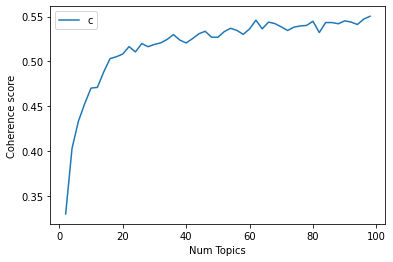

In [63]:
limit=100; start=2; step=2;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()


In [64]:
# limit=36; start=2; step=2;
# x = range(start, limit, step)

round(coherence_values[25],2)

# coherence_limit = int((limit/2)-1)
# plt.plot(x, coherence_values)
# plt.xlabel("Num Topics")
# plt.ylabel("Coherence score")
# plt.legend(("coherence_values"), loc='best')
# plt.savefig("CoherencePlot.jpeg",dpi=1080)
#plt.show()

0.53

In [339]:
# Print the coherence scores
i=0
for m, cv in zip(x, coherence_values):
    print("index =", i)
    print("Num Topics =", m, " has Coherence Value of", round(cv, 2))
    i+=1

index = 0
Num Topics = 2  has Coherence Value of 0.32
index = 1
Num Topics = 3  has Coherence Value of 0.4
index = 2
Num Topics = 4  has Coherence Value of 0.42
index = 3
Num Topics = 5  has Coherence Value of 0.45
index = 4
Num Topics = 6  has Coherence Value of 0.47
index = 5
Num Topics = 7  has Coherence Value of 0.48
index = 6
Num Topics = 8  has Coherence Value of 0.49
index = 7
Num Topics = 9  has Coherence Value of 0.49
index = 8
Num Topics = 10  has Coherence Value of 0.5
index = 9
Num Topics = 11  has Coherence Value of 0.5
index = 10
Num Topics = 12  has Coherence Value of 0.51
index = 11
Num Topics = 13  has Coherence Value of 0.52
index = 12
Num Topics = 14  has Coherence Value of 0.52
index = 13
Num Topics = 15  has Coherence Value of 0.53
index = 14
Num Topics = 16  has Coherence Value of 0.52
index = 15
Num Topics = 17  has Coherence Value of 0.52
index = 16
Num Topics = 18  has Coherence Value of 0.52
index = 17
Num Topics = 19  has Coherence Value of 0.53
index = 18
Nu

In [65]:
model = model_list[13]
model.print_topics(num_words=1)

[(21, '0.061*"meeting"'),
 (5, '0.184*"awful"'),
 (0, '0.017*"country"'),
 (24, '0.085*"labor"'),
 (25, '0.154*"meeting"'),
 (20, '0.063*"make"'),
 (3, '0.110*"meeting"'),
 (1, '0.026*"face"'),
 (22, '0.041*"pay"'),
 (2, '0.025*"party"'),
 (7, '0.129*"worker"'),
 (6, '0.195*"meeting"'),
 (18, '0.135*"worker"'),
 (26, '0.021*"find"'),
 (27, '0.041*"woman"'),
 (9, '0.053*"awful"'),
 (4, '0.073*"day"'),
 (23, '0.223*"people"'),
 (15, '0.153*"time"'),
 (10, '0.106*"year"')]

In [66]:
def ldaMalletConvertToldaGen(mallet_model):
    model_gensim = LdaModel(
        id2word=mallet_model.id2word, 
        num_topics=mallet_model.num_topics, 
        alpha=mallet_model.alpha, 
        eta=0, 
        iterations=1000, 
        gamma_threshold=0.001, 
        dtype=np.float32)
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

converted_model = ldaMalletConvertToldaGen(model)

In [67]:
converted_model.print_topics(num_words=1)

[(11, '0.049*"worker"'),
 (16, '0.048*"worker"'),
 (13, '0.134*"awful"'),
 (18, '0.135*"worker"'),
 (24, '0.085*"labor"'),
 (19, '0.060*"school"'),
 (27, '0.041*"woman"'),
 (1, '0.026*"face"'),
 (5, '0.184*"awful"'),
 (10, '0.106*"year"'),
 (22, '0.041*"pay"'),
 (3, '0.110*"meeting"'),
 (15, '0.153*"time"'),
 (20, '0.063*"make"'),
 (23, '0.223*"people"'),
 (4, '0.073*"day"'),
 (0, '0.017*"country"'),
 (25, '0.154*"meeting"'),
 (7, '0.129*"worker"'),
 (2, '0.025*"party"')]

In [373]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(converted_model, corpus, id2word)
vis

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload


PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
5     -0.115083 -0.103415       1        1  3.699251
17    -0.144095 -0.215843       2        1  3.639740
0      0.264329 -0.040229       3        1  3.622755
2     -0.032496 -0.014335       4        1  3.612986
21    -0.087310 -0.027663       5        1  3.605855
1     -0.150733 -0.187594       6        1  3.602471
22    -0.105628  0.161718       7        1  3.593285
7     -0.073936  0.163705       8        1  3.586505
11    -0.155513 -0.234857       9        1  3.585955
25    -0.025547 -0.028782      10        1  3.584839
13     0.026886 -0.048603      11        1  3.583489
15    -0.127544  0.172195      12        1  3.579349
9      0.256899 -0.032159      13        1  3.568984
18    -0.081919  0.034233      14        1  3.568480
10    -0.154972 -0.214878      15        1  3.568111
19     0.057728 -0.011172      16        1  3.559442
12     0.188358 -0.005820      17        1  3.554540
14     0.088604  0.061728      18        1  3.552717
20    -0.023617  0.074348      19        1  3.551216
8     -0.125846 -0.109373      20        1  3.550854
26     0.204588 -0.019165      21        1  3.546476
23     0.148140 -0.062678      22        1  3.545906
16     0.216473  0.014561      23        1  3.536124
4     -0.153646  0.275653      24        1  3.533601
27     0.040296  0.057063      25        1  3.522992
24    -0.093394  0.062932      26        1  3.522056
3     -0.108161  0.278964      27        1  3.518915
6      0.267137 -0.000537      28        1  3.503107, topic_info=         Term           Freq          Total Category  logprob  loglift
1511    awful  478651.000000  478651.000000  Default  30.0000  30.0000
458    worker  583547.000000  583547.000000  Default  29.0000  29.0000
380   meeting  759070.000000  759070.000000  Default  28.0000  28.0000
401    people  218261.000000  218261.000000  Default  27.0000  27.0000
27       time  175600.000000  175600.000000  Default  26.0000  26.0000
...       ...            ...            ...      ...      ...      ...
158   forward    6948.367095   17069.323524  Topic28  -4.8218   2.4527
2940   chance    5970.458437   12363.331957  Topic28  -4.9735   2.6236
248      find   11155.029176   71588.288050  Topic28  -4.3485   1.4925
1834      run    5684.334123   19584.549247  Topic28  -5.0226   2.1145
493     start    5363.875116   34138.231273  Topic28  -5.0807   1.5008

[2148 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
1285      11  1.000159         aaj
2579       1  0.961509      abacus
1408       8  0.000057  absolutely
1408      24  0.999864  absolutely
1408      28  0.000057  absolutely
...      ...       ...         ...
7803      13  1.000038     youtube
10231      7  0.802385    zakharia
640        3  0.702718        zoom
640       23  0.297285        zoom
1946      23  0.941669   zoomedout

[3693 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 18, 1, 3, 22, 2, 23, 8, 12, 26, 14, 16, 10, 19, 11, 20, 13, 15, 21, 9, 27, 24, 17, 5, 28, 25, 4, 7])

In [68]:
wc = WordCloud(background_color="white", colormap="Dark2", max_font_size=150, random_state=42)

In [69]:
# set the figure size
plt.rcParams['figure.figsize'] = [20, 15]

In [70]:
#x=converted_model.show_topics()

for index, topic in converted_model.show_topics(formatted=False, num_words= 10):
    print('Topic: {} \nWords: {}'.format(index, [w[0] for w in topic]))

Topic: 2 
Words: ['party', 'government', 'worker', 'union', 'state', 'country', 'anti', 'leader', 'govt', 'minister']
Topic: 27 
Words: ['woman', 'shit', 'sex', 'lol', 'fucking', 'guy', 'gon', 'fuck', 'man', 'literally']
Topic: 3 
Words: ['meeting', 'check', 'find', 'join', 'zoom', 'virtual', 'event', 'email', 'link', 'online']
Topic: 24 
Words: ['labor', 'physical', 'working', 'mental', 'body', 'hard', 'energy', 'construction', 'emotional', 'forced']
Topic: 26 
Words: ['find', 'productivity', 'business', 'team', 'learn', 'space', 'challenging', 'experience', 'opportunity', 'tip']
Topic: 15 
Words: ['time', 'meeting', 'full', 'read', 'part', 'post', 'word', 'tweet', 'twitter', 'taking']
Topic: 19 
Words: ['school', 'kid', 'child', 'key', 'working', 'parent', 'student', 'support', 'class', 'high']
Topic: 20 
Words: ['make', 'back', 'big', 'story', 'made', 'end', 'move', 'start', 'making', 'place']
Topic: 10 
Words: ['year', 'meeting', 'week', 'day', 'time', 'long', 'month', 'ago', 'toda

In [71]:
#for i in converted_model.show_topics(formatted=False,num_topics=converted_model.num_topics,num_words=len(converted_model.id2word)):
print(converted_model.num_topics)

28


In [72]:
topics = [[(term, round(wt, 3)) for term, wt in converted_model.show_topic(n, topn=300)] for n in range(0, converted_model.num_topics)]

In [89]:
topics_df = pd.DataFrame([', '.join([term for term, wt in topic]) for topic in topics], 
                         columns = ['Terms per Topic'], 
                         index=['Topic'+t.__str__() for t in range(1, converted_model.num_topics+1)] )
topics_df.head()

,Terms per Topic
Topic1,"country, action, power, world, change, policy,..."
Topic2,"face, head, back, hand, eye, blue, looked, hai..."
Topic3,"party, government, worker, union, state, count..."
Topic4,"meeting, check, find, join, zoom, virtual, eve..."
Topic5,"day, meeting, today, hour, night, morning, roo..."


In [122]:
i = 0
print(topicLabelList)
# for topic in topicLabelList:#i in range(28):
#     print("Topic: ", topic[i])
#     i += 1

{0: 'Positive', 1: 'Positive', 2: 'Neutral', 3: 'Neutral', 4: 'Positive', 5: 'Negative', 6: 'Positive', 7: 'Positive', 8: 'Positive', 9: 'Neutral', 10: 'Neutral', 11: 'Positive', 12: 'Neutral', 13: 'Positive', 14: 'Positive', 15: 'Positive', 16: 'Neutral', 17: 'Positive', 18: 'Negative', 19: 'Positive', 20: 'Positive', 21: 'Positive', 22: 'Positive', 23: 'Negative', 24: 'Negative', 25: 'Positive', 26: 'Positive', 27: 'Negative'}


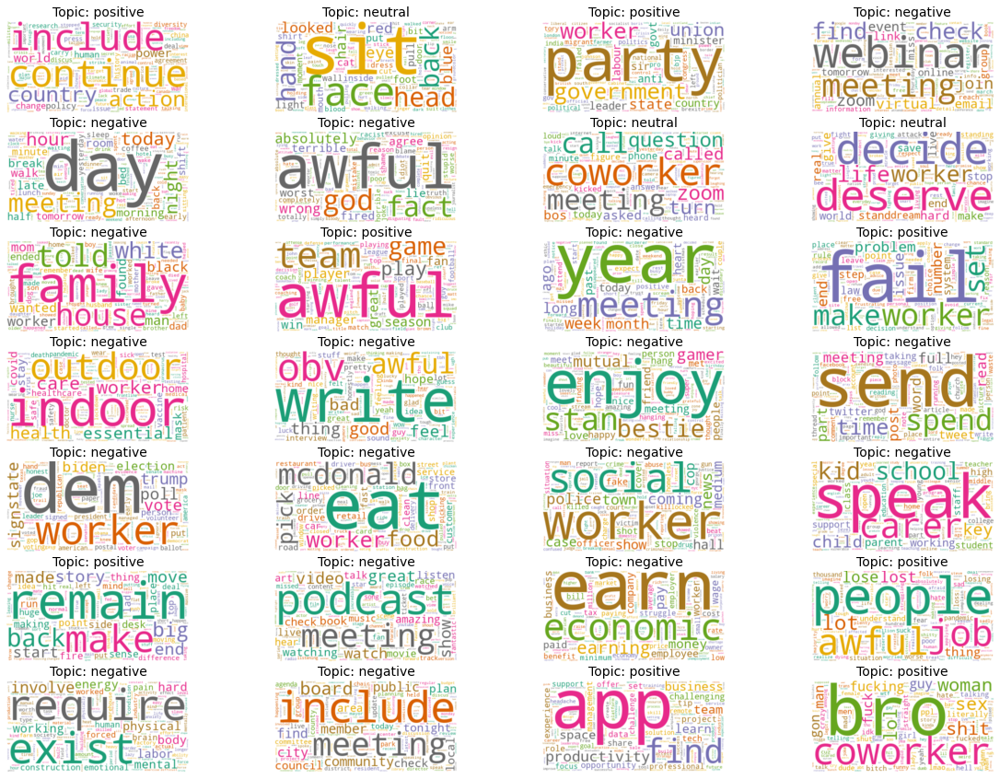

In [126]:
# Create subplots for each topic
topicLabelListNew = ['positive', 'neutral', 'positive', 'negative', 
                     'negative', 'negative', 'neutral', 'neutral', 
                     'negative', 'positive', 'negative', 'positive', 
                    'negative', 'negative','negative', 'negative', 
                    'negative', 'negative', 'negative', 'negative', 
                    'positive', 'negative', 'negative','positive',
                    'negative', 'negative', 'positive', 'positive']
for i in range(28):

    wc.generate(text=topics_df["Terms per Topic"][i])
    topic = topicLabelListNew[i]
    plt.subplot(7, 4, i+1)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Topic: "+topic , fontsize=14)

plt.savefig("topicWords1.png",dpi=1080,bbox_inches='tight')
plt.show()

In [87]:
def format_topics_sentences(ldamodel=converted_model, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [88]:
df_topic_sents_keywords = format_topics_sentences(ldamodel=converted_model, corpus=corpus, texts=data)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']

# Show
df_dominant_topic

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,26.0,0.0701,"find, productivity, business, team, learn, spa...",would give headache much productivity taste
1,1,26.0,0.1190,"find, productivity, business, team, learn, spa...",one recommendation would give new software dev...
2,2,26.0,0.0847,"find, productivity, business, team, learn, spa...",jasper week since pfizer still feeling fatigue...
3,3,4.0,0.0750,"day, meeting, today, hour, night, morning, roo...",least energy booster productivity need wakeful...
4,4,4.0,0.0801,"day, meeting, today, hour, night, morning, roo...",loud window bed shudder procession pass someti...
...,...,...,...,...,...
1471204,1471204,6.0,0.0801,"meeting, call, question, zoom, turn, called, a...",april lols cried track found run mile made sup...
1471205,1471205,10.0,0.0780,"year, meeting, week, day, time, long, month, a...",even though year lot awful shit happened alway...
1471206,1471206,9.0,0.1142,"awful, team, game, play, player, season, great...",totally agree elway done awful drafting talent...
1471207,1471207,9.0,0.0881,"awful, team, game, play, player, season, great...",literally tried give preseason win coaching aw...


In [280]:
df_dominant_topic['Keywords']

0          productivity, business, change, set, system, c...
1          productivity, business, change, set, system, c...
2          productivity, business, change, set, system, c...
3          meeting, day, friend, today, night, morning, h...
4          meeting, day, friend, today, night, morning, h...
                                 ...                        
1471204    back, told, meeting, called, left, found, made...
1471205    year, week, time, day, hour, long, month, ago,...
1471206    awful, game, team, play, player, season, win, ...
1471207    awful, game, team, play, player, season, win, ...
1471208    love, great, show, amazing, watching, watch, h...
Name: Keywords, Length: 1471209, dtype: object

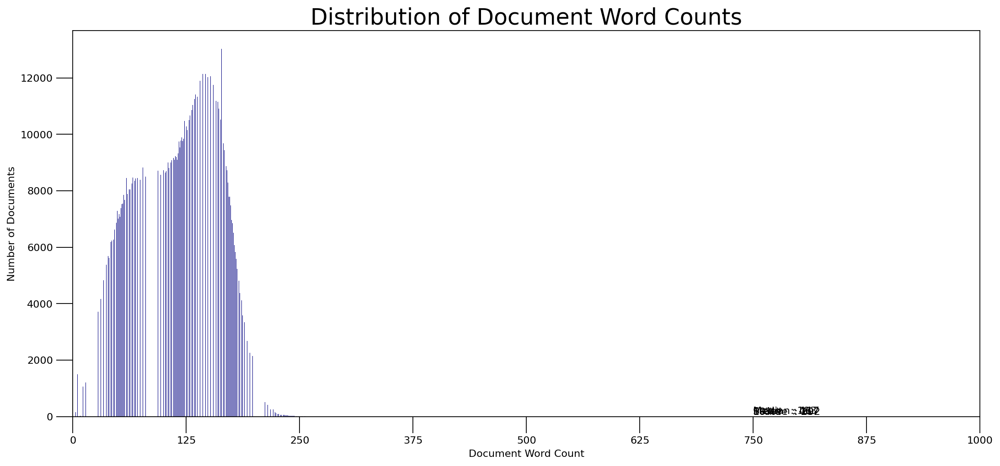

In [287]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(16,7), dpi=160)
plt.hist(doc_lens, bins = 1000, color='navy')
plt.text(750, 100, "Mean   : " + round(np.mean(doc_lens)).__str__())
plt.text(750,  90, "Median : " + round(np.median(doc_lens)).__str__())
plt.text(750,  80, "Stdev   : " + round(np.std(doc_lens)).__str__())
plt.text(750,  70, "1%ile    : " + round(np.quantile(doc_lens, q=0.01)).__str__())
plt.text(750,  60, "99%ile  : " + round(np.quantile(doc_lens, q=0.99)).__str__())

plt.gca().set(xlim=(0, 1000), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,1000,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

In [113]:
negtiveWordFromLexicon = opinion_lexicon.negative()

In [114]:
positiveWordFromLexicon = opinion_lexicon.positive()

In [115]:
if 'meeting' in negtiveWordFromLexicon:
    print('true')

In [100]:
tweet = 'Tweet'
createdAt = 'Created At'
label = 'labeling'
cleanedData = 'cleanedData'
weight = 'weight'
vaderSentCleaned = 'VaderSentCleaned'
vaderSent = 'VaderSent'
posTweet = []
negTweet = []
neutralTweet = []

In [120]:
topicLabelList = {}

for index, wordListByTopic in enumerate(topics_df["Terms per Topic"]):
    words = wordListByTopic.split(', ')
    negPoint = 0
    posPoint = 0
    neuPoint = 0
    
    #print(words[0])
    
    for word in words:
        #print(word)
        if  (word in posWrdList) or (word in positiveWordFromLexicon):
            posPoint += 1
        if  (word in negWrdList) or (word in negtiveWordFromLexicon):
            negPoint += 1
#         else:
#             neuPoint += 1
        if (word not in posWrdList) and (word not in negWrdList):
             neuPoint += 1
            
    print(posPoint, negPoint, neuPoint)
    if (posPoint > negPoint) and (posPoint > neuPoint):
        topicLabelList[index] = 'Positive'
    elif (negPoint > posPoint) and (negPoint > neuPoint):
        topicLabelList[index] = 'Negative'
    else:
        topicLabelList[index] = 'Neutral'

170 140 99
174 152 91
119 113 146
137 93 146
190 166 82
119 216 122
148 142 122
204 137 104
172 147 104
124 97 160
134 125 157
204 186 68
132 126 142
175 161 117
194 124 96
180 146 103
99 97 176
152 120 116
117 156 140
177 140 110
188 167 88
170 87 120
167 144 109
155 205 100
210 213 55
147 87 137
245 156 46
153 178 98


In [121]:
topicLabelList

{0: 'Positive',
 1: 'Positive',
 2: 'Neutral',
 3: 'Neutral',
 4: 'Positive',
 5: 'Negative',
 6: 'Positive',
 7: 'Positive',
 8: 'Positive',
 9: 'Neutral',
 10: 'Neutral',
 11: 'Positive',
 12: 'Neutral',
 13: 'Positive',
 14: 'Positive',
 15: 'Positive',
 16: 'Neutral',
 17: 'Positive',
 18: 'Negative',
 19: 'Positive',
 20: 'Positive',
 21: 'Positive',
 22: 'Positive',
 23: 'Negative',
 24: 'Negative',
 25: 'Positive',
 26: 'Positive',
 27: 'Negative'}

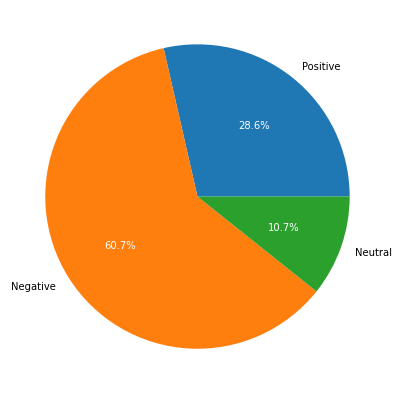

In [5]:
cars = ['Positive', 'Negative', 'Neutral']

# posTop = 0
# negTop = 0
# neuTop = 0
# i = 0

# for i in range(28):
#     if topicLabelList[i] == 'Positive':
#         posTop += 1
#     if topicLabelList[i] == 'Negative':
#         negTop += 1
#     if topicLabelList[i] == 'Neutral':
#         neuTop += 1
#     i += 1
 
data = [8, 17, 3]
 
# Creating plot
fig = plt.figure(figsize =(10, 7))
_, _, autotexts = plt.pie(data, labels = cars, autopct='%1.1f%%')
for autotext in autotexts:
    autotext.set_color('white')
 
# show plot
plt.savefig("topicProportion.jpeg",dpi=1080, bbox_inches='tight')
plt.show()

In [65]:
model_gensim = gensim.models.ldamodel.LdaModel(corpus=corpus,
        id2word=model.id2word, 
        num_topics=model.num_topics,
        alpha=model.alpha, 
        eta=0,
        iterations=50,
        gamma_threshold=0.001,
        dtype=np.float64  # don't loose precision when converting from MALLET
    )

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/gensim/models/ldamodel.py:1133: RuntimeWarning: invalid value encountered in multiply
  score += np.sum((self.eta - _lambda) * Elogbeta)
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/gensim/models/ldamodel.py:1134: RuntimeWarning: invalid value encountered in subtract
  score += np.sum(gammaln(_lambda) - gammaln(self.eta))


In [66]:
model_gensim.state.sstats[...] = model.wordtopics

In [67]:
model_gensim.sync_state()

In [69]:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(model_gensim, corpus, id2word)
vis

/Users/razon/opt/anaconda3/lib/python3.9/site-packages/pyLDAvis/_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  default_term_info = default_term_info.sort_values(
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/razon/opt/anaconda3/lib/python3.9/s

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
61    -0.077144  0.090156       1        1  1.142469
65    -0.044764  0.007438       2        1  1.137755
88    -0.041822 -0.002042       3        1  1.105591
47    -0.093594 -0.166885       4        1  1.083513
41     0.163245  0.016431       5        1  1.075909
...         ...       ...     ...      ...       ...
53     0.019064 -0.021622      92        1  1.004382
89    -0.098406 -0.254090      93        1  1.003197
35    -0.118535 -0.229947      94        1  0.993230
64    -0.016379  0.012970      95        1  0.991677
26    -0.084505  0.144861      96        1  0.982895

[96 rows x 5 columns], topic_info=         Term           Freq          Total Category  logprob  loglift
380   meeting  779922.000000  779922.000000  Default  30.0000  30.0000
1511    awful  484368.000000  484368.000000  Default  29.0000  29.0000
458    worker  596936.000000  596936.000000  Default  28.0000  28.0000
401    people  227156.000000  227156.000000  Default  27.0000  27.0000
27       time  180414.000000  180414.000000  Default  26.0000  26.0000
...       ...            ...            ...      ...      ...      ...
97      today    4243.805927   92936.205310  Topic96  -4.0440   1.5360
2696     hold    1760.714810   14746.965227  Topic96  -4.9237   2.4971
1834      run    1832.580720   20080.370526  Topic96  -4.8837   2.2284
886   totally    1467.055830    8503.584284  Topic96  -5.1062   2.8652
3126    tweet    1473.251167   13755.867546  Topic96  -5.1020   2.3884

[8898 rows x 6 columns], token_table=        Topic      Freq        Term
term                               
16758      80  0.779417        aadu
248315      6  1.002617       aanam
5014       20  0.999500         aap
20379      35  0.822923     aarrhgg
26287       4  0.761141      aarron
...       ...       ...         ...
6923       38  0.998696  zuckerberg
20442      69  0.838457     zuerich
13037      26  0.818461        zuke
37944      73  0.991668        zulu
5178       73  1.000045        zuma

[21638 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[62, 66, 89, 48, 42, 58, 4, 75, 86, 19, 95, 67, 56, 93, 11, 41, 73, 15, 8, 68, 30, 88, 23, 31, 92, 43, 16, 74, 26, 3, 34, 53, 91, 81, 29, 79, 13, 44, 45, 6, 77, 96, 35, 10, 94, 1, 57, 7, 51, 5, 85, 21, 32, 9, 33, 63, 47, 64, 24, 87, 25, 50, 49, 72, 28, 20, 14, 83, 22, 80, 61, 52, 46, 18, 70, 59, 78, 17, 60, 38, 76, 2, 55, 39, 40, 37, 84, 82, 69, 71, 12, 54, 90, 36, 65, 27])

In [30]:
def malletmodel2ldamodel1(mallet_model, gamma_threshold=0.001, iterations=50):
    """Convert :class:`~gensim.models.wrappers.ldamallet.LdaMallet` to :class:`~gensim.models.ldamodel.LdaModel`.

    This works by copying the training model weights (alpha, beta...) from a trained mallet model into the gensim model.

    Parameters
    ----------
    mallet_model : :class:`~gensim.models.wrappers.ldamallet.LdaMallet`
        Trained Mallet model
    gamma_threshold : float, optional
        To be used for inference in the new LdaModel.
    iterations : int, optional
        Number of iterations to be used for inference in the new LdaModel.

    Returns
    -------
    :class:`~gensim.models.ldamodel.LdaModel`
        Gensim native LDA.

    """
    model_gensim = gensim.models.ldamodel.LdaModel(corpus=corpus,
        id2word=mallet_model.id2word, 
        num_topics=mallet_model.num_topics,
        alpha=mallet_model.alpha, 
        eta=0,
        iterations=iterations,
        gamma_threshold=gamma_threshold,
        dtype=np.float64  # don't loose precision when converting from MALLET
    )
    model_gensim.state.sstats[...] = mallet_model.wordtopics
    model_gensim.sync_state()
    return model_gensim

In [61]:
class LdaMallet(utils.SaveLoad, basemodel.BaseTopicModel):
    """Python wrapper for LDA using `MALLET <http://mallet.cs.umass.edu/>`_.

    Communication between MALLET and Python takes place by passing around data files on disk
    and calling Java with subprocess.call().

    Warnings
    --------
    This is **only** python wrapper for `MALLET LDA <http://mallet.cs.umass.edu/>`_,
    you need to install original implementation first and pass the path to binary to ``mallet_path``.

    """
    def __init__(self, mallet_path, corpus=None, num_topics=100, alpha=50, id2word=None, workers=4, prefix=None,
                 optimize_interval=0, iterations=1000, topic_threshold=0.0, random_seed=0):
        """

        Parameters
        ----------
        mallet_path : str
            Path to the mallet binary, e.g. `/home/username/mallet-2.0.7/bin/mallet`.
        corpus : iterable of iterable of (int, int), optional
            Collection of texts in BoW format.
        num_topics : int, optional
            Number of topics.
        alpha : int, optional
            Alpha parameter of LDA.
        id2word : :class:`~gensim.corpora.dictionary.Dictionary`, optional
            Mapping between tokens ids and words from corpus, if not specified - will be inferred from `corpus`.
        workers : int, optional
            Number of threads that will be used for training.
        prefix : str, optional
            Prefix for produced temporary files.
        optimize_interval : int, optional
            Optimize hyperparameters every `optimize_interval` iterations
            (sometimes leads to Java exception 0 to switch off hyperparameter optimization).
        iterations : int, optional
            Number of training iterations.
        topic_threshold : float, optional
            Threshold of the probability above which we consider a topic.
        random_seed: int, optional
            Random seed to ensure consistent results, if 0 - use system clock.

        """
        self.mallet_path = mallet_path
        self.id2word = id2word
        if self.id2word is None:
            logger.warning("no word id mapping provided; initializing from corpus, assuming identity")
            self.id2word = utils.dict_from_corpus(corpus)
            self.num_terms = len(self.id2word)
        else:
            self.num_terms = 0 if not self.id2word else 1 + max(self.id2word.keys())
        if self.num_terms == 0:
            raise ValueError("cannot compute LDA over an empty collection (no terms)")
        self.num_topics = num_topics
        self.topic_threshold = topic_threshold
        self.alpha = alpha
        if prefix is None:
            rand_prefix = hex(random.randint(0, 0xffffff))[2:] + '_'
            prefix = os.path.join(tempfile.gettempdir(), rand_prefix)
        self.prefix = prefix
        self.workers = workers
        self.optimize_interval = optimize_interval
        self.iterations = iterations
        self.random_seed = random_seed
        if corpus is not None:
            self.train(corpus)

    def finferencer(self):
        """Get path to inferencer.mallet file.

        Returns
        -------
        str
            Path to inferencer.mallet file.

        """
        return self.prefix + 'inferencer.mallet'

    def ftopickeys(self):
        """Get path to topic keys text file.

        Returns
        -------
        str
            Path to topic keys text file.

        """
        return self.prefix + 'topickeys.txt'

    def fstate(self):
        """Get path to temporary file.

        Returns
        -------
        str
            Path to file.

        """
        return self.prefix + 'state.mallet.gz'

    def fdoctopics(self):
        """Get path to document topic text file.

        Returns
        -------
        str
            Path to document topic text file.

        """
        return self.prefix + 'doctopics.txt'

    def fcorpustxt(self):
        """Get path to corpus text file.

        Returns
        -------
        str
            Path to corpus text file.

        """
        return self.prefix + 'corpus.txt'

    def fcorpusmallet(self):
        """Get path to corpus.mallet file.

        Returns
        -------
        str
            Path to corpus.mallet file.

        """
        return self.prefix + 'corpus.mallet'

    def fwordweights(self):
        """Get path to word weight file.

        Returns
        -------
        str
            Path to word weight file.

        """
        return self.prefix + 'wordweights.txt'

    def corpus2mallet(self, corpus, file_like):
        """Convert `corpus` to Mallet format and write it to `file_like` descriptor.

        Format ::

            document id[SPACE]label (not used)[SPACE]whitespace delimited utf8-encoded tokens[NEWLINE]

        Parameters
        ----------
        corpus : iterable of iterable of (int, int)
            Collection of texts in BoW format.
        file_like : file-like object
            Opened file.

        """
        for docno, doc in enumerate(corpus):
            if self.id2word:
                tokens = chain.from_iterable([self.id2word[tokenid]] * int(cnt) for tokenid, cnt in doc)
            else:
                tokens = chain.from_iterable([tokenid.__str__()] * int(cnt) for tokenid, cnt in doc)
            file_like.write(utils.to_utf8("%s 0 %s\n" % (docno, ' '.join(tokens))))

    def convert_input(self, corpus, infer=False, serialize_corpus=True):
        """Convert corpus to Mallet format and save it to a temporary text file.

        Parameters
        ----------
        corpus : iterable of iterable of (int, int)
            Collection of texts in BoW format.
        infer : bool, optional
            ...
        serialize_corpus : bool, optional
            ...

        """
        if serialize_corpus:
            logger.info("serializing temporary corpus to %s", self.fcorpustxt())
            with open(self.fcorpustxt(), 'wb') as fout:
                self.corpus2mallet(corpus, fout)

        # convert the text file above into MALLET's internal format
        cmd = \
            self.mallet_path + \
            " import-file --preserve-case --keep-sequence " \
            "--remove-stopwords --token-regex \"\\S+\" --input %s --output %s"
        if infer:
            cmd += ' --use-pipe-from ' + self.fcorpusmallet()
            cmd = cmd % (self.fcorpustxt(), self.fcorpusmallet() + '.infer')
        else:
            cmd = cmd % (self.fcorpustxt(), self.fcorpusmallet())
        logger.info("converting temporary corpus to MALLET format with %s", cmd)
        check_output(args=cmd, shell=True)

    def train(self, corpus):
        """Train Mallet LDA.

        Parameters
        ----------
        corpus : iterable of iterable of (int, int)
            Corpus in BoW format

        """
        self.convert_input(corpus, infer=False)
        cmd = self.mallet_path + ' train-topics --input %s --num-topics %s  --alpha %s --optimize-interval %s '\
            '--num-threads %s --output-state %s --output-doc-topics %s --output-topic-keys %s '\
            '--num-iterations %s --inferencer-filename %s --doc-topics-threshold %s  --random-seed %s'

        cmd = cmd % (
            self.fcorpusmallet(), self.num_topics, self.alpha, self.optimize_interval,
            self.workers, self.fstate(), self.fdoctopics(), self.ftopickeys(), self.iterations,
            self.finferencer(), self.topic_threshold, self.random_seed.__str__()
        )
        # NOTE "--keep-sequence-bigrams" / "--use-ngrams true" poorer results + runs out of memory
        logger.info("training MALLET LDA with %s", cmd)
        check_output(args=cmd, shell=True)
        self.word_topics = self.load_word_topics()
        # NOTE - we are still keeping the wordtopics variable to not break backward compatibility.
        # word_topics has replaced wordtopics throughout the code;
        # wordtopics just stores the values of word_topics when train is called.
        self.wordtopics = self.word_topics

    def __getitem__(self, bow, iterations=100):
        """Get vector for document(s).

        Parameters
        ----------
        bow : {list of (int, int), iterable of list of (int, int)}
            Document (or corpus) in BoW format.
        iterations : int, optional
            Number of iterations that will be used for inferring.

        Returns
        -------
        list of (int, float)
            LDA vector for document as sequence of (topic_id, topic_probability) **OR**
        list of list of (int, float)
            LDA vectors for corpus in same format.

        """
        is_corpus, corpus = utils.is_corpus(bow)
        if not is_corpus:
            # query is a single document => make a corpus out of it
            bow = [bow]

        self.convert_input(bow, infer=True)
        cmd = \
            self.mallet_path + ' infer-topics --input %s --inferencer %s ' \
                               '--output-doc-topics %s --num-iterations %s --doc-topics-threshold %s --random-seed %s'
        cmd = cmd % (
            self.fcorpusmallet() + '.infer', self.finferencer(),
            self.fdoctopics() + '.infer', iterations, self.topic_threshold, self.random_seed.__str__()
        )
        logger.info("inferring topics with MALLET LDA '%s'", cmd)
        check_output(args=cmd, shell=True)
        result = list(self.read_doctopics(self.fdoctopics() + '.infer'))
        return result if is_corpus else result[0]

    def load_word_topics(self):
        """Load words X topics matrix from :meth:`gensim.models.wrappers.ldamallet.LdaMallet.fstate` file.

        Returns
        -------
        numpy.ndarray
            Matrix words X topics.

        """
        logger.info("loading assigned topics from %s", self.fstate())
        word_topics = np.zeros((self.num_topics, self.num_terms), dtype=np.float64)
        if hasattr(self.id2word, 'token2id'):
            word2id = self.id2word.token2id
        else:
            word2id = revdict(self.id2word)

        with open(self.fstate()) as fin:
            _ = next(fin)  # header
            self.alpha = np.fromiter(next(fin).split()[2:], dtype=float)
            assert len(self.alpha) == self.num_topics, "mismatch between MALLET vs. requested topics"
            _ = next(fin)  # noqa:F841 beta
            for lineno, line in enumerate(fin):
                line = utils.to_unicode(line)
                doc, source, pos, typeindex, token, topic = line.split(" ")
                if token not in word2id:
                    continue
                tokenid = word2id[token]
                word_topics[int(topic), tokenid] += 1.0
        return word_topics

    def load_document_topics(self):
        """Load document topics from :meth:`gensim.models.wrappers.ldamallet.LdaMallet.fdoctopics` file.
        Shortcut for :meth:`gensim.models.wrappers.ldamallet.LdaMallet.read_doctopics`.

        Returns
        -------
        iterator of list of (int, float)
            Sequence of LDA vectors for documents.

        """
        return self.read_doctopics(self.fdoctopics())

    def get_topics(self):
        """Get topics X words matrix.

        Returns
        -------
        numpy.ndarray
            Topics X words matrix, shape `num_topics` x `vocabulary_size`.

        """
        topics = self.word_topics
        return topics / topics.sum(axis=1)[:, None]

    def show_topics(self, num_topics=10, num_words=10, log=False, formatted=True):
        """Get the `num_words` most probable words for `num_topics` number of topics.

        Parameters
        ----------
        num_topics : int, optional
            Number of topics to return, set `-1` to get all topics.
        num_words : int, optional
            Number of words.
        log : bool, optional
            If True - write topic with logging too, used for debug proposes.
        formatted : bool, optional
            If `True` - return the topics as a list of strings, otherwise as lists of (weight, word) pairs.

        Returns
        -------
        list of str
            Topics as a list of strings (if formatted=True) **OR**
        list of (float, str)
            Topics as list of (weight, word) pairs (if formatted=False)

        """
        if num_topics < 0 or num_topics >= self.num_topics:
            num_topics = self.num_topics
            chosen_topics = range(num_topics)
        else:
            num_topics = min(num_topics, self.num_topics)
            # add a little random jitter, to randomize results around the same alpha
            sort_alpha = self.alpha + 0.0001 * np.random.rand(len(self.alpha))
            sorted_topics = list(matutils.argsort(sort_alpha))
            chosen_topics = sorted_topics[: num_topics // 2] + sorted_topics[-num_topics // 2:]
        shown = []
        for i in chosen_topics:
            if formatted:
                topic = self.print_topic(i, topn=num_words)
            else:
                topic = self.show_topic(i, topn=num_words)
            shown.append((i, topic))
            if log:
                logger.info("topic #%i (%.3f): %s", i, self.alpha[i], topic)
        return shown

    def show_topic(self, topicid, topn=10, num_words=None):
        """Get `num_words` most probable words for the given `topicid`.

        Parameters
        ----------
        topicid : int
            Id of topic.
        topn : int, optional
            Top number of topics that you'll receive.
        num_words : int, optional
            DEPRECATED PARAMETER, use `topn` instead.

        Returns
        -------
        list of (str, float)
            Sequence of probable words, as a list of `(word, word_probability)` for `topicid` topic.

        """
        if num_words is not None:  # deprecated num_words is used
            warnings.warn("The parameter `num_words` is deprecated, will be removed in 4.0.0, use `topn` instead.")
            topn = num_words

        if self.word_topics is None:
            logger.warning("Run train or load_word_topics before showing topics.")
        topic = self.word_topics[topicid]
        topic = topic / topic.sum()  # normalize to probability dist
        bestn = matutils.argsort(topic, topn, reverse=True)
        beststr = [(self.id2word[idx], topic[idx]) for idx in bestn]
        return beststr

    def get_version(self, direc_path):
        """"Get the version of Mallet.

        Parameters
        ----------
        direc_path : str
            Path to mallet archive.

        Returns
        -------
        str
            Version of mallet.

        """
        try:
            archive = zipfile.ZipFile(direc_path, 'r')
            if u'cc/mallet/regression/' not in archive.namelist():
                return '2.0.7'
            else:
                return '2.0.8RC3'
        except Exception:

            xml_path = direc_path.split("bin")[0]
            try:
                doc = et.parse(xml_path + "pom.xml").getroot()
                namespace = doc.tag[:doc.tag.index('}') + 1]
                return doc.find(namespace + 'version').text.split("-")[0]
            except Exception:
                return "Can't parse pom.xml version file"

    def read_doctopics(self, fname, eps=1e-6, renorm=True):
        """Get document topic vectors from MALLET's "doc-topics" format, as sparse gensim vectors.

        Parameters
        ----------
        fname : str
            Path to input file with document topics.
        eps : float, optional
            Threshold for probabilities.
        renorm : bool, optional
            If True - explicitly re-normalize distribution.

        Raises
        ------
        RuntimeError
            If any line in invalid format.

        Yields
        ------
        list of (int, float)
            LDA vectors for document.

        """
        mallet_version = self.get_version(self.mallet_path)
        with open(fname) as fin:
            for lineno, line in enumerate(fin):
                if lineno == 0 and line.startswith(b"#doc "):
                    continue  # skip the header line if it exists

                parts = line.split()[2:]  # skip "doc" and "source" columns

                # the MALLET doctopic format changed in 2.0.8 to exclude the id,
                # this handles the file differently dependent on the pattern
                if len(parts) == 2 * self.num_topics:
                    doc = [
                        (int(id_), float(weight)) for id_, weight in zip(*[iter(parts)] * 2)
                        if abs(float(weight)) > eps
                    ]
                elif len(parts) == self.num_topics and mallet_version != '2.0.7':
                    doc = [(id_, float(weight)) for id_, weight in enumerate(parts) if abs(float(weight)) > eps]
                else:
                    if mallet_version == "2.0.7":
                        """

                            1   1   0   1.0780612802674239  30.005575655428533364   2   0.005575655428533364
                            2   2   0   0.9184413079632608  40.009062076892971008   3   0.009062076892971008
                            In the above example there is a mix of the above if and elif statement.
                            There are neither `2*num_topics` nor `num_topics` elements.
                            It has 2 formats 40.009062076892971008 and 0   1.0780612802674239
                            which cannot be handled by above if elif.
                            Also, there are some topics are missing(meaning that the topic is not there)
                            which is another reason why the above if elif fails even when the `mallet`
                            produces the right results

                        """
                        count = 0
                        doc = []
                        if len(parts) > 0:
                            while count < len(parts):
                                """
                                if section is to deal with formats of type 2 0.034
                                so if count reaches index of 2 and since int(2) == float(2) so if block is executed
                                now  there is one extra element afer 2, so count + 1 access should not give an error

                                else section handles  formats of type 20.034
                                now count is there on index of 20.034 since float(20.034) != int(20.034) so else block
                                is executed

                                """
                                if float(parts[count]) == int(parts[count]):
                                    if float(parts[count + 1]) > eps:
                                        doc.append((int(parts[count]), float(parts[count + 1])))
                                    count += 2
                                else:
                                    if float(parts[count]) - int(parts[count]) > eps:
                                        doc.append((int(parts[count]) % 10, float(parts[count]) - int(parts[count])))
                                    count += 1
                    else:
                        raise RuntimeError("invalid doc topics format at line %i in %s" % (lineno + 1, fname))

                if renorm:
                    # explicitly normalize weights to sum up to 1.0, just to be sure...
                    total_weight = float(sum(weight for _, weight in doc))
                    if total_weight:
                        doc = [(id_, float(weight) / total_weight) for id_, weight in doc]
                yield doc

    @classmethod
    def load(cls, *args, **kwargs):
        """Load a previously saved LdaMallet class. Handles backwards compatibility from
        older LdaMallet versions which did not use random_seed parameter.
        """
        model = super(LdaMallet, cls).load(*args, **kwargs)
        if not hasattr(model, 'random_seed'):
            model.random_seed = 0

        return model

In [41]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['would', 'give', 'headache', 'much', 'productivity', 'taste']


In [42]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(doc.__str__()) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent.__str__())) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [44]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

In [45]:
# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

In [50]:
# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])

In [52]:
# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])


KeyboardInterrupt: 

In [ ]:
print(data_lemmatized[:10])

In [97]:
tweet = 'Tweet'
createdAt = 'Created At'
label = 'labeling'
cleanedData = 'cleanedData'
weight = 'weight'
vaderSentCleaned = 'VaderSentCleaned'
vaderSent = 'VaderSent'

In [96]:
labeledDataPath = '/Volumes/Works/Development/Python/Shout/WorkSentiment/semiSupervised/LableledCleanedData22Aug20.xlsx'

In [116]:
topicLabelList = {}

for index, wordListByTopic in enumerate(topics_df["Terms per Topic"]):
    words = wordListByTopic.split(',')
    negPoint = 0
    posPoint = 0
    neuPoint = 0
    
    print(wordListByTopic)
    
    for word in words:
        #print(word)
        if  (word in posWrdList) or (word in positiveWordFromLexicon):
            posPoint += 1
        if  (word in negWrdList) or (word in negtiveWordFromLexicon):
            negPoint += 1
#         if (word not in posWrdList) and (word not in negWrdList):
#             neuPoint += 1
            
    print(negPoint, posPoint, neuPoint)
    if (posPoint > negPoint): #and (posPoint > neuPoint):
        topicLabelList[index] = 'Positive'
    if (negPoint > posPoint): #and (negPoint > neuPoint):
        topicLabelList[index] = 'Negative'
#     else:
#         topicLabelList[index] = 'Neutral'

country, action, power, world, change, policy, human, agreement, history, diversity, deal, security, research, china, issue, war, carry, discus, press, trade, statement, stopped, strike, talking, animal, climate, plan, military, target, aid, including, led, canada, racism, international, peace, global, crisis, lack, future, interest, control, freedom, culture, force, important, hold, secret, effort, taliban, economic, chinese, usa, america, foreign, major, act, society, view, movement, term, agreed, based, afghanistan, theory, camp, civil, speaking, official, land, mass, report, impact, release, response, language, relevant, continue, lead, national, europe, carried, reduce, decade, nation, terrorist, speech, canadian, australia, general, green, holding, sec, biggest, matter, commitment, mission, organization, solidarity, attempt, concern, protection, european, justice, created, lay, ireland, french, humanity, gender, ally, speak, base, minority, israel, conspiracy, identity, russia, p

1 1 0
day, meeting, today, hour, night, morning, room, break, late, walk, tomorrow, minute, shift, half, back, bed, sleep, yesterday, coffee, early, lunch, waiting, min, woke, drink, wake, water, air, ready, hotel, start, sitting, tired, afternoon, run, dinner, spent, hot, running, walking, cold, weekend, busy, sit, weather, sunday, sat, conversation, sun, finished, evening, easy, tea, door, rest, waking, clock, eat, saturday, breakfast, catch, heading, planning, bathroom, drinking, fresh, table, garden, ran, beer, staying, missed, sleeping, shower, storm, asleep, rain, til, bottle, decided, wine, nap, fell, taste, snow, eating, rush, knock, mile, cup, knocked, round, supposed, trip, cake, earlier, beach, cancelled, ten, warm, finish, row, quick, canceled, alarm, pas, arrived, slept, stayed, commute, thinking, conference, hallway, midnight, cafe, awake, fool, gym, forgot, overnight, sneak, smell, alcohol, joy, grab, bedroom, smoke, fall, started, knocking, spot, drunk, exhausted, turn,

1 1 0
family, house, told, white, worker, man, black, wanted, found, mom, ended, dad, remember, left, home, made, gave, wife, son, worked, dog, baby, mother, husband, boy, brought, started, brother, daughter, single, leave, knew, grew, happened, turned, sister, father, called, mine, thought, lady, moved, helped, showed, passed, died, needed, helping, older, dead, heard, mum, broke, walked, growing, surprise, recently, lived, flag, tree, young, loved, born, married, leaving, apparently, privilege, talked, proud, christmas, raised, neighbor, younger, cry, harry, cousin, telling, pet, work, looked, named, stood, jack, retired, relative, shocked, wedding, decided, pregnant, age, bought, grow, reminds, ran, john, daddy, uncle, tear, passing, royal, marriage, rip, grown, boyfriend, veteran, guy, vet, center, accident, spoke, vega, met, rescue, offered, prince, apartment, stayed, forever, caught, tiny, wwe, tony, shelter, girlfriend, grandma, learned, holiday, scared, meant, aunt, mama, cared

1 1 0
worker, care, health, essential, home, covid, mask, stay, healthcare, vaccine, safe, pandemic, hospital, sick, risk, safety, test, doctor, death, wear, virus, patient, nurse, medical, lockdown, case, frontline, line, coronavirus, wearing, vaccinated, open, testing, spread, due, tested, appointment, protect, front, contact, quarantine, vaccination, opening, die, staff, facility, ppe, healthy, distancing, lab, symptom, cancer, distance, disease, fully, treatment, household, elderly, nursing, restriction, site, exposed, mandate, roll, condition, considered, staying, priority, shot, protection, infection, infected, spreading, travel, shut, keeping, guideline, population, died, safely, cdc, emergency, eligible, measure, clinic, outdoors, dying, daily, criterion, flu, med, ill, isolation, corona, mental, dose, vax, safer, medicine, supply, jab, protocol, surgery, icu, ontario, risking, outbreak, masked, exposure, refuse, blah, cough, public, opened, capacity, indoors, ramp, pharmacy, r

1 1 0
worker, trump, poll, vote, sign, state, biden, election, person, put, president, american, ballot, signed, hand, postal, leader, early, republican, gop, paper, voting, voter, honest, joe, volunteer, america, campaign, democrat, mask, mail, managed, voted, seat, knew, evidence, machine, candidate, act, capable, obama, ignore, gave, fraud, dems, senate, trail, texas, senator, november, democracy, signing, paid, tsunami, letter, bill, administration, dropbox, trust, claim, postage, penny, count, florida, donate, michigan, bernie, supporter, dem, lie, putin, russian, official, donald, text, polling, donor, registrar, rep, serve, harris, admits, fair, recruitment, usps, write, witness, georgia, elected, shortage, cnn, monitor, governor, pelosi, featured, lawyer, protect, ohio, ensure, location, victory, corrupt, adequate, tampering, national, potus, fbi, nov, record, lied, maga, bring, california, border, capitol, primary, integrity, drop, counting, registered, apathy, bush, secret, a

1 1 0
make, back, big, story, made, end, move, start, making, place, side, thing, desk, point, lad, run, sense, fire, huge, mind, top, put, hit, idea, deal, difference, left, moving, normal, change, real, putting, fed, true, push, thinking, happen, leaving, stuff, common, sort, stuck, small, mate, clear, sell, main, short, throw, accept, market, taking, flat, image, massive, housing, head, ending, spot, guess, fit, close, flight, similar, bigger, basically, changed, eventually, full, agent, reason, slow, expected, gold, building, needed, bringing, jump, pressure, worry, upbeat, oil, sit, trouble, perfect, selling, return, plane, ship, island, airport, worse, wanting, bottom, suspect, ahead, doubt, flying, escape, entire, scenario, boring, longer, direction, fall, earth, estate, blow, fact, lead, pool, spin, suppose, crash, previous, boat, mention, opposite, possibly, agreed, future, proper, alien, perfectly, exit, impossible, happening, trading, began, brought, possibility, bond, blown

1 1 0
labor, physical, working, mental, body, hard, energy, construction, emotional, forced, pain, human, brain, worked, factory, actual, type, farm, amount, society, industry, worth, condition, warehouse, activity, task, easy, mind, built, daily, production, require, longer, ability, life, effort, requires, heat, tired, heavy, mentally, physically, anxiety, building, material, force, level, lazy, skilled, harder, slave, kind, manual, period, hour, field, effect, depression, strength, exercise, therapy, problem, skill, ill, weight, handle, constant, required, lift, perform, horse, build, pressure, demanding, extremely, work, robot, replaced, difficult, form, hurt, produce, therapist, nature, damage, trauma, moving, barely, resource, extreme, suffering, sugar, injury, illness, concept, shape, abuse, selling, exhausting, highly, factor, individual, exist, manufacturing, intense, cheap, exhausted, definition, slavery, involved, capitalism, basic, gym, knowledge, considered, pure, general,

1 1 0


In [253]:
wordListByTopic

'sex, story, read, book, girl, post, meeting, tweet, twitter, person, dream, word, end, idea, account, finding, imagine, true, real, reading, photo, talk, follow, picture, writing, free, bar, made, interesting, article, write, fake, comment, thread, kind, king, soul, pic, hope, bring, part, note, date, mind, folk, wrote, stuff, piece, world, wild, dating, written, page, relationship, random, broken, giving, posted, gay, deep, trans, smile, industry, taking, cover, writer, weird, mention, context, battle, copy, thinking, facebook, posting, profile, personal, follower, image, attention, valuable, author, maker, reply, content, magic, tweeting, cool, conversation, shoot, hard, advice, quote, bunch, btw, pride, instagram, sharing, basically, george, couch'

In [93]:
topics_df["Terms per Topic"][0]

'country, action, power, world, change, policy, human, agreement, history, diversity, deal, security, research, china, issue, war, carry, discus, press, trade, statement, stopped, strike, talking, animal, climate, plan, military, target, aid, including, led, canada, racism, international, peace, global, crisis, lack, future, interest, control, freedom, culture, force, important, hold, secret, effort, taliban, economic, chinese, usa, america, foreign, major, act, society, view, movement, term, agreed, based, afghanistan, theory, camp, civil, speaking, official, land, mass, report, impact, release, response, language, relevant, continue, lead, national, europe, carried, reduce, decade, nation, terrorist, speech, canadian, australia, general, green, holding, sec, biggest, matter, commitment, mission, organization, solidarity, attempt, concern, protection, european, justice, created, lay, ireland, french, humanity, gender, ally, speak, base, minority, israel, conspiracy, identity, russia, 

In [94]:
topics_df["Terms per Topic"][0].split(', ')

['country',
 'action',
 'power',
 'world',
 'change',
 'policy',
 'human',
 'agreement',
 'history',
 'diversity',
 'deal',
 'security',
 'research',
 'china',
 'issue',
 'war',
 'carry',
 'discus',
 'press',
 'trade',
 'statement',
 'stopped',
 'strike',
 'talking',
 'animal',
 'climate',
 'plan',
 'military',
 'target',
 'aid',
 'including',
 'led',
 'canada',
 'racism',
 'international',
 'peace',
 'global',
 'crisis',
 'lack',
 'future',
 'interest',
 'control',
 'freedom',
 'culture',
 'force',
 'important',
 'hold',
 'secret',
 'effort',
 'taliban',
 'economic',
 'chinese',
 'usa',
 'america',
 'foreign',
 'major',
 'act',
 'society',
 'view',
 'movement',
 'term',
 'agreed',
 'based',
 'afghanistan',
 'theory',
 'camp',
 'civil',
 'speaking',
 'official',
 'land',
 'mass',
 'report',
 'impact',
 'release',
 'response',
 'language',
 'relevant',
 'continue',
 'lead',
 'national',
 'europe',
 'carried',
 'reduce',
 'decade',
 'nation',
 'terrorist',
 'speech',
 'canadian',
 'austr